## Импорты

In [ ]:
!pip install git+https://github.com/jaredwinick/img2vec-keras.git

  Cloning https://github.com/jaredwinick/img2vec-keras.git to /tmp/pip-req-build-g3_aur5f
  Running command git clone --filter=blob:none --quiet https://github.com/jaredwinick/img2vec-keras.git /tmp/pip-req-build-g3_aur5f
  Resolved https://github.com/jaredwinick/img2vec-keras.git to commit 80c56b2e1b698e36c26c4015e8b21216fb4cafbb
  Preparing metadata (setup.py) ... done
  Created wheel for img2vec-keras: filename=img2vec_keras-0.2-py3-none-any.whl size=6196 sha256=803eddd6a1c7ad7ac0b9de04551020bd66ca7adf4647b6f068e49f79f0c6c807
  Stored in directory: /tmp/pip-ephem-wheel-cache-23fznofy/wheels/da/92/ca/893e107e4c49bfd1bb057215620bc672357f0f5ca23855bf56
Successfully built img2vec-keras


In [ ]:
from img2vec_keras import Img2Vec # подключаем библиотеку для векторных представлений
from keras.utils import image_dataset_from_directory
import numpy as np
import cv2
import matplotlib.pyplot as plt  # Импортируем Matplotlib для визуализации данных
from matplotlib.gridspec import GridSpec  # Импортируем GridSpec для создания сложных сеток
from pathlib import Path
import pandas as pd
from tqdm import tqdm
from sklearn.svm import OneClassSVM
import os
from PIL import Image
import tensorflow as tf
import matplotlib.image as mpimg
import glob # для работы с файлами
import sys
import pickle
from sklearn.decomposition import PCA # метод клавных компонент
from sklearn.manifold import TSNE # метод TSNE
from sklearn.preprocessing import StandardScaler # масштабирование, убирает среднее, единичный разброс.
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import layers, models
from keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.regularizers import l2

In [ ]:
img2vec = Img2Vec() # инициализируем вектора, загрузится предобученная сеть.

102967424/102967424 [==============================] - 0s 0us/step


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%cd /content/drive/MyDrive
train_dir = 'trainn'
val_dir = 'vall'
test_dir = 'testt'

/content/drive/MyDrive


##Размеры изображений

In [ ]:


def get_image_sizes(directory):
    min_width, min_height = float('inf'), float('inf')
    max_width, max_height = 0, 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(('jpg', 'jpeg', 'png', 'bmp', 'gif')):
                file_path = os.path.join(root, file)
                with Image.open(file_path) as img:
                    width, height = img.size

                    if width*height < min_width*min_height:
                        min_width = width
                        min_height = height
                    if width*height > max_width*max_height:
                        max_width = width
                        max_height = height

    return (min_width, min_height), (max_width, max_height)


train_min_size, train_max_size= get_image_sizes(train_dir)
val_min_size, val_max_size = get_image_sizes(val_dir)
test_min_size, test_max_size = get_image_sizes(test_dir)

def print_dataset_info(name, min_size, max_size):
    print(f"{name} dataset:")
    print(f"  Минимальные размеры: {min_size[0]} x {min_size[1]} пикселей.")
    print(f"  Максимальные размеры: {max_size[0]} x {max_size[1]} пикселей.")


print_dataset_info("Train", train_min_size, train_max_size)
print_dataset_info("Validation", val_min_size, val_max_size)
print_dataset_info("Test", test_min_size, test_max_size)


KeyboardInterrupt: 

##Распределение цветов

In [ ]:
# Путь к папке с изображениями
image_folder = "trainn/Японская ксилография"

# Список для хранения информации о каждом изображении
image_data = []

# Проход по всем файлам в папке
for filename in os.listdir(image_folder):
    # Путь к текущему изображению
    image_path = os.path.join(image_folder, filename)

    # Создание словаря с информацией об изображении
    image_info = {"img_path": image_path, "picture_name": filename}
    # Добавление словаря в список
    image_data.append(image_info)

# Создание DataFrame из списка словарей
a = pd.DataFrame(image_data)

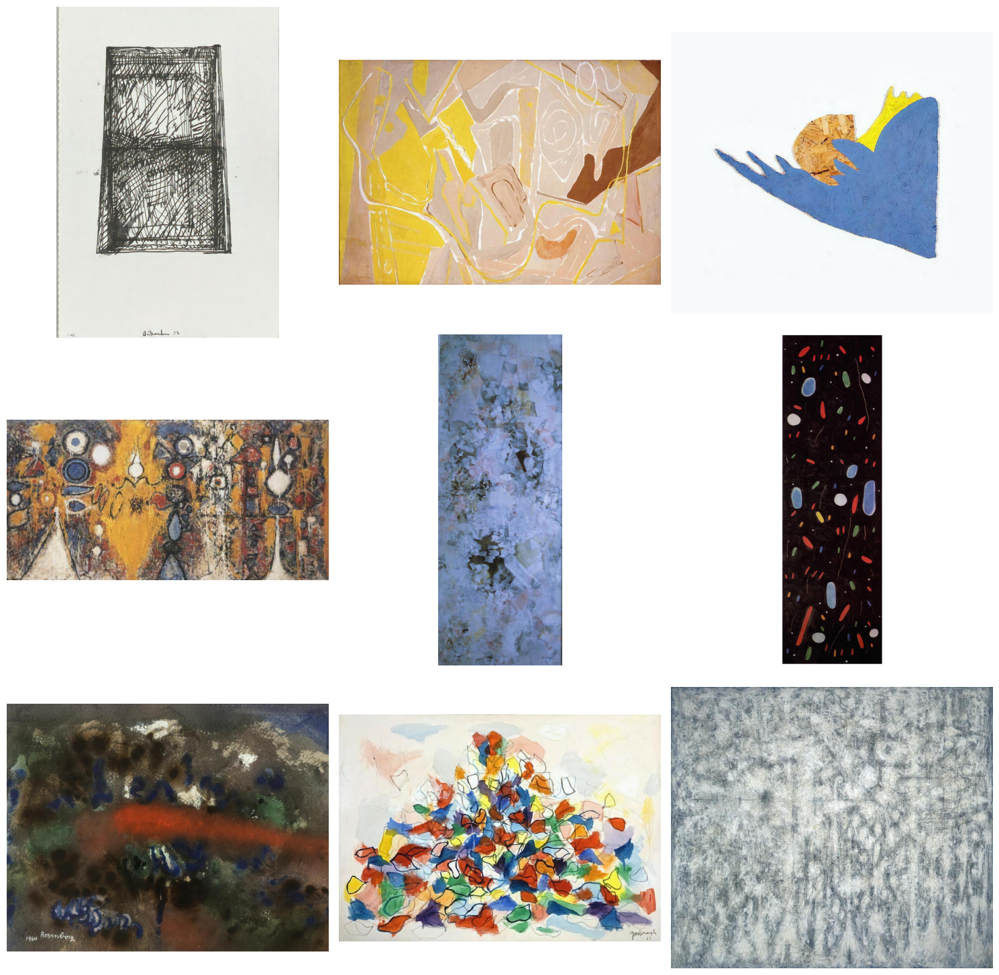

In [ ]:
def display_images(image_data, images_per_row=3,num_images=9):
    #num_images = len(image_data)
    num_rows = (num_images + images_per_row - 1) // images_per_row  # Количество рядов

    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, num_rows * 5))

    for idx in range(num_images):
        img_path = image_data[idx]["img_path"]
        img = mpimg.imread(img_path)
        row = idx // images_per_row
        col = idx % images_per_row
        axes[row, col].imshow(img)
        #axes[row, col].set_title(image_data[idx]["picture_name"])
        axes[row, col].axis('off')

    # Удаление пустых подграфиков
    for idx in range(num_images, num_rows * images_per_row):
        fig.delaxes(axes.flatten()[idx])

    plt.tight_layout()
    plt.show()

# Отображение первых нескольких изображений
display_images(image_data)

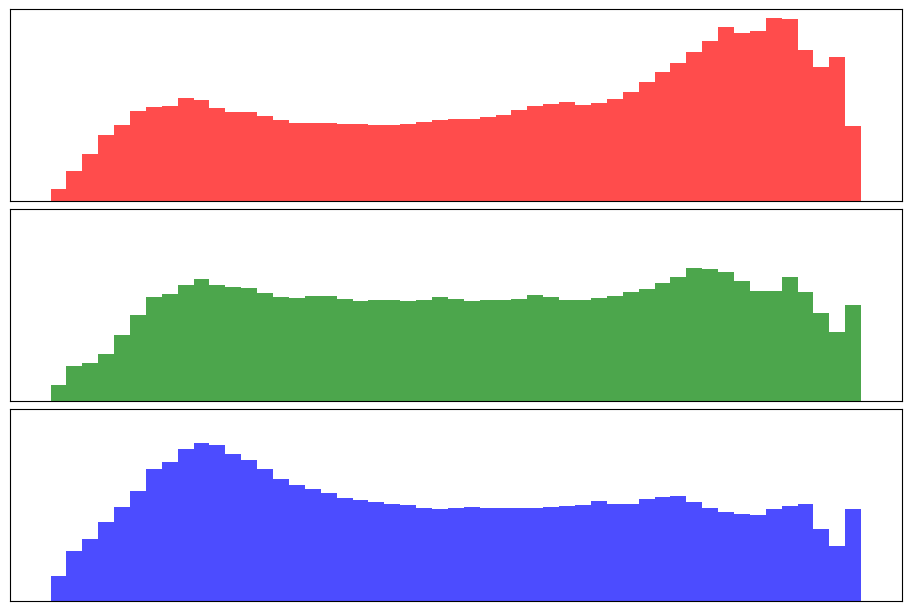

In [ ]:
# прочитать с диска массив пикселей картины
def load_image_by_index(i):
    image_path = a.iloc[i].img_path
    img = cv2.imdecode(np.fromfile(str(Path.cwd()/image_path), np.uint8), cv2.IMREAD_UNCHANGED)
    return img
# посчитать гистограммы по картине
def get_hist_data_by_index(img_index):
    bin_div = 5
    img = load_image_by_index(img_index)
    b, bins=  np.histogram(img[:,:,0], bins=255//bin_div, range=(0,255), density=True)
    g = np.histogram(img[:,:,1], bins=255//bin_div, range=(0,255), density=True)[0]
    r = np.histogram(img[:,:,2], bins=255//bin_div, range=(0,255), density=True)[0]
    return bins, r, g, b
# Собрать усредненные гистограммы для всех изображений
def get_average_hist_data():
    bin_div = 5
    total_r = np.zeros(255//bin_div)
    total_g = np.zeros(255//bin_div)
    total_b = np.zeros(255//bin_div)
    count = len(a)

    for i in range(count):
        _, r, g, b = get_hist_data_by_index(i)
        total_r += r
        total_g += g
        total_b += b

    # Усреднение
    avg_r = total_r / count
    avg_g = total_g / count
    avg_b = total_b / count

    # Гистограммы могут иметь одинаковые границы, так что можно использовать любые из них
    bins = np.linspace(0, 255, 255//bin_div + 1)

    return bins, avg_r, avg_g, avg_b

# Построить усредненные гистограммы для всего датафрейма
def plot_average_histogram(height=6):
    bins, avg_r, avg_g, avg_b = get_average_hist_data()

    fig = plt.figure(constrained_layout=True)
    gs = GridSpec(3, 1, figure=fig)

    ax_r = fig.add_subplot(gs[0, 0])
    ax_g = fig.add_subplot(gs[1, 0], sharey=ax_r)
    ax_b = fig.add_subplot(gs[2, 0], sharey=ax_r)

    ax_r.bar(bins[:-1], avg_r, width=5, color='red', alpha=0.7)
    ax_g.bar(bins[:-1], avg_g, width=5, color='green', alpha=0.7)
    ax_b.bar(bins[:-1], avg_b, width=5, color='blue', alpha=0.7)

    ax_r.axes.get_xaxis().set_ticks([])
    ax_r.axes.get_yaxis().set_ticks([])
    ax_g.axes.get_xaxis().set_ticks([])
    ax_g.axes.get_yaxis().set_ticks([])
    ax_b.axes.get_xaxis().set_ticks([])
    ax_b.axes.get_yaxis().set_ticks([])

    fig.set_figheight(height)
    fig.set_figwidth(height * 1.5)

    plt.show()

# Вызов функции для отображения усредненных гистограмм
plot_average_histogram()

## Статистика


In [ ]:
def get_stats_by_index(img_index):
    img = load_image_by_index(img_index)
    mean_r = np.mean(img[:,:,0])
    mean_g = np.mean(img[:,:,1])
    mean_b = np.mean(img[:,:,2])
    std_r = np.std(img[:,:,0])
    std_g = np.std(img[:,:,1])
    std_b = np.std(img[:,:,2])
    return mean_r, mean_g, mean_b, std_r, std_g, std_b

def get_overall_stats(num_images):
    means_r = []
    means_g = []
    means_b = []
    stds_r = []
    stds_g = []
    stds_b = []

    for i in range(num_images):
        mean_r, mean_g, mean_b, std_r, std_g, std_b = get_stats_by_index(i)
        means_r.append(mean_r)
        means_g.append(mean_g)
        means_b.append(mean_b)
        stds_r.append(std_r)
        stds_g.append(std_g)
        stds_b.append(std_b)

    overall_mean_r = np.mean(means_r)
    overall_mean_g = np.mean(means_g)
    overall_mean_b = np.mean(means_b)
    overall_std_r = np.mean(stds_r)
    overall_std_g = np.mean(stds_g)
    overall_std_b = np.mean(stds_b)

    return overall_mean_r, overall_mean_g, overall_mean_b, overall_std_r, overall_std_g, overall_std_b

def create_table(overall_stats):
    table = f"""
| Цветовой канал | Mean | Std |
|----------------|------|-----|
| Красный (Red)  | {overall_stats[0]:.2f} | {overall_stats[3]:.2f} |
| Зеленый (Green)| {overall_stats[1]:.2f} | {overall_stats[4]:.2f} |
| Синий (Blue)   | {overall_stats[2]:.2f} | {overall_stats[5]:.2f} |
    """
    return table

# Пример использования:
num_images = 500  # Количество изображений
overall_stats = get_overall_stats(num_images)
table = create_table(overall_stats)
print(table)



| Цветовой канал | Mean | Std |
|----------------|------|-----|
| Красный (Red)  | 127.29 | 52.39 |
| Зеленый (Green)| 147.60 | 58.56 |
| Синий (Blue)   | 162.07 | 63.66 |
    


##Выявление аномалий (one class svm)

In [ ]:
def plot_image_with_hist_by_index(img_index, height=6):
    bins, r, g, b = get_hist_data_by_index(img_index)
    img = load_image_by_index(img_index)
    fig = plt.figure(constrained_layout=True)

    if img.shape[0] < img.shape[1]:
        width_ratios = [3,1]
    else:
        width_ratios = [1,1]

    gs = GridSpec(3, 2, figure=fig,
                  width_ratios = [3,1]
                 )
    ax_img = fig.add_subplot(gs[:,0])

    ax_r = fig.add_subplot(gs[0, 1])
    ax_g = fig.add_subplot(gs[1, 1], sharey=ax_r)
    ax_b = fig.add_subplot(gs[2, 1], sharey=ax_r)

    ax_img.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),aspect = 'equal')
    ax_img.axis('off')

    ax_r.bar(bins[:-1], r, width = 5, color='red',alpha=0.7)
    ax_g.bar(bins[:-1], g, width = 5, color='green',alpha=0.7)
    ax_b.bar(bins[:-1], b, width = 5, color='blue',alpha=0.7)

    ax_r.axes.get_xaxis().set_ticks([])
    ax_r.axes.get_yaxis().set_ticks([])
    ax_g.axes.get_xaxis().set_ticks([])
    ax_g.axes.get_yaxis().set_ticks([])
    ax_b.axes.get_xaxis().set_ticks([])
    ax_b.axes.get_yaxis().set_ticks([])
    fig.suptitle((a.iloc[img_index].picture_name),ha= "left")

    fig.set_figheight(height)
    plt.axis('tight')
    if img.shape[0] < img.shape[1]:
        fig.set_figwidth(img.shape[1] *height / img.shape[0] *1.25)
    else:
        fig.set_figwidth(img.shape[1] *height / img.shape[0] *1.5)
    plt.show()

100%|██████████| 700/700 [02:33<00:00,  4.57it/s]


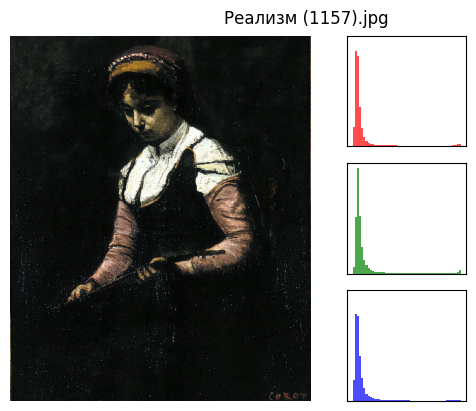

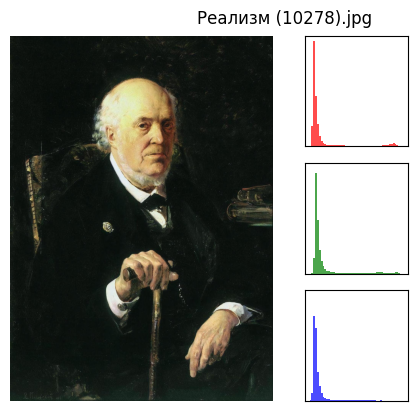

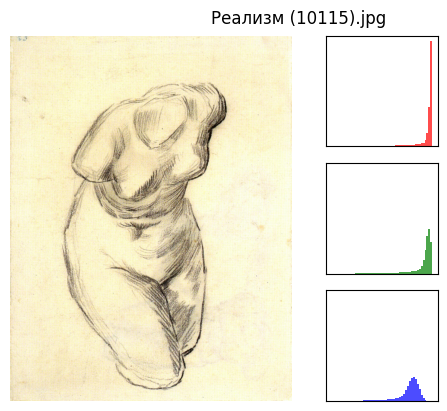

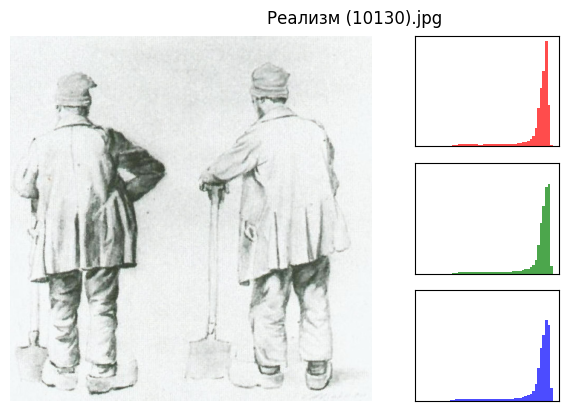

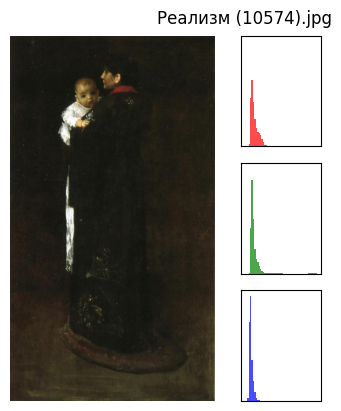

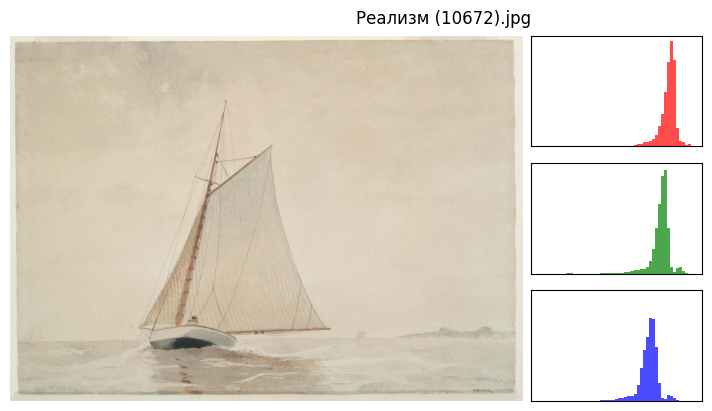

In [ ]:
# пробежимся по всем картинкам в нашей базе, посчитаем гистограммы и соберем из этого датасет
res = []
error = []
bad_images = []
for img_index in tqdm(range(a.shape[0])):
    try:
        bins, r, g, b = get_hist_data_by_index(img_index)
        res.append(np.hstack([r,g,b]))
    except:
        res.append(np.zeros(153,))
        error.append(img_index)

np_res = np.vstack(res)
# сохраним для дальнейшего использования
pd.DataFrame(np_res).to_pickle("histograms.pkl")
histograms = pd.read_pickle("histograms.pkl")
# обучим модельку. на вход она ожидает от нас предполагаемую долю аномалий. пусть будет 10 аномалий на весь датасет
one_class_svm = OneClassSVM(nu=10 / histograms.shape[0], gamma='auto')
one_class_svm.fit(histograms[~histograms.index.isin(bad_images)])
# выделим аномалии
svm_outliers = one_class_svm.predict(histograms)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])
# и отобразим их
uncommon_images = a[(svm_outliers ==1) & (~histograms.index.isin(bad_images))].index.values
for i in uncommon_images:
    plot_image_with_hist_by_index(i,4)

##Похожее при помощи косинусного расстояния

“Степень похожести” мы можем определить, посчитав расстояния между интересующими нас векторами. Знакомое еще со школы евклидово расстояние здесь будет много внимания уделять длине векторных компонент, а нам бы хотелось уделить больше внимания наборам оттенков, составляющим картину. Здесь нам будет полезна косинусная мера расстояния, широко используемая, например, в задачах анализа текстов. Попробуем применить ее для данной задачи. Реализацию возьмем из библиотеки scipy.

In [ ]:
# сделаем инструмент, который поможет найти похожие по цветовой гамме картины
from scipy import spatial
def find_closest(target_id,n=3):
    distance_vector = np.apply_along_axis(spatial.distance.cosine,
                        arr=histograms,
                       axis=1,
                       v=histograms.values[target_id])
    return np.argsort(distance_vector)[:n]

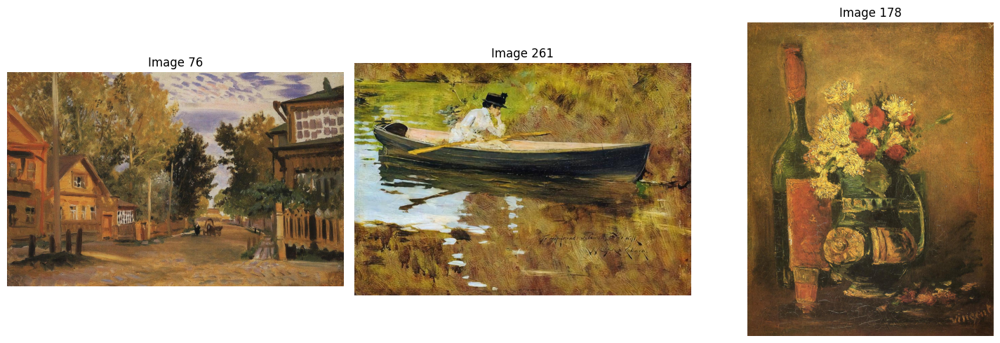

In [ ]:
def load_images_by_indices(indices):
    images = []
    for index in indices:
        img = load_image_by_index(index)
        images.append(img)
    return images

def display_images(images, titles=None, cols=3):
    n_images = len(images)
    n_rows = (n_images + cols - 1) // cols  # Определяем количество строк
    fig, axes = plt.subplots(n_rows, cols, figsize=(15, 5 * n_rows))

    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)  # Обработка случая с одной строкой

    for ax in axes.flatten():
        ax.axis('off')  # Отключаем оси

    for i, (ax, img) in enumerate(zip(axes.flatten(), images)):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        if titles is not None:
            ax.set_title(titles[i])

    plt.tight_layout()
    plt.show()

indices = find_closest(76)
images = load_images_by_indices(indices)
display_images(images, titles=[f"Image {index}" for index in indices])

In [ ]:
def get_stats_by_index(img_index):
    img = load_image_by_index(img_index)
    mean_r = np.mean(img[:,:,0])
    mean_g = np.mean(img[:,:,1])
    mean_b = np.mean(img[:,:,2])
    std_r = np.std(img[:,:,0])
    std_g = np.std(img[:,:,1])
    std_b = np.std(img[:,:,2])
    return mean_r, mean_g, mean_b, std_r, std_g, std_b


In [ ]:
def plot_image_with_stats_by_index(img_index, height=6):
    mean_r, mean_g, mean_b, std_r, std_g, std_b = get_stats_by_index(img_index)
    img = load_image_by_index(img_index)
    fig = plt.figure(constrained_layout=True)

    if img.shape[0] < img.shape[1]:
        width_ratios = [3,1]
    else:
        width_ratios = [1,1]

    gs = GridSpec(3, 2, figure=fig,
                  width_ratios = [3,1]
                 )
    ax_img = fig.add_subplot(gs[:,0])

    ax_r = fig.add_subplot(gs[0, 1])
    ax_g = fig.add_subplot(gs[1, 1], sharey=ax_r)
    ax_b = fig.add_subplot(gs[2, 1], sharey=ax_r)

    ax_img.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),aspect = 'equal')
    ax_img.axis('off')

    ax_r.text(0.5, 0.5, f"Mean: {mean_r:.2f}\nStd: {std_r:.2f}", horizontalalignment='center', verticalalignment='center', transform=ax_r.transAxes)
    ax_g.text(0.5, 0.5, f"Mean: {mean_g:.2f}\nStd: {std_g:.2f}", horizontalalignment='center', verticalalignment='center', transform=ax_g.transAxes)
    ax_b.text(0.5, 0.5, f"Mean: {mean_b:.2f}\nStd: {std_b:.2f}", horizontalalignment='center', verticalalignment='center', transform=ax_b.transAxes)

    ax_r.axes.get_xaxis().set_ticks([])
    ax_r.axes.get_yaxis().set_ticks([])
    ax_g.axes.get_xaxis().set_ticks([])
    ax_g.axes.get_yaxis().set_ticks([])
    ax_b.axes.get_xaxis().set_ticks([])
    ax_b.axes.get_yaxis().set_ticks([])
    fig.suptitle((a.iloc[img_index].picture_name),ha= "left")

    fig.set_figheight(height)
    plt.axis('tight')
    if img.shape[0] < img.shape[1]:
        fig.set_figwidth(img.shape[1] *height / img.shape[0] *1.25)
    else:
        fig.set_figwidth(img.shape[1] *height / img.shape[0] *1.5)
    plt.show()


##Загрузка

In [ ]:
img_width, img_height = 256, 256
batch_size = 32

In [ ]:
train_dataset = image_dataset_from_directory(
    train_dir,
    image_size=(img_width, img_height),
    batch_size=batch_size,
    label_mode='categorical')
validation_dataset = image_dataset_from_directory(
    val_dir,
    image_size=(img_width, img_height),
    batch_size=batch_size,
    label_mode='categorical')
test_dataset = image_dataset_from_directory(
    test_dir,
    image_size=(img_width, img_height),
    batch_size=batch_size,
    label_mode='categorical')

Found 7000 files belonging to 10 classes.
Found 1500 files belonging to 10 classes.
Found 1500 files belonging to 10 classes.


## Пример предобработки

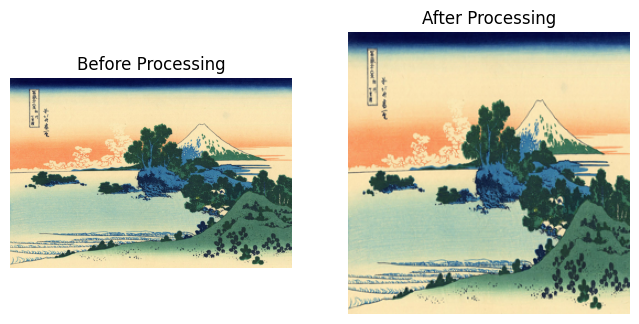

In [ ]:
import tensorflow as tf
import os
import pandas as pd
import matplotlib.pyplot as plt


# Выберем первое изображение из DataFrame a
img_path = a.iloc[50]['img_path']

# Загрузим изображение с помощью TensorFlow
img = tf.keras.preprocessing.image.load_img(img_path)

# Применим аналогичные преобразования, как в image_dataset_from_directory
img = img.resize((img_width, img_height))
img = tf.keras.preprocessing.image.img_to_array(img) / 255.0

# Выведем изображение до и после преобразований
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.title('Before Processing')
plt.imshow(tf.keras.preprocessing.image.load_img(img_path))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('After Processing')
plt.imshow(img)
plt.axis('off')

plt.show()


##Аугментация

In [ ]:
data_augmentation1 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.3),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.5),
])

data_augmentation2 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.1),
])

data_augmentation3 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
])

data_augmentation4 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.RandomBrightness(0.3),
])

data_augmentation5 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.5),
    tf.keras.layers.RandomBrightness(0.3),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.5),
])

data_augmentation6 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.5),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.RandomBrightness(0.5),
])

data_augmentation7 = tf.keras.Sequential([
    tf.keras.layers.GaussianNoise(0.3),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.3),
    tf.keras.layers.RandomBrightness(0.3),
])

data_augmentation8 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.1),
])

data_augmentation9 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.RandomBrightness(0.1),
])

data_augmentation10 = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("vertical"),
    tf.keras.layers.RandomBrightness(0.2),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
])

def map_augmentation(x, y):
    augmented_x = tf.cond(tf.reduce_all(tf.equal(y, [1,0,0,0,0,0,0,0,0,0])),
                          lambda: data_augmentation1(x, training=True),
                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,1,0,0,0,0,0,0,0,0])),
                                          lambda: data_augmentation2(x, training=True),
                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,1,0,0,0,0,0,0,0])),
                                                          lambda: data_augmentation3(x, training=True),
                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,1,0,0,0,0,0,0])),
                                                                          lambda: data_augmentation4(x, training=True),
                                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,0,1,0,0,0,0,0])),
                                                                                          lambda: data_augmentation5(x, training=True),
                                                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,0,0,1,0,0,0,0])),
                                                                                                          lambda: data_augmentation6(x, training=True),
                                                                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,0,0,0,1,0,0,0])),
                                                                                                                          lambda: data_augmentation7(x, training=True),
                                                                                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,0,0,0,0,1,0,0])),
                                                                                                                                          lambda: data_augmentation8(x, training=True),
                                                                                                                                          lambda: tf.cond(tf.reduce_all(tf.equal(y, [0,0,0,0,0,0,0,0,1,0])),
                                                                                                                                                          lambda: data_augmentation9(x, training=True),
                                                                                                                                                          lambda: data_augmentation10(x, training=True))))))))))
    return augmented_x, y


# Примените функцию map_augmentation к вашему набору данных
train_dataset = train_dataset.map(map_augmentation)


##Пример аугментации

tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 1. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([1. 0. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 1. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([1. 0. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 1. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 1. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(10,), dtype=float32)


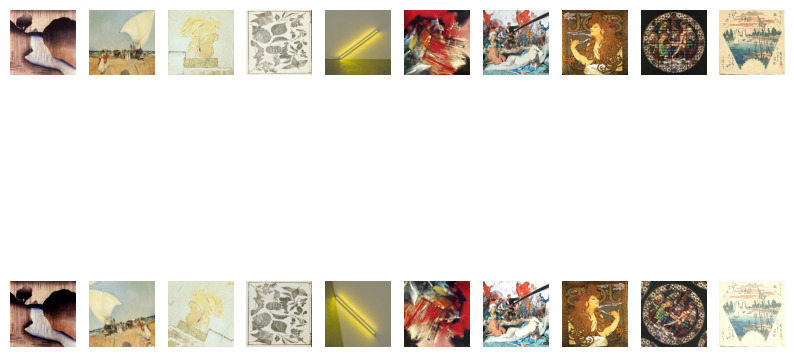

In [ ]:
import matplotlib.pyplot as plt

def show_augmented_images(dataset, augmentations, num_images=10):
    plt.figure(figsize=(10, 10))
    augmented_images = []
    for images, labels in dataset.take(1):
        for j in range(num_images):
            # Отображение исходного изображения
            ax = plt.subplot(3, num_images, j + 1)
            plt.imshow(images[j].numpy().astype("uint8"))
            plt.axis("off")

            # Аугментация и отображение аугментированного изображения
            augmented_image, y = augmentations(images[j], labels[j])
            augmented_images.append(augmented_image)
            print(y)
            ax = plt.subplot(3, num_images, num_images + j + 1)
            plt.imshow(augmented_image.numpy().astype("uint8"))
            plt.axis("off")

    plt.show()

show_augmented_images(train_dataset, map_augmentation)


## Векторное представлние изображений

При помощи бибилиотеки img2vec создаются векторы по изображениям, их размерность уменьшается. А на основе них уже классификация как в cnn. Ранее - сверточная сеть с выходной функцией активации softmax.

Заметки:

*   Выбор другого алгоритма классификации



In [ ]:
image_paths_train = []
labels_train = []
image_paths_test = []
labels_test = []
image_paths_val = []
labels_val = []
image_classes = ['Абстрактный экспрессионизм', 'Арт Нуво', 'Барокко', 'Импрессионизм', 'Кубизм','Минимализм','Поп Арт','Реализм','Ренессанс','Японская ксилография'] # выберем классы для отображения, проверьте с другими

# Функция для сбора путей и меток
def collect_image_paths_and_labels(image_paths, labels, data_type):
    for image_class in image_classes:
        class_image_paths = glob.glob(os.path.join(data_type, image_class, '*'))
        image_paths.extend(class_image_paths)
        labels.extend([image_class] * len(class_image_paths))

# Сбор данных для обучающей выборки
collect_image_paths_and_labels(image_paths_train, labels_train, 'trainn')
# Сбор данных для тестовой выборки
collect_image_paths_and_labels(image_paths_test, labels_test, 'testt')
# Сбор данных для валидационной выборки
collect_image_paths_and_labels(image_paths_val, labels_val, 'vall')

In [ ]:
len(labels_val)

1500

In [ ]:
image_vectors_train = {}
for image_path in tqdm(image_paths_train, desc="Processing train images"):
    vector = img2vec.get_vec(image_path)
    image_vectors_train[image_path] = vector

image_vectors_test = {}
for image_path in tqdm(image_paths_test, desc="Processing test images"):
    vector = img2vec.get_vec(image_path)
    image_vectors_test[image_path] = vector

image_vectors_val = {}
for image_path in tqdm(image_paths_val, desc="Processing validation images"):
    vector = img2vec.get_vec(image_path)
    image_vectors_val[image_path] = vector


Processing train images:   0%|          | 0/7000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   0%|          | 1/7000 [00:00<18:30,  6.30it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   0%|          | 2/7000 [00:00<17:41,  6.59it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   0%|          | 3/7000 [00:00<17:16,  6.75it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   0%|          | 4/7000 [00:00<19:17,  6.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   0%|          | 5/7000 [00:00<21:01,  5.55it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   0%|          | 6/7000 [00:01<21:24,  5.45it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   0%|          | 7/7000 [00:01<19:46,  5.89it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   0%|          | 8/7000 [00:01<19:26,  5.99it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   0%|          | 9/7000 [00:01<18:30,  6.29it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   0%|          | 10/7000 [00:01<18:33,  6.28it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   0%|          | 11/7000 [00:01<18:41,  6.23it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   0%|          | 12/7000 [00:01<17:59,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   0%|          | 13/7000 [00:02<18:14,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   0%|          | 14/7000 [00:02<18:00,  6.46it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:   0%|          | 15/7000 [00:02<17:33,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   0%|          | 16/7000 [00:02<16:43,  6.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   0%|          | 17/7000 [00:02<15:21,  7.58it/s]

1/1 [==============================] - 0s 120ms/step


Processing train images:   0%|          | 18/7000 [00:02<20:27,  5.69it/s]

1/1 [==============================] - 0s 63ms/step


Processing train images:   0%|          | 19/7000 [00:03<23:19,  4.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   0%|          | 20/7000 [00:03<23:03,  5.04it/s]

1/1 [==============================] - 0s 81ms/step


Processing train images:   0%|          | 21/7000 [00:03<25:10,  4.62it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:   0%|          | 22/7000 [00:03<24:09,  4.81it/s]

1/1 [==============================] - 0s 77ms/step


Processing train images:   0%|          | 23/7000 [00:04<25:57,  4.48it/s]

1/1 [==============================] - 0s 87ms/step


Processing train images:   0%|          | 24/7000 [00:04<26:40,  4.36it/s]

1/1 [==============================] - 0s 60ms/step


Processing train images:   0%|          | 25/7000 [00:04<26:07,  4.45it/s]

1/1 [==============================] - 0s 71ms/step


Processing train images:   0%|          | 26/7000 [00:04<28:01,  4.15it/s]

1/1 [==============================] - 0s 82ms/step


Processing train images:   0%|          | 27/7000 [00:05<28:51,  4.03it/s]

1/1 [==============================] - 0s 71ms/step


Processing train images:   0%|          | 28/7000 [00:05<29:04,  4.00it/s]

1/1 [==============================] - 0s 100ms/step


Processing train images:   0%|          | 29/7000 [00:05<31:06,  3.73it/s]

1/1 [==============================] - 0s 99ms/step


Processing train images:   0%|          | 30/7000 [00:05<31:39,  3.67it/s]

1/1 [==============================] - 0s 70ms/step


Processing train images:   0%|          | 31/7000 [00:06<33:27,  3.47it/s]

1/1 [==============================] - 0s 84ms/step


Processing train images:   0%|          | 32/7000 [00:06<33:06,  3.51it/s]

1/1 [==============================] - 0s 77ms/step


Processing train images:   0%|          | 33/7000 [00:06<31:42,  3.66it/s]

1/1 [==============================] - 0s 95ms/step


Processing train images:   0%|          | 34/7000 [00:07<31:58,  3.63it/s]

1/1 [==============================] - 0s 73ms/step


Processing train images:   0%|          | 35/7000 [00:07<33:08,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|          | 36/7000 [00:07<31:26,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 37/7000 [00:07<26:48,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 38/7000 [00:07<23:45,  4.89it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|          | 39/7000 [00:08<21:24,  5.42it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 40/7000 [00:08<21:15,  5.46it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|          | 41/7000 [00:08<20:21,  5.70it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   1%|          | 42/7000 [00:08<19:23,  5.98it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   1%|          | 43/7000 [00:08<18:38,  6.22it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|          | 44/7000 [00:08<18:01,  6.43it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 45/7000 [00:08<17:53,  6.48it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 46/7000 [00:09<18:04,  6.41it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|          | 47/7000 [00:09<17:27,  6.64it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   1%|          | 48/7000 [00:09<17:07,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 49/7000 [00:09<18:01,  6.43it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 50/7000 [00:09<18:04,  6.41it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|          | 51/7000 [00:09<17:32,  6.61it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 52/7000 [00:09<17:18,  6.69it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   1%|          | 53/7000 [00:10<17:35,  6.58it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:   1%|          | 54/7000 [00:10<18:14,  6.35it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|          | 55/7000 [00:10<17:48,  6.50it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 56/7000 [00:10<17:39,  6.56it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 57/7000 [00:10<17:26,  6.64it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:   1%|          | 58/7000 [00:10<18:05,  6.40it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 59/7000 [00:11<17:45,  6.51it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 60/7000 [00:11<18:20,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 61/7000 [00:11<18:14,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   1%|          | 62/7000 [00:11<17:45,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   1%|          | 63/7000 [00:11<17:38,  6.55it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   1%|          | 64/7000 [00:11<17:33,  6.58it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 65/7000 [00:11<17:07,  6.75it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   1%|          | 66/7000 [00:12<17:06,  6.76it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 67/7000 [00:12<18:12,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 68/7000 [00:12<17:55,  6.45it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 69/7000 [00:12<17:19,  6.67it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|          | 70/7000 [00:12<17:08,  6.74it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|          | 71/7000 [00:12<17:18,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 72/7000 [00:13<17:41,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 73/7000 [00:13<17:24,  6.63it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   1%|          | 74/7000 [00:13<17:37,  6.55it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 75/7000 [00:13<18:00,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 76/7000 [00:13<17:56,  6.43it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|          | 77/7000 [00:13<17:28,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|          | 78/7000 [00:13<17:22,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|          | 79/7000 [00:14<16:48,  6.86it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|          | 80/7000 [00:14<16:36,  6.94it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|          | 81/7000 [00:14<17:49,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   1%|          | 82/7000 [00:14<17:38,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|          | 83/7000 [00:14<17:24,  6.62it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:   1%|          | 84/7000 [00:14<17:26,  6.61it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|          | 85/7000 [00:15<17:33,  6.56it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   1%|          | 86/7000 [00:15<17:56,  6.42it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   1%|          | 87/7000 [00:15<18:09,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|▏         | 88/7000 [00:15<17:39,  6.52it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   1%|▏         | 89/7000 [00:15<17:41,  6.51it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|▏         | 90/7000 [00:15<17:13,  6.68it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   1%|▏         | 91/7000 [00:15<17:05,  6.74it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|▏         | 92/7000 [00:16<16:41,  6.90it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   1%|▏         | 93/7000 [00:16<17:02,  6.76it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:   1%|▏         | 94/7000 [00:16<17:41,  6.50it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   1%|▏         | 95/7000 [00:16<18:08,  6.34it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   1%|▏         | 96/7000 [00:16<18:20,  6.27it/s]

1/1 [==============================] - 0s 71ms/step


Processing train images:   1%|▏         | 97/7000 [00:16<18:54,  6.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   1%|▏         | 98/7000 [00:17<18:36,  6.18it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:   1%|▏         | 99/7000 [00:17<18:13,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:   1%|▏         | 100/7000 [00:17<18:01,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   1%|▏         | 101/7000 [00:17<17:58,  6.40it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:   1%|▏         | 102/7000 [00:17<20:47,  5.53it/s]

1/1 [==============================] - 0s 66ms/step


Processing train images:   1%|▏         | 103/7000 [00:18<23:17,  4.94it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:   1%|▏         | 104/7000 [00:18<26:24,  4.35it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:   2%|▏         | 105/7000 [00:18<26:46,  4.29it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:   2%|▏         | 106/7000 [00:18<28:42,  4.00it/s]

1/1 [==============================] - 0s 71ms/step


Processing train images:   2%|▏         | 107/7000 [00:19<29:13,  3.93it/s]

1/1 [==============================] - 0s 66ms/step


Processing train images:   2%|▏         | 108/7000 [00:19<28:00,  4.10it/s]

1/1 [==============================] - 0s 73ms/step


Processing train images:   2%|▏         | 109/7000 [00:19<28:48,  3.99it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:   2%|▏         | 110/7000 [00:19<28:29,  4.03it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:   2%|▏         | 111/7000 [00:20<29:19,  3.91it/s]

1/1 [==============================] - 0s 63ms/step


Processing train images:   2%|▏         | 112/7000 [00:20<28:58,  3.96it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:   2%|▏         | 113/7000 [00:20<29:39,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   2%|▏         | 114/7000 [00:20<28:24,  4.04it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:   2%|▏         | 115/7000 [00:21<28:06,  4.08it/s]

1/1 [==============================] - 0s 76ms/step


Processing train images:   2%|▏         | 116/7000 [00:21<30:18,  3.79it/s]

1/1 [==============================] - 0s 97ms/step


Processing train images:   2%|▏         | 117/7000 [00:21<30:57,  3.71it/s]

1/1 [==============================] - 0s 80ms/step


Processing train images:   2%|▏         | 118/7000 [00:21<30:17,  3.79it/s]

1/1 [==============================] - 0s 91ms/step


Processing train images:   2%|▏         | 119/7000 [00:22<30:21,  3.78it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:   2%|▏         | 120/7000 [00:22<29:47,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   2%|▏         | 121/7000 [00:22<28:32,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   2%|▏         | 122/7000 [00:22<25:11,  4.55it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:   2%|▏         | 123/7000 [00:22<23:36,  4.86it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   2%|▏         | 124/7000 [00:23<21:57,  5.22it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   2%|▏         | 125/7000 [00:23<20:11,  5.67it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   2%|▏         | 126/7000 [00:23<19:06,  5.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   2%|▏         | 127/7000 [00:23<18:07,  6.32it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:   2%|▏         | 128/7000 [00:23<18:03,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   2%|▏         | 129/7000 [00:23<17:47,  6.43it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   2%|▏         | 130/7000 [00:24<18:13,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   2%|▏         | 131/7000 [00:24<18:29,  6.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   2%|▏         | 132/7000 [00:24<17:49,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   2%|▏         | 133/7000 [00:24<17:33,  6.52it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   2%|▏         | 134/7000 [00:24<17:43,  6.46it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   2%|▏         | 135/7000 [00:24<17:54,  6.39it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   2%|▏         | 136/7000 [00:24<17:54,  6.39it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:   2%|▏         | 137/7000 [00:25<17:54,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   2%|▏         | 138/7000 [00:25<17:20,  6.60it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   2%|▏         | 139/7000 [00:25<17:58,  6.36it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:   2%|▏         | 140/7000 [00:25<18:26,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:   2%|▏         | 141/7000 [00:25<17:49,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   2%|▏         | 142/7000 [00:25<16:52,  6.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 143/7000 [00:25<15:26,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   2%|▏         | 144/7000 [00:26<14:24,  7.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 146/7000 [00:26<12:49,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 147/7000 [00:26<12:33,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   2%|▏         | 149/7000 [00:26<12:05,  9.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 150/7000 [00:26<12:03,  9.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 152/7000 [00:26<11:49,  9.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 153/7000 [00:26<11:45,  9.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 154/7000 [00:27<11:48,  9.66it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   2%|▏         | 155/7000 [00:27<11:56,  9.56it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   2%|▏         | 156/7000 [00:27<11:57,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   2%|▏         | 158/7000 [00:27<11:44,  9.71it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   2%|▏         | 159/7000 [00:27<12:16,  9.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   2%|▏         | 161/7000 [00:27<11:51,  9.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 163/7000 [00:28<11:35,  9.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 164/7000 [00:28<11:33,  9.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 165/7000 [00:28<11:32,  9.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 167/7000 [00:28<11:08, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   2%|▏         | 169/7000 [00:28<11:25,  9.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   2%|▏         | 171/7000 [00:28<11:12, 10.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   2%|▏         | 173/7000 [00:29<11:44,  9.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   2%|▏         | 174/7000 [00:29<11:40,  9.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   3%|▎         | 176/7000 [00:29<11:28,  9.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 177/7000 [00:29<11:33,  9.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 179/7000 [00:29<11:13, 10.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   3%|▎         | 181/7000 [00:29<10:58, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   3%|▎         | 183/7000 [00:30<11:00, 10.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 185/7000 [00:30<11:02, 10.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 187/7000 [00:30<11:13, 10.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   3%|▎         | 189/7000 [00:30<11:07, 10.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 191/7000 [00:30<11:00, 10.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 193/7000 [00:30<10:57, 10.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 195/7000 [00:31<11:07, 10.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   3%|▎         | 197/7000 [00:31<11:01, 10.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 199/7000 [00:31<10:57, 10.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 201/7000 [00:31<10:44, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   3%|▎         | 203/7000 [00:31<10:55, 10.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   3%|▎         | 205/7000 [00:32<11:15, 10.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 207/7000 [00:32<11:05, 10.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   3%|▎         | 209/7000 [00:32<11:13, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 211/7000 [00:32<12:38,  8.95it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   3%|▎         | 212/7000 [00:32<13:01,  8.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   3%|▎         | 213/7000 [00:33<13:56,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   3%|▎         | 214/7000 [00:33<14:07,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 215/7000 [00:33<14:11,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 216/7000 [00:33<14:13,  7.95it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   3%|▎         | 217/7000 [00:33<14:07,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   3%|▎         | 218/7000 [00:33<14:15,  7.93it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   3%|▎         | 219/7000 [00:33<14:31,  7.78it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:   3%|▎         | 220/7000 [00:34<15:12,  7.43it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 221/7000 [00:34<15:01,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 222/7000 [00:34<15:38,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   3%|▎         | 223/7000 [00:34<15:26,  7.32it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   3%|▎         | 224/7000 [00:34<15:26,  7.31it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   3%|▎         | 225/7000 [00:34<14:48,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   3%|▎         | 226/7000 [00:34<14:51,  7.60it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   3%|▎         | 227/7000 [00:34<14:48,  7.62it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   3%|▎         | 228/7000 [00:35<15:24,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   3%|▎         | 229/7000 [00:35<15:25,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   3%|▎         | 230/7000 [00:35<15:12,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   3%|▎         | 231/7000 [00:35<15:55,  7.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   3%|▎         | 232/7000 [00:35<16:20,  6.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   3%|▎         | 233/7000 [00:35<15:50,  7.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   3%|▎         | 234/7000 [00:35<15:34,  7.24it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   3%|▎         | 235/7000 [00:36<15:39,  7.20it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:   3%|▎         | 236/7000 [00:36<15:53,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   3%|▎         | 237/7000 [00:36<16:20,  6.90it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   3%|▎         | 238/7000 [00:36<16:12,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   3%|▎         | 239/7000 [00:36<16:01,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   3%|▎         | 240/7000 [00:36<15:41,  7.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   3%|▎         | 241/7000 [00:36<15:01,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   3%|▎         | 242/7000 [00:37<13:54,  8.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   3%|▎         | 244/7000 [00:37<12:40,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▎         | 246/7000 [00:37<11:52,  9.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   4%|▎         | 247/7000 [00:37<11:51,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:   4%|▎         | 248/7000 [00:37<11:44,  9.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▎         | 250/7000 [00:37<11:50,  9.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▎         | 251/7000 [00:37<11:42,  9.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▎         | 252/7000 [00:38<11:44,  9.58it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   4%|▎         | 253/7000 [00:38<11:46,  9.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▎         | 254/7000 [00:38<12:04,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▎         | 256/7000 [00:38<11:29,  9.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▎         | 257/7000 [00:38<11:30,  9.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▎         | 259/7000 [00:38<11:30,  9.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▎         | 261/7000 [00:38<11:15,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   4%|▎         | 262/7000 [00:39<11:17,  9.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 263/7000 [00:39<11:29,  9.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 264/7000 [00:39<11:41,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 266/7000 [00:39<11:23,  9.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 267/7000 [00:39<11:21,  9.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 268/7000 [00:39<11:29,  9.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   4%|▍         | 269/7000 [00:39<11:26,  9.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 270/7000 [00:39<11:24,  9.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 271/7000 [00:39<11:31,  9.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 272/7000 [00:40<11:45,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 274/7000 [00:40<11:35,  9.68it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 275/7000 [00:40<11:29,  9.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 277/7000 [00:40<11:16,  9.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 279/7000 [00:40<10:52, 10.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 281/7000 [00:41<11:28,  9.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 282/7000 [00:41<11:25,  9.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 284/7000 [00:41<11:22,  9.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   4%|▍         | 286/7000 [00:41<11:15,  9.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 287/7000 [00:41<11:16,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   4%|▍         | 289/7000 [00:41<11:06, 10.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 291/7000 [00:41<11:03, 10.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 293/7000 [00:42<11:09, 10.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   4%|▍         | 295/7000 [00:42<11:31,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   4%|▍         | 296/7000 [00:42<11:32,  9.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 298/7000 [00:42<11:16,  9.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 300/7000 [00:42<11:00, 10.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 302/7000 [00:43<10:58, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:   4%|▍         | 304/7000 [00:43<11:10,  9.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   4%|▍         | 306/7000 [00:43<11:20,  9.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 307/7000 [00:43<11:23,  9.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   4%|▍         | 309/7000 [00:43<11:02, 10.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 311/7000 [00:43<10:54, 10.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 313/7000 [00:44<10:59, 10.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   4%|▍         | 315/7000 [00:44<11:07, 10.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▍         | 317/7000 [00:44<10:47, 10.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▍         | 319/7000 [00:44<11:18,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   5%|▍         | 321/7000 [00:45<11:16,  9.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▍         | 322/7000 [00:45<11:25,  9.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▍         | 324/7000 [00:45<11:13,  9.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   5%|▍         | 326/7000 [00:45<10:56, 10.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▍         | 328/7000 [00:45<10:48, 10.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▍         | 330/7000 [00:45<10:40, 10.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▍         | 332/7000 [00:46<10:59, 10.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▍         | 334/7000 [00:46<11:04, 10.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▍         | 336/7000 [00:46<11:10,  9.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▍         | 337/7000 [00:46<11:31,  9.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▍         | 338/7000 [00:46<11:27,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   5%|▍         | 340/7000 [00:46<11:18,  9.82it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   5%|▍         | 341/7000 [00:47<12:08,  9.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   5%|▍         | 342/7000 [00:47<12:40,  8.75it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   5%|▍         | 343/7000 [00:47<13:30,  8.22it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   5%|▍         | 344/7000 [00:47<14:16,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   5%|▍         | 345/7000 [00:47<14:43,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   5%|▍         | 346/7000 [00:47<14:34,  7.60it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:   5%|▍         | 347/7000 [00:47<15:29,  7.16it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:   5%|▍         | 348/7000 [00:48<17:03,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   5%|▍         | 349/7000 [00:48<16:42,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   5%|▌         | 350/7000 [00:48<16:23,  6.76it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:   5%|▌         | 351/7000 [00:48<16:19,  6.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   5%|▌         | 352/7000 [00:48<15:57,  6.94it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   5%|▌         | 353/7000 [00:48<15:15,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   5%|▌         | 354/7000 [00:48<15:20,  7.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   5%|▌         | 355/7000 [00:49<15:06,  7.33it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   5%|▌         | 356/7000 [00:49<15:11,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   5%|▌         | 357/7000 [00:49<14:55,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   5%|▌         | 358/7000 [00:49<14:55,  7.42it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   5%|▌         | 359/7000 [00:49<15:17,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   5%|▌         | 360/7000 [00:49<15:14,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   5%|▌         | 361/7000 [00:49<15:58,  6.93it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:   5%|▌         | 362/7000 [00:50<16:18,  6.79it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   5%|▌         | 363/7000 [00:50<16:15,  6.81it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   5%|▌         | 364/7000 [00:50<15:39,  7.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   5%|▌         | 365/7000 [00:50<15:16,  7.24it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   5%|▌         | 366/7000 [00:50<15:26,  7.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   5%|▌         | 367/7000 [00:50<15:02,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   5%|▌         | 368/7000 [00:50<15:29,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   5%|▌         | 369/7000 [00:51<15:39,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   5%|▌         | 370/7000 [00:51<15:46,  7.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▌         | 372/7000 [00:51<13:23,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   5%|▌         | 374/7000 [00:51<12:15,  9.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▌         | 375/7000 [00:51<12:01,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▌         | 377/7000 [00:51<11:50,  9.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▌         | 379/7000 [00:52<11:24,  9.68it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   5%|▌         | 380/7000 [00:52<11:20,  9.72it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   5%|▌         | 381/7000 [00:52<11:16,  9.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   5%|▌         | 382/7000 [00:52<11:25,  9.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   5%|▌         | 384/7000 [00:52<11:12,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:   6%|▌         | 385/7000 [00:52<11:19,  9.74it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 386/7000 [00:52<11:26,  9.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 388/7000 [00:52<10:58, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:   6%|▌         | 389/7000 [00:53<11:16,  9.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 391/7000 [00:53<11:03,  9.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 393/7000 [00:53<10:57, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   6%|▌         | 394/7000 [00:53<11:12,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   6%|▌         | 395/7000 [00:53<11:33,  9.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   6%|▌         | 396/7000 [00:53<11:53,  9.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 397/7000 [00:53<11:54,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 398/7000 [00:54<11:42,  9.39it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▌         | 399/7000 [00:54<11:38,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 401/7000 [00:54<11:09,  9.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 402/7000 [00:54<11:37,  9.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 403/7000 [00:54<11:44,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 404/7000 [00:54<11:56,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 405/7000 [00:54<11:49,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   6%|▌         | 407/7000 [00:54<11:17,  9.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▌         | 409/7000 [00:55<10:54, 10.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 411/7000 [00:55<10:39, 10.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 413/7000 [00:55<11:01,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:   6%|▌         | 415/7000 [00:55<11:02,  9.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▌         | 416/7000 [00:55<11:21,  9.66it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   6%|▌         | 417/7000 [00:55<11:19,  9.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▌         | 419/7000 [00:56<10:53, 10.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 420/7000 [00:56<10:55, 10.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 422/7000 [00:56<10:44, 10.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 424/7000 [00:56<10:51, 10.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 426/7000 [00:56<10:41, 10.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▌         | 428/7000 [00:57<10:39, 10.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▌         | 430/7000 [00:57<10:50, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   6%|▌         | 432/7000 [00:57<10:59,  9.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   6%|▌         | 433/7000 [00:57<11:09,  9.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 435/7000 [00:57<10:44, 10.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▌         | 437/7000 [00:57<10:44, 10.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   6%|▋         | 439/7000 [00:58<11:00,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:   6%|▋         | 440/7000 [00:58<11:23,  9.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   6%|▋         | 442/7000 [00:58<10:57,  9.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▋         | 443/7000 [00:58<11:02,  9.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▋         | 445/7000 [00:58<10:52, 10.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▋         | 446/7000 [00:58<11:09,  9.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▋         | 447/7000 [00:58<11:07,  9.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▋         | 449/7000 [00:59<11:10,  9.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   6%|▋         | 450/7000 [00:59<11:11,  9.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   6%|▋         | 452/7000 [00:59<10:52, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:   6%|▋         | 453/7000 [00:59<11:06,  9.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   6%|▋         | 454/7000 [00:59<11:17,  9.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 456/7000 [00:59<11:06,  9.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   7%|▋         | 458/7000 [01:00<11:01,  9.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   7%|▋         | 459/7000 [01:00<11:03,  9.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 460/7000 [01:00<11:14,  9.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 461/7000 [01:00<11:13,  9.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 463/7000 [01:00<11:03,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:   7%|▋         | 464/7000 [01:00<11:14,  9.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 466/7000 [01:00<11:01,  9.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 467/7000 [01:01<11:14,  9.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 468/7000 [01:01<11:11,  9.73it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   7%|▋         | 469/7000 [01:01<11:35,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   7%|▋         | 470/7000 [01:01<13:46,  7.90it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   7%|▋         | 471/7000 [01:01<13:57,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   7%|▋         | 472/7000 [01:01<14:27,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   7%|▋         | 473/7000 [01:01<14:33,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   7%|▋         | 474/7000 [01:01<14:49,  7.34it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   7%|▋         | 475/7000 [01:02<14:53,  7.30it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   7%|▋         | 476/7000 [01:02<14:55,  7.28it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:   7%|▋         | 477/7000 [01:02<15:40,  6.94it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:   7%|▋         | 478/7000 [01:02<15:22,  7.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   7%|▋         | 479/7000 [01:02<15:23,  7.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   7%|▋         | 480/7000 [01:02<15:34,  6.98it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:   7%|▋         | 481/7000 [01:02<15:48,  6.88it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   7%|▋         | 482/7000 [01:03<15:42,  6.92it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   7%|▋         | 483/7000 [01:03<15:30,  7.00it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   7%|▋         | 484/7000 [01:03<15:06,  7.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   7%|▋         | 485/7000 [01:03<14:45,  7.36it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   7%|▋         | 486/7000 [01:03<14:50,  7.32it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   7%|▋         | 487/7000 [01:03<15:54,  6.83it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   7%|▋         | 488/7000 [01:03<15:51,  6.84it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:   7%|▋         | 489/7000 [01:04<16:21,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   7%|▋         | 490/7000 [01:04<15:35,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   7%|▋         | 491/7000 [01:04<15:22,  7.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   7%|▋         | 492/7000 [01:04<15:10,  7.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   7%|▋         | 493/7000 [01:04<14:55,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   7%|▋         | 494/7000 [01:04<15:03,  7.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:   7%|▋         | 495/7000 [01:04<15:29,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   7%|▋         | 496/7000 [01:05<16:04,  6.74it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   7%|▋         | 497/7000 [01:05<16:04,  6.74it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   7%|▋         | 498/7000 [01:05<15:45,  6.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   7%|▋         | 499/7000 [01:05<15:40,  6.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 500/7000 [01:05<15:40,  6.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   7%|▋         | 501/7000 [01:05<14:28,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   7%|▋         | 503/7000 [01:05<12:48,  8.45it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:   7%|▋         | 504/7000 [01:06<12:19,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 505/7000 [01:06<12:23,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 506/7000 [01:06<12:05,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   7%|▋         | 508/7000 [01:06<12:05,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 510/7000 [01:06<11:44,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 512/7000 [01:06<11:16,  9.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   7%|▋         | 513/7000 [01:07<11:27,  9.43it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 514/7000 [01:07<12:07,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 515/7000 [01:07<11:49,  9.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   7%|▋         | 516/7000 [01:07<11:40,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   7%|▋         | 517/7000 [01:07<11:37,  9.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 518/7000 [01:07<11:30,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 520/7000 [01:07<10:54,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:   7%|▋         | 521/7000 [01:07<11:04,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   7%|▋         | 522/7000 [01:07<11:02,  9.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   7%|▋         | 523/7000 [01:08<11:34,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   7%|▋         | 524/7000 [01:08<11:29,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 525/7000 [01:08<11:25,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 526/7000 [01:08<11:16,  9.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 528/7000 [01:08<11:03,  9.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 530/7000 [01:08<10:55,  9.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 531/7000 [01:08<11:01,  9.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   8%|▊         | 532/7000 [01:09<11:21,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 534/7000 [01:09<11:14,  9.59it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 536/7000 [01:09<11:01,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 537/7000 [01:09<11:16,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 539/7000 [01:09<10:53,  9.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 540/7000 [01:09<10:52,  9.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 541/7000 [01:09<11:16,  9.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   8%|▊         | 542/7000 [01:10<11:12,  9.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 543/7000 [01:10<11:08,  9.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 544/7000 [01:10<11:20,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 545/7000 [01:10<11:27,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 546/7000 [01:10<11:22,  9.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 547/7000 [01:10<11:21,  9.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 549/7000 [01:10<11:04,  9.71it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 550/7000 [01:10<11:03,  9.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 552/7000 [01:11<10:37, 10.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 554/7000 [01:11<10:39, 10.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 556/7000 [01:11<10:41, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:   8%|▊         | 557/7000 [01:11<10:45,  9.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 558/7000 [01:11<10:53,  9.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   8%|▊         | 559/7000 [01:11<10:58,  9.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 560/7000 [01:11<11:01,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   8%|▊         | 561/7000 [01:12<11:24,  9.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 563/7000 [01:12<10:42, 10.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 564/7000 [01:12<11:08,  9.63it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 565/7000 [01:12<11:05,  9.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 566/7000 [01:12<11:09,  9.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 568/7000 [01:12<10:58,  9.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 570/7000 [01:12<11:34,  9.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 571/7000 [01:13<11:32,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 572/7000 [01:13<11:29,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 574/7000 [01:13<11:10,  9.58it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 575/7000 [01:13<11:06,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   8%|▊         | 576/7000 [01:13<11:00,  9.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 577/7000 [01:13<11:13,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 578/7000 [01:13<11:08,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 579/7000 [01:13<11:13,  9.54it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 580/7000 [01:14<11:13,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 581/7000 [01:14<11:24,  9.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 582/7000 [01:14<11:37,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 584/7000 [01:14<10:59,  9.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   8%|▊         | 585/7000 [01:14<11:00,  9.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   8%|▊         | 586/7000 [01:14<11:16,  9.48it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 587/7000 [01:14<11:24,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 588/7000 [01:14<11:12,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:   8%|▊         | 590/7000 [01:15<10:51,  9.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   8%|▊         | 592/7000 [01:15<11:12,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   8%|▊         | 594/7000 [01:15<11:01,  9.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   8%|▊         | 595/7000 [01:15<11:18,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   9%|▊         | 596/7000 [01:15<11:44,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   9%|▊         | 597/7000 [01:15<12:29,  8.54it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   9%|▊         | 598/7000 [01:15<13:07,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   9%|▊         | 599/7000 [01:16<13:46,  7.75it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   9%|▊         | 600/7000 [01:16<14:20,  7.44it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:   9%|▊         | 601/7000 [01:16<15:10,  7.03it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   9%|▊         | 602/7000 [01:16<15:23,  6.93it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:   9%|▊         | 603/7000 [01:16<15:02,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   9%|▊         | 604/7000 [01:16<14:59,  7.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   9%|▊         | 605/7000 [01:17<15:06,  7.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   9%|▊         | 606/7000 [01:17<15:21,  6.94it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   9%|▊         | 607/7000 [01:17<15:08,  7.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   9%|▊         | 608/7000 [01:17<15:17,  6.97it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:   9%|▊         | 609/7000 [01:17<14:52,  7.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:   9%|▊         | 610/7000 [01:17<14:35,  7.30it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:   9%|▊         | 611/7000 [01:17<14:19,  7.43it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   9%|▊         | 612/7000 [01:17<14:04,  7.57it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   9%|▉         | 613/7000 [01:18<14:24,  7.39it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   9%|▉         | 614/7000 [01:18<14:41,  7.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:   9%|▉         | 615/7000 [01:18<14:48,  7.19it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:   9%|▉         | 616/7000 [01:18<15:33,  6.84it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   9%|▉         | 617/7000 [01:18<15:29,  6.86it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:   9%|▉         | 618/7000 [01:18<16:17,  6.53it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:   9%|▉         | 619/7000 [01:19<16:13,  6.55it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   9%|▉         | 620/7000 [01:19<15:56,  6.67it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:   9%|▉         | 621/7000 [01:19<15:41,  6.78it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:   9%|▉         | 622/7000 [01:19<17:03,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:   9%|▉         | 623/7000 [01:19<16:44,  6.35it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:   9%|▉         | 624/7000 [01:19<16:37,  6.39it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:   9%|▉         | 625/7000 [01:19<16:19,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:   9%|▉         | 626/7000 [01:20<16:34,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 627/7000 [01:20<14:55,  7.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 628/7000 [01:20<13:39,  7.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   9%|▉         | 629/7000 [01:20<12:56,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 630/7000 [01:20<12:41,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   9%|▉         | 631/7000 [01:20<12:44,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 633/7000 [01:20<11:33,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   9%|▉         | 635/7000 [01:21<11:09,  9.51it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 637/7000 [01:21<10:48,  9.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 638/7000 [01:21<10:58,  9.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 640/7000 [01:21<10:57,  9.67it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:   9%|▉         | 641/7000 [01:21<11:02,  9.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 643/7000 [01:21<10:59,  9.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   9%|▉         | 644/7000 [01:21<10:54,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:   9%|▉         | 646/7000 [01:22<10:39,  9.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 647/7000 [01:22<10:42,  9.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:   9%|▉         | 648/7000 [01:22<10:48,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   9%|▉         | 649/7000 [01:22<10:53,  9.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 650/7000 [01:22<10:56,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:   9%|▉         | 651/7000 [01:22<11:09,  9.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 652/7000 [01:22<11:15,  9.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 654/7000 [01:22<10:29, 10.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   9%|▉         | 655/7000 [01:23<10:37,  9.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 656/7000 [01:23<10:58,  9.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 658/7000 [01:23<10:54,  9.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:   9%|▉         | 659/7000 [01:23<10:53,  9.71it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:   9%|▉         | 661/7000 [01:23<10:40,  9.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:   9%|▉         | 662/7000 [01:23<10:59,  9.60it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:   9%|▉         | 664/7000 [01:24<10:42,  9.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 665/7000 [01:24<10:53,  9.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  10%|▉         | 667/7000 [01:24<11:03,  9.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 668/7000 [01:24<10:57,  9.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 670/7000 [01:24<10:57,  9.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|▉         | 672/7000 [01:24<10:50,  9.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|▉         | 673/7000 [01:24<10:47,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  10%|▉         | 674/7000 [01:25<10:46,  9.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|▉         | 676/7000 [01:25<10:56,  9.64it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|▉         | 678/7000 [01:25<10:36,  9.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|▉         | 680/7000 [01:25<10:29, 10.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|▉         | 682/7000 [01:25<10:46,  9.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  10%|▉         | 684/7000 [01:26<10:37,  9.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  10%|▉         | 685/7000 [01:26<11:00,  9.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 686/7000 [01:26<11:03,  9.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 687/7000 [01:26<11:04,  9.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 688/7000 [01:26<11:12,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 689/7000 [01:26<11:11,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|▉         | 691/7000 [01:26<10:43,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|▉         | 692/7000 [01:26<10:56,  9.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 693/7000 [01:27<10:56,  9.60it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|▉         | 694/7000 [01:27<11:03,  9.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|▉         | 695/7000 [01:27<11:05,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|▉         | 696/7000 [01:27<11:31,  9.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|▉         | 697/7000 [01:27<11:23,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|▉         | 698/7000 [01:27<11:26,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|▉         | 699/7000 [01:27<11:14,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 700/7000 [01:27<11:11,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 701/7000 [01:27<11:16,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 702/7000 [01:27<11:03,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 703/7000 [01:28<11:16,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 704/7000 [01:28<11:15,  9.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|█         | 705/7000 [01:28<11:14,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 706/7000 [01:28<11:03,  9.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|█         | 707/7000 [01:28<11:11,  9.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 708/7000 [01:28<11:09,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 710/7000 [01:28<11:06,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 711/7000 [01:28<11:15,  9.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|█         | 712/7000 [01:29<11:37,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  10%|█         | 713/7000 [01:29<11:32,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 714/7000 [01:29<11:29,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  10%|█         | 715/7000 [01:29<11:41,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 717/7000 [01:29<10:43,  9.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  10%|█         | 718/7000 [01:29<10:51,  9.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 720/7000 [01:29<10:47,  9.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  10%|█         | 721/7000 [01:30<11:14,  9.31it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  10%|█         | 722/7000 [01:30<11:37,  9.00it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  10%|█         | 723/7000 [01:30<13:12,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  10%|█         | 724/7000 [01:30<14:01,  7.45it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  10%|█         | 725/7000 [01:30<14:15,  7.33it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  10%|█         | 726/7000 [01:30<14:09,  7.39it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  10%|█         | 727/7000 [01:30<14:32,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  10%|█         | 728/7000 [01:31<15:01,  6.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  10%|█         | 729/7000 [01:31<15:00,  6.96it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  10%|█         | 730/7000 [01:31<15:34,  6.71it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  10%|█         | 731/7000 [01:31<16:16,  6.42it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  10%|█         | 732/7000 [01:31<15:51,  6.59it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  10%|█         | 733/7000 [01:31<15:22,  6.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  10%|█         | 734/7000 [01:31<15:18,  6.82it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  10%|█         | 735/7000 [01:32<15:40,  6.66it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  11%|█         | 736/7000 [01:32<15:45,  6.62it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  11%|█         | 737/7000 [01:32<15:14,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  11%|█         | 738/7000 [01:32<15:20,  6.80it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  11%|█         | 739/7000 [01:32<15:22,  6.79it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  11%|█         | 740/7000 [01:32<15:46,  6.61it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  11%|█         | 741/7000 [01:32<15:35,  6.69it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  11%|█         | 742/7000 [01:33<16:14,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  11%|█         | 743/7000 [01:33<15:50,  6.58it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  11%|█         | 744/7000 [01:33<15:27,  6.74it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  11%|█         | 745/7000 [01:33<15:14,  6.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  11%|█         | 746/7000 [01:33<15:23,  6.77it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  11%|█         | 747/7000 [01:33<15:00,  6.95it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  11%|█         | 748/7000 [01:34<14:57,  6.96it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  11%|█         | 749/7000 [01:34<15:48,  6.59it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  11%|█         | 750/7000 [01:34<15:35,  6.68it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  11%|█         | 751/7000 [01:34<15:01,  6.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  11%|█         | 752/7000 [01:34<15:19,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 753/7000 [01:34<15:13,  6.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 754/7000 [01:34<13:49,  7.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 755/7000 [01:34<13:00,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  11%|█         | 756/7000 [01:35<12:27,  8.35it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  11%|█         | 757/7000 [01:35<12:12,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 759/7000 [01:35<11:19,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  11%|█         | 760/7000 [01:35<11:23,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 761/7000 [01:35<11:21,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 762/7000 [01:35<11:17,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 764/7000 [01:35<10:40,  9.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 765/7000 [01:36<11:04,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  11%|█         | 766/7000 [01:36<11:17,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  11%|█         | 767/7000 [01:36<11:05,  9.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█         | 768/7000 [01:36<11:05,  9.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█         | 769/7000 [01:36<10:58,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 770/7000 [01:36<10:55,  9.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  11%|█         | 771/7000 [01:36<11:34,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 772/7000 [01:36<11:15,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 773/7000 [01:36<11:27,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  11%|█         | 774/7000 [01:37<11:16,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 775/7000 [01:37<11:01,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 776/7000 [01:37<10:51,  9.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█         | 777/7000 [01:37<10:57,  9.46it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  11%|█         | 778/7000 [01:37<10:52,  9.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  11%|█         | 779/7000 [01:37<10:54,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█         | 781/7000 [01:37<10:36,  9.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 782/7000 [01:37<10:44,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  11%|█         | 783/7000 [01:37<10:56,  9.47it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█         | 784/7000 [01:38<10:47,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 785/7000 [01:38<10:42,  9.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█         | 786/7000 [01:38<10:41,  9.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█         | 787/7000 [01:38<11:01,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█▏        | 789/7000 [01:38<10:40,  9.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█▏        | 791/7000 [01:38<10:26,  9.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  11%|█▏        | 793/7000 [01:38<10:24,  9.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█▏        | 795/7000 [01:39<10:22,  9.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  11%|█▏        | 796/7000 [01:39<10:36,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  11%|█▏        | 797/7000 [01:39<10:58,  9.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█▏        | 798/7000 [01:39<11:00,  9.39it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█▏        | 799/7000 [01:39<11:09,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  11%|█▏        | 800/7000 [01:39<10:59,  9.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  11%|█▏        | 801/7000 [01:39<11:06,  9.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█▏        | 802/7000 [01:39<11:08,  9.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  11%|█▏        | 803/7000 [01:40<11:13,  9.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  11%|█▏        | 804/7000 [01:40<11:15,  9.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 806/7000 [01:40<10:54,  9.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 807/7000 [01:40<10:55,  9.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 808/7000 [01:40<11:01,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 809/7000 [01:40<11:00,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  12%|█▏        | 810/7000 [01:40<11:00,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 811/7000 [01:40<11:03,  9.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  12%|█▏        | 812/7000 [01:40<11:18,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 813/7000 [01:41<11:29,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  12%|█▏        | 814/7000 [01:41<11:16,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 815/7000 [01:41<11:14,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  12%|█▏        | 816/7000 [01:41<11:07,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 818/7000 [01:41<11:09,  9.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  12%|█▏        | 820/7000 [01:41<10:47,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  12%|█▏        | 821/7000 [01:41<10:54,  9.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 822/7000 [01:42<10:47,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 823/7000 [01:42<10:57,  9.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 825/7000 [01:42<10:29,  9.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 826/7000 [01:42<10:50,  9.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 827/7000 [01:42<10:43,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 828/7000 [01:42<10:43,  9.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 829/7000 [01:42<10:41,  9.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 831/7000 [01:42<10:26,  9.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 832/7000 [01:43<10:26,  9.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 833/7000 [01:43<10:37,  9.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 835/7000 [01:43<11:04,  9.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 836/7000 [01:43<11:01,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 837/7000 [01:43<10:57,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  12%|█▏        | 838/7000 [01:43<10:55,  9.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 839/7000 [01:43<10:53,  9.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 840/7000 [01:43<10:56,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  12%|█▏        | 841/7000 [01:44<11:06,  9.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  12%|█▏        | 843/7000 [01:44<10:39,  9.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 845/7000 [01:44<10:32,  9.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  12%|█▏        | 846/7000 [01:44<10:53,  9.42it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  12%|█▏        | 847/7000 [01:44<10:56,  9.37it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  12%|█▏        | 848/7000 [01:44<12:19,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  12%|█▏        | 849/7000 [01:44<12:37,  8.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  12%|█▏        | 850/7000 [01:45<13:13,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  12%|█▏        | 851/7000 [01:45<13:31,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  12%|█▏        | 852/7000 [01:45<14:02,  7.30it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  12%|█▏        | 853/7000 [01:45<15:01,  6.82it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  12%|█▏        | 854/7000 [01:45<14:53,  6.88it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  12%|█▏        | 855/7000 [01:45<14:39,  6.99it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  12%|█▏        | 856/7000 [01:46<15:18,  6.69it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  12%|█▏        | 857/7000 [01:46<15:41,  6.52it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  12%|█▏        | 858/7000 [01:46<15:34,  6.57it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  12%|█▏        | 859/7000 [01:46<15:31,  6.59it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  12%|█▏        | 860/7000 [01:46<15:46,  6.49it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  12%|█▏        | 861/7000 [01:46<15:16,  6.70it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  12%|█▏        | 862/7000 [01:46<15:12,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  12%|█▏        | 863/7000 [01:47<14:51,  6.88it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  12%|█▏        | 864/7000 [01:47<14:46,  6.92it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  12%|█▏        | 865/7000 [01:47<15:18,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  12%|█▏        | 866/7000 [01:47<14:58,  6.82it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  12%|█▏        | 867/7000 [01:47<15:16,  6.69it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  12%|█▏        | 868/7000 [01:47<15:12,  6.72it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  12%|█▏        | 869/7000 [01:47<15:15,  6.69it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  12%|█▏        | 870/7000 [01:48<14:53,  6.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  12%|█▏        | 871/7000 [01:48<14:48,  6.90it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  12%|█▏        | 872/7000 [01:48<15:00,  6.80it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  12%|█▏        | 873/7000 [01:48<14:53,  6.86it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  12%|█▏        | 874/7000 [01:48<14:52,  6.87it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  12%|█▎        | 875/7000 [01:48<14:31,  7.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  13%|█▎        | 876/7000 [01:48<14:42,  6.94it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  13%|█▎        | 877/7000 [01:49<15:15,  6.69it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  13%|█▎        | 878/7000 [01:49<15:43,  6.49it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  13%|█▎        | 879/7000 [01:49<15:18,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  13%|█▎        | 880/7000 [01:49<14:38,  6.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 881/7000 [01:49<13:38,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 882/7000 [01:49<12:50,  7.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 883/7000 [01:49<12:34,  8.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 884/7000 [01:50<12:03,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 885/7000 [01:50<11:32,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  13%|█▎        | 886/7000 [01:50<11:22,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 887/7000 [01:50<11:01,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 888/7000 [01:50<10:59,  9.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 889/7000 [01:50<10:56,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 890/7000 [01:50<11:01,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  13%|█▎        | 892/7000 [01:50<10:56,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 894/7000 [01:51<10:46,  9.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  13%|█▎        | 895/7000 [01:51<10:41,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 897/7000 [01:51<10:16,  9.90it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  13%|█▎        | 899/7000 [01:51<10:05, 10.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 901/7000 [01:51<10:01, 10.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  13%|█▎        | 903/7000 [01:51<10:18,  9.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 904/7000 [01:52<10:58,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  13%|█▎        | 905/7000 [01:52<10:54,  9.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 907/7000 [01:52<10:35,  9.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  13%|█▎        | 909/7000 [01:52<10:28,  9.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  13%|█▎        | 910/7000 [01:52<10:37,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 911/7000 [01:53<19:56,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 912/7000 [01:53<17:59,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 913/7000 [01:53<16:15,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 914/7000 [01:53<15:04,  6.73it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  13%|█▎        | 915/7000 [01:53<14:15,  7.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 916/7000 [01:53<13:09,  7.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 917/7000 [01:53<12:55,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 918/7000 [01:54<12:28,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 919/7000 [01:54<12:45,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 920/7000 [01:54<12:17,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 921/7000 [01:54<11:48,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  13%|█▎        | 922/7000 [01:54<11:30,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  13%|█▎        | 924/7000 [01:54<10:51,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  13%|█▎        | 925/7000 [01:54<10:43,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  13%|█▎        | 926/7000 [01:54<11:27,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  13%|█▎        | 927/7000 [01:55<11:40,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 928/7000 [01:55<11:48,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 929/7000 [01:55<11:56,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 930/7000 [01:55<11:45,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 931/7000 [01:55<11:52,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 932/7000 [01:55<11:33,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 933/7000 [01:55<11:27,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 934/7000 [01:55<12:04,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  13%|█▎        | 935/7000 [01:55<11:58,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 936/7000 [01:56<11:51,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 937/7000 [01:56<12:17,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 938/7000 [01:56<11:57,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  13%|█▎        | 939/7000 [01:56<11:49,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  13%|█▎        | 940/7000 [01:56<11:32,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 941/7000 [01:56<11:39,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  13%|█▎        | 942/7000 [01:56<11:17,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  13%|█▎        | 943/7000 [01:56<11:11,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  13%|█▎        | 944/7000 [01:57<11:32,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  14%|█▎        | 945/7000 [01:57<11:31,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  14%|█▎        | 946/7000 [01:57<11:43,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▎        | 947/7000 [01:57<11:37,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▎        | 948/7000 [01:57<11:43,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  14%|█▎        | 949/7000 [01:57<12:23,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▎        | 950/7000 [01:57<12:00,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▎        | 951/7000 [01:57<12:16,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  14%|█▎        | 952/7000 [01:57<11:59,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▎        | 953/7000 [01:58<12:09,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  14%|█▎        | 954/7000 [01:58<12:06,  8.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  14%|█▎        | 955/7000 [01:58<12:46,  7.89it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  14%|█▎        | 956/7000 [01:58<12:20,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▎        | 957/7000 [01:58<12:01,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▎        | 958/7000 [01:58<11:42,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▎        | 959/7000 [01:58<11:41,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▎        | 960/7000 [01:58<11:34,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  14%|█▎        | 961/7000 [01:59<11:45,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▎        | 962/7000 [01:59<11:50,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  14%|█▍        | 963/7000 [01:59<11:37,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  14%|█▍        | 964/7000 [01:59<11:54,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 965/7000 [01:59<11:48,  8.52it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  14%|█▍        | 966/7000 [01:59<13:05,  7.68it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  14%|█▍        | 967/7000 [01:59<13:50,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  14%|█▍        | 968/7000 [01:59<14:21,  7.00it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  14%|█▍        | 969/7000 [02:00<15:01,  6.69it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  14%|█▍        | 970/7000 [02:00<16:46,  5.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  14%|█▍        | 971/7000 [02:00<16:01,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  14%|█▍        | 972/7000 [02:00<16:22,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  14%|█▍        | 973/7000 [02:00<16:47,  5.98it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  14%|█▍        | 974/7000 [02:01<16:35,  6.05it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  14%|█▍        | 975/7000 [02:01<17:02,  5.89it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  14%|█▍        | 976/7000 [02:01<16:28,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  14%|█▍        | 977/7000 [02:01<16:01,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  14%|█▍        | 978/7000 [02:01<15:31,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  14%|█▍        | 979/7000 [02:01<15:16,  6.57it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  14%|█▍        | 980/7000 [02:01<15:03,  6.66it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  14%|█▍        | 981/7000 [02:02<15:12,  6.60it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  14%|█▍        | 982/7000 [02:02<16:00,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  14%|█▍        | 983/7000 [02:02<16:36,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  14%|█▍        | 984/7000 [02:02<16:00,  6.26it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  14%|█▍        | 985/7000 [02:02<16:14,  6.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  14%|█▍        | 986/7000 [02:02<16:00,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  14%|█▍        | 987/7000 [02:03<16:05,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  14%|█▍        | 988/7000 [02:03<16:00,  6.26it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  14%|█▍        | 989/7000 [02:03<16:20,  6.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  14%|█▍        | 990/7000 [02:03<16:18,  6.14it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  14%|█▍        | 991/7000 [02:03<16:33,  6.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  14%|█▍        | 992/7000 [02:03<16:34,  6.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  14%|█▍        | 993/7000 [02:04<16:48,  5.96it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  14%|█▍        | 994/7000 [02:04<16:18,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  14%|█▍        | 995/7000 [02:04<15:33,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  14%|█▍        | 996/7000 [02:04<14:14,  7.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  14%|█▍        | 997/7000 [02:04<13:13,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  14%|█▍        | 998/7000 [02:04<12:51,  7.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  14%|█▍        | 999/7000 [02:04<12:06,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▍        | 1000/7000 [02:04<12:27,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 1001/7000 [02:05<12:30,  8.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 1002/7000 [02:05<12:30,  7.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 1003/7000 [02:05<12:11,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  14%|█▍        | 1004/7000 [02:05<12:13,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▍        | 1005/7000 [02:05<12:04,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  14%|█▍        | 1006/7000 [02:05<11:39,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  14%|█▍        | 1007/7000 [02:05<11:29,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▍        | 1008/7000 [02:05<11:16,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▍        | 1009/7000 [02:05<11:39,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 1010/7000 [02:06<11:29,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  14%|█▍        | 1011/7000 [02:06<11:35,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  14%|█▍        | 1012/7000 [02:06<11:31,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  14%|█▍        | 1013/7000 [02:06<11:39,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  14%|█▍        | 1014/7000 [02:06<11:33,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  14%|█▍        | 1015/7000 [02:06<11:10,  8.92it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  15%|█▍        | 1016/7000 [02:06<11:43,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▍        | 1017/7000 [02:06<11:12,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1018/7000 [02:07<11:29,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▍        | 1019/7000 [02:07<11:21,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  15%|█▍        | 1020/7000 [02:07<11:43,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▍        | 1021/7000 [02:07<11:39,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1022/7000 [02:07<11:45,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▍        | 1023/7000 [02:07<11:30,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  15%|█▍        | 1024/7000 [02:07<11:18,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▍        | 1025/7000 [02:07<11:16,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1026/7000 [02:07<11:10,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▍        | 1027/7000 [02:08<11:30,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1028/7000 [02:08<11:18,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  15%|█▍        | 1029/7000 [02:08<11:44,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1030/7000 [02:08<11:27,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  15%|█▍        | 1031/7000 [02:08<11:36,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1032/7000 [02:08<11:22,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▍        | 1033/7000 [02:08<11:06,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1034/7000 [02:08<10:57,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1035/7000 [02:08<11:06,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1036/7000 [02:09<11:21,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1037/7000 [02:09<11:26,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1038/7000 [02:09<11:34,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1039/7000 [02:09<11:45,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▍        | 1040/7000 [02:09<11:54,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▍        | 1041/7000 [02:09<11:19,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1042/7000 [02:09<11:03,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1043/7000 [02:09<10:44,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1044/7000 [02:10<11:36,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1045/7000 [02:10<12:06,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▍        | 1046/7000 [02:10<11:56,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1047/7000 [02:10<12:03,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1048/7000 [02:10<11:26,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▍        | 1049/7000 [02:10<11:39,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1050/7000 [02:10<11:24,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1051/7000 [02:10<10:59,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▌        | 1052/7000 [02:10<11:11,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▌        | 1053/7000 [02:11<11:01,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1054/7000 [02:11<11:26,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  15%|█▌        | 1055/7000 [02:11<11:21,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1056/7000 [02:11<11:02,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1057/7000 [02:11<11:11,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1058/7000 [02:11<11:33,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▌        | 1059/7000 [02:11<11:08,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1060/7000 [02:11<11:08,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▌        | 1061/7000 [02:11<11:19,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▌        | 1062/7000 [02:12<11:34,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1063/7000 [02:12<11:36,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▌        | 1064/7000 [02:12<11:42,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▌        | 1065/7000 [02:12<11:26,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▌        | 1066/7000 [02:12<11:26,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1067/7000 [02:12<11:55,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1068/7000 [02:12<11:45,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1069/7000 [02:12<11:34,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1070/7000 [02:13<11:12,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  15%|█▌        | 1072/7000 [02:13<10:50,  9.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  15%|█▌        | 1073/7000 [02:13<10:48,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1074/7000 [02:13<10:53,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▌        | 1075/7000 [02:13<10:54,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1076/7000 [02:13<10:55,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▌        | 1077/7000 [02:13<11:02,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1078/7000 [02:13<11:23,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  15%|█▌        | 1079/7000 [02:14<11:08,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  15%|█▌        | 1080/7000 [02:14<11:09,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  15%|█▌        | 1081/7000 [02:14<11:08,  8.86it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  15%|█▌        | 1082/7000 [02:14<12:24,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  15%|█▌        | 1083/7000 [02:14<13:17,  7.42it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  15%|█▌        | 1084/7000 [02:14<14:14,  6.92it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  16%|█▌        | 1085/7000 [02:14<14:22,  6.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  16%|█▌        | 1086/7000 [02:15<14:21,  6.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  16%|█▌        | 1087/7000 [02:15<14:32,  6.78it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  16%|█▌        | 1088/7000 [02:15<14:42,  6.70it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  16%|█▌        | 1089/7000 [02:15<14:38,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  16%|█▌        | 1090/7000 [02:15<15:20,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  16%|█▌        | 1091/7000 [02:15<15:35,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  16%|█▌        | 1092/7000 [02:15<15:25,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  16%|█▌        | 1093/7000 [02:16<15:27,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  16%|█▌        | 1094/7000 [02:16<14:58,  6.57it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  16%|█▌        | 1095/7000 [02:16<15:01,  6.55it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  16%|█▌        | 1096/7000 [02:16<14:29,  6.79it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  16%|█▌        | 1097/7000 [02:16<14:33,  6.76it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  16%|█▌        | 1098/7000 [02:16<14:35,  6.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  16%|█▌        | 1099/7000 [02:17<15:06,  6.51it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  16%|█▌        | 1100/7000 [02:17<15:08,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  16%|█▌        | 1101/7000 [02:17<15:08,  6.49it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  16%|█▌        | 1102/7000 [02:17<14:59,  6.56it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  16%|█▌        | 1103/7000 [02:17<15:19,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  16%|█▌        | 1104/7000 [02:17<15:20,  6.40it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  16%|█▌        | 1105/7000 [02:17<15:32,  6.32it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  16%|█▌        | 1106/7000 [02:18<15:04,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  16%|█▌        | 1107/7000 [02:18<15:08,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  16%|█▌        | 1108/7000 [02:18<14:42,  6.68it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  16%|█▌        | 1109/7000 [02:18<14:46,  6.65it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  16%|█▌        | 1110/7000 [02:18<14:51,  6.61it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  16%|█▌        | 1111/7000 [02:18<15:04,  6.51it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  16%|█▌        | 1112/7000 [02:19<15:35,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  16%|█▌        | 1113/7000 [02:19<15:14,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  16%|█▌        | 1114/7000 [02:19<14:57,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  16%|█▌        | 1115/7000 [02:19<14:33,  6.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1116/7000 [02:19<13:36,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▌        | 1117/7000 [02:19<12:59,  7.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1118/7000 [02:19<12:19,  7.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▌        | 1119/7000 [02:19<11:53,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  16%|█▌        | 1120/7000 [02:20<11:58,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1121/7000 [02:20<11:33,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▌        | 1122/7000 [02:20<11:21,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▌        | 1123/7000 [02:20<11:21,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  16%|█▌        | 1124/7000 [02:20<11:09,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▌        | 1125/7000 [02:20<11:07,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  16%|█▌        | 1126/7000 [02:20<11:56,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1127/7000 [02:20<11:32,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1128/7000 [02:20<11:16,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▌        | 1129/7000 [02:21<11:33,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▌        | 1130/7000 [02:21<11:26,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1131/7000 [02:21<11:10,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1132/7000 [02:21<10:51,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1133/7000 [02:21<11:01,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▌        | 1134/7000 [02:21<11:00,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1135/7000 [02:21<11:05,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▌        | 1136/7000 [02:21<11:08,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▌        | 1137/7000 [02:21<10:55,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  16%|█▋        | 1138/7000 [02:22<11:30,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1139/7000 [02:22<11:27,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▋        | 1140/7000 [02:22<11:21,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▋        | 1141/7000 [02:22<11:05,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▋        | 1142/7000 [02:22<10:52,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1143/7000 [02:22<10:39,  9.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1144/7000 [02:22<10:52,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1145/7000 [02:22<10:54,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▋        | 1146/7000 [02:22<10:54,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  16%|█▋        | 1147/7000 [02:23<11:46,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▋        | 1148/7000 [02:23<11:23,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▋        | 1149/7000 [02:23<11:20,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▋        | 1150/7000 [02:23<11:00,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1151/7000 [02:23<10:58,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  16%|█▋        | 1152/7000 [02:23<10:53,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1153/7000 [02:23<10:44,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  16%|█▋        | 1154/7000 [02:23<11:09,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  16%|█▋        | 1155/7000 [02:24<11:07,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1156/7000 [02:24<11:27,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1157/7000 [02:24<11:36,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1158/7000 [02:24<11:20,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1159/7000 [02:24<10:57,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1160/7000 [02:24<10:48,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  17%|█▋        | 1162/7000 [02:24<10:37,  9.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1163/7000 [02:24<10:40,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  17%|█▋        | 1164/7000 [02:25<10:29,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  17%|█▋        | 1165/7000 [02:25<10:56,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1166/7000 [02:25<10:52,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1167/7000 [02:25<10:55,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  17%|█▋        | 1168/7000 [02:25<10:51,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1169/7000 [02:25<10:53,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1170/7000 [02:25<10:50,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  17%|█▋        | 1171/7000 [02:25<10:39,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1172/7000 [02:25<10:52,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1173/7000 [02:26<12:14,  7.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1174/7000 [02:26<11:53,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1175/7000 [02:26<11:41,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1176/7000 [02:26<11:36,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1177/7000 [02:26<11:20,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1178/7000 [02:26<11:26,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1179/7000 [02:26<11:20,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  17%|█▋        | 1180/7000 [02:26<10:58,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1181/7000 [02:27<11:22,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1182/7000 [02:27<11:26,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1183/7000 [02:27<11:56,  8.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1184/7000 [02:27<11:35,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  17%|█▋        | 1185/7000 [02:27<11:18,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1186/7000 [02:27<12:13,  7.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  17%|█▋        | 1187/7000 [02:27<11:34,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1188/7000 [02:27<11:42,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1189/7000 [02:27<11:22,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  17%|█▋        | 1190/7000 [02:28<11:37,  8.33it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  17%|█▋        | 1191/7000 [02:28<11:36,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1192/7000 [02:28<11:26,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1193/7000 [02:28<11:16,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1194/7000 [02:28<11:04,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1195/7000 [02:28<10:53,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1196/7000 [02:28<10:48,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  17%|█▋        | 1197/7000 [02:28<10:44,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1198/7000 [02:28<10:51,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1199/7000 [02:29<11:10,  8.66it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  17%|█▋        | 1200/7000 [02:29<11:01,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  17%|█▋        | 1201/7000 [02:29<11:26,  8.45it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  17%|█▋        | 1202/7000 [02:29<12:04,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  17%|█▋        | 1203/7000 [02:29<12:45,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  17%|█▋        | 1204/7000 [02:29<13:13,  7.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  17%|█▋        | 1205/7000 [02:29<13:36,  7.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  17%|█▋        | 1206/7000 [02:30<13:40,  7.06it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  17%|█▋        | 1207/7000 [02:30<14:34,  6.62it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  17%|█▋        | 1208/7000 [02:30<14:59,  6.44it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  17%|█▋        | 1209/7000 [02:30<14:49,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  17%|█▋        | 1210/7000 [02:30<15:03,  6.41it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  17%|█▋        | 1211/7000 [02:30<15:08,  6.37it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  17%|█▋        | 1212/7000 [02:31<15:14,  6.33it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  17%|█▋        | 1213/7000 [02:31<15:22,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  17%|█▋        | 1214/7000 [02:31<15:37,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  17%|█▋        | 1215/7000 [02:31<15:25,  6.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  17%|█▋        | 1216/7000 [02:31<14:38,  6.59it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  17%|█▋        | 1217/7000 [02:31<14:51,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  17%|█▋        | 1218/7000 [02:31<14:19,  6.73it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  17%|█▋        | 1219/7000 [02:32<14:09,  6.81it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  17%|█▋        | 1220/7000 [02:32<14:18,  6.74it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  17%|█▋        | 1221/7000 [02:32<14:38,  6.58it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  17%|█▋        | 1222/7000 [02:32<14:40,  6.56it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  17%|█▋        | 1223/7000 [02:32<14:26,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  17%|█▋        | 1224/7000 [02:32<14:47,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  18%|█▊        | 1225/7000 [02:33<14:53,  6.46it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  18%|█▊        | 1226/7000 [02:33<15:09,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  18%|█▊        | 1227/7000 [02:33<15:47,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  18%|█▊        | 1228/7000 [02:33<15:34,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  18%|█▊        | 1229/7000 [02:33<15:35,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  18%|█▊        | 1230/7000 [02:33<15:37,  6.16it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  18%|█▊        | 1231/7000 [02:34<15:24,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  18%|█▊        | 1232/7000 [02:34<15:37,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1233/7000 [02:34<14:40,  6.55it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  18%|█▊        | 1234/7000 [02:34<13:22,  7.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1235/7000 [02:34<13:07,  7.32it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  18%|█▊        | 1236/7000 [02:34<12:51,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1237/7000 [02:34<12:16,  7.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1238/7000 [02:34<11:34,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  18%|█▊        | 1239/7000 [02:35<11:19,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1240/7000 [02:35<11:22,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1241/7000 [02:35<11:20,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  18%|█▊        | 1242/7000 [02:35<11:18,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1243/7000 [02:35<11:36,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1244/7000 [02:35<11:54,  8.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  18%|█▊        | 1245/7000 [02:35<11:35,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1246/7000 [02:35<11:27,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1247/7000 [02:35<11:17,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  18%|█▊        | 1248/7000 [02:36<10:57,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1249/7000 [02:36<10:47,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1250/7000 [02:36<10:54,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1251/7000 [02:36<10:51,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1252/7000 [02:36<10:47,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1253/7000 [02:36<11:57,  8.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1254/7000 [02:36<11:35,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  18%|█▊        | 1255/7000 [02:36<11:56,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1256/7000 [02:37<11:35,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1257/7000 [02:37<11:31,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1258/7000 [02:37<11:06,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1259/7000 [02:37<11:00,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  18%|█▊        | 1260/7000 [02:37<10:48,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  18%|█▊        | 1261/7000 [02:37<10:51,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1262/7000 [02:37<11:13,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1263/7000 [02:37<11:07,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1264/7000 [02:37<11:00,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1265/7000 [02:38<11:19,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1266/7000 [02:38<10:59,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  18%|█▊        | 1267/7000 [02:38<11:05,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  18%|█▊        | 1268/7000 [02:38<11:01,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1269/7000 [02:38<11:05,  8.61it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  18%|█▊        | 1270/7000 [02:38<11:06,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1271/7000 [02:38<11:25,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1272/7000 [02:38<11:10,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1273/7000 [02:39<11:07,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1274/7000 [02:39<10:56,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1275/7000 [02:39<11:04,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1276/7000 [02:39<11:01,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1277/7000 [02:39<10:48,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1278/7000 [02:39<10:43,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  18%|█▊        | 1279/7000 [02:39<11:00,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  18%|█▊        | 1280/7000 [02:39<11:36,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1281/7000 [02:39<11:36,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1282/7000 [02:40<11:06,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1283/7000 [02:40<11:07,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1284/7000 [02:40<11:01,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1285/7000 [02:40<10:59,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1286/7000 [02:40<11:00,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1287/7000 [02:40<10:38,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  18%|█▊        | 1288/7000 [02:40<10:55,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1289/7000 [02:40<11:02,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1290/7000 [02:40<10:51,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  18%|█▊        | 1291/7000 [02:41<11:04,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1292/7000 [02:41<10:54,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1293/7000 [02:41<11:24,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  18%|█▊        | 1294/7000 [02:41<11:33,  8.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  18%|█▊        | 1295/7000 [02:41<11:08,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1296/7000 [02:41<10:47,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▊        | 1297/7000 [02:41<11:10,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▊        | 1298/7000 [02:41<11:17,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  19%|█▊        | 1299/7000 [02:42<11:04,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1300/7000 [02:42<11:03,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▊        | 1301/7000 [02:42<11:30,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1302/7000 [02:42<11:33,  8.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  19%|█▊        | 1303/7000 [02:42<11:11,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1304/7000 [02:42<11:01,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  19%|█▊        | 1305/7000 [02:42<11:02,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1306/7000 [02:42<10:52,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  19%|█▊        | 1307/7000 [02:42<11:04,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1308/7000 [02:43<11:05,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1309/7000 [02:43<11:01,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▊        | 1310/7000 [02:43<10:51,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▊        | 1311/7000 [02:43<10:45,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▊        | 1312/7000 [02:43<10:43,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  19%|█▉        | 1313/7000 [02:43<10:37,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▉        | 1314/7000 [02:43<10:21,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  19%|█▉        | 1315/7000 [02:43<10:40,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▉        | 1316/7000 [02:43<10:49,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  19%|█▉        | 1317/7000 [02:44<10:55,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▉        | 1318/7000 [02:44<10:57,  8.64it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  19%|█▉        | 1319/7000 [02:44<11:57,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  19%|█▉        | 1320/7000 [02:44<12:34,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  19%|█▉        | 1321/7000 [02:44<13:35,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  19%|█▉        | 1322/7000 [02:44<13:48,  6.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  19%|█▉        | 1323/7000 [02:44<14:03,  6.73it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  19%|█▉        | 1324/7000 [02:45<14:07,  6.70it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1325/7000 [02:45<14:08,  6.69it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  19%|█▉        | 1326/7000 [02:45<14:09,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  19%|█▉        | 1327/7000 [02:45<13:47,  6.85it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1328/7000 [02:45<13:56,  6.78it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1329/7000 [02:45<14:03,  6.73it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1330/7000 [02:46<14:33,  6.49it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  19%|█▉        | 1331/7000 [02:46<14:17,  6.61it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  19%|█▉        | 1332/7000 [02:46<14:33,  6.49it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  19%|█▉        | 1333/7000 [02:46<15:02,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  19%|█▉        | 1334/7000 [02:46<15:13,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  19%|█▉        | 1335/7000 [02:46<14:54,  6.33it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  19%|█▉        | 1336/7000 [02:47<14:57,  6.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  19%|█▉        | 1337/7000 [02:47<14:57,  6.31it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  19%|█▉        | 1338/7000 [02:47<14:42,  6.41it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1339/7000 [02:47<14:40,  6.43it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1340/7000 [02:47<14:07,  6.68it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  19%|█▉        | 1341/7000 [02:47<14:47,  6.38it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  19%|█▉        | 1342/7000 [02:47<15:15,  6.18it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  19%|█▉        | 1343/7000 [02:48<16:05,  5.86it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1344/7000 [02:48<15:28,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  19%|█▉        | 1345/7000 [02:48<15:14,  6.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  19%|█▉        | 1346/7000 [02:48<15:13,  6.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  19%|█▉        | 1347/7000 [02:48<15:25,  6.11it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  19%|█▉        | 1348/7000 [02:48<15:19,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  19%|█▉        | 1349/7000 [02:49<17:04,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  19%|█▉        | 1350/7000 [02:49<15:53,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  19%|█▉        | 1351/7000 [02:49<14:20,  6.56it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  19%|█▉        | 1352/7000 [02:49<13:43,  6.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  19%|█▉        | 1353/7000 [02:49<13:05,  7.18it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  19%|█▉        | 1354/7000 [02:49<13:59,  6.73it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  19%|█▉        | 1355/7000 [02:50<16:11,  5.81it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1356/7000 [02:50<16:29,  5.70it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1357/7000 [02:50<16:13,  5.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  19%|█▉        | 1358/7000 [02:50<16:49,  5.59it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  19%|█▉        | 1359/7000 [02:50<16:47,  5.60it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  19%|█▉        | 1360/7000 [02:50<16:42,  5.62it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1361/7000 [02:51<16:16,  5.77it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  19%|█▉        | 1362/7000 [02:51<17:06,  5.49it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  19%|█▉        | 1363/7000 [02:51<17:00,  5.52it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  19%|█▉        | 1364/7000 [02:51<17:30,  5.36it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  20%|█▉        | 1365/7000 [02:51<17:08,  5.48it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  20%|█▉        | 1366/7000 [02:52<17:20,  5.41it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  20%|█▉        | 1367/7000 [02:52<17:07,  5.48it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  20%|█▉        | 1368/7000 [02:52<16:59,  5.52it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  20%|█▉        | 1369/7000 [02:52<17:01,  5.51it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  20%|█▉        | 1370/7000 [02:52<16:56,  5.54it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  20%|█▉        | 1371/7000 [02:52<17:15,  5.44it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  20%|█▉        | 1372/7000 [02:53<17:02,  5.50it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  20%|█▉        | 1373/7000 [02:53<17:21,  5.40it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  20%|█▉        | 1374/7000 [02:53<17:30,  5.35it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  20%|█▉        | 1375/7000 [02:53<17:32,  5.34it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  20%|█▉        | 1376/7000 [02:53<17:33,  5.34it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  20%|█▉        | 1377/7000 [02:54<17:34,  5.33it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  20%|█▉        | 1378/7000 [02:54<17:19,  5.41it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  20%|█▉        | 1379/7000 [02:54<17:49,  5.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  20%|█▉        | 1380/7000 [02:54<17:13,  5.44it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  20%|█▉        | 1381/7000 [02:54<17:06,  5.47it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  20%|█▉        | 1382/7000 [02:55<17:39,  5.30it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  20%|█▉        | 1383/7000 [02:55<16:45,  5.59it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  20%|█▉        | 1384/7000 [02:55<17:01,  5.50it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  20%|█▉        | 1385/7000 [02:55<18:40,  5.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  20%|█▉        | 1386/7000 [02:55<17:59,  5.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  20%|█▉        | 1387/7000 [02:55<17:18,  5.41it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  20%|█▉        | 1388/7000 [02:56<17:36,  5.31it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  20%|█▉        | 1389/7000 [02:56<18:04,  5.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  20%|█▉        | 1390/7000 [02:56<19:07,  4.89it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  20%|█▉        | 1391/7000 [02:56<18:33,  5.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  20%|█▉        | 1392/7000 [02:56<18:10,  5.14it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  20%|█▉        | 1393/7000 [02:57<18:16,  5.11it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  20%|█▉        | 1394/7000 [02:57<18:10,  5.14it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  20%|█▉        | 1395/7000 [02:57<17:47,  5.25it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  20%|█▉        | 1396/7000 [02:57<17:42,  5.27it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  20%|█▉        | 1397/7000 [02:57<16:58,  5.50it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  20%|█▉        | 1398/7000 [02:58<16:54,  5.52it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  20%|█▉        | 1399/7000 [02:58<16:28,  5.67it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  20%|██        | 1400/7000 [02:58<16:37,  5.62it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  20%|██        | 1401/7000 [02:58<16:13,  5.75it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  20%|██        | 1402/7000 [02:58<16:40,  5.60it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  20%|██        | 1403/7000 [02:58<16:34,  5.63it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  20%|██        | 1404/7000 [02:59<16:31,  5.64it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  20%|██        | 1405/7000 [02:59<16:58,  5.49it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  20%|██        | 1406/7000 [02:59<17:48,  5.23it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  20%|██        | 1407/7000 [02:59<19:43,  4.72it/s]

1/1 [==============================] - 0s 77ms/step


Processing train images:  20%|██        | 1408/7000 [03:00<21:01,  4.43it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  20%|██        | 1409/7000 [03:00<22:11,  4.20it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:  20%|██        | 1410/7000 [03:00<22:36,  4.12it/s]

1/1 [==============================] - 0s 69ms/step


Processing train images:  20%|██        | 1411/7000 [03:00<22:31,  4.14it/s]

1/1 [==============================] - 0s 80ms/step


Processing train images:  20%|██        | 1412/7000 [03:01<23:19,  3.99it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:  20%|██        | 1413/7000 [03:01<23:34,  3.95it/s]

1/1 [==============================] - 0s 86ms/step


Processing train images:  20%|██        | 1414/7000 [03:01<24:38,  3.78it/s]

1/1 [==============================] - 0s 87ms/step


Processing train images:  20%|██        | 1415/7000 [03:01<25:29,  3.65it/s]

1/1 [==============================] - 0s 69ms/step


Processing train images:  20%|██        | 1416/7000 [03:02<26:42,  3.48it/s]

1/1 [==============================] - 0s 76ms/step


Processing train images:  20%|██        | 1417/7000 [03:02<25:32,  3.64it/s]

1/1 [==============================] - 0s 60ms/step


Processing train images:  20%|██        | 1418/7000 [03:02<25:43,  3.62it/s]

1/1 [==============================] - 0s 79ms/step


Processing train images:  20%|██        | 1419/7000 [03:03<25:25,  3.66it/s]

1/1 [==============================] - 0s 73ms/step


Processing train images:  20%|██        | 1420/7000 [03:03<24:55,  3.73it/s]

1/1 [==============================] - 0s 87ms/step


Processing train images:  20%|██        | 1421/7000 [03:03<25:07,  3.70it/s]

1/1 [==============================] - 0s 94ms/step


Processing train images:  20%|██        | 1422/7000 [03:03<26:03,  3.57it/s]

1/1 [==============================] - 0s 82ms/step


Processing train images:  20%|██        | 1423/7000 [03:04<27:01,  3.44it/s]

1/1 [==============================] - 0s 75ms/step


Processing train images:  20%|██        | 1424/7000 [03:04<26:46,  3.47it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:  20%|██        | 1425/7000 [03:04<25:51,  3.59it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:  20%|██        | 1426/7000 [03:04<25:41,  3.62it/s]

1/1 [==============================] - 0s 78ms/step


Processing train images:  20%|██        | 1427/7000 [03:05<24:53,  3.73it/s]

1/1 [==============================] - 0s 98ms/step


Processing train images:  20%|██        | 1428/7000 [03:05<25:40,  3.62it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  20%|██        | 1429/7000 [03:05<24:19,  3.82it/s]

1/1 [==============================] - 0s 102ms/step


Processing train images:  20%|██        | 1430/7000 [03:06<29:21,  3.16it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  20%|██        | 1431/7000 [03:06<26:14,  3.54it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  20%|██        | 1432/7000 [03:06<25:35,  3.63it/s]

1/1 [==============================] - 0s 69ms/step


Processing train images:  20%|██        | 1433/7000 [03:06<26:50,  3.46it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  20%|██        | 1434/7000 [03:07<24:11,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  20%|██        | 1435/7000 [03:07<22:35,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██        | 1436/7000 [03:07<20:34,  4.51it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1437/7000 [03:07<19:04,  4.86it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1438/7000 [03:07<18:02,  5.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  21%|██        | 1439/7000 [03:08<17:26,  5.31it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  21%|██        | 1440/7000 [03:08<17:27,  5.31it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██        | 1441/7000 [03:08<16:41,  5.55it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1442/7000 [03:08<16:12,  5.71it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  21%|██        | 1443/7000 [03:08<17:03,  5.43it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  21%|██        | 1444/7000 [03:08<17:08,  5.40it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  21%|██        | 1445/7000 [03:09<16:40,  5.55it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  21%|██        | 1446/7000 [03:09<16:57,  5.46it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██        | 1447/7000 [03:09<16:33,  5.59it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  21%|██        | 1448/7000 [03:09<16:51,  5.49it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1449/7000 [03:09<16:50,  5.49it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  21%|██        | 1450/7000 [03:10<17:46,  5.20it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  21%|██        | 1451/7000 [03:10<17:29,  5.29it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  21%|██        | 1452/7000 [03:10<17:57,  5.15it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  21%|██        | 1453/7000 [03:10<17:53,  5.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██        | 1454/7000 [03:10<17:47,  5.20it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  21%|██        | 1455/7000 [03:11<18:20,  5.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  21%|██        | 1456/7000 [03:11<17:47,  5.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  21%|██        | 1457/7000 [03:11<17:44,  5.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██        | 1458/7000 [03:11<16:58,  5.44it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██        | 1459/7000 [03:11<17:06,  5.40it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1460/7000 [03:11<17:12,  5.36it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1461/7000 [03:12<17:58,  5.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  21%|██        | 1462/7000 [03:12<18:25,  5.01it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██        | 1463/7000 [03:12<17:36,  5.24it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  21%|██        | 1464/7000 [03:12<17:28,  5.28it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1465/7000 [03:12<17:41,  5.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██        | 1466/7000 [03:13<17:13,  5.36it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  21%|██        | 1467/7000 [03:13<17:31,  5.26it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  21%|██        | 1468/7000 [03:13<17:51,  5.16it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  21%|██        | 1469/7000 [03:13<17:58,  5.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██        | 1470/7000 [03:13<18:32,  4.97it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██        | 1471/7000 [03:14<17:30,  5.26it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  21%|██        | 1472/7000 [03:14<17:41,  5.21it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  21%|██        | 1473/7000 [03:14<18:09,  5.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  21%|██        | 1474/7000 [03:14<15:58,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  21%|██        | 1475/7000 [03:14<14:40,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  21%|██        | 1476/7000 [03:14<13:25,  6.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  21%|██        | 1477/7000 [03:14<12:10,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  21%|██        | 1478/7000 [03:15<11:51,  7.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  21%|██        | 1479/7000 [03:15<11:41,  7.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  21%|██        | 1480/7000 [03:15<11:08,  8.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  21%|██        | 1481/7000 [03:15<10:47,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  21%|██        | 1482/7000 [03:15<11:23,  8.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  21%|██        | 1483/7000 [03:15<11:43,  7.85it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  21%|██        | 1484/7000 [03:15<12:50,  7.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  21%|██        | 1485/7000 [03:16<13:01,  7.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  21%|██        | 1486/7000 [03:16<13:19,  6.90it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  21%|██        | 1487/7000 [03:16<13:30,  6.80it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  21%|██▏       | 1488/7000 [03:16<13:51,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  21%|██▏       | 1489/7000 [03:16<14:03,  6.53it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██▏       | 1490/7000 [03:16<14:11,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  21%|██▏       | 1491/7000 [03:16<14:01,  6.54it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  21%|██▏       | 1492/7000 [03:17<14:10,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  21%|██▏       | 1493/7000 [03:17<14:51,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  21%|██▏       | 1494/7000 [03:17<14:52,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  21%|██▏       | 1495/7000 [03:17<14:20,  6.40it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  21%|██▏       | 1496/7000 [03:17<14:20,  6.40it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  21%|██▏       | 1497/7000 [03:17<14:06,  6.50it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  21%|██▏       | 1498/7000 [03:18<13:49,  6.63it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  21%|██▏       | 1499/7000 [03:18<13:35,  6.75it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  21%|██▏       | 1500/7000 [03:18<13:24,  6.83it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  21%|██▏       | 1501/7000 [03:18<13:54,  6.59it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  21%|██▏       | 1502/7000 [03:18<14:29,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  21%|██▏       | 1503/7000 [03:18<14:30,  6.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  21%|██▏       | 1504/7000 [03:18<13:54,  6.59it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  22%|██▏       | 1505/7000 [03:19<14:16,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  22%|██▏       | 1506/7000 [03:19<14:31,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  22%|██▏       | 1507/7000 [03:19<14:17,  6.40it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  22%|██▏       | 1508/7000 [03:19<14:27,  6.33it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  22%|██▏       | 1509/7000 [03:19<14:21,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  22%|██▏       | 1510/7000 [03:19<14:14,  6.43it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  22%|██▏       | 1511/7000 [03:20<14:21,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  22%|██▏       | 1512/7000 [03:20<14:14,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  22%|██▏       | 1513/7000 [03:20<14:38,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  22%|██▏       | 1514/7000 [03:20<14:16,  6.40it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  22%|██▏       | 1515/7000 [03:20<14:59,  6.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  22%|██▏       | 1516/7000 [03:20<14:34,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  22%|██▏       | 1517/7000 [03:21<14:42,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1518/7000 [03:21<14:15,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  22%|██▏       | 1519/7000 [03:21<13:19,  6.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1520/7000 [03:21<12:30,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1521/7000 [03:21<12:03,  7.58it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1522/7000 [03:21<11:29,  7.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1523/7000 [03:21<11:22,  8.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1524/7000 [03:21<11:33,  7.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1525/7000 [03:22<11:16,  8.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1526/7000 [03:22<11:00,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1527/7000 [03:22<10:38,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1528/7000 [03:22<10:32,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1529/7000 [03:22<10:33,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1530/7000 [03:22<11:13,  8.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1531/7000 [03:22<11:04,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  22%|██▏       | 1532/7000 [03:22<10:57,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1533/7000 [03:22<10:52,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1534/7000 [03:23<11:03,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1535/7000 [03:23<11:03,  8.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1536/7000 [03:23<10:35,  8.60it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  22%|██▏       | 1537/7000 [03:23<10:41,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1538/7000 [03:23<10:26,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1539/7000 [03:23<10:21,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1540/7000 [03:23<10:02,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  22%|██▏       | 1541/7000 [03:23<10:33,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1542/7000 [03:24<10:36,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1543/7000 [03:24<10:58,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  22%|██▏       | 1544/7000 [03:24<10:43,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1545/7000 [03:24<10:46,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1546/7000 [03:24<10:43,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1547/7000 [03:24<10:34,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1548/7000 [03:24<10:22,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1549/7000 [03:24<10:35,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1550/7000 [03:24<10:58,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  22%|██▏       | 1551/7000 [03:25<10:43,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  22%|██▏       | 1552/7000 [03:25<10:59,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1553/7000 [03:25<10:51,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1554/7000 [03:25<10:23,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  22%|██▏       | 1555/7000 [03:25<10:26,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1556/7000 [03:25<10:31,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1557/7000 [03:25<10:15,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  22%|██▏       | 1558/7000 [03:25<10:01,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1559/7000 [03:25<10:28,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1560/7000 [03:26<10:35,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1561/7000 [03:26<10:48,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  22%|██▏       | 1562/7000 [03:26<10:48,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  22%|██▏       | 1563/7000 [03:26<10:34,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1564/7000 [03:26<10:36,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1565/7000 [03:26<10:31,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1566/7000 [03:26<10:30,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1567/7000 [03:26<10:31,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  22%|██▏       | 1568/7000 [03:27<10:45,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1569/7000 [03:27<10:50,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1570/7000 [03:27<10:30,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1571/7000 [03:27<10:44,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  22%|██▏       | 1572/7000 [03:27<10:34,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  22%|██▏       | 1573/7000 [03:27<10:27,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  22%|██▏       | 1574/7000 [03:27<10:09,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  22%|██▎       | 1575/7000 [03:27<10:28,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  23%|██▎       | 1576/7000 [03:27<10:49,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1577/7000 [03:28<11:05,  8.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1578/7000 [03:28<10:38,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1579/7000 [03:28<10:23,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  23%|██▎       | 1580/7000 [03:28<10:30,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1581/7000 [03:28<10:13,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1582/7000 [03:28<10:20,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1583/7000 [03:28<10:16,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1584/7000 [03:28<10:17,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1585/7000 [03:29<10:07,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  23%|██▎       | 1586/7000 [03:29<10:42,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1587/7000 [03:29<10:45,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1588/7000 [03:29<10:45,  8.39it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  23%|██▎       | 1589/7000 [03:29<10:48,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1590/7000 [03:29<10:46,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1591/7000 [03:29<10:32,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1592/7000 [03:29<10:32,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1593/7000 [03:29<10:17,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1594/7000 [03:30<10:20,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1595/7000 [03:30<10:40,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  23%|██▎       | 1596/7000 [03:30<10:40,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  23%|██▎       | 1597/7000 [03:30<10:43,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1598/7000 [03:30<11:07,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  23%|██▎       | 1599/7000 [03:30<10:55,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  23%|██▎       | 1600/7000 [03:30<11:05,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1601/7000 [03:30<10:46,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1602/7000 [03:31<10:49,  8.31it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  23%|██▎       | 1603/7000 [03:31<11:08,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  23%|██▎       | 1604/7000 [03:31<12:01,  7.48it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  23%|██▎       | 1605/7000 [03:31<11:52,  7.58it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  23%|██▎       | 1606/7000 [03:31<12:17,  7.32it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  23%|██▎       | 1607/7000 [03:31<13:06,  6.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  23%|██▎       | 1608/7000 [03:31<13:31,  6.64it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  23%|██▎       | 1609/7000 [03:32<13:27,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  23%|██▎       | 1610/7000 [03:32<13:43,  6.54it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1611/7000 [03:32<13:36,  6.60it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  23%|██▎       | 1612/7000 [03:32<13:38,  6.58it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  23%|██▎       | 1613/7000 [03:32<13:32,  6.63it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  23%|██▎       | 1614/7000 [03:32<13:56,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  23%|██▎       | 1615/7000 [03:33<13:48,  6.50it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  23%|██▎       | 1616/7000 [03:33<14:10,  6.33it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  23%|██▎       | 1617/7000 [03:33<14:22,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  23%|██▎       | 1618/7000 [03:33<14:19,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1619/7000 [03:33<13:43,  6.54it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1620/7000 [03:33<13:01,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  23%|██▎       | 1621/7000 [03:33<13:10,  6.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1622/7000 [03:34<13:46,  6.51it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  23%|██▎       | 1623/7000 [03:34<13:50,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  23%|██▎       | 1624/7000 [03:34<14:12,  6.30it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  23%|██▎       | 1625/7000 [03:34<14:07,  6.34it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  23%|██▎       | 1626/7000 [03:34<14:30,  6.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1627/7000 [03:34<14:06,  6.35it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  23%|██▎       | 1628/7000 [03:35<14:20,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  23%|██▎       | 1629/7000 [03:35<14:27,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  23%|██▎       | 1630/7000 [03:35<14:19,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  23%|██▎       | 1631/7000 [03:35<14:21,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  23%|██▎       | 1632/7000 [03:35<14:18,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  23%|██▎       | 1633/7000 [03:35<14:17,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  23%|██▎       | 1634/7000 [03:36<14:27,  6.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  23%|██▎       | 1635/7000 [03:36<14:39,  6.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  23%|██▎       | 1636/7000 [03:36<14:15,  6.27it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  23%|██▎       | 1637/7000 [03:36<14:55,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  23%|██▎       | 1638/7000 [03:36<14:39,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1639/7000 [03:36<14:24,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1640/7000 [03:36<13:19,  6.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  23%|██▎       | 1641/7000 [03:37<12:20,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  23%|██▎       | 1642/7000 [03:37<11:41,  7.64it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  23%|██▎       | 1643/7000 [03:37<12:37,  7.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  23%|██▎       | 1644/7000 [03:37<12:08,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1645/7000 [03:37<11:32,  7.74it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1646/7000 [03:37<10:59,  8.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1647/7000 [03:37<11:05,  8.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1648/7000 [03:37<10:44,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  24%|██▎       | 1649/7000 [03:38<10:41,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1650/7000 [03:38<10:25,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1651/7000 [03:38<10:15,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1652/7000 [03:38<10:27,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▎       | 1653/7000 [03:38<10:47,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▎       | 1654/7000 [03:38<10:33,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1655/7000 [03:38<10:29,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1656/7000 [03:38<10:14,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1657/7000 [03:38<10:17,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  24%|██▎       | 1658/7000 [03:39<10:26,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▎       | 1659/7000 [03:39<10:31,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▎       | 1660/7000 [03:39<10:15,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▎       | 1661/7000 [03:39<10:35,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  24%|██▎       | 1662/7000 [03:39<10:48,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  24%|██▍       | 1663/7000 [03:39<10:41,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1664/7000 [03:39<10:30,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1665/7000 [03:39<10:18,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  24%|██▍       | 1666/7000 [03:40<10:08,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1667/7000 [03:40<10:19,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1668/7000 [03:40<10:10,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1669/7000 [03:40<10:37,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1670/7000 [03:40<10:45,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1671/7000 [03:40<10:41,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1672/7000 [03:40<10:37,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1673/7000 [03:40<10:25,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  24%|██▍       | 1674/7000 [03:41<10:21,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  24%|██▍       | 1675/7000 [03:41<10:24,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1676/7000 [03:41<10:28,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1677/7000 [03:41<10:24,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  24%|██▍       | 1678/7000 [03:41<10:11,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1679/7000 [03:41<10:26,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1680/7000 [03:41<10:25,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  24%|██▍       | 1681/7000 [03:41<10:17,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1682/7000 [03:41<10:00,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1683/7000 [03:42<10:13,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1684/7000 [03:42<10:29,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1685/7000 [03:42<10:12,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1686/7000 [03:42<10:18,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1687/7000 [03:42<10:10,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1688/7000 [03:42<10:32,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1689/7000 [03:42<10:54,  8.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1690/7000 [03:42<10:38,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1691/7000 [03:42<10:22,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  24%|██▍       | 1692/7000 [03:43<10:30,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1693/7000 [03:43<10:25,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1694/7000 [03:43<10:23,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1695/7000 [03:43<10:16,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1696/7000 [03:43<10:14,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1697/7000 [03:43<10:32,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1698/7000 [03:43<10:40,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1699/7000 [03:43<10:27,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1700/7000 [03:44<10:30,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1701/7000 [03:44<10:37,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1702/7000 [03:44<10:24,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1703/7000 [03:44<10:37,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1704/7000 [03:44<10:48,  8.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  24%|██▍       | 1705/7000 [03:44<10:22,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  24%|██▍       | 1706/7000 [03:44<10:53,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  24%|██▍       | 1707/7000 [03:44<10:53,  8.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1708/7000 [03:45<10:45,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  24%|██▍       | 1709/7000 [03:45<10:44,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1710/7000 [03:45<10:41,  8.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1711/7000 [03:45<10:22,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  24%|██▍       | 1712/7000 [03:45<10:11,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  24%|██▍       | 1713/7000 [03:45<10:14,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  24%|██▍       | 1714/7000 [03:45<10:14,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  24%|██▍       | 1715/7000 [03:45<10:31,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▍       | 1716/7000 [03:45<10:30,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▍       | 1717/7000 [03:46<10:23,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▍       | 1718/7000 [03:46<10:12,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▍       | 1719/7000 [03:46<10:15,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  25%|██▍       | 1720/7000 [03:46<10:12,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▍       | 1721/7000 [03:46<10:14,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  25%|██▍       | 1722/7000 [03:46<10:03,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▍       | 1723/7000 [03:46<10:10,  8.65it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  25%|██▍       | 1724/7000 [03:46<11:34,  7.59it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  25%|██▍       | 1725/7000 [03:47<12:01,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  25%|██▍       | 1726/7000 [03:47<13:01,  6.75it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  25%|██▍       | 1727/7000 [03:47<12:42,  6.91it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  25%|██▍       | 1728/7000 [03:47<12:53,  6.82it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  25%|██▍       | 1729/7000 [03:47<12:40,  6.94it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  25%|██▍       | 1730/7000 [03:47<12:42,  6.91it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  25%|██▍       | 1731/7000 [03:48<14:07,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  25%|██▍       | 1732/7000 [03:48<13:36,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  25%|██▍       | 1733/7000 [03:48<13:29,  6.51it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  25%|██▍       | 1734/7000 [03:48<13:27,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  25%|██▍       | 1735/7000 [03:48<13:48,  6.35it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  25%|██▍       | 1736/7000 [03:48<13:40,  6.41it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  25%|██▍       | 1737/7000 [03:48<13:24,  6.54it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  25%|██▍       | 1738/7000 [03:49<13:27,  6.51it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  25%|██▍       | 1739/7000 [03:49<13:30,  6.49it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  25%|██▍       | 1740/7000 [03:49<13:53,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  25%|██▍       | 1741/7000 [03:49<14:03,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  25%|██▍       | 1742/7000 [03:49<13:53,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  25%|██▍       | 1743/7000 [03:49<13:51,  6.32it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  25%|██▍       | 1744/7000 [03:50<13:58,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  25%|██▍       | 1745/7000 [03:50<13:57,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  25%|██▍       | 1746/7000 [03:50<13:40,  6.40it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  25%|██▍       | 1747/7000 [03:50<14:14,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  25%|██▍       | 1748/7000 [03:50<14:07,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  25%|██▍       | 1749/7000 [03:50<14:04,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  25%|██▌       | 1750/7000 [03:51<14:05,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  25%|██▌       | 1751/7000 [03:51<14:40,  5.96it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  25%|██▌       | 1752/7000 [03:51<15:01,  5.82it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  25%|██▌       | 1753/7000 [03:51<15:15,  5.73it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  25%|██▌       | 1754/7000 [03:51<14:28,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  25%|██▌       | 1755/7000 [03:51<14:37,  5.98it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  25%|██▌       | 1756/7000 [03:52<14:46,  5.91it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  25%|██▌       | 1757/7000 [03:52<14:41,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  25%|██▌       | 1758/7000 [03:52<13:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1759/7000 [03:52<12:50,  6.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1760/7000 [03:52<12:10,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1761/7000 [03:52<11:25,  7.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  25%|██▌       | 1762/7000 [03:52<10:54,  8.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1763/7000 [03:52<10:33,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1764/7000 [03:53<10:24,  8.39it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  25%|██▌       | 1765/7000 [03:53<10:25,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  25%|██▌       | 1766/7000 [03:53<10:29,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  25%|██▌       | 1767/7000 [03:53<10:47,  8.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1768/7000 [03:53<10:37,  8.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  25%|██▌       | 1769/7000 [03:53<10:17,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1770/7000 [03:53<10:19,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1771/7000 [03:53<10:09,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1772/7000 [03:54<09:56,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1773/7000 [03:54<09:56,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  25%|██▌       | 1774/7000 [03:54<10:16,  8.47it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  25%|██▌       | 1775/7000 [03:54<09:59,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  25%|██▌       | 1776/7000 [03:54<09:50,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1777/7000 [03:54<09:59,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1778/7000 [03:54<10:02,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1779/7000 [03:54<10:15,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1780/7000 [03:54<10:04,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  25%|██▌       | 1781/7000 [03:55<09:58,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  25%|██▌       | 1782/7000 [03:55<10:02,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  25%|██▌       | 1783/7000 [03:55<10:09,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  25%|██▌       | 1784/7000 [03:55<10:06,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1785/7000 [03:55<10:07,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1786/7000 [03:55<10:14,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1787/7000 [03:55<10:10,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1788/7000 [03:55<10:17,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1789/7000 [03:55<10:06,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1790/7000 [03:56<10:02,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1791/7000 [03:56<09:48,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1792/7000 [03:56<10:08,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  26%|██▌       | 1793/7000 [03:56<10:23,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1794/7000 [03:56<10:05,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1795/7000 [03:56<10:13,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1796/7000 [03:56<10:01,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1797/7000 [03:56<10:02,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1798/7000 [03:57<10:17,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1799/7000 [03:57<10:19,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  26%|██▌       | 1800/7000 [03:57<10:32,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1801/7000 [03:57<10:36,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1802/7000 [03:57<10:32,  8.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1803/7000 [03:57<10:06,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1804/7000 [03:57<09:57,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1805/7000 [03:57<09:56,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1806/7000 [03:57<10:00,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1807/7000 [03:58<10:17,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1808/7000 [03:58<09:59,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  26%|██▌       | 1809/7000 [03:58<10:45,  8.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1810/7000 [03:58<10:47,  8.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1811/7000 [03:58<10:34,  8.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1812/7000 [03:58<10:06,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1813/7000 [03:58<10:21,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1814/7000 [03:58<09:57,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1815/7000 [03:59<10:04,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1816/7000 [03:59<10:05,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  26%|██▌       | 1817/7000 [03:59<10:09,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1818/7000 [03:59<10:23,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  26%|██▌       | 1819/7000 [03:59<10:18,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1820/7000 [03:59<10:29,  8.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1821/7000 [03:59<10:14,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1822/7000 [03:59<10:16,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1823/7000 [04:00<10:01,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1824/7000 [04:00<10:16,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  26%|██▌       | 1825/7000 [04:00<10:09,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1826/7000 [04:00<10:12,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1827/7000 [04:00<10:15,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1828/7000 [04:00<10:24,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1829/7000 [04:00<10:17,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1830/7000 [04:00<10:11,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1831/7000 [04:00<10:12,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1832/7000 [04:01<10:06,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1833/7000 [04:01<10:16,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1834/7000 [04:01<10:22,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▌       | 1835/7000 [04:01<10:10,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  26%|██▌       | 1836/7000 [04:01<10:20,  8.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▌       | 1837/7000 [04:01<10:12,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▋       | 1838/7000 [04:01<10:09,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  26%|██▋       | 1839/7000 [04:01<09:58,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▋       | 1840/7000 [04:02<10:22,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  26%|██▋       | 1841/7000 [04:02<10:06,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  26%|██▋       | 1842/7000 [04:02<10:13,  8.40it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  26%|██▋       | 1843/7000 [04:02<10:49,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  26%|██▋       | 1844/7000 [04:02<11:56,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  26%|██▋       | 1845/7000 [04:02<12:28,  6.89it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  26%|██▋       | 1846/7000 [04:02<12:56,  6.64it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  26%|██▋       | 1847/7000 [04:03<13:16,  6.47it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  26%|██▋       | 1848/7000 [04:03<14:10,  6.06it/s]

1/1 [==============================] - 0s 62ms/step


Processing train images:  26%|██▋       | 1849/7000 [04:03<14:48,  5.80it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  26%|██▋       | 1850/7000 [04:03<14:56,  5.74it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  26%|██▋       | 1851/7000 [04:03<15:21,  5.59it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  26%|██▋       | 1852/7000 [04:03<15:01,  5.71it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  26%|██▋       | 1853/7000 [04:04<14:45,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  26%|██▋       | 1854/7000 [04:04<13:57,  6.15it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  26%|██▋       | 1855/7000 [04:04<14:14,  6.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  27%|██▋       | 1856/7000 [04:04<14:03,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  27%|██▋       | 1857/7000 [04:04<13:29,  6.35it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:  27%|██▋       | 1858/7000 [04:04<14:09,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  27%|██▋       | 1859/7000 [04:05<13:45,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  27%|██▋       | 1860/7000 [04:05<13:33,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  27%|██▋       | 1861/7000 [04:05<13:51,  6.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  27%|██▋       | 1862/7000 [04:05<13:33,  6.31it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  27%|██▋       | 1863/7000 [04:05<13:56,  6.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  27%|██▋       | 1864/7000 [04:05<13:27,  6.36it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  27%|██▋       | 1865/7000 [04:06<13:11,  6.49it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  27%|██▋       | 1866/7000 [04:06<13:13,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  27%|██▋       | 1867/7000 [04:06<13:11,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  27%|██▋       | 1868/7000 [04:06<13:22,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  27%|██▋       | 1869/7000 [04:06<13:54,  6.15it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  27%|██▋       | 1870/7000 [04:06<14:15,  6.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  27%|██▋       | 1871/7000 [04:07<13:56,  6.13it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  27%|██▋       | 1872/7000 [04:07<14:31,  5.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  27%|██▋       | 1873/7000 [04:07<14:00,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  27%|██▋       | 1874/7000 [04:07<13:48,  6.19it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  27%|██▋       | 1875/7000 [04:07<14:34,  5.86it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  27%|██▋       | 1876/7000 [04:07<15:28,  5.52it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  27%|██▋       | 1877/7000 [04:08<15:06,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  27%|██▋       | 1878/7000 [04:08<14:16,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1879/7000 [04:08<13:15,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1880/7000 [04:08<12:19,  6.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1881/7000 [04:08<12:00,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1882/7000 [04:08<11:22,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1883/7000 [04:08<10:51,  7.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1884/7000 [04:08<10:56,  7.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1885/7000 [04:09<10:42,  7.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1886/7000 [04:09<10:33,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  27%|██▋       | 1887/7000 [04:09<10:20,  8.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1888/7000 [04:09<10:11,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1889/7000 [04:09<10:14,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1890/7000 [04:09<10:01,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1891/7000 [04:09<09:56,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1892/7000 [04:09<09:57,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1893/7000 [04:10<10:20,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  27%|██▋       | 1894/7000 [04:10<10:19,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1895/7000 [04:10<10:08,  8.39it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  27%|██▋       | 1896/7000 [04:10<09:57,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1897/7000 [04:10<10:06,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  27%|██▋       | 1898/7000 [04:10<10:04,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1899/7000 [04:10<10:07,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1900/7000 [04:10<10:08,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  27%|██▋       | 1901/7000 [04:10<10:15,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  27%|██▋       | 1902/7000 [04:11<10:06,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1903/7000 [04:11<10:04,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  27%|██▋       | 1904/7000 [04:11<10:04,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  27%|██▋       | 1905/7000 [04:11<10:18,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1906/7000 [04:11<10:36,  8.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  27%|██▋       | 1907/7000 [04:11<10:36,  8.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1908/7000 [04:11<10:32,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  27%|██▋       | 1909/7000 [04:11<10:16,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1910/7000 [04:12<10:44,  7.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1911/7000 [04:12<10:23,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1912/7000 [04:12<10:29,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1913/7000 [04:12<10:17,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1914/7000 [04:12<10:21,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1915/7000 [04:12<10:28,  8.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1916/7000 [04:12<10:26,  8.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1917/7000 [04:12<10:19,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  27%|██▋       | 1918/7000 [04:13<10:09,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1919/7000 [04:13<09:59,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1920/7000 [04:13<10:26,  8.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  27%|██▋       | 1921/7000 [04:13<10:14,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  27%|██▋       | 1922/7000 [04:13<10:26,  8.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  27%|██▋       | 1923/7000 [04:13<10:02,  8.43it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  27%|██▋       | 1924/7000 [04:13<10:11,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1925/7000 [04:13<10:19,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  28%|██▊       | 1926/7000 [04:14<10:04,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  28%|██▊       | 1927/7000 [04:14<10:40,  7.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  28%|██▊       | 1928/7000 [04:14<10:33,  8.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1929/7000 [04:14<10:17,  8.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1930/7000 [04:14<10:21,  8.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1931/7000 [04:14<10:01,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  28%|██▊       | 1932/7000 [04:14<10:01,  8.42it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  28%|██▊       | 1933/7000 [04:14<09:48,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  28%|██▊       | 1934/7000 [04:14<10:07,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  28%|██▊       | 1935/7000 [04:15<10:25,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1936/7000 [04:15<10:10,  8.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1937/7000 [04:15<09:50,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1938/7000 [04:15<09:47,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  28%|██▊       | 1939/7000 [04:15<09:46,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  28%|██▊       | 1940/7000 [04:15<09:46,  8.63it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  28%|██▊       | 1941/7000 [04:15<09:49,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1942/7000 [04:15<09:49,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1943/7000 [04:16<10:05,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  28%|██▊       | 1944/7000 [04:16<10:13,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1945/7000 [04:16<10:16,  8.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1946/7000 [04:16<10:03,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  28%|██▊       | 1947/7000 [04:16<10:05,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  28%|██▊       | 1948/7000 [04:16<10:08,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1949/7000 [04:16<10:30,  8.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1950/7000 [04:16<10:20,  8.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  28%|██▊       | 1951/7000 [04:17<10:24,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  28%|██▊       | 1952/7000 [04:17<10:29,  8.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1953/7000 [04:17<10:19,  8.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1954/7000 [04:17<09:59,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  28%|██▊       | 1955/7000 [04:17<09:47,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  28%|██▊       | 1956/7000 [04:17<09:54,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1957/7000 [04:17<09:46,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1958/7000 [04:17<09:57,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  28%|██▊       | 1959/7000 [04:17<09:49,  8.55it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  28%|██▊       | 1960/7000 [04:18<10:05,  8.32it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  28%|██▊       | 1961/7000 [04:18<11:04,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  28%|██▊       | 1962/7000 [04:18<24:31,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  28%|██▊       | 1963/7000 [04:19<21:01,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  28%|██▊       | 1964/7000 [04:19<18:41,  4.49it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  28%|██▊       | 1965/7000 [04:19<17:11,  4.88it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  28%|██▊       | 1966/7000 [04:19<16:49,  4.99it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  28%|██▊       | 1967/7000 [04:19<15:55,  5.26it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  28%|██▊       | 1968/7000 [04:19<15:35,  5.38it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  28%|██▊       | 1969/7000 [04:20<14:58,  5.60it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  28%|██▊       | 1970/7000 [04:20<14:28,  5.79it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  28%|██▊       | 1971/7000 [04:20<15:11,  5.52it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  28%|██▊       | 1972/7000 [04:20<15:56,  5.26it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  28%|██▊       | 1973/7000 [04:20<15:13,  5.50it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  28%|██▊       | 1974/7000 [04:20<14:15,  5.88it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  28%|██▊       | 1975/7000 [04:21<13:39,  6.13it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  28%|██▊       | 1976/7000 [04:21<13:21,  6.27it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  28%|██▊       | 1977/7000 [04:21<13:39,  6.13it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  28%|██▊       | 1978/7000 [04:21<13:47,  6.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  28%|██▊       | 1979/7000 [04:21<13:58,  5.99it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  28%|██▊       | 1980/7000 [04:21<14:04,  5.94it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  28%|██▊       | 1981/7000 [04:22<14:23,  5.81it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  28%|██▊       | 1982/7000 [04:22<14:04,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  28%|██▊       | 1983/7000 [04:22<13:27,  6.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  28%|██▊       | 1984/7000 [04:22<13:33,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  28%|██▊       | 1985/7000 [04:22<13:59,  5.97it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  28%|██▊       | 1986/7000 [04:22<13:49,  6.04it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  28%|██▊       | 1987/7000 [04:23<14:03,  5.94it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  28%|██▊       | 1988/7000 [04:23<15:15,  5.47it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  28%|██▊       | 1989/7000 [04:23<14:47,  5.65it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  28%|██▊       | 1990/7000 [04:23<14:47,  5.64it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  28%|██▊       | 1991/7000 [04:23<14:30,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  28%|██▊       | 1992/7000 [04:23<13:41,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  28%|██▊       | 1993/7000 [04:24<12:49,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  28%|██▊       | 1994/7000 [04:24<12:06,  6.89it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  28%|██▊       | 1995/7000 [04:24<11:54,  7.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▊       | 1996/7000 [04:24<11:20,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  29%|██▊       | 1997/7000 [04:24<11:28,  7.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 1998/7000 [04:24<10:59,  7.59it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 1999/7000 [04:24<11:13,  7.43it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  29%|██▊       | 2000/7000 [04:25<11:08,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 2001/7000 [04:25<10:46,  7.73it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 2002/7000 [04:25<10:37,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 2003/7000 [04:25<10:29,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▊       | 2004/7000 [04:25<10:25,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▊       | 2005/7000 [04:25<10:24,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▊       | 2006/7000 [04:25<10:56,  7.60it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  29%|██▊       | 2007/7000 [04:25<11:20,  7.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▊       | 2008/7000 [04:26<11:03,  7.53it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  29%|██▊       | 2009/7000 [04:26<10:54,  7.63it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▊       | 2010/7000 [04:26<11:01,  7.55it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▊       | 2011/7000 [04:26<10:56,  7.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▊       | 2012/7000 [04:26<10:56,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  29%|██▉       | 2013/7000 [04:26<11:14,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2014/7000 [04:26<10:57,  7.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2015/7000 [04:26<10:41,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2016/7000 [04:27<11:01,  7.54it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2017/7000 [04:27<11:00,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2018/7000 [04:27<11:13,  7.40it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  29%|██▉       | 2019/7000 [04:27<11:02,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2020/7000 [04:27<10:50,  7.65it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2021/7000 [04:27<10:49,  7.66it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2022/7000 [04:27<10:43,  7.74it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2023/7000 [04:28<10:51,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2024/7000 [04:28<10:33,  7.85it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2025/7000 [04:28<10:40,  7.77it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2026/7000 [04:28<10:43,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2027/7000 [04:28<10:33,  7.85it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  29%|██▉       | 2028/7000 [04:28<10:26,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  29%|██▉       | 2029/7000 [04:28<10:50,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2030/7000 [04:28<10:38,  7.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2031/7000 [04:29<10:32,  7.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  29%|██▉       | 2032/7000 [04:29<10:23,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2033/7000 [04:29<10:22,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2034/7000 [04:29<10:32,  7.86it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▉       | 2035/7000 [04:29<10:43,  7.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2036/7000 [04:29<10:40,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  29%|██▉       | 2037/7000 [04:29<10:50,  7.63it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2038/7000 [04:29<10:41,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2039/7000 [04:30<10:45,  7.68it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▉       | 2040/7000 [04:30<10:32,  7.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  29%|██▉       | 2041/7000 [04:30<10:24,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2042/7000 [04:30<10:15,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  29%|██▉       | 2043/7000 [04:30<10:11,  8.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  29%|██▉       | 2044/7000 [04:30<10:43,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  29%|██▉       | 2045/7000 [04:30<10:39,  7.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2046/7000 [04:30<10:32,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  29%|██▉       | 2047/7000 [04:31<10:53,  7.58it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2048/7000 [04:31<10:49,  7.62it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2049/7000 [04:31<10:39,  7.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  29%|██▉       | 2050/7000 [04:31<10:10,  8.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  29%|██▉       | 2051/7000 [04:31<10:09,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2052/7000 [04:31<10:11,  8.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  29%|██▉       | 2053/7000 [04:31<10:29,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2054/7000 [04:31<10:31,  7.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2055/7000 [04:32<10:28,  7.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2056/7000 [04:32<10:24,  7.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  29%|██▉       | 2057/7000 [04:32<10:19,  7.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  29%|██▉       | 2058/7000 [04:32<09:55,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2059/7000 [04:32<09:57,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2060/7000 [04:32<10:17,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  29%|██▉       | 2061/7000 [04:32<10:03,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2062/7000 [04:32<10:19,  7.97it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  29%|██▉       | 2063/7000 [04:33<10:30,  7.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  29%|██▉       | 2064/7000 [04:33<10:35,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  30%|██▉       | 2065/7000 [04:33<10:36,  7.75it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  30%|██▉       | 2066/7000 [04:33<10:26,  7.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|██▉       | 2067/7000 [04:33<10:14,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|██▉       | 2068/7000 [04:33<09:58,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|██▉       | 2069/7000 [04:33<09:56,  8.26it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  30%|██▉       | 2070/7000 [04:33<10:21,  7.93it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  30%|██▉       | 2071/7000 [04:34<11:33,  7.11it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  30%|██▉       | 2072/7000 [04:34<12:49,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  30%|██▉       | 2073/7000 [04:34<12:46,  6.43it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  30%|██▉       | 2074/7000 [04:34<12:50,  6.39it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  30%|██▉       | 2075/7000 [04:34<12:20,  6.65it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  30%|██▉       | 2076/7000 [04:34<12:02,  6.81it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  30%|██▉       | 2077/7000 [04:35<12:27,  6.59it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  30%|██▉       | 2078/7000 [04:35<12:47,  6.42it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  30%|██▉       | 2079/7000 [04:35<12:23,  6.62it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  30%|██▉       | 2080/7000 [04:35<12:36,  6.50it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  30%|██▉       | 2081/7000 [04:35<13:52,  5.91it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  30%|██▉       | 2082/7000 [04:35<13:42,  5.98it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  30%|██▉       | 2083/7000 [04:36<13:53,  5.90it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  30%|██▉       | 2084/7000 [04:36<13:39,  6.00it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  30%|██▉       | 2085/7000 [04:36<13:15,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  30%|██▉       | 2086/7000 [04:36<12:49,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  30%|██▉       | 2087/7000 [04:36<13:04,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  30%|██▉       | 2088/7000 [04:36<12:40,  6.46it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  30%|██▉       | 2089/7000 [04:37<12:28,  6.56it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  30%|██▉       | 2090/7000 [04:37<13:41,  5.97it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  30%|██▉       | 2091/7000 [04:37<13:53,  5.89it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  30%|██▉       | 2092/7000 [04:37<13:35,  6.02it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  30%|██▉       | 2093/7000 [04:37<13:36,  6.01it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  30%|██▉       | 2094/7000 [04:37<13:31,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  30%|██▉       | 2095/7000 [04:38<13:09,  6.21it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  30%|██▉       | 2096/7000 [04:38<13:57,  5.85it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  30%|██▉       | 2097/7000 [04:38<14:29,  5.64it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  30%|██▉       | 2098/7000 [04:38<14:04,  5.80it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  30%|██▉       | 2099/7000 [04:38<14:30,  5.63it/s]

1/1 [==============================] - 0s 65ms/step


Processing train images:  30%|███       | 2100/7000 [04:38<15:42,  5.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  30%|███       | 2101/7000 [04:39<14:39,  5.57it/s]

1/1 [==============================] - 0s 69ms/step


Processing train images:  30%|███       | 2102/7000 [04:39<15:37,  5.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  30%|███       | 2103/7000 [04:39<15:01,  5.43it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  30%|███       | 2104/7000 [04:39<14:30,  5.62it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  30%|███       | 2105/7000 [04:39<14:43,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2106/7000 [04:40<13:52,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  30%|███       | 2107/7000 [04:40<13:08,  6.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  30%|███       | 2108/7000 [04:40<12:52,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  30%|███       | 2109/7000 [04:40<12:04,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  30%|███       | 2110/7000 [04:40<11:24,  7.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  30%|███       | 2111/7000 [04:40<11:01,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2112/7000 [04:40<10:40,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|███       | 2113/7000 [04:40<10:25,  7.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  30%|███       | 2114/7000 [04:41<10:12,  7.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|███       | 2115/7000 [04:41<10:02,  8.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  30%|███       | 2116/7000 [04:41<09:52,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2117/7000 [04:41<10:34,  7.69it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  30%|███       | 2118/7000 [04:41<10:32,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  30%|███       | 2119/7000 [04:41<10:27,  7.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  30%|███       | 2120/7000 [04:41<10:14,  7.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2121/7000 [04:41<10:27,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  30%|███       | 2122/7000 [04:42<10:21,  7.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2123/7000 [04:42<10:14,  7.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2124/7000 [04:42<10:16,  7.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  30%|███       | 2125/7000 [04:42<10:44,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2126/7000 [04:42<11:00,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  30%|███       | 2127/7000 [04:42<10:50,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2128/7000 [04:42<10:35,  7.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|███       | 2129/7000 [04:42<10:47,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2130/7000 [04:43<10:43,  7.56it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  30%|███       | 2131/7000 [04:43<10:43,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|███       | 2132/7000 [04:43<10:24,  7.80it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  30%|███       | 2133/7000 [04:43<10:36,  7.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  30%|███       | 2134/7000 [04:43<10:08,  8.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  30%|███       | 2135/7000 [04:43<10:24,  7.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2136/7000 [04:43<10:08,  7.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2137/7000 [04:43<09:59,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2138/7000 [04:44<10:12,  7.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2139/7000 [04:44<10:00,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  31%|███       | 2140/7000 [04:44<10:09,  7.97it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  31%|███       | 2141/7000 [04:44<10:36,  7.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2142/7000 [04:44<10:24,  7.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2143/7000 [04:44<10:26,  7.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2144/7000 [04:44<10:39,  7.59it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  31%|███       | 2145/7000 [04:45<10:59,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2146/7000 [04:45<10:51,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2147/7000 [04:45<10:40,  7.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2148/7000 [04:45<10:21,  7.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2149/7000 [04:45<10:21,  7.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  31%|███       | 2150/7000 [04:45<10:16,  7.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2151/7000 [04:45<10:19,  7.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2152/7000 [04:45<10:15,  7.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  31%|███       | 2153/7000 [04:46<10:31,  7.67it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  31%|███       | 2154/7000 [04:46<10:26,  7.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2155/7000 [04:46<10:11,  7.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2156/7000 [04:46<10:19,  7.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2157/7000 [04:46<11:09,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2158/7000 [04:46<10:57,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2159/7000 [04:46<10:44,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2160/7000 [04:46<10:22,  7.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2161/7000 [04:47<10:14,  7.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2162/7000 [04:47<10:12,  7.89it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  31%|███       | 2163/7000 [04:47<10:28,  7.69it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  31%|███       | 2164/7000 [04:47<10:32,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2165/7000 [04:47<10:25,  7.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2166/7000 [04:47<10:17,  7.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2167/7000 [04:47<10:20,  7.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2168/7000 [04:48<10:06,  7.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2169/7000 [04:48<10:09,  7.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  31%|███       | 2170/7000 [04:48<10:11,  7.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2171/7000 [04:48<10:00,  8.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  31%|███       | 2172/7000 [04:48<10:21,  7.77it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  31%|███       | 2173/7000 [04:48<10:51,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2174/7000 [04:48<10:32,  7.63it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  31%|███       | 2175/7000 [04:48<10:15,  7.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  31%|███       | 2176/7000 [04:49<10:21,  7.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  31%|███       | 2177/7000 [04:49<10:13,  7.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  31%|███       | 2178/7000 [04:49<09:59,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  31%|███       | 2179/7000 [04:49<10:03,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  31%|███       | 2180/7000 [04:49<09:51,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  31%|███       | 2181/7000 [04:49<10:22,  7.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  31%|███       | 2182/7000 [04:49<10:25,  7.70it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  31%|███       | 2183/7000 [04:49<10:09,  7.91it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  31%|███       | 2184/7000 [04:50<11:13,  7.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  31%|███       | 2185/7000 [04:50<11:30,  6.97it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  31%|███       | 2186/7000 [04:50<12:11,  6.58it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  31%|███       | 2187/7000 [04:50<12:23,  6.48it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  31%|███▏      | 2188/7000 [04:50<12:16,  6.53it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  31%|███▏      | 2189/7000 [04:50<12:13,  6.56it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  31%|███▏      | 2190/7000 [04:51<12:40,  6.32it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  31%|███▏      | 2191/7000 [04:51<13:15,  6.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  31%|███▏      | 2192/7000 [04:51<13:11,  6.07it/s]

1/1 [==============================] - 0s 65ms/step


Processing train images:  31%|███▏      | 2193/7000 [04:51<14:27,  5.54it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  31%|███▏      | 2194/7000 [04:51<14:58,  5.35it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  31%|███▏      | 2195/7000 [04:51<14:30,  5.52it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  31%|███▏      | 2196/7000 [04:52<13:44,  5.83it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  31%|███▏      | 2197/7000 [04:52<13:21,  5.99it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  31%|███▏      | 2198/7000 [04:52<13:14,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  31%|███▏      | 2199/7000 [04:52<13:18,  6.02it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  31%|███▏      | 2200/7000 [04:52<13:47,  5.80it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  31%|███▏      | 2201/7000 [04:52<13:19,  6.00it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  31%|███▏      | 2202/7000 [04:53<14:08,  5.65it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  31%|███▏      | 2203/7000 [04:53<13:54,  5.75it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  31%|███▏      | 2204/7000 [04:53<13:38,  5.86it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  32%|███▏      | 2205/7000 [04:53<13:56,  5.73it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  32%|███▏      | 2206/7000 [04:53<13:45,  5.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  32%|███▏      | 2207/7000 [04:53<13:33,  5.89it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  32%|███▏      | 2208/7000 [04:54<13:53,  5.75it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  32%|███▏      | 2209/7000 [04:54<14:13,  5.61it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  32%|███▏      | 2210/7000 [04:54<14:19,  5.58it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  32%|███▏      | 2211/7000 [04:54<14:07,  5.65it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  32%|███▏      | 2212/7000 [04:54<13:28,  5.92it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  32%|███▏      | 2213/7000 [04:55<13:11,  6.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  32%|███▏      | 2214/7000 [04:55<13:01,  6.13it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  32%|███▏      | 2215/7000 [04:55<13:08,  6.07it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  32%|███▏      | 2216/7000 [04:55<12:38,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  32%|███▏      | 2217/7000 [04:55<12:23,  6.43it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  32%|███▏      | 2218/7000 [04:55<13:19,  5.98it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  32%|███▏      | 2219/7000 [04:56<13:23,  5.95it/s]

1/1 [==============================] - 0s 67ms/step


Processing train images:  32%|███▏      | 2220/7000 [04:56<14:18,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  32%|███▏      | 2221/7000 [04:56<13:56,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2222/7000 [04:56<12:32,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2223/7000 [04:56<12:05,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2224/7000 [04:56<11:29,  6.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2225/7000 [04:56<11:04,  7.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2226/7000 [04:57<10:40,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  32%|███▏      | 2227/7000 [04:57<11:25,  6.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2228/7000 [04:57<11:05,  7.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2229/7000 [04:57<10:45,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2230/7000 [04:57<10:47,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2231/7000 [04:57<10:38,  7.47it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2232/7000 [04:57<10:25,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2233/7000 [04:57<10:10,  7.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2234/7000 [04:58<10:11,  7.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2235/7000 [04:58<10:07,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2236/7000 [04:58<10:17,  7.71it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  32%|███▏      | 2237/7000 [04:58<10:09,  7.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  32%|███▏      | 2238/7000 [04:58<10:16,  7.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2239/7000 [04:58<10:20,  7.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2240/7000 [04:58<10:13,  7.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2241/7000 [04:58<09:59,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  32%|███▏      | 2242/7000 [04:59<09:55,  7.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2243/7000 [04:59<10:21,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2244/7000 [04:59<10:04,  7.86it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  32%|███▏      | 2245/7000 [04:59<10:21,  7.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2246/7000 [04:59<10:16,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2247/7000 [04:59<10:07,  7.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2248/7000 [04:59<09:59,  7.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2249/7000 [04:59<09:43,  8.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2250/7000 [05:00<09:49,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2251/7000 [05:00<09:57,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  32%|███▏      | 2252/7000 [05:00<10:00,  7.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2253/7000 [05:00<10:06,  7.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2254/7000 [05:00<10:02,  7.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2255/7000 [05:00<10:17,  7.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2256/7000 [05:00<10:06,  7.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2257/7000 [05:01<09:53,  7.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2258/7000 [05:01<10:01,  7.88it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  32%|███▏      | 2259/7000 [05:01<10:18,  7.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2260/7000 [05:01<10:04,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2261/7000 [05:01<10:02,  7.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2262/7000 [05:01<09:53,  7.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2263/7000 [05:01<09:48,  8.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2264/7000 [05:01<09:53,  7.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2265/7000 [05:02<09:54,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  32%|███▏      | 2266/7000 [05:02<10:07,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  32%|███▏      | 2267/7000 [05:02<10:13,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  32%|███▏      | 2268/7000 [05:02<10:13,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2269/7000 [05:02<10:02,  7.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2270/7000 [05:02<10:03,  7.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2271/7000 [05:02<10:03,  7.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  32%|███▏      | 2272/7000 [05:02<09:57,  7.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  32%|███▏      | 2273/7000 [05:03<10:06,  7.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  32%|███▏      | 2274/7000 [05:03<10:05,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  32%|███▎      | 2275/7000 [05:03<10:10,  7.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2276/7000 [05:03<10:13,  7.70it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  33%|███▎      | 2277/7000 [05:03<10:01,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2278/7000 [05:03<09:51,  7.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2279/7000 [05:03<09:58,  7.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2280/7000 [05:03<09:56,  7.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  33%|███▎      | 2281/7000 [05:04<09:35,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2282/7000 [05:04<09:52,  7.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2283/7000 [05:04<09:40,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2284/7000 [05:04<09:57,  7.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2285/7000 [05:04<09:51,  7.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2286/7000 [05:04<10:00,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2287/7000 [05:04<09:58,  7.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2288/7000 [05:04<09:48,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  33%|███▎      | 2289/7000 [05:05<09:55,  7.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  33%|███▎      | 2290/7000 [05:05<09:48,  8.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2291/7000 [05:05<10:06,  7.76it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  33%|███▎      | 2292/7000 [05:05<10:07,  7.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2293/7000 [05:05<10:05,  7.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  33%|███▎      | 2294/7000 [05:05<10:34,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2295/7000 [05:05<10:19,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  33%|███▎      | 2296/7000 [05:05<09:50,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  33%|███▎      | 2297/7000 [05:06<09:53,  7.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2298/7000 [05:06<10:00,  7.83it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  33%|███▎      | 2299/7000 [05:06<10:07,  7.73it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  33%|███▎      | 2300/7000 [05:06<12:20,  6.34it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  33%|███▎      | 2301/7000 [05:06<13:28,  5.81it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  33%|███▎      | 2302/7000 [05:06<13:17,  5.89it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  33%|███▎      | 2303/7000 [05:07<12:42,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  33%|███▎      | 2304/7000 [05:07<12:19,  6.35it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  33%|███▎      | 2305/7000 [05:07<12:53,  6.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  33%|███▎      | 2306/7000 [05:07<12:50,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  33%|███▎      | 2307/7000 [05:07<12:33,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  33%|███▎      | 2308/7000 [05:07<12:30,  6.25it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  33%|███▎      | 2309/7000 [05:08<12:52,  6.07it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  33%|███▎      | 2310/7000 [05:08<13:39,  5.72it/s]

1/1 [==============================] - 0s 62ms/step


Processing train images:  33%|███▎      | 2311/7000 [05:08<14:20,  5.45it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  33%|███▎      | 2312/7000 [05:08<14:16,  5.47it/s]

1/1 [==============================] - 0s 74ms/step


Processing train images:  33%|███▎      | 2313/7000 [05:08<14:54,  5.24it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  33%|███▎      | 2314/7000 [05:09<13:48,  5.66it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  33%|███▎      | 2315/7000 [05:09<13:29,  5.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  33%|███▎      | 2316/7000 [05:09<13:19,  5.86it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  33%|███▎      | 2317/7000 [05:09<12:48,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  33%|███▎      | 2318/7000 [05:09<12:23,  6.29it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  33%|███▎      | 2319/7000 [05:09<12:51,  6.07it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  33%|███▎      | 2320/7000 [05:09<12:53,  6.05it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:  33%|███▎      | 2321/7000 [05:10<13:44,  5.67it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  33%|███▎      | 2322/7000 [05:10<13:53,  5.61it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  33%|███▎      | 2323/7000 [05:10<13:22,  5.83it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  33%|███▎      | 2324/7000 [05:10<13:24,  5.81it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  33%|███▎      | 2325/7000 [05:10<13:53,  5.61it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  33%|███▎      | 2326/7000 [05:11<13:14,  5.89it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  33%|███▎      | 2327/7000 [05:11<13:01,  5.98it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  33%|███▎      | 2328/7000 [05:11<13:36,  5.72it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  33%|███▎      | 2329/7000 [05:11<13:48,  5.64it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  33%|███▎      | 2330/7000 [05:11<14:14,  5.47it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  33%|███▎      | 2331/7000 [05:11<14:07,  5.51it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  33%|███▎      | 2332/7000 [05:12<13:40,  5.69it/s]

1/1 [==============================] - 0s 63ms/step


Processing train images:  33%|███▎      | 2333/7000 [05:12<13:37,  5.71it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  33%|███▎      | 2334/7000 [05:12<13:49,  5.62it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  33%|███▎      | 2335/7000 [05:12<13:10,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2336/7000 [05:12<12:10,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  33%|███▎      | 2337/7000 [05:12<11:48,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  33%|███▎      | 2338/7000 [05:13<11:53,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2339/7000 [05:13<11:05,  7.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  33%|███▎      | 2340/7000 [05:13<10:37,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2341/7000 [05:13<10:12,  7.60it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  33%|███▎      | 2342/7000 [05:13<10:06,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  33%|███▎      | 2343/7000 [05:13<10:01,  7.74it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  33%|███▎      | 2344/7000 [05:13<09:59,  7.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▎      | 2345/7000 [05:13<09:50,  7.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▎      | 2346/7000 [05:14<10:21,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2347/7000 [05:14<10:11,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2348/7000 [05:14<09:49,  7.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▎      | 2349/7000 [05:14<09:46,  7.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▎      | 2350/7000 [05:14<09:57,  7.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2351/7000 [05:14<09:57,  7.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▎      | 2352/7000 [05:14<09:51,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2353/7000 [05:14<09:50,  7.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▎      | 2354/7000 [05:15<10:02,  7.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2355/7000 [05:15<10:14,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▎      | 2356/7000 [05:15<10:03,  7.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▎      | 2357/7000 [05:15<10:00,  7.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2358/7000 [05:15<10:02,  7.71it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▎      | 2359/7000 [05:15<09:49,  7.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▎      | 2360/7000 [05:15<09:42,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  34%|███▎      | 2361/7000 [05:15<09:35,  8.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  34%|███▎      | 2362/7000 [05:16<10:17,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2363/7000 [05:16<10:07,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2364/7000 [05:16<10:47,  7.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  34%|███▍      | 2365/7000 [05:16<10:36,  7.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2366/7000 [05:16<10:22,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2367/7000 [05:16<10:07,  7.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2368/7000 [05:16<09:59,  7.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2369/7000 [05:17<09:45,  7.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  34%|███▍      | 2370/7000 [05:17<10:15,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2371/7000 [05:17<10:18,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2372/7000 [05:17<10:01,  7.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▍      | 2373/7000 [05:17<10:13,  7.55it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  34%|███▍      | 2374/7000 [05:17<09:56,  7.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2375/7000 [05:17<09:54,  7.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▍      | 2376/7000 [05:17<09:41,  7.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2377/7000 [05:18<09:57,  7.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2378/7000 [05:18<10:03,  7.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2379/7000 [05:18<10:01,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2380/7000 [05:18<09:53,  7.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2381/7000 [05:18<10:01,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2382/7000 [05:18<10:06,  7.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2383/7000 [05:18<10:00,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2384/7000 [05:18<09:57,  7.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2385/7000 [05:19<10:08,  7.59it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2386/7000 [05:19<10:22,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  34%|███▍      | 2387/7000 [05:19<10:32,  7.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2388/7000 [05:19<10:19,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2389/7000 [05:19<10:01,  7.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2390/7000 [05:19<09:47,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2391/7000 [05:19<09:59,  7.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2392/7000 [05:20<09:48,  7.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2393/7000 [05:20<09:48,  7.83it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  34%|███▍      | 2394/7000 [05:20<10:03,  7.64it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  34%|███▍      | 2395/7000 [05:20<09:54,  7.75it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  34%|███▍      | 2396/7000 [05:20<09:56,  7.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2397/7000 [05:20<09:52,  7.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2398/7000 [05:20<09:48,  7.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2399/7000 [05:20<09:49,  7.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2400/7000 [05:21<09:57,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  34%|███▍      | 2401/7000 [05:21<10:06,  7.58it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  34%|███▍      | 2402/7000 [05:21<10:18,  7.43it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  34%|███▍      | 2403/7000 [05:21<10:12,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2404/7000 [05:21<10:10,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  34%|███▍      | 2405/7000 [05:21<10:07,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  34%|███▍      | 2406/7000 [05:21<09:49,  7.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2407/7000 [05:21<09:50,  7.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  34%|███▍      | 2408/7000 [05:22<10:02,  7.62it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  34%|███▍      | 2409/7000 [05:22<10:32,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  34%|███▍      | 2410/7000 [05:22<10:45,  7.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  34%|███▍      | 2411/7000 [05:22<10:54,  7.02it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  34%|███▍      | 2412/7000 [05:22<11:24,  6.70it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  34%|███▍      | 2413/7000 [05:22<11:58,  6.38it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  34%|███▍      | 2414/7000 [05:23<12:00,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  34%|███▍      | 2415/7000 [05:23<12:08,  6.29it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  35%|███▍      | 2416/7000 [05:23<13:00,  5.87it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  35%|███▍      | 2417/7000 [05:23<12:43,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  35%|███▍      | 2418/7000 [05:23<12:45,  5.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  35%|███▍      | 2419/7000 [05:23<13:03,  5.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  35%|███▍      | 2420/7000 [05:24<12:39,  6.03it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  35%|███▍      | 2421/7000 [05:24<12:28,  6.12it/s]

1/1 [==============================] - 0s 67ms/step


Processing train images:  35%|███▍      | 2422/7000 [05:24<12:57,  5.89it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  35%|███▍      | 2423/7000 [05:24<12:41,  6.01it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  35%|███▍      | 2424/7000 [05:24<12:44,  5.98it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  35%|███▍      | 2425/7000 [05:24<12:29,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  35%|███▍      | 2426/7000 [05:25<12:22,  6.16it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  35%|███▍      | 2427/7000 [05:25<12:31,  6.08it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  35%|███▍      | 2428/7000 [05:25<12:37,  6.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  35%|███▍      | 2429/7000 [05:25<12:32,  6.07it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  35%|███▍      | 2430/7000 [05:25<12:20,  6.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  35%|███▍      | 2431/7000 [05:25<11:56,  6.38it/s]

1/1 [==============================] - 0s 73ms/step


Processing train images:  35%|███▍      | 2432/7000 [05:26<13:17,  5.72it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  35%|███▍      | 2433/7000 [05:26<13:06,  5.81it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  35%|███▍      | 2434/7000 [05:26<13:24,  5.67it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  35%|███▍      | 2435/7000 [05:26<13:14,  5.75it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  35%|███▍      | 2436/7000 [05:26<13:29,  5.64it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  35%|███▍      | 2437/7000 [05:26<12:57,  5.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  35%|███▍      | 2438/7000 [05:27<12:16,  6.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  35%|███▍      | 2439/7000 [05:27<12:29,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  35%|███▍      | 2440/7000 [05:27<12:11,  6.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  35%|███▍      | 2441/7000 [05:27<12:38,  6.01it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  35%|███▍      | 2442/7000 [05:27<12:39,  6.00it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  35%|███▍      | 2443/7000 [05:27<13:06,  5.80it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:  35%|███▍      | 2444/7000 [05:28<13:42,  5.54it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  35%|███▍      | 2445/7000 [05:28<14:28,  5.25it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  35%|███▍      | 2446/7000 [05:28<14:17,  5.31it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  35%|███▍      | 2447/7000 [05:28<13:50,  5.48it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  35%|███▍      | 2448/7000 [05:28<12:52,  5.89it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  35%|███▍      | 2449/7000 [05:28<12:06,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  35%|███▌      | 2450/7000 [05:29<11:37,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  35%|███▌      | 2451/7000 [05:29<11:16,  6.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  35%|███▌      | 2452/7000 [05:29<10:48,  7.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  35%|███▌      | 2453/7000 [05:29<10:20,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2454/7000 [05:29<10:17,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  35%|███▌      | 2455/7000 [05:29<10:28,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  35%|███▌      | 2456/7000 [05:29<10:11,  7.43it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  35%|███▌      | 2457/7000 [05:30<10:16,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2458/7000 [05:30<10:04,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2459/7000 [05:30<09:47,  7.73it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  35%|███▌      | 2460/7000 [05:30<09:46,  7.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2461/7000 [05:30<09:27,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  35%|███▌      | 2462/7000 [05:30<09:37,  7.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2463/7000 [05:30<09:41,  7.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2464/7000 [05:30<09:53,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2465/7000 [05:31<09:48,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2466/7000 [05:31<09:50,  7.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2467/7000 [05:31<09:38,  7.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2468/7000 [05:31<09:41,  7.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  35%|███▌      | 2469/7000 [05:31<09:20,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  35%|███▌      | 2470/7000 [05:31<09:29,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  35%|███▌      | 2471/7000 [05:31<09:44,  7.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  35%|███▌      | 2472/7000 [05:31<09:38,  7.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2473/7000 [05:32<09:47,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2474/7000 [05:32<09:42,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  35%|███▌      | 2475/7000 [05:32<09:48,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2476/7000 [05:32<09:37,  7.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2477/7000 [05:32<09:33,  7.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2478/7000 [05:32<09:29,  7.94it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  35%|███▌      | 2479/7000 [05:32<09:36,  7.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2480/7000 [05:32<09:35,  7.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  35%|███▌      | 2481/7000 [05:33<09:49,  7.67it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  35%|███▌      | 2482/7000 [05:33<09:53,  7.61it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2483/7000 [05:33<10:11,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  35%|███▌      | 2484/7000 [05:33<10:00,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2485/7000 [05:33<09:36,  7.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  36%|███▌      | 2486/7000 [05:33<09:19,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  36%|███▌      | 2487/7000 [05:33<09:40,  7.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  36%|███▌      | 2488/7000 [05:34<09:29,  7.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2489/7000 [05:34<09:25,  7.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  36%|███▌      | 2490/7000 [05:34<09:26,  7.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  36%|███▌      | 2491/7000 [05:34<09:38,  7.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  36%|███▌      | 2492/7000 [05:34<09:50,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2493/7000 [05:34<09:49,  7.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2494/7000 [05:34<09:43,  7.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  36%|███▌      | 2495/7000 [05:34<09:59,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2496/7000 [05:35<09:48,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  36%|███▌      | 2497/7000 [05:35<09:34,  7.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2498/7000 [05:35<09:26,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  36%|███▌      | 2499/7000 [05:35<09:33,  7.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2500/7000 [05:35<09:32,  7.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2501/7000 [05:35<09:47,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2502/7000 [05:35<09:22,  8.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  36%|███▌      | 2503/7000 [05:35<09:47,  7.65it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  36%|███▌      | 2504/7000 [05:36<09:44,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2505/7000 [05:36<09:41,  7.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2506/7000 [05:36<09:36,  7.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  36%|███▌      | 2507/7000 [05:36<09:37,  7.78it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  36%|███▌      | 2508/7000 [05:36<09:43,  7.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2509/7000 [05:36<09:38,  7.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2510/7000 [05:36<09:40,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  36%|███▌      | 2511/7000 [05:37<09:52,  7.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  36%|███▌      | 2512/7000 [05:37<09:42,  7.70it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  36%|███▌      | 2513/7000 [05:37<09:46,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2514/7000 [05:37<09:49,  7.61it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  36%|███▌      | 2515/7000 [05:37<09:49,  7.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2516/7000 [05:37<09:32,  7.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2517/7000 [05:37<09:25,  7.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2518/7000 [05:37<09:27,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  36%|███▌      | 2519/7000 [05:38<09:57,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  36%|███▌      | 2520/7000 [05:38<10:16,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  36%|███▌      | 2521/7000 [05:38<09:53,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  36%|███▌      | 2522/7000 [05:38<09:58,  7.49it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  36%|███▌      | 2523/7000 [05:38<10:13,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  36%|███▌      | 2524/7000 [05:38<10:40,  6.99it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  36%|███▌      | 2525/7000 [05:38<11:12,  6.66it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  36%|███▌      | 2526/7000 [05:39<11:57,  6.23it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  36%|███▌      | 2527/7000 [05:39<11:42,  6.37it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  36%|███▌      | 2528/7000 [05:39<11:50,  6.30it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  36%|███▌      | 2529/7000 [05:39<12:07,  6.14it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  36%|███▌      | 2530/7000 [05:39<12:09,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  36%|███▌      | 2531/7000 [05:39<12:02,  6.18it/s]

1/1 [==============================] - 0s 81ms/step


Processing train images:  36%|███▌      | 2532/7000 [05:40<12:56,  5.75it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  36%|███▌      | 2533/7000 [05:40<12:30,  5.96it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  36%|███▌      | 2534/7000 [05:40<12:45,  5.84it/s]

1/1 [==============================] - 0s 78ms/step


Processing train images:  36%|███▌      | 2535/7000 [05:40<13:38,  5.45it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  36%|███▌      | 2536/7000 [05:40<13:02,  5.71it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  36%|███▌      | 2537/7000 [05:40<13:08,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  36%|███▋      | 2538/7000 [05:41<12:48,  5.81it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:  36%|███▋      | 2539/7000 [05:41<13:18,  5.59it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  36%|███▋      | 2540/7000 [05:41<13:27,  5.52it/s]

1/1 [==============================] - 0s 76ms/step


Processing train images:  36%|███▋      | 2541/7000 [05:41<13:58,  5.32it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  36%|███▋      | 2542/7000 [05:41<13:22,  5.55it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  36%|███▋      | 2543/7000 [05:42<12:57,  5.73it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  36%|███▋      | 2544/7000 [05:42<13:18,  5.58it/s]

1/1 [==============================] - 0s 59ms/step


Processing train images:  36%|███▋      | 2545/7000 [05:42<13:30,  5.50it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  36%|███▋      | 2546/7000 [05:42<13:17,  5.59it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  36%|███▋      | 2547/7000 [05:42<13:00,  5.71it/s]

1/1 [==============================] - 0s 62ms/step


Processing train images:  36%|███▋      | 2548/7000 [05:42<12:52,  5.77it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  36%|███▋      | 2549/7000 [05:43<12:52,  5.76it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  36%|███▋      | 2550/7000 [05:43<13:20,  5.56it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  36%|███▋      | 2551/7000 [05:43<12:41,  5.84it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  36%|███▋      | 2552/7000 [05:43<12:27,  5.95it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  36%|███▋      | 2553/7000 [05:43<11:59,  6.18it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  36%|███▋      | 2554/7000 [05:43<12:00,  6.17it/s]

1/1 [==============================] - 0s 67ms/step


Processing train images:  36%|███▋      | 2555/7000 [05:44<12:41,  5.84it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  37%|███▋      | 2556/7000 [05:44<12:28,  5.94it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  37%|███▋      | 2557/7000 [05:44<12:57,  5.71it/s]

1/1 [==============================] - 0s 70ms/step


Processing train images:  37%|███▋      | 2558/7000 [05:44<13:14,  5.59it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  37%|███▋      | 2559/7000 [05:44<12:36,  5.87it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  37%|███▋      | 2560/7000 [05:44<12:04,  6.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  37%|███▋      | 2561/7000 [05:45<11:45,  6.30it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  37%|███▋      | 2562/7000 [05:45<11:26,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  37%|███▋      | 2563/7000 [05:45<11:00,  6.72it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  37%|███▋      | 2564/7000 [05:45<10:50,  6.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2565/7000 [05:45<11:11,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2566/7000 [05:45<10:31,  7.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  37%|███▋      | 2567/7000 [05:45<10:17,  7.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2568/7000 [05:46<09:57,  7.42it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  37%|███▋      | 2569/7000 [05:46<09:56,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2570/7000 [05:46<09:43,  7.59it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  37%|███▋      | 2571/7000 [05:46<09:41,  7.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2572/7000 [05:46<09:53,  7.46it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  37%|███▋      | 2573/7000 [05:46<09:34,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2574/7000 [05:46<09:47,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  37%|███▋      | 2575/7000 [05:47<10:18,  7.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2576/7000 [05:47<10:25,  7.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2577/7000 [05:47<10:08,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2578/7000 [05:47<10:00,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2579/7000 [05:47<10:00,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2580/7000 [05:47<09:53,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2581/7000 [05:47<09:36,  7.66it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  37%|███▋      | 2582/7000 [05:47<09:36,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2583/7000 [05:48<09:33,  7.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2584/7000 [05:48<09:39,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2585/7000 [05:48<09:47,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2586/7000 [05:48<09:46,  7.53it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  37%|███▋      | 2587/7000 [05:48<10:04,  7.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  37%|███▋      | 2588/7000 [05:48<09:53,  7.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2589/7000 [05:48<09:59,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2590/7000 [05:49<10:00,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  37%|███▋      | 2591/7000 [05:49<09:43,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  37%|███▋      | 2592/7000 [05:49<09:49,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  37%|███▋      | 2593/7000 [05:49<09:35,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  37%|███▋      | 2594/7000 [05:49<09:33,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2595/7000 [05:49<09:46,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2596/7000 [05:49<09:37,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2597/7000 [05:49<09:32,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2598/7000 [05:50<09:46,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2599/7000 [05:50<09:58,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2600/7000 [05:50<09:47,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2601/7000 [05:50<09:46,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  37%|███▋      | 2602/7000 [05:50<09:41,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2603/7000 [05:50<10:00,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2604/7000 [05:50<09:39,  7.59it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  37%|███▋      | 2605/7000 [05:51<09:36,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2606/7000 [05:51<09:33,  7.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2607/7000 [05:51<09:07,  8.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2608/7000 [05:51<09:21,  7.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2609/7000 [05:51<09:31,  7.69it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  37%|███▋      | 2610/7000 [05:51<09:48,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2611/7000 [05:51<10:26,  7.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2612/7000 [05:51<10:14,  7.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  37%|███▋      | 2613/7000 [05:52<10:18,  7.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2614/7000 [05:52<10:08,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  37%|███▋      | 2615/7000 [05:52<09:52,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2616/7000 [05:52<09:39,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2617/7000 [05:52<09:48,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  37%|███▋      | 2618/7000 [05:52<09:27,  7.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  37%|███▋      | 2619/7000 [05:52<09:45,  7.48it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2620/7000 [05:53<09:48,  7.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  37%|███▋      | 2621/7000 [05:53<09:42,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  37%|███▋      | 2622/7000 [05:53<09:37,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2623/7000 [05:53<09:27,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  37%|███▋      | 2624/7000 [05:53<09:14,  7.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2625/7000 [05:53<09:11,  7.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2626/7000 [05:53<09:08,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  38%|███▊      | 2627/7000 [05:53<09:22,  7.77it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  38%|███▊      | 2628/7000 [05:54<09:23,  7.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  38%|███▊      | 2629/7000 [05:54<09:39,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2630/7000 [05:54<09:29,  7.67it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2631/7000 [05:54<09:24,  7.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  38%|███▊      | 2632/7000 [05:54<09:08,  7.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2633/7000 [05:54<09:07,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  38%|███▊      | 2634/7000 [05:54<09:52,  7.37it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  38%|███▊      | 2635/7000 [05:55<10:37,  6.85it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  38%|███▊      | 2636/7000 [05:55<10:56,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  38%|███▊      | 2637/7000 [05:55<11:22,  6.39it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  38%|███▊      | 2638/7000 [05:55<11:54,  6.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2639/7000 [05:55<11:35,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  38%|███▊      | 2640/7000 [05:55<11:35,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  38%|███▊      | 2641/7000 [05:56<12:03,  6.03it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  38%|███▊      | 2642/7000 [05:56<12:08,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  38%|███▊      | 2643/7000 [05:56<11:46,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2644/7000 [05:56<11:39,  6.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2645/7000 [05:56<11:40,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2646/7000 [05:56<11:29,  6.31it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  38%|███▊      | 2647/7000 [05:56<12:03,  6.02it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  38%|███▊      | 2648/7000 [05:57<12:00,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  38%|███▊      | 2649/7000 [05:57<11:38,  6.23it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  38%|███▊      | 2650/7000 [05:57<11:37,  6.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  38%|███▊      | 2651/7000 [05:57<11:26,  6.33it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  38%|███▊      | 2652/7000 [05:57<11:42,  6.19it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  38%|███▊      | 2653/7000 [05:57<12:01,  6.02it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  38%|███▊      | 2654/7000 [05:58<12:08,  5.97it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  38%|███▊      | 2655/7000 [05:58<12:25,  5.83it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  38%|███▊      | 2656/7000 [05:58<13:01,  5.56it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  38%|███▊      | 2657/7000 [05:58<12:59,  5.57it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  38%|███▊      | 2658/7000 [05:58<13:01,  5.56it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  38%|███▊      | 2659/7000 [05:59<12:46,  5.67it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  38%|███▊      | 2660/7000 [05:59<12:48,  5.65it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  38%|███▊      | 2661/7000 [05:59<12:29,  5.79it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  38%|███▊      | 2662/7000 [05:59<12:29,  5.79it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2663/7000 [05:59<12:00,  6.02it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  38%|███▊      | 2664/7000 [05:59<12:08,  5.96it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:  38%|███▊      | 2665/7000 [06:00<12:54,  5.60it/s]

1/1 [==============================] - 0s 62ms/step


Processing train images:  38%|███▊      | 2666/7000 [06:00<12:55,  5.59it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  38%|███▊      | 2667/7000 [06:00<12:52,  5.61it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  38%|███▊      | 2668/7000 [06:00<12:35,  5.73it/s]

1/1 [==============================] - 0s 60ms/step


Processing train images:  38%|███▊      | 2669/7000 [06:00<12:56,  5.58it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  38%|███▊      | 2670/7000 [06:00<12:48,  5.63it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  38%|███▊      | 2671/7000 [06:01<12:23,  5.82it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  38%|███▊      | 2672/7000 [06:01<12:22,  5.83it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  38%|███▊      | 2673/7000 [06:01<12:11,  5.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  38%|███▊      | 2674/7000 [06:01<11:31,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2675/7000 [06:01<11:21,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  38%|███▊      | 2676/7000 [06:01<10:47,  6.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  38%|███▊      | 2677/7000 [06:02<10:35,  6.80it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  38%|███▊      | 2678/7000 [06:02<10:31,  6.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2679/7000 [06:02<10:21,  6.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2680/7000 [06:02<10:25,  6.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2681/7000 [06:02<10:16,  7.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2682/7000 [06:02<09:54,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2683/7000 [06:02<09:38,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2684/7000 [06:02<09:41,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  38%|███▊      | 2685/7000 [06:03<09:49,  7.32it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  38%|███▊      | 2686/7000 [06:03<09:47,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  38%|███▊      | 2687/7000 [06:03<09:30,  7.56it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  38%|███▊      | 2688/7000 [06:03<09:34,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  38%|███▊      | 2689/7000 [06:03<09:26,  7.61it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  38%|███▊      | 2690/7000 [06:03<09:19,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  38%|███▊      | 2691/7000 [06:03<09:16,  7.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  38%|███▊      | 2692/7000 [06:04<09:18,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  38%|███▊      | 2693/7000 [06:04<09:25,  7.62it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  38%|███▊      | 2694/7000 [06:04<09:40,  7.42it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  38%|███▊      | 2695/7000 [06:04<09:50,  7.30it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  39%|███▊      | 2696/7000 [06:04<09:38,  7.44it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▊      | 2697/7000 [06:04<09:34,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▊      | 2698/7000 [06:04<09:21,  7.67it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  39%|███▊      | 2699/7000 [06:04<09:10,  7.81it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▊      | 2700/7000 [06:05<09:22,  7.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  39%|███▊      | 2701/7000 [06:05<09:35,  7.47it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  39%|███▊      | 2702/7000 [06:05<09:29,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  39%|███▊      | 2703/7000 [06:05<09:42,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  39%|███▊      | 2704/7000 [06:05<09:38,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▊      | 2705/7000 [06:05<09:31,  7.52it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  39%|███▊      | 2706/7000 [06:05<09:28,  7.56it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  39%|███▊      | 2707/7000 [06:06<09:29,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  39%|███▊      | 2708/7000 [06:06<09:35,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  39%|███▊      | 2709/7000 [06:06<09:32,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▊      | 2710/7000 [06:06<09:25,  7.58it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  39%|███▊      | 2711/7000 [06:06<09:34,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▊      | 2712/7000 [06:06<10:07,  7.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  39%|███▉      | 2713/7000 [06:06<10:00,  7.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  39%|███▉      | 2714/7000 [06:06<09:51,  7.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▉      | 2715/7000 [06:07<09:37,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2716/7000 [06:07<09:19,  7.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  39%|███▉      | 2717/7000 [06:07<09:19,  7.66it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  39%|███▉      | 2718/7000 [06:07<09:17,  7.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  39%|███▉      | 2719/7000 [06:07<09:43,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  39%|███▉      | 2720/7000 [06:07<09:35,  7.44it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▉      | 2721/7000 [06:07<09:21,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2722/7000 [06:08<09:35,  7.43it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  39%|███▉      | 2723/7000 [06:08<09:28,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2724/7000 [06:08<09:26,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2725/7000 [06:08<09:19,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  39%|███▉      | 2726/7000 [06:08<10:08,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  39%|███▉      | 2727/7000 [06:08<10:20,  6.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  39%|███▉      | 2728/7000 [06:08<09:57,  7.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2729/7000 [06:09<09:53,  7.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  39%|███▉      | 2730/7000 [06:09<09:37,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  39%|███▉      | 2731/7000 [06:09<09:34,  7.43it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  39%|███▉      | 2732/7000 [06:09<09:24,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  39%|███▉      | 2733/7000 [06:09<09:30,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  39%|███▉      | 2734/7000 [06:09<09:32,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2735/7000 [06:09<09:36,  7.39it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  39%|███▉      | 2736/7000 [06:09<09:33,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2737/7000 [06:10<09:27,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  39%|███▉      | 2738/7000 [06:10<09:18,  7.63it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▉      | 2739/7000 [06:10<09:10,  7.74it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▉      | 2740/7000 [06:10<09:20,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  39%|███▉      | 2741/7000 [06:10<09:18,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2742/7000 [06:10<09:26,  7.51it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  39%|███▉      | 2743/7000 [06:10<09:23,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2744/7000 [06:10<09:21,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  39%|███▉      | 2745/7000 [06:11<09:17,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  39%|███▉      | 2746/7000 [06:11<09:09,  7.74it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  39%|███▉      | 2747/7000 [06:11<09:30,  7.46it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  39%|███▉      | 2748/7000 [06:11<09:30,  7.46it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  39%|███▉      | 2749/7000 [06:11<10:20,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  39%|███▉      | 2750/7000 [06:11<10:54,  6.49it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  39%|███▉      | 2751/7000 [06:12<11:36,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  39%|███▉      | 2752/7000 [06:12<11:22,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  39%|███▉      | 2753/7000 [06:12<11:22,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  39%|███▉      | 2754/7000 [06:12<11:09,  6.34it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  39%|███▉      | 2755/7000 [06:12<10:37,  6.65it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  39%|███▉      | 2756/7000 [06:12<10:22,  6.82it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  39%|███▉      | 2757/7000 [06:12<10:06,  6.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  39%|███▉      | 2758/7000 [06:13<10:00,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  39%|███▉      | 2759/7000 [06:13<10:24,  6.79it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  39%|███▉      | 2760/7000 [06:13<10:36,  6.66it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  39%|███▉      | 2761/7000 [06:13<11:00,  6.42it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  39%|███▉      | 2762/7000 [06:13<11:06,  6.35it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  39%|███▉      | 2763/7000 [06:13<11:55,  5.92it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  39%|███▉      | 2764/7000 [06:14<12:25,  5.68it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  40%|███▉      | 2765/7000 [06:14<12:13,  5.77it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  40%|███▉      | 2766/7000 [06:14<12:09,  5.81it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  40%|███▉      | 2767/7000 [06:14<11:52,  5.94it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  40%|███▉      | 2768/7000 [06:14<11:59,  5.88it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  40%|███▉      | 2769/7000 [06:14<11:45,  6.00it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  40%|███▉      | 2770/7000 [06:15<11:28,  6.14it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  40%|███▉      | 2771/7000 [06:15<11:40,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  40%|███▉      | 2772/7000 [06:15<11:05,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  40%|███▉      | 2773/7000 [06:15<10:48,  6.52it/s]

1/1 [==============================] - 0s 70ms/step


Processing train images:  40%|███▉      | 2774/7000 [06:15<11:52,  5.93it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  40%|███▉      | 2775/7000 [06:15<11:58,  5.88it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  40%|███▉      | 2776/7000 [06:16<12:26,  5.66it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  40%|███▉      | 2777/7000 [06:16<13:12,  5.33it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  40%|███▉      | 2778/7000 [06:16<12:56,  5.44it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  40%|███▉      | 2779/7000 [06:16<12:45,  5.51it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  40%|███▉      | 2780/7000 [06:16<12:33,  5.60it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:  40%|███▉      | 2781/7000 [06:17<13:01,  5.40it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  40%|███▉      | 2782/7000 [06:17<12:38,  5.56it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  40%|███▉      | 2783/7000 [06:17<12:07,  5.80it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  40%|███▉      | 2784/7000 [06:17<11:56,  5.88it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  40%|███▉      | 2785/7000 [06:17<11:28,  6.12it/s]

1/1 [==============================] - 0s 74ms/step


Processing train images:  40%|███▉      | 2786/7000 [06:17<12:55,  5.44it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  40%|███▉      | 2787/7000 [06:18<12:37,  5.56it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  40%|███▉      | 2788/7000 [06:18<11:46,  5.96it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  40%|███▉      | 2789/7000 [06:18<11:40,  6.01it/s]

1/1 [==============================] - 0s 57ms/step


Processing train images:  40%|███▉      | 2790/7000 [06:18<11:54,  5.89it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  40%|███▉      | 2791/7000 [06:18<12:08,  5.78it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  40%|███▉      | 2792/7000 [06:18<11:20,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  40%|███▉      | 2793/7000 [06:19<10:47,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  40%|███▉      | 2794/7000 [06:19<10:17,  6.81it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  40%|███▉      | 2795/7000 [06:19<10:13,  6.86it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  40%|███▉      | 2796/7000 [06:19<10:14,  6.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  40%|███▉      | 2797/7000 [06:19<10:31,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  40%|███▉      | 2798/7000 [06:19<10:26,  6.71it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  40%|███▉      | 2799/7000 [06:19<10:03,  6.97it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  40%|████      | 2800/7000 [06:20<09:49,  7.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  40%|████      | 2801/7000 [06:20<09:40,  7.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  40%|████      | 2802/7000 [06:20<09:50,  7.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  40%|████      | 2803/7000 [06:20<09:54,  7.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  40%|████      | 2804/7000 [06:20<10:03,  6.95it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  40%|████      | 2805/7000 [06:20<09:53,  7.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  40%|████      | 2806/7000 [06:20<09:36,  7.28it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  40%|████      | 2807/7000 [06:20<09:25,  7.42it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  40%|████      | 2808/7000 [06:21<09:29,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  40%|████      | 2809/7000 [06:21<09:22,  7.45it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  40%|████      | 2810/7000 [06:21<09:21,  7.46it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  40%|████      | 2811/7000 [06:21<09:36,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  40%|████      | 2812/7000 [06:21<09:38,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  40%|████      | 2813/7000 [06:21<09:41,  7.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  40%|████      | 2814/7000 [06:21<09:58,  7.00it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  40%|████      | 2815/7000 [06:22<10:01,  6.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  40%|████      | 2816/7000 [06:22<10:05,  6.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  40%|████      | 2817/7000 [06:22<09:42,  7.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  40%|████      | 2818/7000 [06:22<10:16,  6.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  40%|████      | 2819/7000 [06:22<09:58,  6.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  40%|████      | 2820/7000 [06:22<09:47,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  40%|████      | 2821/7000 [06:22<09:26,  7.38it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  40%|████      | 2822/7000 [06:23<09:38,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  40%|████      | 2823/7000 [06:23<09:41,  7.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  40%|████      | 2824/7000 [06:23<09:35,  7.26it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  40%|████      | 2825/7000 [06:23<09:26,  7.37it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  40%|████      | 2826/7000 [06:23<09:35,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  40%|████      | 2827/7000 [06:23<09:22,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  40%|████      | 2828/7000 [06:23<09:18,  7.47it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  40%|████      | 2829/7000 [06:24<09:06,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  40%|████      | 2830/7000 [06:24<09:09,  7.59it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  40%|████      | 2831/7000 [06:24<09:02,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  40%|████      | 2832/7000 [06:24<09:12,  7.54it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  40%|████      | 2833/7000 [06:24<09:06,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  40%|████      | 2834/7000 [06:24<09:13,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  40%|████      | 2835/7000 [06:24<08:58,  7.74it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  41%|████      | 2836/7000 [06:24<08:51,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2837/7000 [06:25<08:54,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  41%|████      | 2838/7000 [06:25<08:52,  7.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  41%|████      | 2839/7000 [06:25<09:03,  7.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  41%|████      | 2840/7000 [06:25<09:01,  7.68it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  41%|████      | 2841/7000 [06:25<09:08,  7.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  41%|████      | 2842/7000 [06:25<09:18,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  41%|████      | 2843/7000 [06:25<09:13,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2844/7000 [06:25<08:49,  7.85it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  41%|████      | 2845/7000 [06:26<08:49,  7.85it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  41%|████      | 2846/7000 [06:26<08:49,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2847/7000 [06:26<08:43,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2848/7000 [06:26<08:40,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  41%|████      | 2849/7000 [06:26<08:46,  7.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  41%|████      | 2850/7000 [06:26<09:19,  7.42it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2851/7000 [06:26<09:11,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  41%|████      | 2852/7000 [06:27<09:09,  7.54it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  41%|████      | 2853/7000 [06:27<09:16,  7.45it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  41%|████      | 2854/7000 [06:27<09:10,  7.53it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  41%|████      | 2855/7000 [06:27<09:02,  7.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  41%|████      | 2856/7000 [06:27<08:54,  7.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  41%|████      | 2857/7000 [06:27<09:00,  7.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  41%|████      | 2858/7000 [06:27<09:17,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  41%|████      | 2859/7000 [06:27<09:22,  7.36it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  41%|████      | 2860/7000 [06:28<09:30,  7.26it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  41%|████      | 2861/7000 [06:28<09:28,  7.28it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  41%|████      | 2862/7000 [06:28<09:30,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  41%|████      | 2863/7000 [06:28<09:29,  7.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  41%|████      | 2864/7000 [06:28<09:11,  7.50it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  41%|████      | 2865/7000 [06:28<09:13,  7.46it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  41%|████      | 2866/7000 [06:28<10:03,  6.85it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  41%|████      | 2867/7000 [06:29<11:00,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  41%|████      | 2868/7000 [06:29<11:03,  6.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  41%|████      | 2869/7000 [06:29<10:36,  6.49it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  41%|████      | 2870/7000 [06:29<10:08,  6.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  41%|████      | 2871/7000 [06:29<09:48,  7.02it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  41%|████      | 2872/7000 [06:29<10:17,  6.68it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  41%|████      | 2873/7000 [06:30<10:53,  6.32it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  41%|████      | 2874/7000 [06:30<10:42,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  41%|████      | 2875/7000 [06:30<10:58,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  41%|████      | 2876/7000 [06:30<10:39,  6.45it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  41%|████      | 2877/7000 [06:30<10:54,  6.30it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  41%|████      | 2878/7000 [06:30<11:01,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  41%|████      | 2879/7000 [06:30<10:50,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  41%|████      | 2880/7000 [06:31<10:39,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  41%|████      | 2881/7000 [06:31<10:28,  6.56it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  41%|████      | 2882/7000 [06:31<10:52,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  41%|████      | 2883/7000 [06:31<10:39,  6.44it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  41%|████      | 2884/7000 [06:31<10:51,  6.32it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  41%|████      | 2885/7000 [06:31<11:05,  6.18it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  41%|████      | 2886/7000 [06:32<10:33,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  41%|████      | 2887/7000 [06:32<11:05,  6.18it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  41%|████▏     | 2888/7000 [06:32<11:32,  5.94it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  41%|████▏     | 2889/7000 [06:32<11:19,  6.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  41%|████▏     | 2890/7000 [06:32<11:12,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  41%|████▏     | 2891/7000 [06:32<10:47,  6.35it/s]

1/1 [==============================] - 0s 65ms/step


Processing train images:  41%|████▏     | 2892/7000 [06:33<11:34,  5.92it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  41%|████▏     | 2893/7000 [06:33<11:23,  6.01it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  41%|████▏     | 2894/7000 [06:33<11:30,  5.94it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  41%|████▏     | 2895/7000 [06:33<11:19,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  41%|████▏     | 2896/7000 [06:33<11:10,  6.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  41%|████▏     | 2897/7000 [06:33<11:02,  6.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  41%|████▏     | 2898/7000 [06:34<10:43,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  41%|████▏     | 2899/7000 [06:34<10:51,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  41%|████▏     | 2900/7000 [06:34<10:35,  6.45it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  41%|████▏     | 2901/7000 [06:34<10:36,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  41%|████▏     | 2902/7000 [06:34<10:41,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  41%|████▏     | 2903/7000 [06:34<10:46,  6.34it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  41%|████▏     | 2904/7000 [06:34<11:05,  6.16it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  42%|████▏     | 2905/7000 [06:35<11:35,  5.89it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  42%|████▏     | 2906/7000 [06:35<11:26,  5.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2907/7000 [06:35<10:33,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  42%|████▏     | 2908/7000 [06:35<09:59,  6.82it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  42%|████▏     | 2909/7000 [06:35<09:32,  7.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  42%|████▏     | 2910/7000 [06:35<09:17,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2911/7000 [06:35<09:09,  7.44it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2912/7000 [06:36<09:13,  7.39it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  42%|████▏     | 2913/7000 [06:36<09:17,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  42%|████▏     | 2914/7000 [06:36<09:28,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  42%|████▏     | 2915/7000 [06:36<09:26,  7.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2916/7000 [06:36<09:22,  7.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  42%|████▏     | 2917/7000 [06:36<09:12,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2918/7000 [06:36<09:12,  7.38it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  42%|████▏     | 2919/7000 [06:37<09:17,  7.33it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2920/7000 [06:37<09:18,  7.30it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  42%|████▏     | 2921/7000 [06:37<09:35,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  42%|████▏     | 2922/7000 [06:37<09:21,  7.27it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  42%|████▏     | 2923/7000 [06:37<09:21,  7.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  42%|████▏     | 2924/7000 [06:37<09:28,  7.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  42%|████▏     | 2925/7000 [06:37<09:21,  7.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2926/7000 [06:38<09:23,  7.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2927/7000 [06:38<09:18,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  42%|████▏     | 2928/7000 [06:38<09:14,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2929/7000 [06:38<09:34,  7.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  42%|████▏     | 2930/7000 [06:38<09:21,  7.25it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  42%|████▏     | 2931/7000 [06:38<09:20,  7.26it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  42%|████▏     | 2932/7000 [06:38<09:45,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  42%|████▏     | 2933/7000 [06:39<09:59,  6.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2934/7000 [06:39<09:44,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  42%|████▏     | 2935/7000 [06:39<09:41,  6.99it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  42%|████▏     | 2936/7000 [06:39<09:50,  6.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2937/7000 [06:39<16:42,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  42%|████▏     | 2938/7000 [06:40<21:09,  3.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2939/7000 [06:40<24:55,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2940/7000 [06:41<28:28,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2941/7000 [06:41<30:00,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2942/7000 [06:42<30:35,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2943/7000 [06:42<32:12,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2944/7000 [06:43<31:57,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2945/7000 [06:44<34:06,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  42%|████▏     | 2946/7000 [06:44<26:33,  2.54it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  42%|████▏     | 2947/7000 [06:44<27:31,  2.45it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2948/7000 [06:44<27:25,  2.46it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  42%|████▏     | 2949/7000 [06:45<31:56,  2.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2950/7000 [06:46<32:44,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  42%|████▏     | 2951/7000 [06:46<31:32,  2.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  42%|████▏     | 2952/7000 [06:47<33:30,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  42%|████▏     | 2953/7000 [06:47<32:46,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  42%|████▏     | 2954/7000 [06:48<34:06,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2955/7000 [06:48<32:16,  2.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  42%|████▏     | 2956/7000 [06:48<30:59,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2957/7000 [06:49<29:42,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2958/7000 [06:49<30:35,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2959/7000 [06:50<34:59,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2960/7000 [06:50<32:24,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  42%|████▏     | 2961/7000 [06:51<33:50,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  42%|████▏     | 2962/7000 [06:51<26:20,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  42%|████▏     | 2963/7000 [06:52<30:08,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2964/7000 [06:52<29:59,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  42%|████▏     | 2965/7000 [06:53<32:27,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2966/7000 [06:53<33:53,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  42%|████▏     | 2967/7000 [06:54<32:15,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2968/7000 [06:54<30:55,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  42%|████▏     | 2969/7000 [06:55<30:26,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2970/7000 [06:55<30:11,  2.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  42%|████▏     | 2971/7000 [06:55<29:05,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  42%|████▏     | 2972/7000 [06:56<28:13,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  42%|████▏     | 2973/7000 [06:56<28:44,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  42%|████▏     | 2974/7000 [06:57<28:27,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  42%|████▎     | 2975/7000 [06:57<28:50,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  43%|████▎     | 2976/7000 [06:58<29:18,  2.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  43%|████▎     | 2977/7000 [06:58<29:40,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  43%|████▎     | 2978/7000 [06:58<30:23,  2.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  43%|████▎     | 2979/7000 [06:59<31:03,  2.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  43%|████▎     | 2980/7000 [06:59<30:51,  2.17it/s]

1/1 [==============================] - 0s 66ms/step


Processing train images:  43%|████▎     | 2981/7000 [07:00<24:56,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  43%|████▎     | 2982/7000 [07:00<27:51,  2.40it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  43%|████▎     | 2983/7000 [07:01<29:03,  2.30it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  43%|████▎     | 2984/7000 [07:01<23:53,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2985/7000 [07:01<28:18,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 2986/7000 [07:02<28:20,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  43%|████▎     | 2987/7000 [07:02<31:25,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 2988/7000 [07:03<31:50,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2989/7000 [07:03<32:24,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 2990/7000 [07:04<31:08,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2991/7000 [07:04<33:29,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2992/7000 [07:05<32:37,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 2993/7000 [07:05<31:12,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 2994/7000 [07:06<29:57,  2.23it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  43%|████▎     | 2995/7000 [07:06<24:00,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2996/7000 [07:06<26:58,  2.47it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  43%|████▎     | 2997/7000 [07:07<28:55,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 2998/7000 [07:08<39:24,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 2999/7000 [07:08<36:42,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3000/7000 [07:09<36:48,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3001/7000 [07:09<36:39,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3002/7000 [07:10<33:37,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3003/7000 [07:10<34:01,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3004/7000 [07:11<35:37,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  43%|████▎     | 3005/7000 [07:11<33:57,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  43%|████▎     | 3006/7000 [07:12<34:08,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  43%|████▎     | 3007/7000 [07:12<33:00,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  43%|████▎     | 3008/7000 [07:13<32:41,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  43%|████▎     | 3009/7000 [07:13<33:14,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  43%|████▎     | 3010/7000 [07:14<32:23,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3011/7000 [07:14<31:04,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 3012/7000 [07:15<30:25,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3013/7000 [07:15<30:04,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 3014/7000 [07:15<30:00,  2.21it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  43%|████▎     | 3015/7000 [07:16<31:48,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3016/7000 [07:16<31:20,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 3017/7000 [07:17<29:54,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3018/7000 [07:17<29:50,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  43%|████▎     | 3019/7000 [07:18<29:47,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  43%|████▎     | 3020/7000 [07:18<32:08,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  43%|████▎     | 3021/7000 [07:18<25:10,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  43%|████▎     | 3022/7000 [07:19<25:47,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3023/7000 [07:19<26:37,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 3024/7000 [07:20<26:57,  2.46it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  43%|████▎     | 3025/7000 [07:20<27:31,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3026/7000 [07:21<28:07,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  43%|████▎     | 3027/7000 [07:21<27:22,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3028/7000 [07:21<28:07,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  43%|████▎     | 3029/7000 [07:22<31:29,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  43%|████▎     | 3030/7000 [07:22<30:07,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  43%|████▎     | 3031/7000 [07:23<29:36,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  43%|████▎     | 3032/7000 [07:24<36:43,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  43%|████▎     | 3033/7000 [07:24<34:55,  1.89it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  43%|████▎     | 3034/7000 [07:25<33:52,  1.95it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  43%|████▎     | 3035/7000 [07:25<33:36,  1.97it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  43%|████▎     | 3036/7000 [07:26<32:56,  2.01it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  43%|████▎     | 3037/7000 [07:26<35:52,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  43%|████▎     | 3038/7000 [07:27<34:46,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  43%|████▎     | 3039/7000 [07:27<33:36,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  43%|████▎     | 3040/7000 [07:28<31:51,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  43%|████▎     | 3041/7000 [07:28<31:22,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  43%|████▎     | 3042/7000 [07:28<31:21,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  43%|████▎     | 3043/7000 [07:29<30:22,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  43%|████▎     | 3044/7000 [07:29<29:52,  2.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▎     | 3045/7000 [07:30<29:20,  2.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  44%|████▎     | 3046/7000 [07:30<23:18,  2.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▎     | 3047/7000 [07:30<25:05,  2.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▎     | 3048/7000 [07:31<25:45,  2.56it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▎     | 3049/7000 [07:31<28:25,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▎     | 3050/7000 [07:32<28:58,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▎     | 3051/7000 [07:32<30:40,  2.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▎     | 3052/7000 [07:33<31:50,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▎     | 3053/7000 [07:33<30:30,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▎     | 3054/7000 [07:34<31:26,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  44%|████▎     | 3055/7000 [07:34<24:37,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▎     | 3056/7000 [07:34<26:39,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▎     | 3057/7000 [07:35<27:25,  2.40it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  44%|████▎     | 3058/7000 [07:35<21:51,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▎     | 3059/7000 [07:35<24:02,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▎     | 3060/7000 [07:36<27:18,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▎     | 3061/7000 [07:36<29:52,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  44%|████▎     | 3062/7000 [07:37<29:26,  2.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  44%|████▍     | 3063/7000 [07:37<32:07,  2.04it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  44%|████▍     | 3064/7000 [07:38<34:19,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  44%|████▍     | 3065/7000 [07:39<32:37,  2.01it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  44%|████▍     | 3066/7000 [07:39<34:34,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▍     | 3067/7000 [07:40<35:10,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3068/7000 [07:40<32:44,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3069/7000 [07:41<31:34,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3070/7000 [07:41<33:15,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3071/7000 [07:42<32:59,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  44%|████▍     | 3072/7000 [07:42<34:30,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3073/7000 [07:43<32:40,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3074/7000 [07:43<33:15,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3075/7000 [07:44<35:08,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3076/7000 [07:44<32:52,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3077/7000 [07:45<32:42,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3078/7000 [07:45<31:11,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3079/7000 [07:46<30:40,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3080/7000 [07:46<31:26,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3081/7000 [07:46<30:56,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3082/7000 [07:47<29:52,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3083/7000 [07:47<29:24,  2.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  44%|████▍     | 3084/7000 [07:48<29:30,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3085/7000 [07:48<29:02,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3086/7000 [07:49<29:05,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3087/7000 [07:49<29:45,  2.19it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  44%|████▍     | 3088/7000 [07:50<30:27,  2.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  44%|████▍     | 3089/7000 [07:50<30:37,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  44%|████▍     | 3090/7000 [07:51<33:13,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  44%|████▍     | 3091/7000 [07:51<32:31,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  44%|████▍     | 3092/7000 [07:52<32:06,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  44%|████▍     | 3093/7000 [07:52<31:17,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  44%|████▍     | 3094/7000 [07:53<32:46,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3095/7000 [07:53<25:38,  2.54it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3096/7000 [07:53<26:53,  2.42it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3097/7000 [07:54<26:35,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3098/7000 [07:54<26:33,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3099/7000 [07:55<28:57,  2.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  44%|████▍     | 3100/7000 [07:55<23:12,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3101/7000 [07:55<25:20,  2.56it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▍     | 3102/7000 [07:56<26:44,  2.43it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3103/7000 [07:56<26:49,  2.42it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  44%|████▍     | 3104/7000 [07:57<26:55,  2.41it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  44%|████▍     | 3105/7000 [07:57<27:19,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3106/7000 [07:57<26:57,  2.41it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3107/7000 [07:58<27:43,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3108/7000 [07:58<28:10,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3109/7000 [07:59<30:47,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  44%|████▍     | 3110/7000 [07:59<29:46,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  44%|████▍     | 3111/7000 [07:59<23:24,  2.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3112/7000 [08:00<25:19,  2.56it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  44%|████▍     | 3113/7000 [08:00<28:02,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3114/7000 [08:01<27:49,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  44%|████▍     | 3115/7000 [08:01<29:36,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▍     | 3116/7000 [08:02<29:34,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3117/7000 [08:02<28:44,  2.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  45%|████▍     | 3118/7000 [08:03<30:14,  2.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  45%|████▍     | 3119/7000 [08:03<30:02,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  45%|████▍     | 3120/7000 [08:04<29:57,  2.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  45%|████▍     | 3121/7000 [08:04<29:23,  2.20it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  45%|████▍     | 3122/7000 [08:04<23:58,  2.70it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  45%|████▍     | 3123/7000 [08:05<25:55,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  45%|████▍     | 3124/7000 [08:05<28:06,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3125/7000 [08:06<27:51,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▍     | 3126/7000 [08:06<28:21,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▍     | 3127/7000 [08:07<30:55,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3128/7000 [08:07<30:00,  2.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▍     | 3129/7000 [08:08<29:16,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3130/7000 [08:08<28:23,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3131/7000 [08:09<30:11,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3132/7000 [08:09<32:20,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3133/7000 [08:10<30:44,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3134/7000 [08:10<32:28,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3135/7000 [08:11<34:32,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3136/7000 [08:11<32:47,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3137/7000 [08:12<33:53,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▍     | 3138/7000 [08:12<32:51,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▍     | 3139/7000 [08:13<32:21,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▍     | 3140/7000 [08:13<31:16,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▍     | 3141/7000 [08:14<33:18,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3142/7000 [08:14<31:37,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3143/7000 [08:15<30:27,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▍     | 3144/7000 [08:15<30:33,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▍     | 3145/7000 [08:16<30:19,  2.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  45%|████▍     | 3146/7000 [08:16<30:49,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  45%|████▍     | 3147/7000 [08:16<30:02,  2.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  45%|████▍     | 3148/7000 [08:17<30:37,  2.10it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  45%|████▍     | 3149/7000 [08:17<31:01,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  45%|████▌     | 3150/7000 [08:18<24:49,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  45%|████▌     | 3151/7000 [08:18<27:37,  2.32it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  45%|████▌     | 3152/7000 [08:19<29:06,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▌     | 3153/7000 [08:19<29:05,  2.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  45%|████▌     | 3154/7000 [08:20<29:34,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▌     | 3155/7000 [08:20<31:49,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  45%|████▌     | 3156/7000 [08:21<31:06,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3157/7000 [08:21<29:34,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3158/7000 [08:21<28:13,  2.27it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  45%|████▌     | 3159/7000 [08:22<28:00,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3160/7000 [08:22<30:30,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3161/7000 [08:23<29:24,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  45%|████▌     | 3162/7000 [08:23<31:29,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▌     | 3163/7000 [08:24<29:29,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3164/7000 [08:24<28:46,  2.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  45%|████▌     | 3165/7000 [08:24<22:46,  2.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3166/7000 [08:25<23:44,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3167/7000 [08:25<24:05,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3168/7000 [08:26<26:02,  2.45it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3169/7000 [08:26<26:19,  2.43it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3170/7000 [08:26<26:34,  2.40it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  45%|████▌     | 3171/7000 [08:27<29:33,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  45%|████▌     | 3172/7000 [08:27<28:47,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  45%|████▌     | 3173/7000 [08:28<28:53,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3174/7000 [08:28<28:29,  2.24it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  45%|████▌     | 3175/7000 [08:29<30:39,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  45%|████▌     | 3176/7000 [08:30<38:24,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  45%|████▌     | 3177/7000 [08:30<36:01,  1.77it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  45%|████▌     | 3178/7000 [08:31<34:31,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  45%|████▌     | 3179/7000 [08:31<32:52,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  45%|████▌     | 3180/7000 [08:32<35:12,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3181/7000 [08:32<33:54,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  45%|████▌     | 3182/7000 [08:33<33:35,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  45%|████▌     | 3183/7000 [08:33<33:10,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  45%|████▌     | 3184/7000 [08:34<31:10,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3185/7000 [08:34<29:13,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3186/7000 [08:35<31:36,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▌     | 3187/7000 [08:35<29:39,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▌     | 3188/7000 [08:36<31:15,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3189/7000 [08:36<32:51,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3190/7000 [08:37<31:18,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  46%|████▌     | 3191/7000 [08:37<24:31,  2.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3192/7000 [08:37<25:06,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3193/7000 [08:38<25:08,  2.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3194/7000 [08:38<25:09,  2.52it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3195/7000 [08:38<24:47,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  46%|████▌     | 3196/7000 [08:39<24:53,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▌     | 3197/7000 [08:39<27:55,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3198/7000 [08:40<31:02,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3199/7000 [08:40<30:20,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3200/7000 [08:41<29:21,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3201/7000 [08:41<28:39,  2.21it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  46%|████▌     | 3202/7000 [08:42<30:50,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  46%|████▌     | 3203/7000 [08:42<29:46,  2.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  46%|████▌     | 3204/7000 [08:43<31:59,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  46%|████▌     | 3205/7000 [08:43<33:20,  1.90it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  46%|████▌     | 3206/7000 [08:44<33:08,  1.91it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  46%|████▌     | 3207/7000 [08:45<34:07,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3208/7000 [08:45<33:48,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3209/7000 [08:45<31:20,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3210/7000 [08:46<32:41,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3211/7000 [08:46<30:21,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3212/7000 [08:47<31:30,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3213/7000 [08:47<30:33,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▌     | 3214/7000 [08:48<23:55,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▌     | 3215/7000 [08:48<24:50,  2.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3216/7000 [08:48<24:32,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3217/7000 [08:49<24:40,  2.56it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3218/7000 [08:49<27:30,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▌     | 3219/7000 [08:50<27:22,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▌     | 3220/7000 [08:50<26:40,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3221/7000 [08:51<29:17,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3222/7000 [08:51<28:21,  2.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  46%|████▌     | 3223/7000 [08:52<27:50,  2.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  46%|████▌     | 3224/7000 [08:52<28:12,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3225/7000 [08:52<27:53,  2.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  46%|████▌     | 3226/7000 [08:53<22:06,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▌     | 3227/7000 [08:53<23:14,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  46%|████▌     | 3228/7000 [08:53<18:57,  3.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3229/7000 [08:54<22:45,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▌     | 3230/7000 [08:54<24:11,  2.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▌     | 3231/7000 [08:54<24:23,  2.58it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  46%|████▌     | 3232/7000 [08:55<26:06,  2.40it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  46%|████▌     | 3233/7000 [08:56<29:24,  2.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  46%|████▌     | 3234/7000 [08:56<31:36,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  46%|████▌     | 3235/7000 [08:57<31:43,  1.98it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  46%|████▌     | 3236/7000 [08:57<34:23,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▌     | 3237/7000 [08:58<31:56,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▋     | 3238/7000 [08:58<29:43,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▋     | 3239/7000 [08:59<30:36,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▋     | 3240/7000 [08:59<29:56,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▋     | 3241/7000 [09:00<30:50,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  46%|████▋     | 3242/7000 [09:00<29:23,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▋     | 3243/7000 [09:00<27:51,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▋     | 3244/7000 [09:01<27:41,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▋     | 3245/7000 [09:01<30:42,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▋     | 3246/7000 [09:02<29:51,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▋     | 3247/7000 [09:02<31:05,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▋     | 3248/7000 [09:03<30:11,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▋     | 3249/7000 [09:03<28:51,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▋     | 3250/7000 [09:04<28:36,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  46%|████▋     | 3251/7000 [09:04<27:25,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  46%|████▋     | 3252/7000 [09:05<38:04,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  46%|████▋     | 3253/7000 [09:06<36:07,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  46%|████▋     | 3254/7000 [09:06<27:56,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  46%|████▋     | 3255/7000 [09:06<26:47,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3256/7000 [09:07<27:36,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3257/7000 [09:07<27:37,  2.26it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  47%|████▋     | 3258/7000 [09:08<30:32,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  47%|████▋     | 3259/7000 [09:08<24:38,  2.53it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  47%|████▋     | 3260/7000 [09:08<26:50,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  47%|████▋     | 3261/7000 [09:09<27:08,  2.30it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  47%|████▋     | 3262/7000 [09:09<22:00,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  47%|████▋     | 3263/7000 [09:10<24:47,  2.51it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  47%|████▋     | 3264/7000 [09:10<28:39,  2.17it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  47%|████▋     | 3265/7000 [09:11<28:46,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3266/7000 [09:11<28:04,  2.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  47%|████▋     | 3267/7000 [09:11<22:06,  2.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3268/7000 [09:12<25:32,  2.44it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  47%|████▋     | 3269/7000 [09:12<29:58,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3270/7000 [09:13<29:20,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3271/7000 [09:13<29:02,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3272/7000 [09:14<32:21,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3273/7000 [09:14<32:56,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  47%|████▋     | 3274/7000 [09:15<31:04,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3275/7000 [09:15<29:35,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  47%|████▋     | 3276/7000 [09:16<28:43,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3277/7000 [09:16<28:51,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3278/7000 [09:17<32:28,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3279/7000 [09:17<30:24,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  47%|████▋     | 3280/7000 [09:17<23:40,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  47%|████▋     | 3281/7000 [09:18<26:36,  2.33it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  47%|████▋     | 3282/7000 [09:18<21:17,  2.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3283/7000 [09:19<24:35,  2.52it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3284/7000 [09:19<25:34,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3285/7000 [09:19<25:10,  2.46it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  47%|████▋     | 3286/7000 [09:20<27:20,  2.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3287/7000 [09:20<28:01,  2.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  47%|████▋     | 3288/7000 [09:21<28:07,  2.20it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  47%|████▋     | 3289/7000 [09:21<27:33,  2.24it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  47%|████▋     | 3290/7000 [09:22<29:23,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  47%|████▋     | 3291/7000 [09:22<29:01,  2.13it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  47%|████▋     | 3292/7000 [09:23<28:58,  2.13it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  47%|████▋     | 3293/7000 [09:23<28:37,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3294/7000 [09:24<30:56,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3295/7000 [09:24<29:19,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3296/7000 [09:25<31:30,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3297/7000 [09:25<32:09,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3298/7000 [09:26<30:23,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3299/7000 [09:26<30:04,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  47%|████▋     | 3300/7000 [09:26<23:36,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3301/7000 [09:27<23:56,  2.57it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3302/7000 [09:27<25:35,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3303/7000 [09:28<26:57,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3304/7000 [09:28<26:17,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3305/7000 [09:29<25:53,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3306/7000 [09:29<27:50,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3307/7000 [09:30<28:00,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  47%|████▋     | 3308/7000 [09:30<27:38,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3309/7000 [09:30<27:11,  2.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3310/7000 [09:31<26:55,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3311/7000 [09:31<28:09,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3312/7000 [09:32<27:06,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  47%|████▋     | 3313/7000 [09:32<29:36,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3314/7000 [09:33<29:53,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3315/7000 [09:33<28:46,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  47%|████▋     | 3316/7000 [09:34<29:46,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  47%|████▋     | 3317/7000 [09:34<30:36,  2.01it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  47%|████▋     | 3318/7000 [09:35<29:31,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  47%|████▋     | 3319/7000 [09:35<31:15,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  47%|████▋     | 3320/7000 [09:36<30:18,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  47%|████▋     | 3321/7000 [09:36<29:06,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  47%|████▋     | 3322/7000 [09:37<31:12,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  47%|████▋     | 3323/7000 [09:37<29:32,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  47%|████▋     | 3324/7000 [09:38<30:30,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3325/7000 [09:38<28:43,  2.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  48%|████▊     | 3326/7000 [09:38<22:32,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3327/7000 [09:39<23:28,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  48%|████▊     | 3328/7000 [09:39<26:59,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3329/7000 [09:40<27:47,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3330/7000 [09:40<26:49,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3331/7000 [09:41<30:50,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  48%|████▊     | 3332/7000 [09:41<28:25,  2.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  48%|████▊     | 3333/7000 [09:42<27:05,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3334/7000 [09:42<27:29,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3335/7000 [09:42<26:35,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3336/7000 [09:43<25:38,  2.38it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  48%|████▊     | 3337/7000 [09:43<20:20,  3.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3338/7000 [09:43<21:11,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  48%|████▊     | 3339/7000 [09:44<23:59,  2.54it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  48%|████▊     | 3340/7000 [09:44<19:17,  3.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3341/7000 [09:45<22:42,  2.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3342/7000 [09:45<26:11,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3343/7000 [09:46<28:49,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3344/7000 [09:46<28:02,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3345/7000 [09:46<26:57,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  48%|████▊     | 3346/7000 [09:47<27:22,  2.23it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  48%|████▊     | 3347/7000 [09:48<29:53,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  48%|████▊     | 3348/7000 [09:48<28:27,  2.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  48%|████▊     | 3349/7000 [09:48<28:32,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  48%|████▊     | 3350/7000 [09:49<28:30,  2.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  48%|████▊     | 3351/7000 [09:49<27:40,  2.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  48%|████▊     | 3352/7000 [09:50<27:02,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3353/7000 [09:50<26:13,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3354/7000 [09:51<26:24,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3355/7000 [09:51<26:33,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3356/7000 [09:52<28:03,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3357/7000 [09:52<27:34,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3358/7000 [09:52<26:21,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3359/7000 [09:53<28:48,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  48%|████▊     | 3360/7000 [09:53<28:23,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3361/7000 [09:54<27:09,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3362/7000 [09:54<26:28,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3363/7000 [09:55<26:09,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  48%|████▊     | 3364/7000 [09:55<25:33,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3365/7000 [09:55<26:32,  2.28it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  48%|████▊     | 3366/7000 [09:56<26:36,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3367/7000 [09:56<28:28,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3368/7000 [09:57<30:22,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3369/7000 [09:57<28:04,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3370/7000 [09:58<27:10,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3371/7000 [09:58<28:47,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3372/7000 [09:59<28:43,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  48%|████▊     | 3373/7000 [09:59<22:45,  2.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3374/7000 [09:59<23:31,  2.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3375/7000 [10:00<23:31,  2.57it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  48%|████▊     | 3376/7000 [10:00<24:50,  2.43it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  48%|████▊     | 3377/7000 [10:01<24:54,  2.42it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  48%|████▊     | 3378/7000 [10:01<27:29,  2.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  48%|████▊     | 3379/7000 [10:02<26:40,  2.26it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  48%|████▊     | 3380/7000 [10:02<27:09,  2.22it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  48%|████▊     | 3381/7000 [10:03<27:22,  2.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  48%|████▊     | 3382/7000 [10:03<28:16,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  48%|████▊     | 3383/7000 [10:04<27:48,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3384/7000 [10:04<27:09,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3385/7000 [10:04<27:03,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3386/7000 [10:05<28:30,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  48%|████▊     | 3387/7000 [10:05<29:48,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  48%|████▊     | 3388/7000 [10:06<30:08,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  48%|████▊     | 3389/7000 [10:06<28:42,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3390/7000 [10:07<27:35,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3391/7000 [10:07<25:52,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3392/7000 [10:08<28:23,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  48%|████▊     | 3393/7000 [10:08<27:30,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  48%|████▊     | 3394/7000 [10:09<27:08,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  48%|████▊     | 3395/7000 [10:09<26:29,  2.27it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  49%|████▊     | 3396/7000 [10:09<25:54,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▊     | 3397/7000 [10:10<25:38,  2.34it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  49%|████▊     | 3398/7000 [10:10<25:35,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▊     | 3399/7000 [10:11<25:58,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▊     | 3400/7000 [10:11<26:53,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  49%|████▊     | 3401/7000 [10:12<25:48,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▊     | 3402/7000 [10:12<26:14,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▊     | 3403/7000 [10:12<25:48,  2.32it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  49%|████▊     | 3404/7000 [10:13<20:34,  2.91it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  49%|████▊     | 3405/7000 [10:13<24:09,  2.48it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  49%|████▊     | 3406/7000 [10:14<26:31,  2.26it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  49%|████▊     | 3407/7000 [10:14<26:48,  2.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  49%|████▊     | 3408/7000 [10:15<27:07,  2.21it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  49%|████▊     | 3409/7000 [10:15<28:18,  2.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  49%|████▊     | 3410/7000 [10:16<27:49,  2.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  49%|████▊     | 3411/7000 [10:16<29:46,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▊     | 3412/7000 [10:17<28:33,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3413/7000 [10:17<27:47,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3414/7000 [10:18<27:59,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  49%|████▉     | 3415/7000 [10:18<27:08,  2.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  49%|████▉     | 3416/7000 [10:18<28:29,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3417/7000 [10:19<27:54,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3418/7000 [10:19<27:16,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  49%|████▉     | 3419/7000 [10:20<26:31,  2.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  49%|████▉     | 3420/7000 [10:20<20:47,  2.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3421/7000 [10:20<21:40,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  49%|████▉     | 3422/7000 [10:20<17:29,  3.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3423/7000 [10:21<19:35,  3.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3424/7000 [10:21<24:04,  2.48it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  49%|████▉     | 3425/7000 [10:22<24:53,  2.39it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3426/7000 [10:22<27:53,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  49%|████▉     | 3427/7000 [10:23<22:08,  2.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3428/7000 [10:23<23:24,  2.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  49%|████▉     | 3429/7000 [10:23<23:55,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3430/7000 [10:24<25:14,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3431/7000 [10:24<27:39,  2.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  49%|████▉     | 3432/7000 [10:25<26:40,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3433/7000 [10:25<28:18,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3434/7000 [10:26<27:54,  2.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  49%|████▉     | 3435/7000 [10:26<27:58,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  49%|████▉     | 3436/7000 [10:27<27:45,  2.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  49%|████▉     | 3437/7000 [10:28<31:38,  1.88it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  49%|████▉     | 3438/7000 [10:28<32:10,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  49%|████▉     | 3439/7000 [10:29<30:25,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  49%|████▉     | 3440/7000 [10:29<31:08,  1.91it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  49%|████▉     | 3441/7000 [10:29<24:39,  2.41it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  49%|████▉     | 3442/7000 [10:30<26:28,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  49%|████▉     | 3443/7000 [10:30<26:17,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3444/7000 [10:31<25:22,  2.34it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  49%|████▉     | 3445/7000 [10:31<20:03,  2.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3446/7000 [10:31<21:24,  2.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  49%|████▉     | 3447/7000 [10:32<23:09,  2.56it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  49%|████▉     | 3448/7000 [10:32<23:25,  2.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3449/7000 [10:32<23:29,  2.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3450/7000 [10:33<24:47,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3451/7000 [10:33<24:49,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  49%|████▉     | 3452/7000 [10:34<26:14,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3453/7000 [10:34<25:32,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3454/7000 [10:35<27:06,  2.18it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  49%|████▉     | 3455/7000 [10:35<21:17,  2.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  49%|████▉     | 3456/7000 [10:35<23:03,  2.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3457/7000 [10:36<23:43,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3458/7000 [10:36<24:03,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  49%|████▉     | 3459/7000 [10:37<26:02,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3460/7000 [10:37<26:31,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3461/7000 [10:38<28:47,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3462/7000 [10:38<27:40,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  49%|████▉     | 3463/7000 [10:39<28:51,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  49%|████▉     | 3464/7000 [10:39<26:58,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  50%|████▉     | 3465/7000 [10:39<26:37,  2.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  50%|████▉     | 3466/7000 [10:40<29:10,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  50%|████▉     | 3467/7000 [10:41<28:20,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  50%|████▉     | 3468/7000 [10:41<29:25,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  50%|████▉     | 3469/7000 [10:42<28:26,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  50%|████▉     | 3470/7000 [10:42<28:22,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3471/7000 [10:42<27:30,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|████▉     | 3472/7000 [10:43<27:54,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|████▉     | 3473/7000 [10:44<30:01,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  50%|████▉     | 3474/7000 [10:44<28:30,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|████▉     | 3475/7000 [10:45<30:26,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  50%|████▉     | 3476/7000 [10:45<31:59,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  50%|████▉     | 3477/7000 [10:46<30:04,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3478/7000 [10:46<31:13,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  50%|████▉     | 3479/7000 [10:47<29:29,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  50%|████▉     | 3480/7000 [10:47<27:56,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|████▉     | 3481/7000 [10:47<27:47,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3482/7000 [10:48<26:57,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3483/7000 [10:48<26:25,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|████▉     | 3484/7000 [10:49<28:08,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3485/7000 [10:49<27:17,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3486/7000 [10:50<27:25,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|████▉     | 3487/7000 [10:50<28:39,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|████▉     | 3488/7000 [10:51<27:14,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3489/7000 [10:51<26:29,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|████▉     | 3490/7000 [10:52<25:55,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3491/7000 [10:52<24:57,  2.34it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  50%|████▉     | 3492/7000 [10:52<26:10,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  50%|████▉     | 3493/7000 [10:53<27:11,  2.15it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  50%|████▉     | 3494/7000 [10:53<27:43,  2.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  50%|████▉     | 3495/7000 [10:54<27:11,  2.15it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  50%|████▉     | 3496/7000 [10:54<29:04,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  50%|████▉     | 3497/7000 [10:55<30:34,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|████▉     | 3498/7000 [10:56<29:54,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|████▉     | 3499/7000 [10:56<28:10,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3500/7000 [10:56<27:18,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  50%|█████     | 3501/7000 [10:57<27:15,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3502/7000 [10:57<25:54,  2.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  50%|█████     | 3503/7000 [10:58<26:22,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3504/7000 [10:58<25:22,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|█████     | 3505/7000 [10:59<26:57,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3506/7000 [10:59<28:18,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3507/7000 [11:00<27:12,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  50%|█████     | 3508/7000 [11:00<28:55,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3509/7000 [11:01<27:33,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3510/7000 [11:01<26:47,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3511/7000 [11:02<27:33,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3512/7000 [11:02<26:52,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3513/7000 [11:02<26:04,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3514/7000 [11:03<26:15,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3515/7000 [11:03<26:51,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3516/7000 [11:04<27:36,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3517/7000 [11:04<27:35,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3518/7000 [11:05<27:47,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  50%|█████     | 3519/7000 [11:05<28:53,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  50%|█████     | 3520/7000 [11:06<29:32,  1.96it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  50%|█████     | 3521/7000 [11:06<29:05,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  50%|█████     | 3522/7000 [11:07<28:42,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  50%|█████     | 3523/7000 [11:07<27:52,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  50%|█████     | 3524/7000 [11:08<27:49,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  50%|█████     | 3525/7000 [11:08<29:34,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3526/7000 [11:09<27:33,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3527/7000 [11:09<25:48,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  50%|█████     | 3528/7000 [11:10<27:23,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3529/7000 [11:10<26:26,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3530/7000 [11:11<27:15,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3531/7000 [11:11<26:44,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3532/7000 [11:12<26:54,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  50%|█████     | 3533/7000 [11:12<26:45,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3534/7000 [11:12<26:04,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  50%|█████     | 3535/7000 [11:13<26:50,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3536/7000 [11:13<27:33,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3537/7000 [11:14<26:20,  2.19it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  51%|█████     | 3538/7000 [11:14<25:51,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3539/7000 [11:15<24:59,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3540/7000 [11:15<24:09,  2.39it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3541/7000 [11:15<23:33,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3542/7000 [11:16<23:45,  2.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3543/7000 [11:16<23:09,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3544/7000 [11:17<23:44,  2.43it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  51%|█████     | 3545/7000 [11:17<26:29,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  51%|█████     | 3546/7000 [11:18<26:16,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3547/7000 [11:18<27:53,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  51%|█████     | 3548/7000 [11:19<29:03,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  51%|█████     | 3549/7000 [11:19<27:55,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  51%|█████     | 3550/7000 [11:20<27:05,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  51%|█████     | 3551/7000 [11:20<26:39,  2.16it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  51%|█████     | 3552/7000 [11:21<26:52,  2.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  51%|█████     | 3553/7000 [11:21<26:03,  2.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  51%|█████     | 3554/7000 [11:21<25:55,  2.21it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  51%|█████     | 3555/7000 [11:22<26:05,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3556/7000 [11:22<24:48,  2.31it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  51%|█████     | 3557/7000 [11:23<24:33,  2.34it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  51%|█████     | 3558/7000 [11:23<24:22,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3559/7000 [11:24<24:36,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3560/7000 [11:24<23:31,  2.44it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  51%|█████     | 3561/7000 [11:24<22:44,  2.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3562/7000 [11:25<22:17,  2.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3563/7000 [11:25<24:24,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3564/7000 [11:26<26:11,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3565/7000 [11:26<28:09,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3566/7000 [11:27<28:04,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3567/7000 [11:27<26:58,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  51%|█████     | 3568/7000 [11:27<20:56,  2.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3569/7000 [11:28<21:23,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  51%|█████     | 3570/7000 [11:28<24:19,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3571/7000 [11:29<26:49,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████     | 3572/7000 [11:29<26:52,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████     | 3573/7000 [11:30<27:48,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3574/7000 [11:30<25:28,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3575/7000 [11:31<25:02,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3576/7000 [11:31<25:28,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  51%|█████     | 3577/7000 [11:31<24:52,  2.29it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  51%|█████     | 3578/7000 [11:32<24:32,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  51%|█████     | 3579/7000 [11:32<27:22,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  51%|█████     | 3580/7000 [11:33<26:11,  2.18it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  51%|█████     | 3581/7000 [11:33<26:14,  2.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  51%|█████     | 3582/7000 [11:34<27:55,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  51%|█████     | 3583/7000 [11:34<28:02,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3584/7000 [11:35<29:05,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3585/7000 [11:35<29:20,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████     | 3586/7000 [11:36<27:34,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████     | 3587/7000 [11:36<26:42,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████▏    | 3588/7000 [11:37<26:00,  2.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  51%|█████▏    | 3589/7000 [11:37<20:21,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████▏    | 3590/7000 [11:37<21:27,  2.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3591/7000 [11:38<21:33,  2.64it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3592/7000 [11:38<22:10,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████▏    | 3593/7000 [11:38<22:11,  2.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3594/7000 [11:39<22:11,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████▏    | 3595/7000 [11:39<25:22,  2.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  51%|█████▏    | 3596/7000 [11:40<25:23,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3597/7000 [11:40<25:54,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3598/7000 [11:41<26:22,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  51%|█████▏    | 3599/7000 [11:41<25:19,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████▏    | 3600/7000 [11:42<25:20,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████▏    | 3601/7000 [11:42<24:39,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  51%|█████▏    | 3602/7000 [11:43<25:53,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  51%|█████▏    | 3603/7000 [11:43<26:12,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  51%|█████▏    | 3604/7000 [11:44<26:45,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3605/7000 [11:44<25:38,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3606/7000 [11:44<25:16,  2.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  52%|█████▏    | 3607/7000 [11:45<27:31,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  52%|█████▏    | 3608/7000 [11:46<27:26,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  52%|█████▏    | 3609/7000 [11:46<29:10,  1.94it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  52%|█████▏    | 3610/7000 [11:47<28:25,  1.99it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  52%|█████▏    | 3611/7000 [11:47<28:14,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3612/7000 [11:47<27:02,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3613/7000 [11:48<25:06,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3614/7000 [11:48<24:59,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3615/7000 [11:49<25:03,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  52%|█████▏    | 3616/7000 [11:49<24:44,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  52%|█████▏    | 3617/7000 [11:50<27:28,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3618/7000 [11:50<27:52,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  52%|█████▏    | 3619/7000 [11:50<21:35,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3620/7000 [11:51<21:41,  2.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3621/7000 [11:51<24:34,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  52%|█████▏    | 3622/7000 [11:52<23:38,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3623/7000 [11:52<24:47,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3624/7000 [11:53<24:13,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3625/7000 [11:53<24:06,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3626/7000 [11:54<24:23,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  52%|█████▏    | 3627/7000 [11:54<27:51,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  52%|█████▏    | 3628/7000 [11:55<27:03,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3629/7000 [11:55<27:58,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  52%|█████▏    | 3630/7000 [11:56<28:10,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3631/7000 [11:56<26:37,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  52%|█████▏    | 3632/7000 [11:56<25:32,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3633/7000 [11:57<25:02,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3634/7000 [11:57<24:33,  2.28it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  52%|█████▏    | 3635/7000 [11:58<25:05,  2.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  52%|█████▏    | 3636/7000 [11:58<25:17,  2.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  52%|█████▏    | 3637/7000 [11:59<25:03,  2.24it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  52%|█████▏    | 3638/7000 [11:59<26:14,  2.14it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  52%|█████▏    | 3639/7000 [12:00<25:38,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  52%|█████▏    | 3640/7000 [12:00<25:26,  2.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  52%|█████▏    | 3641/7000 [12:01<25:53,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  52%|█████▏    | 3642/7000 [12:01<25:24,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  52%|█████▏    | 3643/7000 [12:01<24:45,  2.26it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  52%|█████▏    | 3644/7000 [12:02<24:52,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3645/7000 [12:02<24:40,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3646/7000 [12:03<25:34,  2.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  52%|█████▏    | 3647/7000 [12:03<24:40,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3648/7000 [12:04<27:42,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3649/7000 [12:04<26:12,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3650/7000 [12:05<27:24,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3651/7000 [12:05<26:06,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3652/7000 [12:06<25:11,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3653/7000 [12:06<24:36,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3654/7000 [12:06<24:45,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3655/7000 [12:07<23:57,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3656/7000 [12:07<23:56,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3657/7000 [12:08<24:23,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  52%|█████▏    | 3658/7000 [12:08<25:18,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  52%|█████▏    | 3659/7000 [12:09<24:53,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3660/7000 [12:09<24:03,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3661/7000 [12:10<25:41,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  52%|█████▏    | 3662/7000 [12:10<24:43,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  52%|█████▏    | 3663/7000 [12:10<23:47,  2.34it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  52%|█████▏    | 3664/7000 [12:11<27:17,  2.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  52%|█████▏    | 3665/7000 [12:11<26:29,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  52%|█████▏    | 3666/7000 [12:12<25:42,  2.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  52%|█████▏    | 3667/7000 [12:12<25:14,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  52%|█████▏    | 3668/7000 [12:13<24:28,  2.27it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  52%|█████▏    | 3669/7000 [12:13<24:00,  2.31it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  52%|█████▏    | 3670/7000 [12:14<24:07,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  52%|█████▏    | 3671/7000 [12:14<23:37,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3672/7000 [12:14<24:07,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▏    | 3673/7000 [12:15<24:03,  2.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  52%|█████▏    | 3674/7000 [12:15<19:01,  2.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  52%|█████▎    | 3675/7000 [12:15<21:10,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3676/7000 [12:16<21:44,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3677/7000 [12:16<21:38,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3678/7000 [12:17<23:43,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3679/7000 [12:17<24:46,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3680/7000 [12:18<26:29,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  53%|█████▎    | 3681/7000 [12:18<25:27,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3682/7000 [12:19<24:12,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3683/7000 [12:19<24:33,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3684/7000 [12:20<24:21,  2.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  53%|█████▎    | 3685/7000 [12:20<24:24,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3686/7000 [12:20<24:02,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3687/7000 [12:21<24:37,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3688/7000 [12:21<23:30,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3689/7000 [12:22<24:03,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3690/7000 [12:22<23:27,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3691/7000 [12:23<23:23,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3692/7000 [12:23<22:36,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3693/7000 [12:23<24:30,  2.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  53%|█████▎    | 3694/7000 [12:24<24:26,  2.25it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  53%|█████▎    | 3695/7000 [12:24<26:25,  2.09it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  53%|█████▎    | 3696/7000 [12:25<25:19,  2.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  53%|█████▎    | 3697/7000 [12:25<27:51,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  53%|█████▎    | 3698/7000 [12:26<29:31,  1.86it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  53%|█████▎    | 3699/7000 [12:27<28:13,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3700/7000 [12:27<27:13,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3701/7000 [12:27<26:06,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  53%|█████▎    | 3702/7000 [12:28<26:20,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3703/7000 [12:28<26:48,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3704/7000 [12:29<28:12,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3705/7000 [12:30<28:41,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3706/7000 [12:30<26:31,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3707/7000 [12:30<25:42,  2.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  53%|█████▎    | 3708/7000 [12:31<24:35,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3709/7000 [12:31<24:13,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3710/7000 [12:32<23:15,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  53%|█████▎    | 3711/7000 [12:32<23:20,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3712/7000 [12:32<24:37,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3713/7000 [12:33<23:46,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  53%|█████▎    | 3714/7000 [12:33<24:16,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3715/7000 [12:34<26:48,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3716/7000 [12:34<27:33,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3717/7000 [12:35<26:11,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3718/7000 [12:35<25:51,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3719/7000 [12:36<27:09,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3720/7000 [12:37<29:59,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  53%|█████▎    | 3721/7000 [12:37<27:55,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  53%|█████▎    | 3722/7000 [12:37<26:57,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  53%|█████▎    | 3723/7000 [12:38<25:41,  2.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  53%|█████▎    | 3724/7000 [12:38<26:57,  2.02it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  53%|█████▎    | 3725/7000 [12:39<28:25,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  53%|█████▎    | 3726/7000 [12:40<29:33,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3727/7000 [12:40<26:56,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3728/7000 [12:40<25:47,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3729/7000 [12:41<25:38,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3730/7000 [12:41<24:22,  2.24it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  53%|█████▎    | 3731/7000 [12:41<19:28,  2.80it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  53%|█████▎    | 3732/7000 [12:42<21:22,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3733/7000 [12:42<21:20,  2.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3734/7000 [12:43<23:40,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  53%|█████▎    | 3735/7000 [12:43<23:29,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3736/7000 [12:44<23:43,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3737/7000 [12:44<23:37,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  53%|█████▎    | 3738/7000 [12:45<25:17,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  53%|█████▎    | 3739/7000 [12:45<23:51,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3740/7000 [12:45<23:40,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3741/7000 [12:46<22:53,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  53%|█████▎    | 3742/7000 [12:46<22:16,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3743/7000 [12:47<22:13,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  53%|█████▎    | 3744/7000 [12:47<22:55,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▎    | 3745/7000 [12:48<22:44,  2.39it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  54%|█████▎    | 3746/7000 [12:48<23:12,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▎    | 3747/7000 [12:48<22:25,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▎    | 3748/7000 [12:49<23:48,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▎    | 3749/7000 [12:49<23:17,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  54%|█████▎    | 3750/7000 [12:50<22:54,  2.36it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  54%|█████▎    | 3751/7000 [12:50<25:38,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  54%|█████▎    | 3752/7000 [12:51<25:21,  2.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▎    | 3753/7000 [12:51<26:34,  2.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  54%|█████▎    | 3754/7000 [12:52<25:56,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  54%|█████▎    | 3755/7000 [12:52<24:59,  2.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▎    | 3756/7000 [12:53<26:43,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▎    | 3757/7000 [12:53<25:12,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▎    | 3758/7000 [12:54<25:45,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▎    | 3759/7000 [12:54<24:34,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▎    | 3760/7000 [12:55<25:42,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  54%|█████▎    | 3761/7000 [12:55<20:04,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▎    | 3762/7000 [12:55<22:46,  2.37it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▍    | 3763/7000 [12:55<17:55,  3.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3764/7000 [12:56<19:33,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3765/7000 [12:56<20:14,  2.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3766/7000 [12:57<20:55,  2.58it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3767/7000 [12:57<21:05,  2.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▍    | 3768/7000 [12:57<21:37,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3769/7000 [12:58<21:42,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3770/7000 [12:58<23:52,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3771/7000 [12:59<24:37,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3772/7000 [12:59<26:01,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3773/7000 [13:00<25:21,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3774/7000 [13:00<26:05,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3775/7000 [13:01<26:44,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  54%|█████▍    | 3776/7000 [13:01<27:32,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3777/7000 [13:02<25:42,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3778/7000 [13:02<25:31,  2.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  54%|█████▍    | 3779/7000 [13:03<26:35,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  54%|█████▍    | 3780/7000 [13:03<27:26,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  54%|█████▍    | 3781/7000 [13:04<25:58,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▍    | 3782/7000 [13:04<25:55,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  54%|█████▍    | 3783/7000 [13:05<26:14,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  54%|█████▍    | 3784/7000 [13:05<25:34,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3785/7000 [13:06<27:41,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▍    | 3786/7000 [13:06<25:35,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3787/7000 [13:07<24:31,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3788/7000 [13:07<24:36,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3789/7000 [13:07<23:28,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3790/7000 [13:08<23:03,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▍    | 3791/7000 [13:08<24:02,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3792/7000 [13:09<24:53,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3793/7000 [13:09<26:20,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  54%|█████▍    | 3794/7000 [13:10<25:21,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3795/7000 [13:10<25:12,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3796/7000 [13:11<24:37,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3797/7000 [13:11<25:04,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  54%|█████▍    | 3798/7000 [13:12<24:22,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3799/7000 [13:12<23:32,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▍    | 3800/7000 [13:13<23:34,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  54%|█████▍    | 3801/7000 [13:13<25:06,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3802/7000 [13:14<25:07,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3803/7000 [13:14<24:50,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  54%|█████▍    | 3804/7000 [13:15<25:44,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  54%|█████▍    | 3805/7000 [13:15<25:32,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  54%|█████▍    | 3806/7000 [13:16<26:45,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  54%|█████▍    | 3807/7000 [13:16<27:46,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  54%|█████▍    | 3808/7000 [13:17<26:06,  2.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  54%|█████▍    | 3809/7000 [13:17<25:52,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  54%|█████▍    | 3810/7000 [13:17<21:25,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  54%|█████▍    | 3811/7000 [13:18<23:03,  2.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  54%|█████▍    | 3812/7000 [13:18<22:49,  2.33it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  54%|█████▍    | 3813/7000 [13:19<22:45,  2.33it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  54%|█████▍    | 3814/7000 [13:19<22:53,  2.32it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  55%|█████▍    | 3815/7000 [13:19<23:18,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3816/7000 [13:20<23:43,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3817/7000 [13:20<22:49,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3818/7000 [13:21<22:11,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3819/7000 [13:21<23:15,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3820/7000 [13:22<23:20,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3821/7000 [13:22<22:27,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▍    | 3822/7000 [13:23<25:11,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▍    | 3823/7000 [13:23<24:29,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3824/7000 [13:23<23:42,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3825/7000 [13:24<23:32,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▍    | 3826/7000 [13:24<22:46,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  55%|█████▍    | 3827/7000 [13:25<22:39,  2.33it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  55%|█████▍    | 3828/7000 [13:25<17:53,  2.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3829/7000 [13:25<19:52,  2.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3830/7000 [13:26<19:53,  2.66it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3831/7000 [13:26<20:37,  2.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3832/7000 [13:27<20:58,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3833/7000 [13:27<23:34,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3834/7000 [13:27<22:37,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3835/7000 [13:28<22:10,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  55%|█████▍    | 3836/7000 [13:28<21:56,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3837/7000 [13:29<24:01,  2.19it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  55%|█████▍    | 3838/7000 [13:29<23:39,  2.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  55%|█████▍    | 3839/7000 [13:30<25:27,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  55%|█████▍    | 3840/7000 [13:30<24:27,  2.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  55%|█████▍    | 3841/7000 [13:31<23:24,  2.25it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  55%|█████▍    | 3842/7000 [13:31<26:17,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  55%|█████▍    | 3843/7000 [13:32<24:42,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3844/7000 [13:32<26:15,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▍    | 3845/7000 [13:33<26:39,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▍    | 3846/7000 [13:33<24:32,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▍    | 3847/7000 [13:34<23:29,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▍    | 3848/7000 [13:34<22:16,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  55%|█████▍    | 3849/7000 [13:34<21:59,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3850/7000 [13:35<21:27,  2.45it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  55%|█████▌    | 3851/7000 [13:35<21:51,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3852/7000 [13:36<22:28,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3853/7000 [13:36<24:11,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3854/7000 [13:37<24:27,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3855/7000 [13:37<25:12,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3856/7000 [13:38<25:41,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  55%|█████▌    | 3857/7000 [13:38<27:18,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3858/7000 [13:39<27:22,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3859/7000 [13:39<26:47,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3860/7000 [13:40<25:47,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  55%|█████▌    | 3861/7000 [13:40<23:52,  2.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  55%|█████▌    | 3862/7000 [13:40<19:20,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3863/7000 [13:41<20:58,  2.49it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  55%|█████▌    | 3864/7000 [13:41<16:38,  3.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3865/7000 [13:41<17:51,  2.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▌    | 3866/7000 [13:42<22:22,  2.33it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  55%|█████▌    | 3867/7000 [13:42<21:41,  2.41it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  55%|█████▌    | 3868/7000 [13:42<17:38,  2.96it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  55%|█████▌    | 3869/7000 [13:43<21:22,  2.44it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  55%|█████▌    | 3870/7000 [13:43<22:06,  2.36it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  55%|█████▌    | 3871/7000 [13:44<23:35,  2.21it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  55%|█████▌    | 3872/7000 [13:45<25:23,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  55%|█████▌    | 3873/7000 [13:45<24:16,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3874/7000 [13:45<25:18,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3875/7000 [13:46<24:05,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3876/7000 [13:46<23:50,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3877/7000 [13:47<22:53,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  55%|█████▌    | 3878/7000 [13:47<22:58,  2.26it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  55%|█████▌    | 3879/7000 [13:47<18:07,  2.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3880/7000 [13:48<18:22,  2.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3881/7000 [13:48<21:07,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3882/7000 [13:49<21:29,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  55%|█████▌    | 3883/7000 [13:49<22:22,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  55%|█████▌    | 3884/7000 [13:50<22:24,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  56%|█████▌    | 3885/7000 [13:50<21:51,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3886/7000 [13:50<22:27,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3887/7000 [13:51<22:39,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3888/7000 [13:51<22:03,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3889/7000 [13:52<25:32,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3890/7000 [13:52<23:37,  2.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  56%|█████▌    | 3891/7000 [14:10<4:51:09,  5.62s/it]

1/1 [==============================] - 0s 36ms/step


Processing train images:  56%|█████▌    | 3892/7000 [14:11<3:32:50,  4.11s/it]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3893/7000 [14:11<2:35:07,  3.00s/it]

1/1 [==============================] - 0s 21ms/step


Processing train images:  56%|█████▌    | 3894/7000 [14:11<1:54:37,  2.21s/it]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3895/7000 [14:12<1:27:12,  1.69s/it]

1/1 [==============================] - 0s 25ms/step


Processing train images:  56%|█████▌    | 3896/7000 [14:12<1:07:12,  1.30s/it]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3897/7000 [14:13<53:07,  1.03s/it]  

1/1 [==============================] - 0s 25ms/step


Processing train images:  56%|█████▌    | 3898/7000 [14:13<43:25,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3899/7000 [14:13<38:32,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3900/7000 [14:14<34:51,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3901/7000 [14:14<30:52,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3902/7000 [14:15<29:28,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  56%|█████▌    | 3903/7000 [14:15<28:49,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3904/7000 [14:16<29:29,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3905/7000 [14:16<26:55,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3906/7000 [14:17<27:24,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3907/7000 [14:17<25:55,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3908/7000 [14:18<24:46,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3909/7000 [14:18<25:35,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3910/7000 [14:19<23:55,  2.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  56%|█████▌    | 3911/7000 [14:19<23:23,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3912/7000 [14:20<24:46,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  56%|█████▌    | 3913/7000 [14:20<24:19,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  56%|█████▌    | 3914/7000 [14:21<26:07,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  56%|█████▌    | 3915/7000 [14:21<25:12,  2.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  56%|█████▌    | 3916/7000 [14:22<24:05,  2.13it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  56%|█████▌    | 3917/7000 [14:22<23:51,  2.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  56%|█████▌    | 3918/7000 [14:23<23:23,  2.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  56%|█████▌    | 3919/7000 [14:23<23:32,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3920/7000 [14:23<22:12,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3921/7000 [14:24<22:53,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3922/7000 [14:24<22:15,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3923/7000 [14:25<22:18,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  56%|█████▌    | 3924/7000 [14:25<21:40,  2.37it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  56%|█████▌    | 3925/7000 [14:25<17:12,  2.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3926/7000 [14:26<18:15,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3927/7000 [14:26<21:46,  2.35it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  56%|█████▌    | 3928/7000 [14:26<17:13,  2.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3929/7000 [14:27<18:00,  2.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3930/7000 [14:27<22:24,  2.28it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  56%|█████▌    | 3931/7000 [14:28<22:08,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3932/7000 [14:28<17:17,  2.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▌    | 3933/7000 [14:28<17:55,  2.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3934/7000 [14:29<20:11,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  56%|█████▌    | 3935/7000 [14:29<20:09,  2.53it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▌    | 3936/7000 [14:30<21:55,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  56%|█████▌    | 3937/7000 [14:30<21:07,  2.42it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  56%|█████▋    | 3938/7000 [14:31<21:35,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▋    | 3939/7000 [14:31<23:16,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▋    | 3940/7000 [14:31<22:41,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▋    | 3941/7000 [14:32<22:08,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▋    | 3942/7000 [14:32<23:40,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  56%|█████▋    | 3943/7000 [14:33<23:34,  2.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  56%|█████▋    | 3944/7000 [14:33<25:29,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  56%|█████▋    | 3945/7000 [14:34<24:57,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  56%|█████▋    | 3946/7000 [14:34<23:59,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  56%|█████▋    | 3947/7000 [14:35<25:52,  1.97it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  56%|█████▋    | 3948/7000 [14:35<25:49,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  56%|█████▋    | 3949/7000 [14:36<24:58,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  56%|█████▋    | 3950/7000 [14:36<24:27,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▋    | 3951/7000 [14:37<24:40,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▋    | 3952/7000 [14:37<23:00,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▋    | 3953/7000 [14:38<22:46,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  56%|█████▋    | 3954/7000 [14:38<22:21,  2.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  56%|█████▋    | 3955/7000 [14:38<17:31,  2.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3956/7000 [14:39<18:25,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3957/7000 [14:39<20:39,  2.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 3958/7000 [14:40<19:48,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3959/7000 [14:40<20:16,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3960/7000 [14:40<19:48,  2.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3961/7000 [14:41<20:37,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3962/7000 [14:41<22:22,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3963/7000 [14:42<22:37,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3964/7000 [14:42<21:58,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3965/7000 [14:43<23:03,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3966/7000 [14:43<22:12,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3967/7000 [14:43<21:49,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  57%|█████▋    | 3968/7000 [14:44<21:20,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3969/7000 [14:44<19:52,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3970/7000 [14:45<19:49,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3971/7000 [14:45<21:46,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3972/7000 [14:46<21:29,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 3973/7000 [14:46<21:53,  2.31it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  57%|█████▋    | 3974/7000 [14:47<24:02,  2.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  57%|█████▋    | 3975/7000 [14:47<23:13,  2.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  57%|█████▋    | 3976/7000 [14:47<22:52,  2.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  57%|█████▋    | 3977/7000 [14:48<23:20,  2.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  57%|█████▋    | 3978/7000 [14:48<23:52,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  57%|█████▋    | 3979/7000 [14:49<18:56,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  57%|█████▋    | 3980/7000 [14:49<19:51,  2.54it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  57%|█████▋    | 3981/7000 [14:49<20:27,  2.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 3982/7000 [14:50<22:56,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3983/7000 [14:50<22:16,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  57%|█████▋    | 3984/7000 [14:51<17:19,  2.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3985/7000 [14:51<18:03,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 3986/7000 [14:51<19:10,  2.62it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3987/7000 [14:52<19:55,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3988/7000 [14:52<20:12,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3989/7000 [14:53<20:38,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  57%|█████▋    | 3990/7000 [14:53<21:07,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  57%|█████▋    | 3991/7000 [14:53<20:10,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3992/7000 [14:54<19:56,  2.51it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  57%|█████▋    | 3993/7000 [14:54<21:03,  2.38it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  57%|█████▋    | 3994/7000 [14:54<16:35,  3.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 3995/7000 [14:55<18:35,  2.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 3996/7000 [14:55<20:25,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  57%|█████▋    | 3997/7000 [14:56<20:47,  2.41it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  57%|█████▋    | 3998/7000 [14:56<16:36,  3.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  57%|█████▋    | 3999/7000 [14:56<17:21,  2.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4000/7000 [14:57<20:00,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4001/7000 [14:57<20:53,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4002/7000 [14:58<21:11,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  57%|█████▋    | 4003/7000 [14:58<22:25,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4004/7000 [14:59<22:20,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4005/7000 [14:59<21:30,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4006/7000 [14:59<21:15,  2.35it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  57%|█████▋    | 4007/7000 [15:00<21:27,  2.32it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  57%|█████▋    | 4008/7000 [15:00<21:45,  2.29it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  57%|█████▋    | 4009/7000 [15:01<21:37,  2.30it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  57%|█████▋    | 4010/7000 [15:01<21:34,  2.31it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  57%|█████▋    | 4011/7000 [15:02<21:10,  2.35it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  57%|█████▋    | 4012/7000 [15:02<22:18,  2.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  57%|█████▋    | 4013/7000 [15:03<21:39,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  57%|█████▋    | 4014/7000 [15:03<21:23,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4015/7000 [15:03<21:37,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4016/7000 [15:04<20:54,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4017/7000 [15:04<21:29,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4018/7000 [15:05<20:38,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 4019/7000 [15:05<19:53,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  57%|█████▋    | 4020/7000 [15:05<20:43,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  57%|█████▋    | 4021/7000 [15:06<20:18,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4022/7000 [15:06<21:29,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4023/7000 [15:07<22:25,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▋    | 4024/7000 [15:07<23:39,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  57%|█████▊    | 4025/7000 [15:08<24:01,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  58%|█████▊    | 4026/7000 [15:08<23:24,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  58%|█████▊    | 4027/7000 [15:09<23:44,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  58%|█████▊    | 4028/7000 [15:09<23:55,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  58%|█████▊    | 4029/7000 [15:10<23:40,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  58%|█████▊    | 4030/7000 [15:10<22:23,  2.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  58%|█████▊    | 4031/7000 [15:11<23:37,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  58%|█████▊    | 4032/7000 [15:11<22:28,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  58%|█████▊    | 4033/7000 [15:12<21:39,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  58%|█████▊    | 4034/7000 [15:12<21:32,  2.29it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  58%|█████▊    | 4035/7000 [15:13<24:30,  2.02it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  58%|█████▊    | 4036/7000 [15:13<23:30,  2.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  58%|█████▊    | 4037/7000 [15:13<23:00,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  58%|█████▊    | 4038/7000 [15:14<22:54,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  58%|█████▊    | 4039/7000 [15:14<22:25,  2.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  58%|█████▊    | 4040/7000 [15:15<22:12,  2.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  58%|█████▊    | 4041/7000 [15:15<25:07,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  58%|█████▊    | 4042/7000 [15:16<24:32,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4043/7000 [15:17<31:00,  1.59it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4044/7000 [15:17<27:46,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  58%|█████▊    | 4045/7000 [15:18<25:13,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4046/7000 [15:18<25:29,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4047/7000 [15:19<25:11,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  58%|█████▊    | 4048/7000 [15:19<24:09,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4049/7000 [15:20<24:49,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4050/7000 [15:20<23:01,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4051/7000 [15:20<22:09,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4052/7000 [15:21<23:08,  2.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  58%|█████▊    | 4053/7000 [15:21<18:28,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  58%|█████▊    | 4054/7000 [15:21<14:58,  3.28it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  58%|█████▊    | 4055/7000 [15:22<16:16,  3.02it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  58%|█████▊    | 4056/7000 [15:22<17:07,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4057/7000 [15:23<20:13,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4058/7000 [15:23<23:10,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4059/7000 [15:24<22:48,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4060/7000 [15:24<22:00,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4061/7000 [15:24<21:27,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4062/7000 [15:25<22:41,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4063/7000 [15:25<21:50,  2.24it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  58%|█████▊    | 4064/7000 [15:26<21:52,  2.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  58%|█████▊    | 4065/7000 [15:26<21:41,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  58%|█████▊    | 4066/7000 [15:27<23:02,  2.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  58%|█████▊    | 4067/7000 [15:27<24:15,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  58%|█████▊    | 4068/7000 [15:28<25:05,  1.95it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  58%|█████▊    | 4069/7000 [15:28<24:16,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4070/7000 [15:29<23:21,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4071/7000 [15:29<24:25,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4072/7000 [15:30<23:02,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4073/7000 [15:30<24:07,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4074/7000 [15:31<24:12,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  58%|█████▊    | 4075/7000 [15:31<22:46,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4076/7000 [15:32<21:41,  2.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  58%|█████▊    | 4077/7000 [15:32<21:41,  2.25it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  58%|█████▊    | 4078/7000 [15:32<21:28,  2.27it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4079/7000 [15:33<21:42,  2.24it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  58%|█████▊    | 4080/7000 [15:33<21:18,  2.28it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4081/7000 [15:34<21:02,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  58%|█████▊    | 4082/7000 [15:34<20:53,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4083/7000 [15:35<21:10,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4084/7000 [15:35<20:49,  2.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4085/7000 [15:36<20:46,  2.34it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  58%|█████▊    | 4086/7000 [15:36<21:28,  2.26it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4087/7000 [15:36<21:11,  2.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  58%|█████▊    | 4088/7000 [15:37<21:08,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  58%|█████▊    | 4089/7000 [15:37<21:03,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  58%|█████▊    | 4090/7000 [15:38<21:15,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  58%|█████▊    | 4091/7000 [15:38<21:21,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  58%|█████▊    | 4092/7000 [15:39<20:59,  2.31it/s]

1/1 [==============================] - 0s 61ms/step


Processing train images:  58%|█████▊    | 4093/7000 [15:39<17:03,  2.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  58%|█████▊    | 4094/7000 [15:39<18:06,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  58%|█████▊    | 4095/7000 [15:40<21:13,  2.28it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  59%|█████▊    | 4096/7000 [15:40<20:50,  2.32it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  59%|█████▊    | 4097/7000 [15:41<22:05,  2.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  59%|█████▊    | 4098/7000 [15:41<22:23,  2.16it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  59%|█████▊    | 4099/7000 [15:42<22:48,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4100/7000 [15:42<22:25,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4101/7000 [15:43<21:41,  2.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  59%|█████▊    | 4102/7000 [15:43<21:45,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▊    | 4103/7000 [15:43<21:45,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4104/7000 [15:44<21:25,  2.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  59%|█████▊    | 4105/7000 [15:44<20:52,  2.31it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  59%|█████▊    | 4106/7000 [15:45<21:18,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4107/7000 [15:45<22:25,  2.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▊    | 4108/7000 [15:46<21:16,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▊    | 4109/7000 [15:46<21:09,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4110/7000 [15:47<22:53,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  59%|█████▊    | 4111/7000 [15:47<22:31,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▊    | 4112/7000 [15:48<23:16,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  59%|█████▉    | 4113/7000 [15:48<22:24,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4114/7000 [15:48<22:42,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4115/7000 [15:49<22:14,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4116/7000 [15:49<21:19,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4117/7000 [15:50<20:48,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4118/7000 [15:50<20:53,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4119/7000 [15:51<22:23,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▉    | 4120/7000 [15:51<21:07,  2.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▉    | 4121/7000 [15:52<20:33,  2.33it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  59%|█████▉    | 4122/7000 [15:52<22:30,  2.13it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  59%|█████▉    | 4123/7000 [15:53<22:58,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  59%|█████▉    | 4124/7000 [15:53<23:42,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  59%|█████▉    | 4125/7000 [15:54<25:13,  1.90it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  59%|█████▉    | 4126/7000 [15:54<25:08,  1.91it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  59%|█████▉    | 4127/7000 [15:55<25:36,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  59%|█████▉    | 4128/7000 [15:55<23:43,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▉    | 4129/7000 [15:56<22:36,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4130/7000 [15:56<21:33,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4131/7000 [15:56<20:38,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4132/7000 [15:57<20:36,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4133/7000 [15:57<20:29,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4134/7000 [15:58<20:12,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4135/7000 [15:58<20:12,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4136/7000 [15:58<19:57,  2.39it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4137/7000 [15:59<20:37,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  59%|█████▉    | 4138/7000 [15:59<20:13,  2.36it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  59%|█████▉    | 4139/7000 [16:00<19:47,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4140/7000 [16:00<20:25,  2.33it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  59%|█████▉    | 4141/7000 [16:01<19:55,  2.39it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  59%|█████▉    | 4142/7000 [16:01<20:20,  2.34it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  59%|█████▉    | 4143/7000 [16:02<22:03,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4144/7000 [16:02<21:12,  2.25it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  59%|█████▉    | 4145/7000 [16:03<22:01,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4146/7000 [16:03<21:51,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  59%|█████▉    | 4147/7000 [16:03<21:59,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4148/7000 [16:04<20:57,  2.27it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  59%|█████▉    | 4149/7000 [16:04<20:33,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4150/7000 [16:05<20:32,  2.31it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  59%|█████▉    | 4151/7000 [16:05<20:53,  2.27it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  59%|█████▉    | 4152/7000 [16:06<20:38,  2.30it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  59%|█████▉    | 4153/7000 [16:06<20:37,  2.30it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  59%|█████▉    | 4154/7000 [16:06<20:42,  2.29it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  59%|█████▉    | 4155/7000 [16:07<20:17,  2.34it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  59%|█████▉    | 4156/7000 [16:07<20:44,  2.29it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  59%|█████▉    | 4157/7000 [16:08<21:18,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4158/7000 [16:08<20:28,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4159/7000 [16:09<20:11,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  59%|█████▉    | 4160/7000 [16:09<21:29,  2.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  59%|█████▉    | 4161/7000 [16:09<16:59,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  59%|█████▉    | 4162/7000 [16:10<17:54,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  59%|█████▉    | 4163/7000 [16:10<18:32,  2.55it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  59%|█████▉    | 4164/7000 [16:11<20:06,  2.35it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  60%|█████▉    | 4165/7000 [16:11<20:20,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4166/7000 [16:11<19:42,  2.40it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|█████▉    | 4167/7000 [16:12<21:11,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|█████▉    | 4168/7000 [16:12<22:17,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4169/7000 [16:13<21:24,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|█████▉    | 4170/7000 [16:13<21:00,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4171/7000 [16:14<20:28,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4172/7000 [16:14<21:42,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4173/7000 [16:15<20:40,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|█████▉    | 4174/7000 [16:15<19:53,  2.37it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  60%|█████▉    | 4175/7000 [16:15<19:30,  2.41it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|█████▉    | 4176/7000 [16:16<21:02,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  60%|█████▉    | 4177/7000 [16:16<22:37,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4178/7000 [16:17<21:30,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|█████▉    | 4179/7000 [16:17<22:35,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  60%|█████▉    | 4180/7000 [16:18<21:06,  2.23it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  60%|█████▉    | 4181/7000 [16:18<16:41,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  60%|█████▉    | 4182/7000 [16:19<20:30,  2.29it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  60%|█████▉    | 4183/7000 [16:19<21:14,  2.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  60%|█████▉    | 4184/7000 [16:19<20:40,  2.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  60%|█████▉    | 4185/7000 [16:20<19:58,  2.35it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  60%|█████▉    | 4186/7000 [16:20<20:06,  2.33it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  60%|█████▉    | 4187/7000 [16:20<16:20,  2.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  60%|█████▉    | 4188/7000 [16:21<17:41,  2.65it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  60%|█████▉    | 4189/7000 [16:21<18:47,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4190/7000 [16:22<19:11,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4191/7000 [16:22<18:48,  2.49it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  60%|█████▉    | 4192/7000 [16:22<15:03,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|█████▉    | 4193/7000 [16:23<16:46,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4194/7000 [16:23<19:22,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|█████▉    | 4195/7000 [16:24<20:31,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4196/7000 [16:25<28:39,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|█████▉    | 4197/7000 [16:25<26:29,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|█████▉    | 4198/7000 [16:26<26:27,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|█████▉    | 4199/7000 [16:26<24:25,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4200/7000 [16:27<23:05,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4201/7000 [16:27<22:33,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4202/7000 [16:28<23:14,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4203/7000 [16:28<21:52,  2.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  60%|██████    | 4204/7000 [16:28<21:13,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4205/7000 [16:29<22:50,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4206/7000 [16:29<21:26,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  60%|██████    | 4207/7000 [16:30<20:26,  2.28it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  60%|██████    | 4208/7000 [16:30<20:09,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4209/7000 [16:31<19:47,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4210/7000 [16:31<20:26,  2.27it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  60%|██████    | 4211/7000 [16:32<20:47,  2.24it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  60%|██████    | 4212/7000 [16:32<20:50,  2.23it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  60%|██████    | 4213/7000 [16:32<20:47,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  60%|██████    | 4214/7000 [16:33<22:31,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  60%|██████    | 4215/7000 [16:34<22:08,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  60%|██████    | 4216/7000 [16:34<24:01,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  60%|██████    | 4217/7000 [16:35<24:28,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4218/7000 [16:35<22:36,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4219/7000 [16:35<21:32,  2.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  60%|██████    | 4220/7000 [16:36<17:10,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4221/7000 [16:36<17:57,  2.58it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  60%|██████    | 4222/7000 [16:37<19:02,  2.43it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4223/7000 [16:37<18:34,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4224/7000 [16:37<20:44,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4225/7000 [16:38<19:52,  2.33it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  60%|██████    | 4226/7000 [16:38<15:41,  2.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4227/7000 [16:38<16:29,  2.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4228/7000 [16:39<19:14,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4229/7000 [16:39<20:30,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  60%|██████    | 4230/7000 [16:40<22:12,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  60%|██████    | 4231/7000 [16:40<21:32,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  60%|██████    | 4232/7000 [16:41<20:53,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4233/7000 [16:41<21:42,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  60%|██████    | 4234/7000 [16:42<22:55,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  60%|██████    | 4235/7000 [16:42<17:43,  2.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4236/7000 [16:42<18:10,  2.53it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  61%|██████    | 4237/7000 [16:43<20:26,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4238/7000 [16:43<20:08,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4239/7000 [16:44<21:18,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4240/7000 [16:44<20:26,  2.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  61%|██████    | 4241/7000 [16:45<20:47,  2.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  61%|██████    | 4242/7000 [16:45<20:14,  2.27it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  61%|██████    | 4243/7000 [16:46<21:48,  2.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  61%|██████    | 4244/7000 [16:46<23:02,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  61%|██████    | 4245/7000 [16:47<24:06,  1.91it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  61%|██████    | 4246/7000 [16:47<23:32,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  61%|██████    | 4247/7000 [16:48<23:58,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4248/7000 [16:48<22:36,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  61%|██████    | 4249/7000 [16:49<17:41,  2.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4250/7000 [16:49<17:50,  2.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4251/7000 [16:49<17:57,  2.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4252/7000 [16:50<20:39,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4253/7000 [16:50<22:01,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4254/7000 [16:51<21:10,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████    | 4255/7000 [16:51<20:25,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4256/7000 [16:52<19:54,  2.30it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  61%|██████    | 4257/7000 [16:52<19:30,  2.34it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  61%|██████    | 4258/7000 [16:53<21:04,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4259/7000 [16:53<20:37,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  61%|██████    | 4260/7000 [16:54<20:11,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████    | 4261/7000 [16:54<19:09,  2.38it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  61%|██████    | 4262/7000 [16:54<15:21,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  61%|██████    | 4263/7000 [16:54<15:59,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4264/7000 [16:55<16:46,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4265/7000 [16:55<17:30,  2.60it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4266/7000 [16:56<19:19,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4267/7000 [16:56<19:16,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  61%|██████    | 4268/7000 [16:57<19:18,  2.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4269/7000 [16:57<19:08,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4270/7000 [16:57<19:10,  2.37it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  61%|██████    | 4271/7000 [16:58<20:13,  2.25it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  61%|██████    | 4272/7000 [16:59<23:08,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  61%|██████    | 4273/7000 [16:59<22:12,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  61%|██████    | 4274/7000 [17:00<21:54,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  61%|██████    | 4275/7000 [17:00<22:02,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  61%|██████    | 4276/7000 [17:00<21:30,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4277/7000 [17:01<21:08,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4278/7000 [17:02<24:26,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████    | 4279/7000 [17:02<22:39,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  61%|██████    | 4280/7000 [17:02<21:24,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4281/7000 [17:03<20:36,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████    | 4282/7000 [17:03<20:03,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████    | 4283/7000 [17:04<19:34,  2.31it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  61%|██████    | 4284/7000 [17:04<18:53,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4285/7000 [17:05<20:46,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4286/7000 [17:05<21:53,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████    | 4287/7000 [17:06<20:55,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  61%|██████▏   | 4288/7000 [17:06<20:05,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████▏   | 4289/7000 [17:06<20:08,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████▏   | 4290/7000 [17:07<20:30,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  61%|██████▏   | 4291/7000 [17:07<20:20,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  61%|██████▏   | 4292/7000 [17:08<20:01,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████▏   | 4293/7000 [17:08<19:19,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  61%|██████▏   | 4294/7000 [17:09<20:47,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████▏   | 4295/7000 [17:09<20:46,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  61%|██████▏   | 4296/7000 [17:10<20:24,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  61%|██████▏   | 4297/7000 [17:10<20:14,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  61%|██████▏   | 4298/7000 [17:10<19:35,  2.30it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  61%|██████▏   | 4299/7000 [17:11<20:13,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  61%|██████▏   | 4300/7000 [17:11<20:15,  2.22it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  61%|██████▏   | 4301/7000 [17:12<20:10,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  61%|██████▏   | 4302/7000 [17:12<20:28,  2.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  61%|██████▏   | 4303/7000 [17:13<20:12,  2.22it/s]

1/1 [==============================] - 0s 60ms/step


Processing train images:  61%|██████▏   | 4304/7000 [17:13<16:25,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  62%|██████▏   | 4305/7000 [17:13<19:00,  2.36it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  62%|██████▏   | 4306/7000 [17:14<20:54,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4307/7000 [17:14<19:55,  2.25it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  62%|██████▏   | 4308/7000 [17:15<21:06,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4309/7000 [17:15<20:17,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4310/7000 [17:16<19:52,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4311/7000 [17:17<25:26,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  62%|██████▏   | 4312/7000 [17:17<23:20,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4313/7000 [17:17<22:01,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4314/7000 [17:18<20:45,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4315/7000 [17:18<20:23,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4316/7000 [17:19<19:58,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4317/7000 [17:19<19:59,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4318/7000 [17:20<19:43,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4319/7000 [17:20<19:05,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4320/7000 [17:20<19:04,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4321/7000 [17:21<18:54,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4322/7000 [17:21<18:26,  2.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4323/7000 [17:22<19:58,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4324/7000 [17:22<19:32,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4325/7000 [17:23<20:01,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  62%|██████▏   | 4326/7000 [17:23<19:16,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4327/7000 [17:23<19:34,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4328/7000 [17:24<20:01,  2.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  62%|██████▏   | 4329/7000 [17:24<19:53,  2.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  62%|██████▏   | 4330/7000 [17:25<19:56,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  62%|██████▏   | 4331/7000 [17:25<22:01,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  62%|██████▏   | 4332/7000 [17:26<21:05,  2.11it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  62%|██████▏   | 4333/7000 [17:26<20:50,  2.13it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  62%|██████▏   | 4334/7000 [17:27<20:35,  2.16it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  62%|██████▏   | 4335/7000 [17:27<21:31,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4336/7000 [17:28<21:14,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4337/7000 [17:28<21:53,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4338/7000 [17:29<20:01,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4339/7000 [17:29<19:35,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  62%|██████▏   | 4340/7000 [17:29<15:26,  2.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4341/7000 [17:30<16:52,  2.63it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  62%|██████▏   | 4342/7000 [17:30<19:24,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4343/7000 [17:31<19:28,  2.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  62%|██████▏   | 4344/7000 [17:31<18:52,  2.35it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  62%|██████▏   | 4345/7000 [17:31<14:56,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4346/7000 [17:32<17:28,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  62%|██████▏   | 4347/7000 [17:32<14:01,  3.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4348/7000 [17:32<17:03,  2.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4349/7000 [17:33<17:33,  2.52it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4350/7000 [17:33<19:12,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4351/7000 [17:34<19:27,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4352/7000 [17:34<19:06,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4353/7000 [17:35<18:47,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4354/7000 [17:35<18:35,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4355/7000 [17:36<18:58,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4356/7000 [17:36<19:22,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  62%|██████▏   | 4357/7000 [17:37<21:00,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4358/7000 [17:37<20:38,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  62%|██████▏   | 4359/7000 [17:37<20:32,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  62%|██████▏   | 4360/7000 [17:38<20:35,  2.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  62%|██████▏   | 4361/7000 [17:38<21:39,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  62%|██████▏   | 4362/7000 [17:39<23:04,  1.90it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  62%|██████▏   | 4363/7000 [17:39<21:33,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  62%|██████▏   | 4364/7000 [17:40<20:45,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4365/7000 [17:40<21:29,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4366/7000 [17:41<20:45,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  62%|██████▏   | 4367/7000 [17:41<19:47,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  62%|██████▏   | 4368/7000 [17:42<20:43,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4369/7000 [17:42<19:52,  2.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  62%|██████▏   | 4370/7000 [17:43<19:41,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4371/7000 [17:43<19:25,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▏   | 4372/7000 [17:43<19:06,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  62%|██████▏   | 4373/7000 [17:44<18:43,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  62%|██████▏   | 4374/7000 [17:44<20:04,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  62%|██████▎   | 4375/7000 [17:45<19:27,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4376/7000 [17:45<19:16,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4377/7000 [17:46<18:17,  2.39it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  63%|██████▎   | 4378/7000 [17:46<18:48,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4379/7000 [17:47<19:13,  2.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  63%|██████▎   | 4380/7000 [17:47<18:11,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4381/7000 [17:47<18:02,  2.42it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  63%|██████▎   | 4382/7000 [17:48<18:18,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4383/7000 [17:48<20:05,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4384/7000 [17:49<19:56,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4385/7000 [17:49<19:34,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  63%|██████▎   | 4386/7000 [17:50<19:08,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4387/7000 [17:50<19:21,  2.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  63%|██████▎   | 4388/7000 [17:51<19:47,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  63%|██████▎   | 4389/7000 [17:51<19:18,  2.25it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  63%|██████▎   | 4390/7000 [17:51<19:13,  2.26it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  63%|██████▎   | 4391/7000 [17:52<19:46,  2.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  63%|██████▎   | 4392/7000 [17:52<19:12,  2.26it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  63%|██████▎   | 4393/7000 [17:53<19:12,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  63%|██████▎   | 4394/7000 [17:53<20:10,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4395/7000 [17:54<19:56,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  63%|██████▎   | 4396/7000 [17:54<19:36,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4397/7000 [17:55<20:03,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4398/7000 [17:55<20:50,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  63%|██████▎   | 4399/7000 [17:55<16:32,  2.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4400/7000 [17:56<17:29,  2.48it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  63%|██████▎   | 4401/7000 [17:56<17:30,  2.47it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4402/7000 [17:57<17:46,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4403/7000 [17:57<18:23,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4404/7000 [17:58<21:03,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  63%|██████▎   | 4405/7000 [17:58<20:41,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  63%|██████▎   | 4406/7000 [17:59<19:34,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4407/7000 [17:59<18:45,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4408/7000 [17:59<18:45,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4409/7000 [18:00<18:38,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4410/7000 [18:00<18:15,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4411/7000 [18:01<18:06,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4412/7000 [18:01<20:26,  2.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  63%|██████▎   | 4413/7000 [18:02<19:52,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4414/7000 [18:02<19:38,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4415/7000 [18:02<19:09,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4416/7000 [18:03<22:54,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  63%|██████▎   | 4417/7000 [18:04<21:44,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  63%|██████▎   | 4418/7000 [18:04<21:50,  1.97it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  63%|██████▎   | 4419/7000 [18:05<20:57,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  63%|██████▎   | 4420/7000 [18:05<20:24,  2.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  63%|██████▎   | 4421/7000 [18:06<19:59,  2.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  63%|██████▎   | 4422/7000 [18:06<21:39,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  63%|██████▎   | 4423/7000 [18:07<21:10,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4424/7000 [18:07<19:41,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4425/7000 [18:07<19:03,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4426/7000 [18:08<18:18,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4427/7000 [18:08<18:03,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4428/7000 [18:09<17:58,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  63%|██████▎   | 4429/7000 [18:09<18:33,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4430/7000 [18:09<18:43,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4431/7000 [18:10<18:21,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4432/7000 [18:10<19:06,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4433/7000 [18:11<20:37,  2.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  63%|██████▎   | 4434/7000 [18:11<20:19,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  63%|██████▎   | 4435/7000 [18:12<21:29,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  63%|██████▎   | 4436/7000 [18:12<20:55,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  63%|██████▎   | 4437/7000 [18:13<19:53,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  63%|██████▎   | 4438/7000 [18:13<18:56,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4439/7000 [18:14<18:24,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4440/7000 [18:14<18:02,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4441/7000 [18:14<18:23,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  63%|██████▎   | 4442/7000 [18:15<17:41,  2.41it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  63%|██████▎   | 4443/7000 [18:15<19:09,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  63%|██████▎   | 4444/7000 [18:16<19:27,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4445/7000 [18:16<18:40,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▎   | 4446/7000 [18:17<18:25,  2.31it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▎   | 4447/7000 [18:17<19:45,  2.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  64%|██████▎   | 4448/7000 [18:18<19:25,  2.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▎   | 4449/7000 [18:18<19:38,  2.16it/s]

1/1 [==============================] - 0s 60ms/step


Processing train images:  64%|██████▎   | 4450/7000 [18:19<20:47,  2.04it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  64%|██████▎   | 4451/7000 [18:19<16:49,  2.52it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▎   | 4452/7000 [18:19<19:22,  2.19it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  64%|██████▎   | 4453/7000 [18:20<18:28,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4454/7000 [18:20<18:06,  2.34it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  64%|██████▎   | 4455/7000 [18:21<17:36,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▎   | 4456/7000 [18:21<19:30,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▎   | 4457/7000 [18:22<19:23,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4458/7000 [18:22<20:12,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4459/7000 [18:23<21:45,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4460/7000 [18:23<20:50,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▎   | 4461/7000 [18:24<19:53,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▎   | 4462/7000 [18:24<19:19,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4463/7000 [18:25<19:37,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▍   | 4464/7000 [18:25<15:29,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4465/7000 [18:25<15:57,  2.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4466/7000 [18:25<16:04,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  64%|██████▍   | 4467/7000 [18:26<12:57,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4468/7000 [18:26<14:06,  2.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4469/7000 [18:26<15:08,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4470/7000 [18:27<16:32,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4471/7000 [18:27<17:34,  2.40it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  64%|██████▍   | 4472/7000 [18:28<17:58,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4473/7000 [18:28<17:58,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4474/7000 [18:29<19:27,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4475/7000 [18:29<18:38,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4476/7000 [18:30<18:02,  2.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  64%|██████▍   | 4477/7000 [18:30<18:05,  2.32it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  64%|██████▍   | 4478/7000 [18:30<18:21,  2.29it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▍   | 4479/7000 [18:31<18:26,  2.28it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  64%|██████▍   | 4480/7000 [18:31<19:00,  2.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▍   | 4481/7000 [18:32<18:39,  2.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▍   | 4482/7000 [18:32<18:50,  2.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  64%|██████▍   | 4483/7000 [18:33<20:16,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4484/7000 [18:33<20:54,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4485/7000 [18:34<19:31,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4486/7000 [18:34<18:31,  2.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  64%|██████▍   | 4487/7000 [18:34<14:29,  2.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4488/7000 [18:35<15:32,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  64%|██████▍   | 4489/7000 [18:35<15:50,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4490/7000 [18:36<17:14,  2.43it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4491/7000 [18:36<17:33,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  64%|██████▍   | 4492/7000 [18:36<17:14,  2.42it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  64%|██████▍   | 4493/7000 [18:37<16:43,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4494/7000 [18:37<17:08,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4495/7000 [18:38<16:56,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  64%|██████▍   | 4496/7000 [18:38<18:29,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4497/7000 [18:39<19:57,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  64%|██████▍   | 4498/7000 [18:39<19:20,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  64%|██████▍   | 4499/7000 [18:40<18:45,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4500/7000 [18:40<19:48,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  64%|██████▍   | 4501/7000 [18:41<19:22,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4502/7000 [18:41<18:25,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  64%|██████▍   | 4503/7000 [18:41<18:30,  2.25it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  64%|██████▍   | 4504/7000 [18:42<14:40,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  64%|██████▍   | 4505/7000 [18:42<16:38,  2.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  64%|██████▍   | 4506/7000 [18:42<16:50,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  64%|██████▍   | 4507/7000 [18:43<17:00,  2.44it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▍   | 4508/7000 [18:43<17:56,  2.31it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▍   | 4509/7000 [18:44<18:00,  2.31it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▍   | 4510/7000 [18:44<18:22,  2.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▍   | 4511/7000 [18:45<18:19,  2.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  64%|██████▍   | 4512/7000 [18:45<18:23,  2.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  64%|██████▍   | 4513/7000 [18:46<18:18,  2.26it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  64%|██████▍   | 4514/7000 [18:46<18:23,  2.25it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  64%|██████▍   | 4515/7000 [18:46<18:07,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4516/7000 [18:47<18:34,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  65%|██████▍   | 4517/7000 [18:47<18:51,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▍   | 4518/7000 [18:48<18:32,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4519/7000 [18:48<18:25,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▍   | 4520/7000 [18:49<19:36,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▍   | 4521/7000 [18:49<19:20,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▍   | 4522/7000 [18:50<18:50,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4523/7000 [18:50<21:23,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4524/7000 [18:51<20:01,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▍   | 4525/7000 [18:51<20:18,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▍   | 4526/7000 [18:52<20:50,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4527/7000 [18:52<21:07,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▍   | 4528/7000 [18:53<20:36,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4529/7000 [18:53<20:08,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4530/7000 [18:54<19:11,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▍   | 4531/7000 [18:54<18:52,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▍   | 4532/7000 [18:55<18:01,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▍   | 4533/7000 [18:55<19:14,  2.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  65%|██████▍   | 4534/7000 [18:56<19:58,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▍   | 4535/7000 [18:56<19:28,  2.11it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  65%|██████▍   | 4536/7000 [18:57<21:09,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  65%|██████▍   | 4537/7000 [18:57<20:02,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  65%|██████▍   | 4538/7000 [18:58<20:02,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  65%|██████▍   | 4539/7000 [18:58<19:36,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  65%|██████▍   | 4540/7000 [18:58<15:52,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▍   | 4541/7000 [18:59<16:31,  2.48it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  65%|██████▍   | 4542/7000 [18:59<17:08,  2.39it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▍   | 4543/7000 [19:00<17:32,  2.33it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▍   | 4544/7000 [19:00<17:58,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▍   | 4545/7000 [19:00<17:38,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▍   | 4546/7000 [19:01<19:01,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4547/7000 [19:01<18:26,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▍   | 4548/7000 [19:02<17:39,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▍   | 4549/7000 [19:02<18:46,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▌   | 4550/7000 [19:03<19:14,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▌   | 4551/7000 [19:03<17:51,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▌   | 4552/7000 [19:04<17:58,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4553/7000 [19:04<16:49,  2.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4554/7000 [19:04<16:41,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  65%|██████▌   | 4555/7000 [19:05<18:36,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  65%|██████▌   | 4556/7000 [19:05<19:28,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▌   | 4557/7000 [19:06<15:21,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  65%|██████▌   | 4558/7000 [19:06<15:45,  2.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▌   | 4559/7000 [19:06<15:37,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  65%|██████▌   | 4560/7000 [19:07<17:42,  2.30it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  65%|██████▌   | 4561/7000 [19:07<14:07,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  65%|██████▌   | 4562/7000 [19:07<15:09,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  65%|██████▌   | 4563/7000 [19:08<12:16,  3.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4564/7000 [19:08<13:29,  3.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▌   | 4565/7000 [19:08<14:36,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▌   | 4566/7000 [19:09<15:27,  2.63it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▌   | 4567/7000 [19:09<15:50,  2.56it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▌   | 4568/7000 [19:10<15:42,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▌   | 4569/7000 [19:10<17:00,  2.38it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  65%|██████▌   | 4570/7000 [19:10<13:58,  2.90it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  65%|██████▌   | 4571/7000 [19:11<16:20,  2.48it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  65%|██████▌   | 4572/7000 [19:11<17:33,  2.30it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  65%|██████▌   | 4573/7000 [19:12<19:27,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  65%|██████▌   | 4574/7000 [19:12<18:48,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  65%|██████▌   | 4575/7000 [19:13<18:21,  2.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  65%|██████▌   | 4576/7000 [19:13<17:55,  2.25it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  65%|██████▌   | 4577/7000 [19:13<14:35,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4578/7000 [19:14<15:31,  2.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4579/7000 [19:14<17:46,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4580/7000 [19:15<20:44,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4581/7000 [19:16<19:38,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  65%|██████▌   | 4582/7000 [19:16<18:50,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  65%|██████▌   | 4583/7000 [19:16<18:35,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  65%|██████▌   | 4584/7000 [19:17<17:44,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▌   | 4585/7000 [19:17<17:35,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4586/7000 [19:18<17:48,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  66%|██████▌   | 4587/7000 [19:18<14:10,  2.84it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  66%|██████▌   | 4588/7000 [19:18<14:44,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▌   | 4589/7000 [19:19<15:10,  2.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4590/7000 [19:19<15:44,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▌   | 4591/7000 [19:19<15:39,  2.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4592/7000 [19:20<16:04,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4593/7000 [19:20<16:59,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▌   | 4594/7000 [19:21<16:50,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4595/7000 [19:21<16:37,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4596/7000 [19:22<16:27,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4597/7000 [19:22<16:14,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4598/7000 [19:22<16:21,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4599/7000 [19:23<16:34,  2.42it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4600/7000 [19:23<17:32,  2.28it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  66%|██████▌   | 4601/7000 [19:24<18:45,  2.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  66%|██████▌   | 4602/7000 [19:24<20:30,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  66%|██████▌   | 4603/7000 [19:25<19:14,  2.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  66%|██████▌   | 4604/7000 [19:25<18:20,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  66%|██████▌   | 4605/7000 [19:26<18:33,  2.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  66%|██████▌   | 4606/7000 [19:26<18:13,  2.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  66%|██████▌   | 4607/7000 [19:27<17:53,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4608/7000 [19:27<17:42,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4609/7000 [19:27<17:44,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4610/7000 [19:28<18:01,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4611/7000 [19:29<19:07,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  66%|██████▌   | 4612/7000 [19:29<19:14,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4613/7000 [19:29<18:05,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4614/7000 [19:30<19:54,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4615/7000 [19:31<21:17,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4616/7000 [19:31<21:33,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4617/7000 [19:32<21:14,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4618/7000 [19:32<19:19,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4619/7000 [19:33<20:18,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4620/7000 [19:33<19:48,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4621/7000 [19:34<18:52,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4622/7000 [19:34<17:54,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4623/7000 [19:34<17:16,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4624/7000 [19:35<16:56,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▌   | 4625/7000 [19:35<16:31,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4626/7000 [19:36<16:37,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▌   | 4627/7000 [19:36<16:27,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4628/7000 [19:36<16:15,  2.43it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  66%|██████▌   | 4629/7000 [19:37<16:36,  2.38it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  66%|██████▌   | 4630/7000 [19:37<17:04,  2.31it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  66%|██████▌   | 4631/7000 [19:38<17:03,  2.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  66%|██████▌   | 4632/7000 [19:38<16:56,  2.33it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  66%|██████▌   | 4633/7000 [19:39<17:28,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  66%|██████▌   | 4634/7000 [19:39<18:02,  2.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  66%|██████▌   | 4635/7000 [19:39<14:29,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  66%|██████▌   | 4636/7000 [19:40<16:09,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▌   | 4637/7000 [19:40<15:56,  2.47it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4638/7000 [19:41<17:22,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4639/7000 [19:41<18:07,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4640/7000 [19:42<19:41,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  66%|██████▋   | 4641/7000 [19:42<18:43,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▋   | 4642/7000 [19:43<20:09,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▋   | 4643/7000 [19:43<18:39,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▋   | 4644/7000 [19:44<17:40,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▋   | 4645/7000 [19:44<17:43,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4646/7000 [19:45<18:36,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▋   | 4647/7000 [19:45<18:19,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  66%|██████▋   | 4648/7000 [19:45<17:24,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4649/7000 [19:46<16:51,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▋   | 4650/7000 [19:46<16:52,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  66%|██████▋   | 4651/7000 [19:47<16:29,  2.37it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  66%|██████▋   | 4652/7000 [19:47<13:21,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  66%|██████▋   | 4653/7000 [19:47<10:51,  3.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  66%|██████▋   | 4654/7000 [19:47<12:12,  3.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  66%|██████▋   | 4655/7000 [19:47<09:52,  3.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  67%|██████▋   | 4656/7000 [19:48<13:13,  2.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4657/7000 [19:48<14:01,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4658/7000 [19:49<14:46,  2.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4659/7000 [19:49<15:01,  2.60it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  67%|██████▋   | 4660/7000 [19:50<15:34,  2.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  67%|██████▋   | 4661/7000 [19:50<15:21,  2.54it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  67%|██████▋   | 4662/7000 [19:50<15:46,  2.47it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  67%|██████▋   | 4663/7000 [19:51<16:13,  2.40it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  67%|██████▋   | 4664/7000 [19:51<16:57,  2.30it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  67%|██████▋   | 4665/7000 [19:52<17:12,  2.26it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  67%|██████▋   | 4666/7000 [19:52<17:27,  2.23it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  67%|██████▋   | 4667/7000 [19:53<18:14,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4668/7000 [19:53<18:02,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4669/7000 [19:54<17:53,  2.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  67%|██████▋   | 4670/7000 [19:54<14:01,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4671/7000 [19:54<14:42,  2.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4672/7000 [19:55<15:00,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  67%|██████▋   | 4673/7000 [19:55<15:10,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4674/7000 [19:56<16:01,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4675/7000 [19:56<16:12,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4676/7000 [19:56<16:20,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4677/7000 [19:57<16:29,  2.35it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  67%|██████▋   | 4678/7000 [19:57<16:14,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4679/7000 [19:58<16:10,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4680/7000 [19:58<15:49,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4681/7000 [19:59<17:40,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4682/7000 [19:59<18:20,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4683/7000 [20:00<17:53,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4684/7000 [20:00<17:52,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4685/7000 [20:00<17:09,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4686/7000 [20:01<16:55,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4687/7000 [20:01<16:39,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4688/7000 [20:02<16:22,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4689/7000 [20:02<16:32,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4690/7000 [20:03<16:24,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4691/7000 [20:03<15:50,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  67%|██████▋   | 4692/7000 [20:03<17:33,  2.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  67%|██████▋   | 4693/7000 [20:04<18:43,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  67%|██████▋   | 4694/7000 [20:04<18:25,  2.09it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  67%|██████▋   | 4695/7000 [20:05<18:55,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  67%|██████▋   | 4696/7000 [20:05<18:06,  2.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  67%|██████▋   | 4697/7000 [20:06<18:10,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4698/7000 [20:06<17:09,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4699/7000 [20:07<18:10,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4700/7000 [20:07<17:01,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4701/7000 [20:08<17:37,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4702/7000 [20:08<16:42,  2.29it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  67%|██████▋   | 4703/7000 [20:09<17:06,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4704/7000 [20:09<16:13,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4705/7000 [20:09<16:09,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4706/7000 [20:10<15:36,  2.45it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4707/7000 [20:10<15:49,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4708/7000 [20:11<17:15,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4709/7000 [20:11<18:07,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4710/7000 [20:12<18:46,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  67%|██████▋   | 4711/7000 [20:12<18:26,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4712/7000 [20:13<17:42,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4713/7000 [20:13<17:12,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4714/7000 [20:14<18:35,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  67%|██████▋   | 4715/7000 [20:14<17:19,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4716/7000 [20:14<17:43,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  67%|██████▋   | 4717/7000 [20:15<17:13,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  67%|██████▋   | 4718/7000 [20:15<17:19,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  67%|██████▋   | 4719/7000 [20:16<16:55,  2.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  67%|██████▋   | 4720/7000 [20:16<18:31,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  67%|██████▋   | 4721/7000 [20:17<20:58,  1.81it/s]

1/1 [==============================] - 0s 76ms/step


Processing train images:  67%|██████▋   | 4722/7000 [20:18<20:52,  1.82it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  67%|██████▋   | 4723/7000 [20:18<20:09,  1.88it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  67%|██████▋   | 4724/7000 [20:19<19:46,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4725/7000 [20:19<20:21,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4726/7000 [20:20<18:36,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4727/7000 [20:20<17:25,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4728/7000 [20:20<16:46,  2.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  68%|██████▊   | 4729/7000 [20:21<17:56,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4730/7000 [20:21<17:13,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  68%|██████▊   | 4731/7000 [20:22<18:15,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4732/7000 [20:22<17:20,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4733/7000 [20:23<16:34,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4734/7000 [20:23<16:13,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4735/7000 [20:23<15:28,  2.44it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  68%|██████▊   | 4736/7000 [20:24<16:52,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4737/7000 [20:24<16:08,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4738/7000 [20:25<15:35,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4739/7000 [20:25<16:35,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4740/7000 [20:26<15:47,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4741/7000 [20:26<15:40,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4742/7000 [20:26<15:38,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4743/7000 [20:27<16:33,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4744/7000 [20:27<16:01,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4745/7000 [20:28<15:40,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4746/7000 [20:28<15:57,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4747/7000 [20:29<17:18,  2.17it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  68%|██████▊   | 4748/7000 [20:29<17:00,  2.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  68%|██████▊   | 4749/7000 [20:30<16:41,  2.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  68%|██████▊   | 4750/7000 [20:30<16:29,  2.27it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  68%|██████▊   | 4751/7000 [20:30<16:52,  2.22it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  68%|██████▊   | 4752/7000 [20:31<17:17,  2.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  68%|██████▊   | 4753/7000 [20:31<18:02,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  68%|██████▊   | 4754/7000 [20:32<17:54,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4755/7000 [20:32<18:23,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4756/7000 [20:33<17:12,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4757/7000 [20:33<16:35,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4758/7000 [20:34<17:00,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4759/7000 [20:34<16:21,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4760/7000 [20:35<16:13,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  68%|██████▊   | 4761/7000 [20:35<16:51,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4762/7000 [20:35<16:10,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4763/7000 [20:36<15:45,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4764/7000 [20:36<15:40,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4765/7000 [20:37<15:14,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4766/7000 [20:37<15:04,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4767/7000 [20:37<15:08,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4768/7000 [20:38<15:20,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4769/7000 [20:38<14:53,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4770/7000 [20:39<15:11,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4771/7000 [20:39<15:04,  2.46it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4772/7000 [20:40<16:18,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4773/7000 [20:40<15:44,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4774/7000 [20:40<16:03,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4775/7000 [20:41<16:03,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4776/7000 [20:41<16:04,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4777/7000 [20:42<17:45,  2.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  68%|██████▊   | 4778/7000 [20:42<17:17,  2.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  68%|██████▊   | 4779/7000 [20:43<16:38,  2.23it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  68%|██████▊   | 4780/7000 [20:43<16:50,  2.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  68%|██████▊   | 4781/7000 [20:44<16:39,  2.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  68%|██████▊   | 4782/7000 [20:44<17:07,  2.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  68%|██████▊   | 4783/7000 [20:45<18:15,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  68%|██████▊   | 4784/7000 [20:45<18:00,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4785/7000 [20:46<17:26,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  68%|██████▊   | 4786/7000 [20:46<16:26,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4787/7000 [20:46<16:29,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  68%|██████▊   | 4788/7000 [20:47<15:45,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4789/7000 [20:47<15:52,  2.32it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  68%|██████▊   | 4790/7000 [20:47<12:31,  2.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4791/7000 [20:48<14:24,  2.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  68%|██████▊   | 4792/7000 [20:48<14:31,  2.53it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  68%|██████▊   | 4793/7000 [20:49<14:48,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4794/7000 [20:49<16:08,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  68%|██████▊   | 4795/7000 [20:50<15:39,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▊   | 4796/7000 [20:50<16:00,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▊   | 4797/7000 [20:50<15:25,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▊   | 4798/7000 [20:51<15:20,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▊   | 4799/7000 [20:51<15:21,  2.39it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  69%|██████▊   | 4800/7000 [20:51<12:07,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  69%|██████▊   | 4801/7000 [20:52<09:53,  3.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▊   | 4802/7000 [20:52<13:09,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▊   | 4803/7000 [20:53<15:28,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▊   | 4804/7000 [20:53<17:00,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▊   | 4805/7000 [20:54<17:44,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▊   | 4806/7000 [20:54<18:24,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  69%|██████▊   | 4807/7000 [20:55<17:36,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  69%|██████▊   | 4808/7000 [20:55<17:34,  2.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  69%|██████▊   | 4809/7000 [20:56<17:03,  2.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  69%|██████▊   | 4810/7000 [20:56<16:37,  2.19it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  69%|██████▊   | 4811/7000 [20:56<13:29,  2.70it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  69%|██████▊   | 4812/7000 [20:57<14:18,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  69%|██████▉   | 4813/7000 [20:57<14:53,  2.45it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  69%|██████▉   | 4814/7000 [20:58<15:39,  2.33it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  69%|██████▉   | 4815/7000 [20:58<16:09,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4816/7000 [20:59<15:27,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4817/7000 [20:59<15:05,  2.41it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4818/7000 [20:59<16:55,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4819/7000 [21:00<16:59,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4820/7000 [21:00<16:14,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4821/7000 [21:01<15:32,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4822/7000 [21:01<16:13,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4823/7000 [21:02<16:01,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4824/7000 [21:02<15:38,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4825/7000 [21:03<15:37,  2.32it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  69%|██████▉   | 4826/7000 [21:03<15:29,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4827/7000 [21:03<15:30,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▉   | 4828/7000 [21:04<15:39,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4829/7000 [21:04<15:34,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4830/7000 [21:05<15:06,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4831/7000 [21:05<15:10,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4832/7000 [21:06<17:29,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4833/7000 [21:06<16:48,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▉   | 4834/7000 [21:07<16:15,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4835/7000 [21:07<15:38,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4836/7000 [21:07<15:08,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4837/7000 [21:08<15:47,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4838/7000 [21:08<16:48,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  69%|██████▉   | 4839/7000 [21:09<16:47,  2.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  69%|██████▉   | 4840/7000 [21:09<18:00,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  69%|██████▉   | 4841/7000 [21:10<17:07,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  69%|██████▉   | 4842/7000 [21:10<16:35,  2.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  69%|██████▉   | 4843/7000 [21:11<16:08,  2.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  69%|██████▉   | 4844/7000 [21:11<16:18,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▉   | 4845/7000 [21:11<15:29,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4846/7000 [21:12<16:04,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  69%|██████▉   | 4847/7000 [21:12<16:54,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  69%|██████▉   | 4848/7000 [21:13<13:11,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4849/7000 [21:13<13:35,  2.64it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4850/7000 [21:13<13:47,  2.60it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  69%|██████▉   | 4851/7000 [21:14<14:02,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  69%|██████▉   | 4852/7000 [21:14<15:20,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4853/7000 [21:15<15:18,  2.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  69%|██████▉   | 4854/7000 [21:15<12:05,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  69%|██████▉   | 4855/7000 [21:15<09:55,  3.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4856/7000 [21:15<11:08,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  69%|██████▉   | 4857/7000 [21:16<12:28,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  69%|██████▉   | 4858/7000 [21:16<12:59,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4859/7000 [21:17<14:11,  2.52it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4860/7000 [21:17<14:20,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  69%|██████▉   | 4861/7000 [21:18<14:08,  2.52it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  69%|██████▉   | 4862/7000 [21:18<14:36,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  69%|██████▉   | 4863/7000 [21:18<15:59,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  69%|██████▉   | 4864/7000 [21:19<16:19,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4865/7000 [21:19<15:44,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  70%|██████▉   | 4866/7000 [21:20<15:20,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4867/7000 [21:20<17:00,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4868/7000 [21:21<16:10,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4869/7000 [21:21<15:34,  2.28it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  70%|██████▉   | 4870/7000 [21:22<17:05,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  70%|██████▉   | 4871/7000 [21:22<16:19,  2.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  70%|██████▉   | 4872/7000 [21:23<16:23,  2.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  70%|██████▉   | 4873/7000 [21:23<15:54,  2.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  70%|██████▉   | 4874/7000 [21:24<17:43,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  70%|██████▉   | 4875/7000 [21:24<16:46,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4876/7000 [21:24<15:53,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4877/7000 [21:25<15:39,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4878/7000 [21:25<15:09,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  70%|██████▉   | 4879/7000 [21:26<15:32,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4880/7000 [21:26<15:09,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4881/7000 [21:27<14:44,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4882/7000 [21:27<14:41,  2.40it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  70%|██████▉   | 4883/7000 [21:27<11:36,  3.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4884/7000 [21:28<13:57,  2.53it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  70%|██████▉   | 4885/7000 [21:28<15:21,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4886/7000 [21:29<15:08,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4887/7000 [21:29<16:24,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4888/7000 [21:30<15:49,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4889/7000 [21:30<15:59,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4890/7000 [21:31<16:24,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4891/7000 [21:31<17:24,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4892/7000 [21:31<15:57,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4893/7000 [21:32<15:51,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4894/7000 [21:32<15:49,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4895/7000 [21:33<15:36,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|██████▉   | 4896/7000 [21:33<15:26,  2.27it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  70%|██████▉   | 4897/7000 [21:34<15:15,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|██████▉   | 4898/7000 [21:34<15:15,  2.30it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  70%|██████▉   | 4899/7000 [21:35<15:58,  2.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  70%|███████   | 4900/7000 [21:35<15:34,  2.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  70%|███████   | 4901/7000 [21:35<15:48,  2.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  70%|███████   | 4902/7000 [21:36<16:08,  2.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  70%|███████   | 4903/7000 [21:36<15:58,  2.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  70%|███████   | 4904/7000 [21:37<15:59,  2.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  70%|███████   | 4905/7000 [21:37<12:44,  2.74it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  70%|███████   | 4906/7000 [21:37<13:20,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4907/7000 [21:38<13:46,  2.53it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  70%|███████   | 4908/7000 [21:38<11:01,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  70%|███████   | 4909/7000 [21:39<13:35,  2.57it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  70%|███████   | 4910/7000 [21:39<13:55,  2.50it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4911/7000 [21:39<15:28,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4912/7000 [21:40<16:30,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4913/7000 [21:41<17:08,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4914/7000 [21:41<16:20,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4915/7000 [21:42<17:17,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4916/7000 [21:42<18:08,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  70%|███████   | 4917/7000 [21:43<17:55,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4918/7000 [21:43<16:48,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4919/7000 [21:43<15:50,  2.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  70%|███████   | 4920/7000 [21:44<12:36,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4921/7000 [21:44<13:59,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4922/7000 [21:45<14:59,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4923/7000 [21:45<15:33,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4924/7000 [21:46<25:12,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4925/7000 [21:47<23:19,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  70%|███████   | 4926/7000 [21:47<20:53,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  70%|███████   | 4927/7000 [21:48<19:45,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  70%|███████   | 4928/7000 [21:48<19:18,  1.79it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  70%|███████   | 4929/7000 [21:49<18:11,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  70%|███████   | 4930/7000 [21:49<18:12,  1.90it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  70%|███████   | 4931/7000 [21:50<17:46,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  70%|███████   | 4932/7000 [21:51<18:30,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  70%|███████   | 4933/7000 [21:51<19:05,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  70%|███████   | 4934/7000 [21:52<19:20,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  70%|███████   | 4935/7000 [21:52<17:44,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4936/7000 [21:53<16:44,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4937/7000 [21:53<13:08,  2.62it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████   | 4938/7000 [21:53<15:16,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4939/7000 [21:54<16:13,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4940/7000 [21:54<16:53,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4941/7000 [21:55<16:09,  2.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  71%|███████   | 4942/7000 [21:55<12:40,  2.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4943/7000 [21:55<14:16,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  71%|███████   | 4944/7000 [21:56<15:29,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4945/7000 [21:56<16:26,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4946/7000 [21:57<16:04,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4947/7000 [21:58<17:44,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4948/7000 [21:58<16:50,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4949/7000 [21:59<18:51,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4950/7000 [21:59<16:59,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4951/7000 [22:00<17:49,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4952/7000 [22:00<16:44,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  71%|███████   | 4953/7000 [22:01<17:52,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4954/7000 [22:01<18:11,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  71%|███████   | 4955/7000 [22:01<14:29,  2.35it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  71%|███████   | 4956/7000 [22:02<17:21,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4957/7000 [22:03<18:14,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  71%|███████   | 4958/7000 [22:03<18:34,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4959/7000 [22:04<19:41,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  71%|███████   | 4960/7000 [22:04<18:17,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  71%|███████   | 4961/7000 [22:05<17:30,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4962/7000 [22:05<16:21,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4963/7000 [22:05<12:43,  2.67it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  71%|███████   | 4964/7000 [22:06<14:21,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4965/7000 [22:06<14:11,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4966/7000 [22:07<14:16,  2.37it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████   | 4967/7000 [22:07<14:17,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4968/7000 [22:08<14:25,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4969/7000 [22:08<15:28,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4970/7000 [22:09<17:29,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████   | 4971/7000 [22:09<18:14,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4972/7000 [22:10<17:49,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  71%|███████   | 4973/7000 [22:10<18:24,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4974/7000 [22:11<18:44,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4975/7000 [22:12<19:11,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  71%|███████   | 4976/7000 [22:12<17:13,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4977/7000 [22:13<17:52,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  71%|███████   | 4978/7000 [22:13<18:07,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4979/7000 [22:13<14:04,  2.39it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  71%|███████   | 4980/7000 [22:14<14:41,  2.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  71%|███████   | 4981/7000 [22:14<16:07,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  71%|███████   | 4982/7000 [22:14<13:00,  2.59it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  71%|███████   | 4983/7000 [22:15<13:25,  2.50it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  71%|███████   | 4984/7000 [22:16<15:46,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  71%|███████   | 4985/7000 [22:16<16:45,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  71%|███████   | 4986/7000 [22:16<13:30,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████   | 4987/7000 [22:17<15:11,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████▏  | 4988/7000 [22:17<14:39,  2.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  71%|███████▏  | 4989/7000 [22:18<14:38,  2.29it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  71%|███████▏  | 4990/7000 [22:18<11:46,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  71%|███████▏  | 4991/7000 [22:18<12:17,  2.72it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████▏  | 4992/7000 [22:19<12:48,  2.61it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████▏  | 4993/7000 [22:19<14:30,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████▏  | 4994/7000 [22:20<14:15,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████▏  | 4995/7000 [22:20<15:25,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  71%|███████▏  | 4996/7000 [22:21<16:55,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  71%|███████▏  | 4997/7000 [22:21<16:00,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  71%|███████▏  | 4998/7000 [22:22<17:15,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  71%|███████▏  | 4999/7000 [22:22<16:15,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  71%|███████▏  | 5000/7000 [22:23<16:43,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  71%|███████▏  | 5001/7000 [22:23<17:03,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  71%|███████▏  | 5002/7000 [22:24<18:07,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  71%|███████▏  | 5003/7000 [22:24<14:00,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  71%|███████▏  | 5004/7000 [22:25<17:31,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5005/7000 [22:25<17:54,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5006/7000 [22:26<18:14,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5007/7000 [22:26<16:48,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5008/7000 [22:27<16:21,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  72%|███████▏  | 5009/7000 [22:27<16:08,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  72%|███████▏  | 5010/7000 [22:28<17:14,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  72%|███████▏  | 5011/7000 [22:28<16:41,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  72%|███████▏  | 5012/7000 [22:29<16:14,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  72%|███████▏  | 5013/7000 [22:29<17:16,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5014/7000 [22:30<17:56,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5015/7000 [22:30<16:45,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5016/7000 [22:31<16:52,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5017/7000 [22:31<16:09,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5018/7000 [22:32<15:47,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5019/7000 [22:32<16:53,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  72%|███████▏  | 5020/7000 [22:33<15:45,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5021/7000 [22:33<15:41,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5022/7000 [22:34<14:53,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5023/7000 [22:34<16:09,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  72%|███████▏  | 5024/7000 [22:34<12:39,  2.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5025/7000 [22:35<14:20,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5026/7000 [22:36<15:54,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5027/7000 [22:36<17:56,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5028/7000 [22:37<18:18,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5029/7000 [22:37<18:01,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5030/7000 [22:38<16:54,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5031/7000 [22:38<16:00,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5032/7000 [22:39<16:39,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5033/7000 [22:39<16:13,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5034/7000 [22:40<16:52,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  72%|███████▏  | 5035/7000 [22:40<17:30,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  72%|███████▏  | 5036/7000 [22:41<18:16,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  72%|███████▏  | 5037/7000 [22:42<17:41,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  72%|███████▏  | 5038/7000 [22:42<17:58,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  72%|███████▏  | 5039/7000 [22:43<18:30,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5040/7000 [22:43<17:07,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5041/7000 [22:44<15:59,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  72%|███████▏  | 5042/7000 [22:44<12:30,  2.61it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5043/7000 [22:44<12:26,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5044/7000 [22:44<12:40,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5045/7000 [22:45<13:43,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5046/7000 [22:45<13:59,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5047/7000 [22:46<15:05,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  72%|███████▏  | 5048/7000 [22:46<15:09,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5049/7000 [22:47<16:29,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5050/7000 [22:48<16:41,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  72%|███████▏  | 5051/7000 [22:48<17:22,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  72%|███████▏  | 5052/7000 [22:49<16:35,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5053/7000 [22:49<15:34,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5054/7000 [22:50<17:26,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5055/7000 [22:50<17:54,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5056/7000 [22:51<18:03,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5057/7000 [22:51<17:40,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5058/7000 [22:52<18:34,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  72%|███████▏  | 5059/7000 [22:53<18:12,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  72%|███████▏  | 5060/7000 [22:53<18:45,  1.72it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  72%|███████▏  | 5061/7000 [22:54<19:30,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  72%|███████▏  | 5062/7000 [22:54<17:46,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  72%|███████▏  | 5063/7000 [22:55<17:13,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  72%|███████▏  | 5064/7000 [22:55<16:30,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  72%|███████▏  | 5065/7000 [22:56<16:15,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Processing train images:  72%|███████▏  | 5066/7000 [22:56<16:46,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5067/7000 [22:57<17:00,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5068/7000 [22:57<15:41,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5069/7000 [22:58<16:10,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  72%|███████▏  | 5070/7000 [22:58<15:11,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5071/7000 [22:59<15:45,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  72%|███████▏  | 5072/7000 [22:59<12:25,  2.59it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▏  | 5073/7000 [22:59<13:16,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  72%|███████▏  | 5074/7000 [23:00<13:00,  2.47it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  72%|███████▎  | 5075/7000 [23:00<14:36,  2.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  73%|███████▎  | 5076/7000 [23:01<15:32,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5077/7000 [23:02<18:41,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5078/7000 [23:02<18:12,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5079/7000 [23:03<18:09,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5080/7000 [23:03<18:06,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  73%|███████▎  | 5081/7000 [23:04<18:06,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5082/7000 [23:04<16:45,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5083/7000 [23:05<16:12,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  73%|███████▎  | 5084/7000 [23:05<15:26,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5085/7000 [23:06<15:02,  2.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  73%|███████▎  | 5086/7000 [23:06<14:40,  2.17it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  73%|███████▎  | 5087/7000 [23:07<16:16,  1.96it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  73%|███████▎  | 5088/7000 [23:07<16:30,  1.93it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  73%|███████▎  | 5089/7000 [23:08<17:06,  1.86it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  73%|███████▎  | 5090/7000 [23:08<17:56,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5091/7000 [23:09<17:50,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5092/7000 [23:10<18:49,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  73%|███████▎  | 5093/7000 [23:10<18:21,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5094/7000 [23:11<16:58,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5095/7000 [23:11<16:39,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5096/7000 [23:12<16:37,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5097/7000 [23:12<16:40,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5098/7000 [23:13<16:06,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5099/7000 [23:13<17:59,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5100/7000 [23:14<18:45,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5101/7000 [23:14<18:19,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5102/7000 [23:15<17:40,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5103/7000 [23:16<18:17,  1.73it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  73%|███████▎  | 5104/7000 [23:16<14:03,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5105/7000 [23:16<14:46,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5106/7000 [23:17<14:31,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5107/7000 [23:17<15:10,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5108/7000 [23:18<14:42,  2.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  73%|███████▎  | 5109/7000 [23:18<14:43,  2.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  73%|███████▎  | 5110/7000 [23:19<15:24,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  73%|███████▎  | 5111/7000 [23:19<16:24,  1.92it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  73%|███████▎  | 5112/7000 [23:20<16:50,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  73%|███████▎  | 5113/7000 [23:20<16:25,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  73%|███████▎  | 5114/7000 [23:21<17:14,  1.82it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  73%|███████▎  | 5115/7000 [23:21<16:25,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5116/7000 [23:22<16:22,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5117/7000 [23:22<16:14,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  73%|███████▎  | 5118/7000 [23:23<12:42,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5119/7000 [23:23<13:16,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5120/7000 [23:24<13:27,  2.33it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5121/7000 [23:24<13:49,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5122/7000 [23:24<14:00,  2.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5123/7000 [23:25<15:00,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  73%|███████▎  | 5124/7000 [23:25<11:52,  2.63it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  73%|███████▎  | 5125/7000 [23:26<13:12,  2.37it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5126/7000 [23:26<13:23,  2.33it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5127/7000 [23:27<13:28,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  73%|███████▎  | 5128/7000 [23:27<13:52,  2.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5129/7000 [23:27<13:44,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  73%|███████▎  | 5130/7000 [23:28<14:17,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5131/7000 [23:29<15:28,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5132/7000 [23:29<15:07,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5133/7000 [23:29<15:00,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  73%|███████▎  | 5134/7000 [23:30<11:56,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5135/7000 [23:30<12:02,  2.58it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  73%|███████▎  | 5136/7000 [23:30<12:47,  2.43it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5137/7000 [23:31<13:53,  2.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  73%|███████▎  | 5138/7000 [23:31<13:51,  2.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  73%|███████▎  | 5139/7000 [23:32<15:31,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  73%|███████▎  | 5140/7000 [23:33<16:23,  1.89it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  73%|███████▎  | 5141/7000 [23:33<16:02,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  73%|███████▎  | 5142/7000 [23:34<15:12,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  73%|███████▎  | 5143/7000 [23:34<16:06,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  73%|███████▎  | 5144/7000 [23:35<14:54,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5145/7000 [23:35<15:09,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  74%|███████▎  | 5146/7000 [23:36<14:34,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▎  | 5147/7000 [23:36<14:11,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  74%|███████▎  | 5148/7000 [23:36<11:20,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▎  | 5149/7000 [23:37<14:07,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5150/7000 [23:37<14:49,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▎  | 5151/7000 [23:38<14:11,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▎  | 5152/7000 [23:38<13:44,  2.24it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▎  | 5153/7000 [23:39<13:24,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5154/7000 [23:39<13:20,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5155/7000 [23:39<13:04,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▎  | 5156/7000 [23:40<13:24,  2.29it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  74%|███████▎  | 5157/7000 [23:40<13:15,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5158/7000 [23:41<14:13,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5159/7000 [23:41<14:06,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▎  | 5160/7000 [23:42<14:08,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▎  | 5161/7000 [23:42<14:15,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▎  | 5162/7000 [23:43<14:51,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5163/7000 [23:43<15:02,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5164/7000 [23:44<15:08,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▍  | 5165/7000 [23:44<14:33,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  74%|███████▍  | 5166/7000 [23:45<14:11,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  74%|███████▍  | 5167/7000 [23:45<13:58,  2.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  74%|███████▍  | 5168/7000 [23:46<14:09,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  74%|███████▍  | 5169/7000 [23:46<14:18,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  74%|███████▍  | 5170/7000 [23:47<15:23,  1.98it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  74%|███████▍  | 5171/7000 [23:47<15:38,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5172/7000 [23:48<15:37,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5173/7000 [23:48<15:43,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▍  | 5174/7000 [23:49<14:54,  2.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  74%|███████▍  | 5175/7000 [23:49<11:53,  2.56it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▍  | 5176/7000 [23:49<12:22,  2.46it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▍  | 5177/7000 [23:50<12:51,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▍  | 5178/7000 [23:50<13:01,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5179/7000 [23:51<13:50,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5180/7000 [23:51<13:32,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  74%|███████▍  | 5181/7000 [23:51<12:42,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5182/7000 [23:52<14:31,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5183/7000 [23:52<14:32,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5184/7000 [23:53<15:16,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5185/7000 [23:53<14:01,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  74%|███████▍  | 5186/7000 [23:54<14:27,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5187/7000 [23:54<14:53,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5188/7000 [23:55<14:24,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5189/7000 [23:55<15:24,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5190/7000 [23:56<15:59,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5191/7000 [23:56<14:50,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5192/7000 [23:57<14:07,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  74%|███████▍  | 5193/7000 [23:57<11:19,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  74%|███████▍  | 5194/7000 [23:58<13:15,  2.27it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  74%|███████▍  | 5195/7000 [23:58<13:49,  2.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  74%|███████▍  | 5196/7000 [23:59<13:44,  2.19it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  74%|███████▍  | 5197/7000 [23:59<14:17,  2.10it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  74%|███████▍  | 5198/7000 [24:00<15:18,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5199/7000 [24:00<15:22,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  74%|███████▍  | 5200/7000 [24:01<15:10,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5201/7000 [24:01<14:41,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5202/7000 [24:02<15:40,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  74%|███████▍  | 5203/7000 [24:02<12:15,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5204/7000 [24:02<13:08,  2.28it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  74%|███████▍  | 5205/7000 [24:03<14:35,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5206/7000 [24:03<14:14,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5207/7000 [24:04<14:00,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  74%|███████▍  | 5208/7000 [24:04<13:33,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  74%|███████▍  | 5209/7000 [24:05<14:43,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▍  | 5210/7000 [24:05<14:26,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▍  | 5211/7000 [24:06<14:03,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  74%|███████▍  | 5212/7000 [24:06<13:28,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  74%|███████▍  | 5213/7000 [24:07<13:31,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  74%|███████▍  | 5214/7000 [24:07<14:28,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  74%|███████▍  | 5215/7000 [24:07<11:33,  2.57it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5216/7000 [24:08<12:48,  2.32it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  75%|███████▍  | 5217/7000 [24:08<12:40,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▍  | 5218/7000 [24:09<13:02,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5219/7000 [24:09<14:20,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▍  | 5220/7000 [24:10<13:48,  2.15it/s]

1/1 [==============================] - 0s 54ms/step


Processing train images:  75%|███████▍  | 5221/7000 [24:10<15:03,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  75%|███████▍  | 5222/7000 [24:11<14:28,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  75%|███████▍  | 5223/7000 [24:12<15:59,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  75%|███████▍  | 5224/7000 [24:12<15:15,  1.94it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  75%|███████▍  | 5225/7000 [24:12<14:56,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  75%|███████▍  | 5226/7000 [24:13<14:30,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▍  | 5227/7000 [24:13<14:32,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5228/7000 [24:14<15:37,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5229/7000 [24:15<15:48,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▍  | 5230/7000 [24:15<15:06,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5231/7000 [24:15<14:21,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  75%|███████▍  | 5232/7000 [24:16<14:51,  1.98it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  75%|███████▍  | 5233/7000 [24:17<15:23,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5234/7000 [24:17<15:49,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5235/7000 [24:18<16:25,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5236/7000 [24:18<15:12,  1.93it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  75%|███████▍  | 5237/7000 [24:18<11:53,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5238/7000 [24:19<13:29,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▍  | 5239/7000 [24:19<13:16,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5240/7000 [24:20<13:04,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▍  | 5241/7000 [24:20<13:44,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▍  | 5242/7000 [24:21<13:17,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▍  | 5243/7000 [24:21<14:00,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5244/7000 [24:22<13:50,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5245/7000 [24:22<14:09,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▍  | 5246/7000 [24:23<14:31,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  75%|███████▍  | 5247/7000 [24:23<14:03,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  75%|███████▍  | 5248/7000 [24:24<14:23,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  75%|███████▍  | 5249/7000 [24:24<16:01,  1.82it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  75%|███████▌  | 5250/7000 [24:25<16:32,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  75%|███████▌  | 5251/7000 [24:25<15:08,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  75%|███████▌  | 5252/7000 [24:26<15:02,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5253/7000 [24:26<14:20,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5254/7000 [24:27<13:49,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5255/7000 [24:27<13:07,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▌  | 5256/7000 [24:28<14:18,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  75%|███████▌  | 5257/7000 [24:28<14:18,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  75%|███████▌  | 5258/7000 [24:29<14:05,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5259/7000 [24:29<13:58,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▌  | 5260/7000 [24:30<14:33,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5261/7000 [24:30<15:12,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5262/7000 [24:31<14:10,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5263/7000 [24:31<13:52,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▌  | 5264/7000 [24:32<13:47,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5265/7000 [24:32<13:29,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▌  | 5266/7000 [24:33<13:18,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▌  | 5267/7000 [24:33<13:15,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5268/7000 [24:33<12:40,  2.28it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  75%|███████▌  | 5269/7000 [24:34<13:44,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  75%|███████▌  | 5270/7000 [24:35<14:04,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5271/7000 [24:35<14:41,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  75%|███████▌  | 5272/7000 [24:35<13:42,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5273/7000 [24:36<14:25,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  75%|███████▌  | 5274/7000 [24:37<15:38,  1.84it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  75%|███████▌  | 5275/7000 [24:37<15:34,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  75%|███████▌  | 5276/7000 [24:38<14:19,  2.00it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  75%|███████▌  | 5277/7000 [24:38<13:58,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  75%|███████▌  | 5278/7000 [24:38<13:18,  2.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  75%|███████▌  | 5279/7000 [24:39<13:18,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5280/7000 [24:39<13:52,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5281/7000 [24:40<14:12,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  75%|███████▌  | 5282/7000 [24:40<13:29,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  75%|███████▌  | 5283/7000 [24:41<13:47,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  75%|███████▌  | 5284/7000 [24:41<14:22,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  76%|███████▌  | 5285/7000 [24:42<14:25,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5286/7000 [24:43<14:40,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  76%|███████▌  | 5287/7000 [24:43<11:29,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5288/7000 [24:43<11:59,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5289/7000 [24:43<11:37,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5290/7000 [24:44<12:06,  2.35it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  76%|███████▌  | 5291/7000 [24:44<12:28,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5292/7000 [24:45<12:52,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5293/7000 [24:45<12:36,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5294/7000 [24:46<13:24,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5295/7000 [24:46<12:48,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5296/7000 [24:47<12:58,  2.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  76%|███████▌  | 5297/7000 [24:47<10:20,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5298/7000 [24:47<12:19,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5299/7000 [24:48<12:57,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5300/7000 [24:49<14:38,  1.94it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  76%|███████▌  | 5301/7000 [24:49<15:11,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  76%|███████▌  | 5302/7000 [24:50<15:29,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  76%|███████▌  | 5303/7000 [24:50<14:24,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  76%|███████▌  | 5304/7000 [24:51<15:08,  1.87it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  76%|███████▌  | 5305/7000 [24:51<12:04,  2.34it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  76%|███████▌  | 5306/7000 [24:52<13:35,  2.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  76%|███████▌  | 5307/7000 [24:52<14:32,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5308/7000 [24:53<14:26,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  76%|███████▌  | 5309/7000 [24:53<13:46,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5310/7000 [24:54<14:36,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5311/7000 [24:54<13:47,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  76%|███████▌  | 5312/7000 [24:55<13:16,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5313/7000 [24:55<13:53,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5314/7000 [24:56<14:40,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5315/7000 [24:56<15:07,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5316/7000 [24:57<14:25,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  76%|███████▌  | 5317/7000 [24:57<14:51,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5318/7000 [24:58<14:17,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5319/7000 [24:58<14:32,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▌  | 5320/7000 [24:59<13:42,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5321/7000 [24:59<14:06,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▌  | 5322/7000 [25:00<14:42,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  76%|███████▌  | 5323/7000 [25:00<13:16,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5324/7000 [25:01<13:54,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  76%|███████▌  | 5325/7000 [25:01<13:37,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  76%|███████▌  | 5326/7000 [25:02<12:52,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▌  | 5327/7000 [25:02<13:27,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  76%|███████▌  | 5328/7000 [25:03<14:05,  1.98it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  76%|███████▌  | 5329/7000 [25:03<14:03,  1.98it/s]

1/1 [==============================] - 0s 52ms/step


Processing train images:  76%|███████▌  | 5330/7000 [25:04<14:22,  1.94it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  76%|███████▌  | 5331/7000 [25:04<14:53,  1.87it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  76%|███████▌  | 5332/7000 [25:05<15:25,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  76%|███████▌  | 5333/7000 [25:05<14:16,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  76%|███████▌  | 5334/7000 [25:06<14:15,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  76%|███████▌  | 5335/7000 [25:06<13:24,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  76%|███████▌  | 5336/7000 [25:07<14:05,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  76%|███████▌  | 5337/7000 [25:07<14:44,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  76%|███████▋  | 5338/7000 [25:08<13:53,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5339/7000 [25:08<13:23,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5340/7000 [25:09<12:46,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5341/7000 [25:09<13:16,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  76%|███████▋  | 5342/7000 [25:09<10:25,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5343/7000 [25:10<12:47,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▋  | 5344/7000 [25:11<13:54,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▋  | 5345/7000 [25:11<13:42,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5346/7000 [25:12<13:12,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  76%|███████▋  | 5347/7000 [25:12<13:03,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5348/7000 [25:13<13:26,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▋  | 5349/7000 [25:13<13:47,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  76%|███████▋  | 5350/7000 [25:14<14:12,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▋  | 5351/7000 [25:14<13:49,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  76%|███████▋  | 5352/7000 [25:15<13:21,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  76%|███████▋  | 5353/7000 [25:15<12:58,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  76%|███████▋  | 5354/7000 [25:16<13:45,  1.99it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  76%|███████▋  | 5355/7000 [25:16<11:18,  2.43it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  77%|███████▋  | 5356/7000 [25:16<12:41,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  77%|███████▋  | 5357/7000 [25:17<13:06,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  77%|███████▋  | 5358/7000 [25:17<14:00,  1.95it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  77%|███████▋  | 5359/7000 [25:18<14:40,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5360/7000 [25:18<13:25,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5361/7000 [25:19<12:38,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5362/7000 [25:19<12:18,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5363/7000 [25:20<11:35,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5364/7000 [25:20<13:09,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5365/7000 [25:21<12:53,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  77%|███████▋  | 5366/7000 [25:21<12:11,  2.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  77%|███████▋  | 5367/7000 [25:22<13:22,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5368/7000 [25:22<12:40,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5369/7000 [25:22<12:15,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5370/7000 [25:23<12:13,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5371/7000 [25:23<12:09,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5372/7000 [25:24<12:00,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5373/7000 [25:24<13:04,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5374/7000 [25:25<15:07,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5375/7000 [25:26<14:44,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  77%|███████▋  | 5376/7000 [25:26<11:30,  2.35it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5377/7000 [25:26<11:50,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5378/7000 [25:27<12:45,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5379/7000 [25:27<12:30,  2.16it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  77%|███████▋  | 5380/7000 [25:27<09:55,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  77%|███████▋  | 5381/7000 [25:28<10:59,  2.46it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  77%|███████▋  | 5382/7000 [25:28<12:36,  2.14it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  77%|███████▋  | 5383/7000 [25:29<13:34,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  77%|███████▋  | 5384/7000 [25:30<13:01,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  77%|███████▋  | 5385/7000 [25:30<12:31,  2.15it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  77%|███████▋  | 5386/7000 [25:30<12:59,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  77%|███████▋  | 5387/7000 [25:31<13:55,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5388/7000 [25:32<14:33,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  77%|███████▋  | 5389/7000 [25:32<13:48,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5390/7000 [25:33<13:34,  1.98it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  77%|███████▋  | 5391/7000 [25:33<10:45,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5392/7000 [25:33<10:54,  2.46it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5393/7000 [25:34<11:38,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5394/7000 [25:34<12:31,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  77%|███████▋  | 5395/7000 [25:35<13:24,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5396/7000 [25:35<13:10,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5397/7000 [25:36<12:55,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  77%|███████▋  | 5398/7000 [25:36<12:17,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5399/7000 [25:37<12:52,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5400/7000 [25:37<13:30,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  77%|███████▋  | 5401/7000 [25:38<12:43,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5402/7000 [25:38<13:36,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  77%|███████▋  | 5403/7000 [25:39<12:40,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5404/7000 [25:39<12:59,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  77%|███████▋  | 5405/7000 [25:40<13:36,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5406/7000 [25:40<12:45,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5407/7000 [25:41<12:10,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5408/7000 [25:41<13:27,  1.97it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  77%|███████▋  | 5409/7000 [25:42<13:37,  1.95it/s]

1/1 [==============================] - 0s 72ms/step


Processing train images:  77%|███████▋  | 5410/7000 [25:42<11:07,  2.38it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  77%|███████▋  | 5411/7000 [25:42<11:44,  2.25it/s]

1/1 [==============================] - 0s 64ms/step


Processing train images:  77%|███████▋  | 5412/7000 [25:43<12:05,  2.19it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  77%|███████▋  | 5413/7000 [25:43<12:52,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  77%|███████▋  | 5414/7000 [25:44<12:51,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5415/7000 [25:45<14:58,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  77%|███████▋  | 5416/7000 [25:45<13:38,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5417/7000 [25:46<13:09,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5418/7000 [25:46<12:22,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5419/7000 [25:46<11:59,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5420/7000 [25:47<12:53,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  77%|███████▋  | 5421/7000 [25:47<12:44,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  77%|███████▋  | 5422/7000 [25:48<13:32,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5423/7000 [25:49<13:51,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  77%|███████▋  | 5424/7000 [25:49<13:10,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5425/7000 [25:49<13:09,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5426/7000 [25:50<12:56,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5427/7000 [25:50<12:22,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5428/7000 [25:51<11:39,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5429/7000 [25:51<11:42,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5430/7000 [25:52<11:33,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  78%|███████▊  | 5431/7000 [25:52<11:55,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5432/7000 [25:53<12:35,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5433/7000 [25:53<11:59,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  78%|███████▊  | 5434/7000 [25:54<13:16,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  78%|███████▊  | 5435/7000 [25:54<13:05,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  78%|███████▊  | 5436/7000 [25:54<10:20,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  78%|███████▊  | 5437/7000 [25:55<11:31,  2.26it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  78%|███████▊  | 5438/7000 [25:55<11:55,  2.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  78%|███████▊  | 5439/7000 [25:56<12:48,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  78%|███████▊  | 5440/7000 [25:56<12:27,  2.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  78%|███████▊  | 5441/7000 [25:57<12:09,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  78%|███████▊  | 5442/7000 [25:57<13:07,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5443/7000 [25:58<13:45,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  78%|███████▊  | 5444/7000 [25:59<13:43,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5445/7000 [25:59<12:55,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  78%|███████▊  | 5446/7000 [26:00<13:47,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5447/7000 [26:00<14:28,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  78%|███████▊  | 5448/7000 [26:01<14:21,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  78%|███████▊  | 5449/7000 [26:01<14:21,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5450/7000 [26:02<13:11,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5451/7000 [26:02<12:43,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5452/7000 [26:03<12:24,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5453/7000 [26:03<12:36,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5454/7000 [26:04<12:41,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  78%|███████▊  | 5455/7000 [26:04<13:31,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5456/7000 [26:05<13:55,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  78%|███████▊  | 5457/7000 [26:05<13:42,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5458/7000 [26:06<13:33,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5459/7000 [26:06<13:03,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5460/7000 [26:07<13:23,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5461/7000 [26:07<13:16,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  78%|███████▊  | 5462/7000 [26:08<13:55,  1.84it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  78%|███████▊  | 5463/7000 [26:09<14:32,  1.76it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  78%|███████▊  | 5464/7000 [26:09<13:48,  1.85it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  78%|███████▊  | 5465/7000 [26:10<13:44,  1.86it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  78%|███████▊  | 5466/7000 [26:10<14:27,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5467/7000 [26:11<13:47,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5468/7000 [26:11<13:36,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5469/7000 [26:12<13:00,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5470/7000 [26:12<12:18,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5471/7000 [26:12<11:34,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  78%|███████▊  | 5472/7000 [26:13<11:50,  2.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  78%|███████▊  | 5473/7000 [26:14<12:35,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5474/7000 [26:14<12:05,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5475/7000 [26:14<11:36,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5476/7000 [26:15<11:51,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5477/7000 [26:15<12:45,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5478/7000 [26:16<13:08,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5479/7000 [26:16<12:21,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5480/7000 [26:17<12:57,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5481/7000 [26:18<13:26,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  78%|███████▊  | 5482/7000 [26:18<13:54,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  78%|███████▊  | 5483/7000 [26:18<10:51,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5484/7000 [26:19<12:22,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  78%|███████▊  | 5485/7000 [26:19<11:41,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  78%|███████▊  | 5486/7000 [26:20<12:52,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  78%|███████▊  | 5487/7000 [26:21<13:31,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  78%|███████▊  | 5488/7000 [26:21<12:45,  1.98it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  78%|███████▊  | 5489/7000 [26:21<12:11,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  78%|███████▊  | 5490/7000 [26:22<12:49,  1.96it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  78%|███████▊  | 5491/7000 [26:23<15:02,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  78%|███████▊  | 5492/7000 [26:23<14:33,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5493/7000 [26:24<13:25,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5494/7000 [26:24<12:22,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  78%|███████▊  | 5495/7000 [26:25<11:32,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▊  | 5496/7000 [26:25<12:20,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▊  | 5497/7000 [26:26<12:01,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▊  | 5498/7000 [26:26<12:07,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▊  | 5499/7000 [26:27<13:37,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  79%|███████▊  | 5500/7000 [26:27<13:15,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▊  | 5501/7000 [26:28<13:09,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  79%|███████▊  | 5502/7000 [26:28<12:30,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▊  | 5503/7000 [26:29<13:44,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▊  | 5504/7000 [26:29<12:35,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▊  | 5505/7000 [26:30<12:12,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  79%|███████▊  | 5506/7000 [26:30<11:31,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▊  | 5507/7000 [26:31<12:16,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  79%|███████▊  | 5508/7000 [26:32<17:19,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▊  | 5509/7000 [26:32<15:21,  1.62it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  79%|███████▊  | 5510/7000 [26:33<15:58,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  79%|███████▊  | 5511/7000 [26:33<12:20,  2.01it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  79%|███████▊  | 5512/7000 [26:34<11:58,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  79%|███████▉  | 5513/7000 [26:34<12:13,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  79%|███████▉  | 5514/7000 [26:35<11:56,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  79%|███████▉  | 5515/7000 [26:35<12:29,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  79%|███████▉  | 5516/7000 [26:36<12:31,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  79%|███████▉  | 5517/7000 [26:36<12:44,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5518/7000 [26:37<13:10,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5519/7000 [26:37<12:23,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5520/7000 [26:38<12:31,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5521/7000 [26:38<12:43,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  79%|███████▉  | 5522/7000 [26:39<11:59,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5523/7000 [26:39<11:35,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5524/7000 [26:40<12:03,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5525/7000 [26:40<12:30,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5526/7000 [26:41<11:30,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  79%|███████▉  | 5527/7000 [26:41<12:10,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  79%|███████▉  | 5528/7000 [26:42<12:16,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5529/7000 [26:42<11:57,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5530/7000 [26:43<12:17,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5531/7000 [26:43<13:06,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5532/7000 [26:44<13:17,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  79%|███████▉  | 5533/7000 [26:44<13:05,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5534/7000 [26:45<12:28,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  79%|███████▉  | 5535/7000 [26:45<12:01,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  79%|███████▉  | 5536/7000 [26:45<09:28,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5537/7000 [26:46<10:16,  2.37it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  79%|███████▉  | 5538/7000 [26:46<08:11,  2.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5539/7000 [26:46<08:52,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  79%|███████▉  | 5540/7000 [26:47<10:27,  2.33it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  79%|███████▉  | 5541/7000 [26:48<11:24,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  79%|███████▉  | 5542/7000 [26:48<11:53,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  79%|███████▉  | 5543/7000 [26:49<12:34,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  79%|███████▉  | 5544/7000 [26:49<13:21,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  79%|███████▉  | 5545/7000 [26:50<13:15,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5546/7000 [26:50<13:11,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5547/7000 [26:51<12:28,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5548/7000 [26:51<12:57,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5549/7000 [26:52<12:17,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5550/7000 [26:52<12:33,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5551/7000 [26:53<12:40,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5552/7000 [26:53<12:08,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5553/7000 [26:54<11:44,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5554/7000 [26:54<12:04,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5555/7000 [26:55<11:32,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5556/7000 [26:55<11:51,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5557/7000 [26:56<12:15,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  79%|███████▉  | 5558/7000 [26:56<12:57,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5559/7000 [26:57<13:39,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  79%|███████▉  | 5560/7000 [26:58<13:38,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5561/7000 [26:58<13:04,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  79%|███████▉  | 5562/7000 [26:59<12:29,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  79%|███████▉  | 5563/7000 [26:59<11:42,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  79%|███████▉  | 5564/7000 [27:00<12:17,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  80%|███████▉  | 5565/7000 [27:00<12:16,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  80%|███████▉  | 5566/7000 [27:01<12:30,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  80%|███████▉  | 5567/7000 [27:01<13:25,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  80%|███████▉  | 5568/7000 [27:02<13:43,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  80%|███████▉  | 5569/7000 [27:03<13:41,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|███████▉  | 5570/7000 [27:03<12:39,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|███████▉  | 5571/7000 [27:04<12:46,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5572/7000 [27:04<13:09,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|███████▉  | 5573/7000 [27:05<12:34,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5574/7000 [27:05<12:38,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|███████▉  | 5575/7000 [27:06<12:14,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5576/7000 [27:06<11:38,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5577/7000 [27:07<12:27,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  80%|███████▉  | 5578/7000 [27:07<11:48,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5579/7000 [27:08<12:00,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  80%|███████▉  | 5580/7000 [27:08<11:54,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|███████▉  | 5581/7000 [27:09<11:20,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|███████▉  | 5582/7000 [27:09<12:20,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|███████▉  | 5583/7000 [27:10<12:44,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5584/7000 [27:10<11:52,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5585/7000 [27:11<12:13,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|███████▉  | 5586/7000 [27:11<11:36,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|███████▉  | 5587/7000 [27:12<11:42,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|███████▉  | 5588/7000 [27:12<12:16,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  80%|███████▉  | 5589/7000 [27:13<12:03,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  80%|███████▉  | 5590/7000 [27:13<12:57,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  80%|███████▉  | 5591/7000 [27:14<12:27,  1.88it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  80%|███████▉  | 5592/7000 [27:14<11:59,  1.96it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  80%|███████▉  | 5593/7000 [27:15<11:42,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  80%|███████▉  | 5594/7000 [27:15<12:05,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|███████▉  | 5595/7000 [27:16<12:01,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  80%|███████▉  | 5596/7000 [27:16<11:14,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  80%|███████▉  | 5597/7000 [27:17<11:47,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|███████▉  | 5598/7000 [27:17<11:07,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  80%|███████▉  | 5599/7000 [27:18<11:50,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|████████  | 5600/7000 [27:18<12:40,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5601/7000 [27:19<12:33,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5602/7000 [27:19<12:45,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|████████  | 5603/7000 [27:20<12:02,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5604/7000 [27:20<11:26,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5605/7000 [27:21<11:03,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  80%|████████  | 5606/7000 [27:21<11:42,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|████████  | 5607/7000 [27:22<12:20,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5608/7000 [27:22<11:39,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|████████  | 5609/7000 [27:23<10:57,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5610/7000 [27:23<10:58,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  80%|████████  | 5611/7000 [27:23<08:45,  2.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5612/7000 [27:24<10:14,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|████████  | 5613/7000 [27:25<10:34,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|████████  | 5614/7000 [27:25<10:04,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5615/7000 [27:25<10:42,  2.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  80%|████████  | 5616/7000 [27:26<10:56,  2.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  80%|████████  | 5617/7000 [27:26<10:46,  2.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  80%|████████  | 5618/7000 [27:27<12:15,  1.88it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  80%|████████  | 5619/7000 [27:28<14:58,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5620/7000 [27:29<14:26,  1.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5621/7000 [27:29<12:51,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  80%|████████  | 5622/7000 [27:29<09:58,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5623/7000 [27:30<11:23,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  80%|████████  | 5624/7000 [27:30<10:54,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|████████  | 5625/7000 [27:31<10:27,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5626/7000 [27:31<10:33,  2.17it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  80%|████████  | 5627/7000 [27:32<11:21,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  80%|████████  | 5628/7000 [27:32<10:56,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  80%|████████  | 5629/7000 [27:33<10:36,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5630/7000 [27:33<11:14,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  80%|████████  | 5631/7000 [27:33<08:47,  2.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5632/7000 [27:34<09:57,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  80%|████████  | 5633/7000 [27:34<10:02,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  80%|████████  | 5634/7000 [27:35<09:56,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  80%|████████  | 5635/7000 [27:35<09:52,  2.30it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  81%|████████  | 5636/7000 [27:36<11:12,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  81%|████████  | 5637/7000 [27:36<11:40,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5638/7000 [27:37<11:15,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5639/7000 [27:37<10:35,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████  | 5640/7000 [27:37<09:51,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5641/7000 [27:38<10:53,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  81%|████████  | 5642/7000 [27:39<11:46,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  81%|████████  | 5643/7000 [27:39<11:24,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  81%|████████  | 5644/7000 [27:40<10:51,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  81%|████████  | 5645/7000 [27:40<11:26,  1.97it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  81%|████████  | 5646/7000 [27:41<11:08,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  81%|████████  | 5647/7000 [27:41<08:56,  2.52it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  81%|████████  | 5648/7000 [27:41<10:14,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  81%|████████  | 5649/7000 [27:42<10:09,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████  | 5650/7000 [27:42<09:51,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5651/7000 [27:43<10:27,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  81%|████████  | 5652/7000 [27:43<09:54,  2.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  81%|████████  | 5653/7000 [27:43<07:52,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5654/7000 [27:44<08:48,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5655/7000 [27:44<08:57,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5656/7000 [27:45<10:05,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████  | 5657/7000 [27:45<10:48,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  81%|████████  | 5658/7000 [27:46<11:02,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5659/7000 [27:46<11:30,  1.94it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  81%|████████  | 5660/7000 [27:47<08:57,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5661/7000 [27:47<10:21,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5662/7000 [27:48<10:18,  2.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  81%|████████  | 5663/7000 [27:48<10:27,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5664/7000 [27:49<12:04,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5665/7000 [27:49<11:33,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5666/7000 [27:50<11:38,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5667/7000 [27:50<10:58,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5668/7000 [27:51<10:36,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5669/7000 [27:51<10:14,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  81%|████████  | 5670/7000 [27:52<11:08,  1.99it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  81%|████████  | 5671/7000 [27:52<08:50,  2.51it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  81%|████████  | 5672/7000 [27:52<09:14,  2.40it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  81%|████████  | 5673/7000 [27:53<10:13,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  81%|████████  | 5674/7000 [27:53<10:05,  2.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  81%|████████  | 5675/7000 [27:54<09:57,  2.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  81%|████████  | 5676/7000 [27:54<09:52,  2.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  81%|████████  | 5677/7000 [27:55<10:13,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████  | 5678/7000 [27:55<10:18,  2.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  81%|████████  | 5679/7000 [27:55<08:16,  2.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5680/7000 [27:56<08:41,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5681/7000 [27:56<08:47,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5682/7000 [27:57<08:49,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████  | 5683/7000 [27:57<10:35,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████  | 5684/7000 [27:58<10:28,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████  | 5685/7000 [27:58<10:32,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████  | 5686/7000 [27:59<10:14,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  81%|████████  | 5687/7000 [27:59<07:58,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████▏ | 5688/7000 [27:59<09:03,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████▏ | 5689/7000 [28:00<10:14,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████▏ | 5690/7000 [28:00<11:01,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████▏ | 5691/7000 [28:01<11:43,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████▏ | 5692/7000 [28:02<12:07,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  81%|████████▏ | 5693/7000 [28:02<12:12,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  81%|████████▏ | 5694/7000 [28:03<10:59,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████▏ | 5695/7000 [28:03<11:21,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  81%|████████▏ | 5696/7000 [28:04<10:20,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  81%|████████▏ | 5697/7000 [28:04<10:46,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  81%|████████▏ | 5698/7000 [28:05<10:15,  2.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  81%|████████▏ | 5699/7000 [28:05<10:44,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  81%|████████▏ | 5700/7000 [28:06<10:27,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  81%|████████▏ | 5701/7000 [28:06<11:03,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  81%|████████▏ | 5702/7000 [28:07<10:20,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  81%|████████▏ | 5703/7000 [28:07<11:00,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  81%|████████▏ | 5704/7000 [28:07<10:06,  2.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  82%|████████▏ | 5705/7000 [28:08<09:44,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5706/7000 [28:08<09:46,  2.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  82%|████████▏ | 5707/7000 [28:08<07:43,  2.79it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  82%|████████▏ | 5708/7000 [28:09<07:59,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5709/7000 [28:09<08:05,  2.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5710/7000 [28:10<09:46,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5711/7000 [28:10<10:17,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  82%|████████▏ | 5712/7000 [28:11<10:24,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  82%|████████▏ | 5713/7000 [28:11<10:15,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5714/7000 [28:12<10:10,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5715/7000 [28:12<10:11,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5716/7000 [28:13<10:03,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5717/7000 [28:13<10:05,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  82%|████████▏ | 5718/7000 [28:14<10:09,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5719/7000 [28:14<09:37,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5720/7000 [28:15<09:17,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  82%|████████▏ | 5721/7000 [28:15<09:41,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5722/7000 [28:15<09:22,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5723/7000 [28:16<09:56,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5724/7000 [28:16<09:45,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  82%|████████▏ | 5725/7000 [28:17<09:50,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5726/7000 [28:17<09:33,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5727/7000 [28:18<09:18,  2.28it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  82%|████████▏ | 5728/7000 [28:18<07:31,  2.82it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  82%|████████▏ | 5729/7000 [28:18<06:08,  3.45it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  82%|████████▏ | 5730/7000 [28:19<07:32,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  82%|████████▏ | 5731/7000 [28:19<08:48,  2.40it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  82%|████████▏ | 5732/7000 [28:20<08:53,  2.38it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  82%|████████▏ | 5733/7000 [28:20<09:29,  2.23it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  82%|████████▏ | 5734/7000 [28:20<09:16,  2.28it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  82%|████████▏ | 5735/7000 [28:21<10:34,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  82%|████████▏ | 5736/7000 [28:22<10:33,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5737/7000 [28:22<10:02,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5738/7000 [28:22<09:47,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  82%|████████▏ | 5739/7000 [28:23<09:32,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5740/7000 [28:23<08:53,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5741/7000 [28:24<10:06,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5742/7000 [28:24<09:55,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5743/7000 [28:25<09:46,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5744/7000 [28:25<10:21,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  82%|████████▏ | 5745/7000 [28:26<09:50,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5746/7000 [28:26<09:53,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5747/7000 [28:27<09:45,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5748/7000 [28:27<09:41,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5749/7000 [28:28<09:41,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5750/7000 [28:28<09:15,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5751/7000 [28:29<09:52,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5752/7000 [28:29<10:12,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5753/7000 [28:30<10:10,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  82%|████████▏ | 5754/7000 [28:30<09:44,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5755/7000 [28:30<09:46,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5756/7000 [28:31<09:22,  2.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  82%|████████▏ | 5757/7000 [28:31<07:23,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  82%|████████▏ | 5758/7000 [28:31<07:45,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  82%|████████▏ | 5759/7000 [28:32<08:22,  2.47it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  82%|████████▏ | 5760/7000 [28:32<09:24,  2.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  82%|████████▏ | 5761/7000 [28:33<10:11,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  82%|████████▏ | 5762/7000 [28:33<09:44,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  82%|████████▏ | 5763/7000 [28:34<09:44,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  82%|████████▏ | 5764/7000 [28:35<10:34,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  82%|████████▏ | 5765/7000 [28:35<08:13,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5766/7000 [28:35<08:25,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5767/7000 [28:36<08:18,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5768/7000 [28:36<09:21,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  82%|████████▏ | 5769/7000 [28:36<08:55,  2.30it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  82%|████████▏ | 5770/7000 [28:37<07:11,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  82%|████████▏ | 5771/7000 [28:37<08:30,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  82%|████████▏ | 5772/7000 [28:38<08:51,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5773/7000 [28:38<08:45,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▏ | 5774/7000 [28:38<08:31,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  82%|████████▎ | 5775/7000 [28:39<08:32,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  83%|████████▎ | 5776/7000 [28:39<08:44,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5777/7000 [28:40<08:37,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5778/7000 [28:40<08:24,  2.42it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  83%|████████▎ | 5779/7000 [28:41<08:13,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5780/7000 [28:41<08:25,  2.42it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5781/7000 [28:41<08:16,  2.46it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  83%|████████▎ | 5782/7000 [28:42<09:33,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  83%|████████▎ | 5783/7000 [28:42<09:43,  2.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  83%|████████▎ | 5784/7000 [28:43<07:37,  2.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5785/7000 [28:43<07:48,  2.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5786/7000 [28:43<07:48,  2.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5787/7000 [28:44<08:05,  2.50it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  83%|████████▎ | 5788/7000 [28:44<09:20,  2.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  83%|████████▎ | 5789/7000 [28:45<09:23,  2.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  83%|████████▎ | 5790/7000 [28:45<09:21,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  83%|████████▎ | 5791/7000 [28:46<09:26,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  83%|████████▎ | 5792/7000 [28:46<09:22,  2.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  83%|████████▎ | 5793/7000 [28:47<09:01,  2.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  83%|████████▎ | 5794/7000 [28:47<08:38,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  83%|████████▎ | 5795/7000 [28:47<07:02,  2.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  83%|████████▎ | 5796/7000 [28:48<07:44,  2.59it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5797/7000 [28:48<08:44,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  83%|████████▎ | 5798/7000 [28:49<09:35,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5799/7000 [28:49<09:01,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5800/7000 [28:50<08:49,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5801/7000 [28:50<09:28,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  83%|████████▎ | 5802/7000 [28:51<10:01,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5803/7000 [28:51<09:38,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  83%|████████▎ | 5804/7000 [28:52<09:57,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5805/7000 [28:52<09:28,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5806/7000 [28:53<09:06,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  83%|████████▎ | 5807/7000 [28:53<08:39,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5808/7000 [28:53<08:35,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5809/7000 [28:54<08:59,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5810/7000 [28:54<09:14,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5811/7000 [28:55<09:44,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  83%|████████▎ | 5812/7000 [28:56<10:00,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5813/7000 [28:56<09:34,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5814/7000 [28:56<09:52,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  83%|████████▎ | 5815/7000 [28:57<10:20,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  83%|████████▎ | 5816/7000 [28:58<10:20,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5817/7000 [28:58<10:30,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  83%|████████▎ | 5818/7000 [28:59<10:14,  1.92it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  83%|████████▎ | 5819/7000 [28:59<07:57,  2.47it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  83%|████████▎ | 5820/7000 [28:59<08:27,  2.33it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  83%|████████▎ | 5821/7000 [29:00<08:28,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  83%|████████▎ | 5822/7000 [29:00<09:05,  2.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  83%|████████▎ | 5823/7000 [29:01<09:50,  1.99it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  83%|████████▎ | 5824/7000 [29:01<10:20,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5825/7000 [29:02<09:33,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5826/7000 [29:02<09:47,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5827/7000 [29:03<09:11,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5828/7000 [29:03<09:41,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  83%|████████▎ | 5829/7000 [29:04<10:04,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  83%|████████▎ | 5830/7000 [29:04<10:21,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5831/7000 [29:05<10:15,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5832/7000 [29:05<09:38,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5833/7000 [29:06<09:26,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5834/7000 [29:06<09:03,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5835/7000 [29:07<08:43,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5836/7000 [29:07<09:13,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  83%|████████▎ | 5837/7000 [29:08<09:22,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  83%|████████▎ | 5838/7000 [29:08<10:17,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5839/7000 [29:09<09:29,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  83%|████████▎ | 5840/7000 [29:09<08:55,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  83%|████████▎ | 5841/7000 [29:10<09:47,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  83%|████████▎ | 5842/7000 [29:10<09:38,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5843/7000 [29:11<08:53,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  83%|████████▎ | 5844/7000 [29:11<09:18,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▎ | 5845/7000 [29:11<08:34,  2.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  84%|████████▎ | 5846/7000 [29:12<08:56,  2.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  84%|████████▎ | 5847/7000 [29:12<08:32,  2.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  84%|████████▎ | 5848/7000 [29:13<09:27,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  84%|████████▎ | 5849/7000 [29:13<08:49,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  84%|████████▎ | 5850/7000 [29:14<10:00,  1.92it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  84%|████████▎ | 5851/7000 [29:15<09:37,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  84%|████████▎ | 5852/7000 [29:15<09:36,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▎ | 5853/7000 [29:15<09:02,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▎ | 5854/7000 [29:16<08:39,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  84%|████████▎ | 5855/7000 [29:16<08:30,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▎ | 5856/7000 [29:17<08:37,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▎ | 5857/7000 [29:17<08:35,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▎ | 5858/7000 [29:18<08:26,  2.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  84%|████████▎ | 5859/7000 [29:18<09:04,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  84%|████████▎ | 5860/7000 [29:19<08:27,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▎ | 5861/7000 [29:19<07:58,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  84%|████████▎ | 5862/7000 [29:19<08:10,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  84%|████████▍ | 5863/7000 [29:20<08:17,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  84%|████████▍ | 5864/7000 [29:20<08:02,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5865/7000 [29:21<07:41,  2.46it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images:  84%|████████▍ | 5866/7000 [29:21<09:10,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5867/7000 [29:22<09:56,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  84%|████████▍ | 5868/7000 [29:22<09:31,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  84%|████████▍ | 5869/7000 [29:23<09:44,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5870/7000 [29:23<09:21,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5871/7000 [29:24<09:00,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5872/7000 [29:24<08:52,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  84%|████████▍ | 5873/7000 [29:24<07:04,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  84%|████████▍ | 5874/7000 [29:25<06:58,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  84%|████████▍ | 5875/7000 [29:25<07:38,  2.45it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  84%|████████▍ | 5876/7000 [29:25<06:18,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  84%|████████▍ | 5877/7000 [29:26<06:50,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  84%|████████▍ | 5878/7000 [29:26<07:31,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  84%|████████▍ | 5879/7000 [29:27<08:10,  2.28it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  84%|████████▍ | 5880/7000 [29:27<08:22,  2.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  84%|████████▍ | 5881/7000 [29:28<08:25,  2.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  84%|████████▍ | 5882/7000 [29:28<08:16,  2.25it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  84%|████████▍ | 5883/7000 [29:29<08:27,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5884/7000 [29:29<09:03,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5885/7000 [29:30<08:37,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5886/7000 [29:30<08:25,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5887/7000 [29:30<08:00,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5888/7000 [29:31<09:05,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  84%|████████▍ | 5889/7000 [29:31<07:07,  2.60it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5890/7000 [29:32<07:33,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  84%|████████▍ | 5891/7000 [29:32<07:16,  2.54it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5892/7000 [29:32<07:22,  2.50it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  84%|████████▍ | 5893/7000 [29:33<07:23,  2.50it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  84%|████████▍ | 5894/7000 [29:33<07:25,  2.48it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  84%|████████▍ | 5895/7000 [29:34<07:19,  2.51it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  84%|████████▍ | 5896/7000 [29:34<07:31,  2.44it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  84%|████████▍ | 5897/7000 [29:34<07:31,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  84%|████████▍ | 5898/7000 [29:35<08:20,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5899/7000 [29:35<08:02,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5900/7000 [29:36<08:04,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5901/7000 [29:36<08:51,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5902/7000 [29:37<08:31,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  84%|████████▍ | 5903/7000 [29:37<07:59,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5904/7000 [29:38<07:52,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5905/7000 [29:38<07:44,  2.35it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  84%|████████▍ | 5906/7000 [29:38<07:43,  2.36it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  84%|████████▍ | 5907/7000 [29:39<08:51,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  84%|████████▍ | 5908/7000 [29:40<09:35,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  84%|████████▍ | 5909/7000 [29:40<09:03,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  84%|████████▍ | 5910/7000 [29:41<09:36,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  84%|████████▍ | 5911/7000 [29:41<09:19,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  84%|████████▍ | 5912/7000 [29:42<09:08,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  84%|████████▍ | 5913/7000 [29:42<08:45,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  84%|████████▍ | 5914/7000 [29:43<09:13,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  84%|████████▍ | 5915/7000 [29:43<07:15,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5916/7000 [29:43<07:19,  2.47it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▍ | 5917/7000 [29:44<07:04,  2.55it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  85%|████████▍ | 5918/7000 [29:44<07:05,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▍ | 5919/7000 [29:45<08:04,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5920/7000 [29:45<08:35,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5921/7000 [29:46<08:29,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  85%|████████▍ | 5922/7000 [29:46<08:16,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5923/7000 [29:46<07:57,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  85%|████████▍ | 5924/7000 [29:47<06:16,  2.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5925/7000 [29:47<06:32,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5926/7000 [29:47<06:24,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5927/7000 [29:48<06:36,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▍ | 5928/7000 [29:48<08:33,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▍ | 5929/7000 [29:49<08:44,  2.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  85%|████████▍ | 5930/7000 [29:49<06:56,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  85%|████████▍ | 5931/7000 [29:50<07:02,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5932/7000 [29:50<07:07,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5933/7000 [29:51<08:09,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5934/7000 [29:51<08:23,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  85%|████████▍ | 5935/7000 [29:52<08:14,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  85%|████████▍ | 5936/7000 [29:52<08:15,  2.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  85%|████████▍ | 5937/7000 [29:52<08:07,  2.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  85%|████████▍ | 5938/7000 [29:53<09:04,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  85%|████████▍ | 5939/7000 [29:54<09:21,  1.89it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  85%|████████▍ | 5940/7000 [29:54<09:44,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5941/7000 [29:55<09:41,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5942/7000 [29:55<09:38,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▍ | 5943/7000 [29:56<08:53,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  85%|████████▍ | 5944/7000 [29:56<08:15,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5945/7000 [29:57<08:33,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▍ | 5946/7000 [29:57<09:00,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▍ | 5947/7000 [29:58<08:55,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▍ | 5948/7000 [29:58<09:04,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  85%|████████▍ | 5949/7000 [29:59<08:24,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  85%|████████▌ | 5950/7000 [29:59<08:06,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▌ | 5951/7000 [30:00<08:21,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5952/7000 [30:00<07:50,  2.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  85%|████████▌ | 5953/7000 [30:00<06:07,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5954/7000 [30:01<06:40,  2.61it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▌ | 5955/7000 [30:01<07:05,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  85%|████████▌ | 5956/7000 [30:01<07:17,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5957/7000 [30:02<07:56,  2.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  85%|████████▌ | 5958/7000 [30:03<08:06,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5959/7000 [30:03<09:08,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5960/7000 [30:04<09:18,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▌ | 5961/7000 [30:04<08:36,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  85%|████████▌ | 5962/7000 [30:04<06:42,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  85%|████████▌ | 5963/7000 [30:05<08:09,  2.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  85%|████████▌ | 5964/7000 [30:05<08:26,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  85%|████████▌ | 5965/7000 [30:06<09:04,  1.90it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  85%|████████▌ | 5966/7000 [30:07<08:44,  1.97it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  85%|████████▌ | 5967/7000 [30:07<08:51,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5968/7000 [30:08<09:33,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5969/7000 [30:08<08:54,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▌ | 5970/7000 [30:09<08:48,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5971/7000 [30:09<09:21,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5972/7000 [30:10<10:10,  1.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5973/7000 [30:11<10:23,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▌ | 5974/7000 [30:11<10:05,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  85%|████████▌ | 5975/7000 [30:12<09:25,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  85%|████████▌ | 5976/7000 [30:12<09:40,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5977/7000 [30:13<08:47,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5978/7000 [30:13<09:04,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5979/7000 [30:14<08:39,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  85%|████████▌ | 5980/7000 [30:14<08:18,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  85%|████████▌ | 5981/7000 [30:15<08:02,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5982/7000 [30:15<08:13,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5983/7000 [30:15<07:31,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  85%|████████▌ | 5984/7000 [30:16<08:02,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▌ | 5985/7000 [30:16<07:42,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 5986/7000 [30:17<08:14,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 5987/7000 [30:17<08:41,  1.94it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  86%|████████▌ | 5988/7000 [30:18<08:14,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  86%|████████▌ | 5989/7000 [30:18<08:34,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  86%|████████▌ | 5990/7000 [30:19<08:14,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  86%|████████▌ | 5991/7000 [30:20<08:46,  1.92it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  86%|████████▌ | 5992/7000 [30:20<09:06,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  86%|████████▌ | 5993/7000 [30:21<09:22,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▌ | 5994/7000 [30:21<08:47,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 5995/7000 [30:22<08:59,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  86%|████████▌ | 5996/7000 [30:22<08:35,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 5997/7000 [30:23<07:59,  2.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  86%|████████▌ | 5998/7000 [30:23<06:20,  2.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 5999/7000 [30:23<06:40,  2.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 6000/7000 [30:24<06:28,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  86%|████████▌ | 6001/7000 [30:24<07:11,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6002/7000 [30:25<07:46,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6003/7000 [30:25<07:34,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6004/7000 [30:25<07:27,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▌ | 6005/7000 [30:26<07:30,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▌ | 6006/7000 [30:26<07:09,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6007/7000 [30:27<07:12,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  86%|████████▌ | 6008/7000 [30:27<07:20,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▌ | 6009/7000 [30:28<08:19,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  86%|████████▌ | 6010/7000 [30:28<06:30,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  86%|████████▌ | 6011/7000 [30:28<06:36,  2.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 6012/7000 [30:29<07:03,  2.33it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  86%|████████▌ | 6013/7000 [30:29<06:44,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6014/7000 [30:30<06:42,  2.45it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  86%|████████▌ | 6015/7000 [30:30<05:20,  3.07it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  86%|████████▌ | 6016/7000 [30:30<05:46,  2.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▌ | 6017/7000 [30:31<06:05,  2.69it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  86%|████████▌ | 6018/7000 [30:31<06:30,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  86%|████████▌ | 6019/7000 [30:32<06:35,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  86%|████████▌ | 6020/7000 [30:32<06:45,  2.42it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  86%|████████▌ | 6021/7000 [30:33<07:30,  2.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  86%|████████▌ | 6022/7000 [30:33<07:34,  2.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  86%|████████▌ | 6023/7000 [30:34<08:20,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6024/7000 [30:34<08:17,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6025/7000 [30:35<09:15,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6026/7000 [30:35<08:26,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6027/7000 [30:36<07:50,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6028/7000 [30:36<08:01,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 6029/7000 [30:37<08:00,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6030/7000 [30:37<09:30,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  86%|████████▌ | 6031/7000 [30:38<08:43,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6032/7000 [30:38<08:17,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6033/7000 [30:39<07:42,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6034/7000 [30:39<07:28,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6035/7000 [30:40<07:27,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6036/7000 [30:40<06:57,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▌ | 6037/7000 [30:40<06:55,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▋ | 6038/7000 [30:41<07:09,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  86%|████████▋ | 6039/7000 [30:41<07:00,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▋ | 6040/7000 [30:42<07:00,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▋ | 6041/7000 [30:42<07:33,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▋ | 6042/7000 [30:43<08:05,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▋ | 6043/7000 [30:43<07:15,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  86%|████████▋ | 6044/7000 [30:44<07:03,  2.26it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  86%|████████▋ | 6045/7000 [30:44<08:08,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  86%|████████▋ | 6046/7000 [30:45<08:27,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  86%|████████▋ | 6047/7000 [30:45<08:20,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  86%|████████▋ | 6048/7000 [30:46<07:58,  1.99it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  86%|████████▋ | 6049/7000 [30:46<07:52,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  86%|████████▋ | 6050/7000 [30:47<08:40,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▋ | 6051/7000 [30:47<07:54,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▋ | 6052/7000 [30:48<07:38,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  86%|████████▋ | 6053/7000 [30:48<07:06,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  86%|████████▋ | 6054/7000 [30:49<06:45,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  86%|████████▋ | 6055/7000 [30:49<07:14,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6056/7000 [30:50<06:52,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  87%|████████▋ | 6057/7000 [30:50<06:36,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6058/7000 [30:50<07:19,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6059/7000 [30:51<06:57,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6060/7000 [30:51<06:43,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6061/7000 [30:52<06:24,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6062/7000 [30:52<06:19,  2.47it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6063/7000 [30:53<06:59,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6064/7000 [30:53<06:40,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6065/7000 [30:53<06:32,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6066/7000 [30:54<06:16,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6067/7000 [30:54<06:37,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6068/7000 [30:55<06:54,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6069/7000 [30:55<06:38,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6070/7000 [30:55<06:26,  2.41it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  87%|████████▋ | 6071/7000 [30:56<06:13,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6072/7000 [30:56<06:31,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6073/7000 [30:57<06:32,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6074/7000 [30:57<06:26,  2.40it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  87%|████████▋ | 6075/7000 [30:58<06:58,  2.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  87%|████████▋ | 6076/7000 [30:58<07:12,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  87%|████████▋ | 6077/7000 [30:59<07:34,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  87%|████████▋ | 6078/7000 [30:59<08:07,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  87%|████████▋ | 6079/7000 [31:00<08:02,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  87%|████████▋ | 6080/7000 [31:00<08:09,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6081/7000 [31:01<08:25,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6082/7000 [31:01<07:41,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6083/7000 [31:02<07:50,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6084/7000 [31:02<07:15,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  87%|████████▋ | 6085/7000 [31:03<06:55,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6086/7000 [31:03<06:57,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  87%|████████▋ | 6087/7000 [31:04<07:03,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6088/7000 [31:04<06:29,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  87%|████████▋ | 6089/7000 [31:05<07:10,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6090/7000 [31:05<06:48,  2.23it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  87%|████████▋ | 6091/7000 [31:05<05:30,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  87%|████████▋ | 6092/7000 [31:06<05:37,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  87%|████████▋ | 6093/7000 [31:06<05:52,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6094/7000 [31:07<07:42,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  87%|████████▋ | 6095/7000 [31:07<07:37,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6096/7000 [31:08<07:29,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  87%|████████▋ | 6097/7000 [31:08<07:51,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6098/7000 [31:09<07:41,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  87%|████████▋ | 6099/7000 [31:09<07:19,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  87%|████████▋ | 6100/7000 [31:10<06:44,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6101/7000 [31:10<07:00,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  87%|████████▋ | 6102/7000 [31:10<06:41,  2.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  87%|████████▋ | 6103/7000 [31:11<06:59,  2.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  87%|████████▋ | 6104/7000 [31:11<06:39,  2.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  87%|████████▋ | 6105/7000 [31:12<06:34,  2.27it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  87%|████████▋ | 6106/7000 [31:12<06:44,  2.21it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  87%|████████▋ | 6107/7000 [31:13<06:49,  2.18it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  87%|████████▋ | 6108/7000 [31:13<06:56,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  87%|████████▋ | 6109/7000 [31:14<07:24,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6110/7000 [31:14<06:55,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6111/7000 [31:15<07:30,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6112/7000 [31:16<08:19,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6113/7000 [31:16<07:43,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  87%|████████▋ | 6114/7000 [31:16<07:22,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  87%|████████▋ | 6115/7000 [31:17<07:33,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  87%|████████▋ | 6116/7000 [31:17<07:05,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  87%|████████▋ | 6117/7000 [31:18<06:38,  2.22it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  87%|████████▋ | 6118/7000 [31:18<06:46,  2.17it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  87%|████████▋ | 6119/7000 [31:19<06:19,  2.32it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  87%|████████▋ | 6120/7000 [31:19<05:02,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6121/7000 [31:19<05:19,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  87%|████████▋ | 6122/7000 [31:20<06:09,  2.38it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6123/7000 [31:20<06:48,  2.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  87%|████████▋ | 6124/7000 [31:21<06:29,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6125/7000 [31:21<07:08,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  88%|████████▊ | 6126/7000 [31:22<06:48,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6127/7000 [31:22<06:24,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6128/7000 [31:22<06:15,  2.32it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  88%|████████▊ | 6129/7000 [31:23<06:47,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6130/7000 [31:24<07:14,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  88%|████████▊ | 6131/7000 [31:24<07:04,  2.05it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  88%|████████▊ | 6132/7000 [31:25<07:02,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  88%|████████▊ | 6133/7000 [31:25<06:59,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  88%|████████▊ | 6134/7000 [31:25<06:53,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  88%|████████▊ | 6135/7000 [31:26<06:52,  2.10it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  88%|████████▊ | 6136/7000 [31:26<06:59,  2.06it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  88%|████████▊ | 6137/7000 [31:27<07:06,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6138/7000 [31:27<07:19,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6139/7000 [31:28<07:32,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6140/7000 [31:28<06:55,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6141/7000 [31:29<06:46,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6142/7000 [31:29<07:12,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  88%|████████▊ | 6143/7000 [31:30<06:52,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6144/7000 [31:30<06:23,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6145/7000 [31:31<06:13,  2.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6146/7000 [31:31<06:01,  2.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6147/7000 [31:32<06:52,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6148/7000 [31:32<07:26,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6149/7000 [31:33<07:29,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6150/7000 [31:33<06:59,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6151/7000 [31:34<06:31,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6152/7000 [31:34<06:47,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6153/7000 [31:35<06:36,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6154/7000 [31:35<06:27,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6155/7000 [31:35<06:20,  2.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  88%|████████▊ | 6156/7000 [31:36<06:21,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6157/7000 [31:36<06:25,  2.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6158/7000 [31:37<06:09,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6159/7000 [31:37<05:42,  2.45it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  88%|████████▊ | 6160/7000 [31:38<06:29,  2.15it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  88%|████████▊ | 6161/7000 [31:38<06:37,  2.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  88%|████████▊ | 6162/7000 [31:39<06:23,  2.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  88%|████████▊ | 6163/7000 [31:39<06:33,  2.13it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  88%|████████▊ | 6164/7000 [31:40<06:31,  2.13it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  88%|████████▊ | 6165/7000 [31:40<06:25,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6166/7000 [31:41<06:27,  2.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6167/7000 [31:41<06:48,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6168/7000 [31:42<06:43,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6169/7000 [31:42<06:21,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6170/7000 [31:42<06:01,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6171/7000 [31:43<06:06,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6172/7000 [31:43<05:47,  2.38it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  88%|████████▊ | 6173/7000 [31:44<05:43,  2.40it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6174/7000 [31:44<05:55,  2.32it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  88%|████████▊ | 6175/7000 [31:44<05:48,  2.37it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  88%|████████▊ | 6176/7000 [31:45<06:00,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  88%|████████▊ | 6177/7000 [31:45<06:04,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6178/7000 [31:46<06:27,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  88%|████████▊ | 6179/7000 [31:46<06:46,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6180/7000 [31:47<06:24,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6181/7000 [31:47<06:26,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6182/7000 [31:48<06:06,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6183/7000 [31:48<06:50,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  88%|████████▊ | 6184/7000 [31:49<07:04,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  88%|████████▊ | 6185/7000 [31:49<06:27,  2.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6186/7000 [31:50<06:52,  1.97it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  88%|████████▊ | 6187/7000 [31:50<07:15,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  88%|████████▊ | 6188/7000 [31:51<06:36,  2.05it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  88%|████████▊ | 6189/7000 [31:51<06:30,  2.08it/s]

1/1 [==============================] - 0s 68ms/step


Processing train images:  88%|████████▊ | 6190/7000 [31:52<05:24,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  88%|████████▊ | 6191/7000 [31:52<06:07,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  88%|████████▊ | 6192/7000 [31:53<07:17,  1.85it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  88%|████████▊ | 6193/7000 [31:53<07:39,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  88%|████████▊ | 6194/7000 [31:54<06:55,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  88%|████████▊ | 6195/7000 [31:54<07:08,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▊ | 6196/7000 [31:55<06:56,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▊ | 6197/7000 [31:55<06:20,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▊ | 6198/7000 [31:56<06:43,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▊ | 6199/7000 [31:56<07:06,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▊ | 6200/7000 [31:57<07:24,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▊ | 6201/7000 [31:58<07:31,  1.77it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  89%|████████▊ | 6202/7000 [31:58<05:54,  2.25it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  89%|████████▊ | 6203/7000 [31:58<04:40,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▊ | 6204/7000 [31:58<05:00,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▊ | 6205/7000 [31:59<05:10,  2.56it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▊ | 6206/7000 [31:59<05:40,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▊ | 6207/7000 [32:00<05:35,  2.36it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  89%|████████▊ | 6208/7000 [32:00<05:32,  2.38it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  89%|████████▊ | 6209/7000 [32:01<05:23,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▊ | 6210/7000 [32:01<05:13,  2.52it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  89%|████████▊ | 6211/7000 [32:02<06:18,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▊ | 6212/7000 [32:02<06:30,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  89%|████████▉ | 6213/7000 [32:03<06:15,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▉ | 6214/7000 [32:03<06:05,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6215/7000 [32:03<06:14,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  89%|████████▉ | 6216/7000 [32:04<05:59,  2.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  89%|████████▉ | 6217/7000 [32:04<05:44,  2.27it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  89%|████████▉ | 6218/7000 [32:05<05:55,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  89%|████████▉ | 6219/7000 [32:05<05:44,  2.27it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  89%|████████▉ | 6220/7000 [32:06<06:08,  2.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  89%|████████▉ | 6221/7000 [32:06<06:00,  2.16it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  89%|████████▉ | 6222/7000 [32:07<05:53,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▉ | 6223/7000 [32:07<06:13,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6224/7000 [32:08<05:53,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6225/7000 [32:08<06:24,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6226/7000 [32:09<06:10,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  89%|████████▉ | 6227/7000 [32:09<04:51,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6228/7000 [32:09<05:30,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6229/7000 [32:10<05:33,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▉ | 6230/7000 [32:10<05:37,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6231/7000 [32:11<06:06,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6232/7000 [32:11<06:16,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6233/7000 [32:12<06:14,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  89%|████████▉ | 6234/7000 [32:12<05:56,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  89%|████████▉ | 6235/7000 [32:13<05:53,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6236/7000 [32:13<05:41,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6237/7000 [32:13<05:33,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  89%|████████▉ | 6238/7000 [32:14<05:33,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6239/7000 [32:14<05:44,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▉ | 6240/7000 [32:15<05:36,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6241/7000 [32:15<05:38,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  89%|████████▉ | 6242/7000 [32:16<05:27,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6243/7000 [32:16<05:57,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6244/7000 [32:17<05:51,  2.15it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  89%|████████▉ | 6245/7000 [32:17<05:56,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  89%|████████▉ | 6246/7000 [32:18<06:14,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  89%|████████▉ | 6247/7000 [32:18<06:16,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  89%|████████▉ | 6248/7000 [32:19<07:26,  1.68it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  89%|████████▉ | 6249/7000 [32:20<07:13,  1.73it/s]

1/1 [==============================] - 0s 49ms/step


Processing train images:  89%|████████▉ | 6250/7000 [32:20<06:44,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6251/7000 [32:20<06:12,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  89%|████████▉ | 6252/7000 [32:21<05:50,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6253/7000 [32:21<05:37,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6254/7000 [32:22<05:53,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6255/7000 [32:22<05:26,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  89%|████████▉ | 6256/7000 [32:23<05:25,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6257/7000 [32:23<05:47,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6258/7000 [32:23<05:27,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6259/7000 [32:24<05:19,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  89%|████████▉ | 6260/7000 [32:24<05:19,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  89%|████████▉ | 6261/7000 [32:25<05:10,  2.38it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  89%|████████▉ | 6262/7000 [32:25<05:18,  2.32it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  89%|████████▉ | 6263/7000 [32:26<05:13,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  89%|████████▉ | 6264/7000 [32:26<05:41,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6265/7000 [32:27<05:30,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6266/7000 [32:27<05:07,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6267/7000 [32:27<05:21,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6268/7000 [32:28<05:07,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6269/7000 [32:28<05:15,  2.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6270/7000 [32:29<04:58,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6271/7000 [32:29<05:25,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6272/7000 [32:29<05:06,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6273/7000 [32:30<04:58,  2.44it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  90%|████████▉ | 6274/7000 [32:30<05:41,  2.13it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  90%|████████▉ | 6275/7000 [32:31<05:50,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  90%|████████▉ | 6276/7000 [32:31<05:40,  2.13it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  90%|████████▉ | 6277/7000 [32:32<06:06,  1.97it/s]

1/1 [==============================] - 0s 48ms/step


Processing train images:  90%|████████▉ | 6278/7000 [32:33<06:36,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  90%|████████▉ | 6279/7000 [32:33<06:03,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6280/7000 [32:34<06:18,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6281/7000 [32:34<05:55,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  90%|████████▉ | 6282/7000 [32:35<06:01,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6283/7000 [32:35<05:50,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  90%|████████▉ | 6284/7000 [32:36<06:07,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6285/7000 [32:36<05:49,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6286/7000 [32:36<05:32,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6287/7000 [32:37<05:45,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6288/7000 [32:37<05:26,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6289/7000 [32:38<05:42,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6290/7000 [32:38<05:27,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  90%|████████▉ | 6291/7000 [32:39<05:09,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6292/7000 [32:39<05:16,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6293/7000 [32:40<05:32,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6294/7000 [32:40<05:21,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  90%|████████▉ | 6295/7000 [32:41<05:36,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  90%|████████▉ | 6296/7000 [32:41<05:49,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6297/7000 [32:42<05:44,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|████████▉ | 6298/7000 [32:42<05:40,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|████████▉ | 6299/7000 [32:43<06:01,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6300/7000 [32:43<06:11,  1.88it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  90%|█████████ | 6301/7000 [32:44<06:06,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  90%|█████████ | 6302/7000 [32:44<05:45,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  90%|█████████ | 6303/7000 [32:45<05:52,  1.98it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  90%|█████████ | 6304/7000 [32:45<05:44,  2.02it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  90%|█████████ | 6305/7000 [32:46<05:51,  1.98it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  90%|█████████ | 6306/7000 [32:46<05:39,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


Processing train images:  90%|█████████ | 6307/7000 [32:47<06:02,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6308/7000 [32:47<05:43,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  90%|█████████ | 6309/7000 [32:48<05:53,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6310/7000 [32:48<06:20,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6311/7000 [32:49<06:12,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  90%|█████████ | 6312/7000 [32:49<05:54,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  90%|█████████ | 6313/7000 [32:50<04:36,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  90%|█████████ | 6314/7000 [32:50<05:00,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6315/7000 [32:51<05:27,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6316/7000 [32:51<05:50,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6317/7000 [32:52<05:34,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  90%|█████████ | 6318/7000 [32:52<06:02,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6319/7000 [32:53<06:23,  1.78it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  90%|█████████ | 6320/7000 [32:53<04:55,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6321/7000 [32:54<05:10,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6322/7000 [32:54<05:11,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  90%|█████████ | 6323/7000 [32:55<05:18,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  90%|█████████ | 6324/7000 [32:55<05:14,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6325/7000 [32:55<05:05,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  90%|█████████ | 6326/7000 [32:56<05:36,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6327/7000 [32:56<05:32,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  90%|█████████ | 6328/7000 [32:57<06:01,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  90%|█████████ | 6329/7000 [32:58<06:12,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  90%|█████████ | 6330/7000 [32:58<06:23,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  90%|█████████ | 6331/7000 [32:59<05:57,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  90%|█████████ | 6332/7000 [32:59<06:15,  1.78it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  90%|█████████ | 6333/7000 [33:00<06:22,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  90%|█████████ | 6334/7000 [33:01<06:48,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  90%|█████████ | 6335/7000 [33:01<06:53,  1.61it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6336/7000 [33:02<06:44,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████ | 6337/7000 [33:03<06:44,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6338/7000 [33:03<06:17,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6339/7000 [33:04<06:19,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6340/7000 [33:04<06:18,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████ | 6341/7000 [33:05<06:24,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6342/7000 [33:05<06:29,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6343/7000 [33:06<06:15,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  91%|█████████ | 6344/7000 [33:06<04:50,  2.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6345/7000 [33:07<04:50,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6346/7000 [33:07<04:57,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6347/7000 [33:07<05:00,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6348/7000 [33:08<04:43,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████ | 6349/7000 [33:08<05:19,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6350/7000 [33:09<05:18,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6351/7000 [33:10<05:38,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6352/7000 [33:10<05:34,  1.93it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  91%|█████████ | 6353/7000 [33:10<05:11,  2.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  91%|█████████ | 6354/7000 [33:11<05:05,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  91%|█████████ | 6355/7000 [33:12<05:43,  1.88it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  91%|█████████ | 6356/7000 [33:12<04:27,  2.41it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  91%|█████████ | 6357/7000 [33:12<04:48,  2.23it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  91%|█████████ | 6358/7000 [33:13<04:57,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6359/7000 [33:13<05:48,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████ | 6360/7000 [33:14<05:48,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6361/7000 [33:15<06:05,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6362/7000 [33:15<06:00,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6363/7000 [33:16<05:57,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6364/7000 [33:16<05:51,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6365/7000 [33:17<05:24,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6366/7000 [33:17<05:31,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6367/7000 [33:18<05:19,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6368/7000 [33:18<04:59,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6369/7000 [33:19<05:19,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6370/7000 [33:19<05:35,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6371/7000 [33:20<05:17,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6372/7000 [33:20<05:34,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6373/7000 [33:21<05:32,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6374/7000 [33:21<05:43,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6375/7000 [33:22<06:00,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████ | 6376/7000 [33:22<05:19,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6377/7000 [33:23<04:53,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6378/7000 [33:23<05:05,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  91%|█████████ | 6379/7000 [33:24<04:58,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  91%|█████████ | 6380/7000 [33:24<05:21,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  91%|█████████ | 6381/7000 [33:25<05:44,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  91%|█████████ | 6382/7000 [33:25<05:19,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  91%|█████████ | 6383/7000 [33:26<05:17,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  91%|█████████ | 6384/7000 [33:27<05:30,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████ | 6385/7000 [33:27<05:25,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6386/7000 [33:28<05:29,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████ | 6387/7000 [33:28<05:32,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  91%|█████████▏| 6388/7000 [33:29<05:34,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6389/7000 [33:29<05:04,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6390/7000 [33:30<04:52,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████▏| 6391/7000 [33:30<04:41,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████▏| 6392/7000 [33:31<05:00,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████▏| 6393/7000 [33:31<05:06,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████▏| 6394/7000 [33:32<04:51,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████▏| 6395/7000 [33:32<04:56,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  91%|█████████▏| 6396/7000 [33:32<04:46,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6397/7000 [33:33<04:49,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6398/7000 [33:33<04:56,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  91%|█████████▏| 6399/7000 [33:34<04:46,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6400/7000 [33:34<04:38,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  91%|█████████▏| 6401/7000 [33:35<04:49,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  91%|█████████▏| 6402/7000 [33:35<04:38,  2.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  91%|█████████▏| 6403/7000 [33:36<04:54,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  91%|█████████▏| 6404/7000 [33:37<05:17,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  92%|█████████▏| 6405/7000 [33:37<05:10,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  92%|█████████▏| 6406/7000 [33:37<05:04,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  92%|█████████▏| 6407/7000 [33:38<05:26,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  92%|█████████▏| 6408/7000 [33:39<05:07,  1.92it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  92%|█████████▏| 6409/7000 [33:39<05:18,  1.86it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  92%|█████████▏| 6410/7000 [33:40<05:34,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6411/7000 [33:40<05:36,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6412/7000 [33:41<05:30,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6413/7000 [33:41<05:04,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6414/7000 [33:42<04:48,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6415/7000 [33:42<04:54,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6416/7000 [33:43<04:54,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6417/7000 [33:43<04:45,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6418/7000 [33:44<04:54,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6419/7000 [33:44<05:00,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6420/7000 [33:45<05:08,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6421/7000 [33:45<04:52,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6422/7000 [33:46<04:52,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6423/7000 [33:46<05:03,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6424/7000 [33:47<05:09,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6425/7000 [33:47<04:47,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6426/7000 [33:48<04:45,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6427/7000 [33:48<04:32,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6428/7000 [33:49<04:29,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6429/7000 [33:49<04:43,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  92%|█████████▏| 6430/7000 [33:50<05:03,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  92%|█████████▏| 6431/7000 [33:50<04:47,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  92%|█████████▏| 6432/7000 [33:51<05:17,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  92%|█████████▏| 6433/7000 [33:52<05:26,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images:  92%|█████████▏| 6434/7000 [33:52<05:25,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  92%|█████████▏| 6435/7000 [33:53<05:29,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6436/7000 [33:53<05:22,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6437/7000 [33:54<04:52,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6438/7000 [33:54<04:32,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6439/7000 [33:55<04:31,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6440/7000 [33:55<04:35,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6441/7000 [33:56<04:51,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6442/7000 [33:56<05:12,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6443/7000 [33:57<04:57,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  92%|█████████▏| 6444/7000 [33:57<04:37,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6445/7000 [33:58<04:48,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6446/7000 [33:58<04:39,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  92%|█████████▏| 6447/7000 [33:59<04:41,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6448/7000 [33:59<04:34,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6449/7000 [34:00<04:34,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6450/7000 [34:01<05:02,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6451/7000 [34:01<04:44,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6452/7000 [34:01<04:24,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6453/7000 [34:02<04:31,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  92%|█████████▏| 6454/7000 [34:03<04:47,  1.90it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  92%|█████████▏| 6455/7000 [34:03<04:58,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  92%|█████████▏| 6456/7000 [34:04<04:48,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  92%|█████████▏| 6457/7000 [34:04<04:48,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  92%|█████████▏| 6458/7000 [34:05<04:55,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  92%|█████████▏| 6459/7000 [34:05<04:55,  1.83it/s]

1/1 [==============================] - 0s 51ms/step


Processing train images:  92%|█████████▏| 6460/7000 [34:06<04:47,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6461/7000 [34:06<04:39,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6462/7000 [34:07<04:49,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6463/7000 [34:07<04:51,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6464/7000 [34:08<04:57,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6465/7000 [34:08<04:53,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6466/7000 [34:09<05:17,  1.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  92%|█████████▏| 6467/7000 [34:10<04:48,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6468/7000 [34:10<04:29,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  92%|█████████▏| 6469/7000 [34:10<04:16,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  92%|█████████▏| 6470/7000 [34:11<04:11,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  92%|█████████▏| 6471/7000 [34:11<04:16,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6472/7000 [34:12<04:08,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▏| 6473/7000 [34:12<04:16,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  92%|█████████▏| 6474/7000 [34:13<03:22,  2.59it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  92%|█████████▎| 6475/7000 [34:13<03:45,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6476/7000 [34:14<03:48,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6477/7000 [34:14<04:02,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6478/7000 [34:15<04:05,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6479/7000 [34:15<04:22,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  93%|█████████▎| 6480/7000 [34:16<04:44,  1.83it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  93%|█████████▎| 6481/7000 [34:16<04:47,  1.80it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  93%|█████████▎| 6482/7000 [34:17<04:58,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  93%|█████████▎| 6483/7000 [34:18<05:20,  1.61it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  93%|█████████▎| 6484/7000 [34:18<05:12,  1.65it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  93%|█████████▎| 6485/7000 [34:19<05:17,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6486/7000 [34:19<05:10,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6487/7000 [34:20<04:47,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6488/7000 [34:21<04:46,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6489/7000 [34:21<04:31,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6490/7000 [34:21<04:10,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6491/7000 [34:22<04:26,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6492/7000 [34:22<04:26,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  93%|█████████▎| 6493/7000 [34:23<04:17,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  93%|█████████▎| 6494/7000 [34:23<04:21,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  93%|█████████▎| 6495/7000 [34:24<04:09,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6496/7000 [34:25<04:19,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  93%|█████████▎| 6497/7000 [34:25<04:43,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6498/7000 [34:26<04:48,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  93%|█████████▎| 6499/7000 [34:26<04:26,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6500/7000 [34:27<04:11,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6501/7000 [34:27<04:10,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  93%|█████████▎| 6502/7000 [34:27<03:15,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6503/7000 [34:28<03:24,  2.43it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6504/7000 [34:28<03:28,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  93%|█████████▎| 6505/7000 [34:29<03:34,  2.30it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  93%|█████████▎| 6506/7000 [34:29<03:49,  2.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  93%|█████████▎| 6507/7000 [34:30<03:54,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  93%|█████████▎| 6508/7000 [34:30<03:52,  2.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  93%|█████████▎| 6509/7000 [34:31<03:52,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  93%|█████████▎| 6510/7000 [34:31<03:57,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  93%|█████████▎| 6511/7000 [34:32<04:15,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  93%|█████████▎| 6512/7000 [34:32<04:09,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6513/7000 [34:33<04:15,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6514/7000 [34:33<04:06,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  93%|█████████▎| 6515/7000 [34:34<03:51,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6516/7000 [34:34<03:52,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6517/7000 [34:35<03:47,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6518/7000 [34:35<03:49,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6519/7000 [34:36<04:03,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6520/7000 [34:36<04:04,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6521/7000 [34:37<03:45,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6522/7000 [34:37<03:51,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  93%|█████████▎| 6523/7000 [34:37<03:07,  2.54it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6524/7000 [34:38<03:28,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6525/7000 [34:38<03:36,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6526/7000 [34:39<03:52,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6527/7000 [34:39<04:06,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6528/7000 [34:40<03:57,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6529/7000 [34:40<03:57,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6530/7000 [34:41<04:09,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6531/7000 [34:41<03:49,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6532/7000 [34:42<04:00,  1.95it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  93%|█████████▎| 6533/7000 [34:43<04:22,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  93%|█████████▎| 6534/7000 [34:43<04:18,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  93%|█████████▎| 6535/7000 [34:44<04:10,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  93%|█████████▎| 6536/7000 [34:44<04:37,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  93%|█████████▎| 6537/7000 [34:45<04:28,  1.72it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  93%|█████████▎| 6538/7000 [34:45<04:15,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  93%|█████████▎| 6539/7000 [34:46<04:20,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6540/7000 [34:47<04:27,  1.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6541/7000 [34:47<04:18,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  93%|█████████▎| 6542/7000 [34:48<04:06,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  93%|█████████▎| 6543/7000 [34:48<03:48,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  93%|█████████▎| 6544/7000 [34:48<03:01,  2.51it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▎| 6545/7000 [34:49<03:03,  2.48it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▎| 6546/7000 [34:49<03:06,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▎| 6547/7000 [34:50<03:28,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▎| 6548/7000 [34:50<03:44,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▎| 6549/7000 [34:51<03:37,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▎| 6550/7000 [34:51<03:40,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▎| 6551/7000 [34:52<03:58,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  94%|█████████▎| 6552/7000 [34:52<03:08,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▎| 6553/7000 [34:53<03:29,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▎| 6554/7000 [34:53<03:19,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  94%|█████████▎| 6555/7000 [34:53<03:25,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  94%|█████████▎| 6556/7000 [34:54<03:18,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▎| 6557/7000 [34:54<03:22,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  94%|█████████▎| 6558/7000 [34:55<03:22,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▎| 6559/7000 [34:55<03:16,  2.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  94%|█████████▎| 6560/7000 [34:56<03:44,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  94%|█████████▎| 6561/7000 [34:56<03:32,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  94%|█████████▎| 6562/7000 [34:57<03:40,  1.99it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  94%|█████████▍| 6563/7000 [34:57<03:46,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  94%|█████████▍| 6564/7000 [34:58<04:03,  1.79it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  94%|█████████▍| 6565/7000 [34:58<03:11,  2.27it/s]

1/1 [==============================] - 0s 65ms/step


Processing train images:  94%|█████████▍| 6566/7000 [34:59<03:21,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  94%|█████████▍| 6567/7000 [34:59<03:30,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6568/7000 [35:00<03:35,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6569/7000 [35:00<03:32,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  94%|█████████▍| 6570/7000 [35:01<03:33,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  94%|█████████▍| 6571/7000 [35:01<03:22,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  94%|█████████▍| 6572/7000 [35:02<03:11,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6573/7000 [35:02<03:11,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6574/7000 [35:03<03:22,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6575/7000 [35:03<03:32,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  94%|█████████▍| 6576/7000 [35:04<03:16,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6577/7000 [35:04<03:39,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6578/7000 [35:05<03:32,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6579/7000 [35:05<03:23,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6580/7000 [35:06<03:34,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  94%|█████████▍| 6581/7000 [35:06<03:50,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6582/7000 [35:07<03:53,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6583/7000 [35:07<03:35,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6584/7000 [35:08<03:48,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6585/7000 [35:09<04:00,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6586/7000 [35:09<03:47,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  94%|█████████▍| 6587/7000 [35:10<03:41,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  94%|█████████▍| 6588/7000 [35:10<03:32,  1.94it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  94%|█████████▍| 6589/7000 [35:11<03:26,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  94%|█████████▍| 6590/7000 [35:11<03:36,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  94%|█████████▍| 6591/7000 [35:12<03:49,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  94%|█████████▍| 6592/7000 [35:12<03:38,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6593/7000 [35:13<03:45,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6594/7000 [35:13<03:47,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6595/7000 [35:14<03:30,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  94%|█████████▍| 6596/7000 [35:14<03:17,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6597/7000 [35:15<03:11,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6598/7000 [35:15<03:08,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6599/7000 [35:16<03:03,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6600/7000 [35:16<03:03,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6601/7000 [35:17<03:11,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6602/7000 [35:17<03:22,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  94%|█████████▍| 6603/7000 [35:18<03:16,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6604/7000 [35:18<03:22,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6605/7000 [35:19<03:32,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6606/7000 [35:19<03:38,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6607/7000 [35:20<03:25,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  94%|█████████▍| 6608/7000 [35:20<03:35,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6609/7000 [35:21<03:24,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  94%|█████████▍| 6610/7000 [35:21<03:23,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  94%|█████████▍| 6611/7000 [35:22<03:31,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  94%|█████████▍| 6612/7000 [35:23<03:36,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  94%|█████████▍| 6613/7000 [35:23<03:24,  1.90it/s]

1/1 [==============================] - 0s 45ms/step


Processing train images:  94%|█████████▍| 6614/7000 [35:24<03:33,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Processing train images:  94%|█████████▍| 6615/7000 [35:24<03:24,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  95%|█████████▍| 6616/7000 [35:25<03:35,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  95%|█████████▍| 6617/7000 [35:25<03:58,  1.61it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6618/7000 [35:26<03:42,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  95%|█████████▍| 6619/7000 [35:27<03:40,  1.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  95%|█████████▍| 6620/7000 [35:27<03:26,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6621/7000 [35:28<03:47,  1.66it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6622/7000 [35:28<03:47,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6623/7000 [35:29<03:49,  1.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6624/7000 [35:29<03:27,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6625/7000 [35:30<03:24,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6626/7000 [35:31<03:42,  1.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6627/7000 [35:31<03:39,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6628/7000 [35:32<03:31,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  95%|█████████▍| 6629/7000 [35:32<03:16,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  95%|█████████▍| 6630/7000 [35:33<03:15,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6631/7000 [35:33<03:03,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6632/7000 [35:34<03:16,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  95%|█████████▍| 6633/7000 [35:34<03:08,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6634/7000 [35:35<03:16,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6635/7000 [35:35<03:07,  1.95it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  95%|█████████▍| 6636/7000 [35:36<03:35,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  95%|█████████▍| 6637/7000 [35:37<03:36,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  95%|█████████▍| 6638/7000 [35:37<03:46,  1.60it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  95%|█████████▍| 6639/7000 [35:38<03:44,  1.61it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  95%|█████████▍| 6640/7000 [35:39<03:43,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6641/7000 [35:39<03:35,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6642/7000 [35:40<03:20,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  95%|█████████▍| 6643/7000 [35:40<03:21,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▍| 6644/7000 [35:41<03:12,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6645/7000 [35:41<03:10,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6646/7000 [35:42<03:13,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6647/7000 [35:42<03:20,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6648/7000 [35:43<03:20,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▍| 6649/7000 [35:43<03:00,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6650/7000 [35:44<02:52,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6651/7000 [35:44<02:48,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  95%|█████████▌| 6652/7000 [35:45<02:51,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6653/7000 [35:45<02:43,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6654/7000 [35:46<02:40,  2.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  95%|█████████▌| 6655/7000 [35:46<02:06,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  95%|█████████▌| 6656/7000 [35:46<02:11,  2.62it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6657/7000 [35:47<02:30,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6658/7000 [35:47<02:26,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6659/7000 [35:48<02:30,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6660/7000 [35:48<02:27,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6661/7000 [35:49<02:43,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  95%|█████████▌| 6662/7000 [35:49<02:49,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  95%|█████████▌| 6663/7000 [35:50<02:45,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  95%|█████████▌| 6664/7000 [35:50<02:55,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  95%|█████████▌| 6665/7000 [35:51<02:54,  1.92it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  95%|█████████▌| 6666/7000 [35:51<03:00,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  95%|█████████▌| 6667/7000 [35:52<03:08,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6668/7000 [35:52<02:58,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6669/7000 [35:53<02:48,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6670/7000 [35:53<02:52,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6671/7000 [35:54<02:58,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6672/7000 [35:55<03:03,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  95%|█████████▌| 6673/7000 [35:55<02:56,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6674/7000 [35:56<02:44,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6675/7000 [35:56<02:39,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6676/7000 [35:56<02:36,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  95%|█████████▌| 6677/7000 [35:57<02:29,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  95%|█████████▌| 6678/7000 [35:57<02:38,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6679/7000 [35:58<02:44,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6680/7000 [35:59<02:55,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6681/7000 [35:59<02:45,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  95%|█████████▌| 6682/7000 [36:00<02:46,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6683/7000 [36:00<02:55,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  95%|█████████▌| 6684/7000 [36:01<02:45,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6685/7000 [36:01<02:41,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  96%|█████████▌| 6686/7000 [36:01<02:05,  2.50it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  96%|█████████▌| 6687/7000 [36:02<02:04,  2.50it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  96%|█████████▌| 6688/7000 [36:02<01:41,  3.07it/s]

1/1 [==============================] - 0s 43ms/step


Processing train images:  96%|█████████▌| 6689/7000 [36:03<02:12,  2.36it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  96%|█████████▌| 6690/7000 [36:03<02:17,  2.25it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  96%|█████████▌| 6691/7000 [36:04<02:24,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  96%|█████████▌| 6692/7000 [36:04<02:36,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  96%|█████████▌| 6693/7000 [36:05<02:27,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  96%|█████████▌| 6694/7000 [36:05<02:40,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6695/7000 [36:06<02:42,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▌| 6696/7000 [36:06<02:51,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6697/7000 [36:07<02:39,  1.90it/s]

1/1 [==============================] - 0s 50ms/step


Processing train images:  96%|█████████▌| 6698/7000 [36:07<02:04,  2.43it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▌| 6699/7000 [36:07<02:05,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6700/7000 [36:08<02:04,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6701/7000 [36:08<02:17,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6702/7000 [36:09<02:12,  2.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  96%|█████████▌| 6703/7000 [36:09<01:44,  2.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6704/7000 [36:09<01:56,  2.54it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  96%|█████████▌| 6705/7000 [36:10<02:11,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6706/7000 [36:11<02:31,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▌| 6707/7000 [36:11<02:38,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6708/7000 [36:12<02:41,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  96%|█████████▌| 6709/7000 [36:12<02:38,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6710/7000 [36:13<02:28,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  96%|█████████▌| 6711/7000 [36:13<01:55,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6712/7000 [36:13<02:00,  2.39it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  96%|█████████▌| 6713/7000 [36:14<02:17,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▌| 6714/7000 [36:15<02:21,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6715/7000 [36:15<02:25,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  96%|█████████▌| 6716/7000 [36:16<02:25,  1.96it/s]

1/1 [==============================] - 0s 55ms/step


Processing train images:  96%|█████████▌| 6717/7000 [36:16<02:23,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  96%|█████████▌| 6718/7000 [36:17<02:25,  1.94it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  96%|█████████▌| 6719/7000 [36:17<02:38,  1.77it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  96%|█████████▌| 6720/7000 [36:18<02:27,  1.90it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  96%|█████████▌| 6721/7000 [36:18<02:19,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  96%|█████████▌| 6722/7000 [36:19<02:25,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6723/7000 [36:19<02:23,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6724/7000 [36:20<02:28,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6725/7000 [36:20<02:30,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6726/7000 [36:21<02:25,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6727/7000 [36:21<02:25,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  96%|█████████▌| 6728/7000 [36:22<02:13,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6729/7000 [36:22<02:20,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▌| 6730/7000 [36:23<02:12,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  96%|█████████▌| 6731/7000 [36:23<02:18,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  96%|█████████▌| 6732/7000 [36:24<02:23,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6733/7000 [36:25<02:26,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  96%|█████████▌| 6734/7000 [36:25<02:19,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6735/7000 [36:26<02:20,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▌| 6736/7000 [36:26<02:28,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▌| 6737/7000 [36:27<02:28,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▋| 6738/7000 [36:27<02:33,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▋| 6739/7000 [36:28<02:31,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▋| 6740/7000 [36:28<02:22,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  96%|█████████▋| 6741/7000 [36:29<02:13,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  96%|█████████▋| 6742/7000 [36:29<02:13,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  96%|█████████▋| 6743/7000 [36:30<02:15,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  96%|█████████▋| 6744/7000 [36:31<02:25,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  96%|█████████▋| 6745/7000 [36:31<02:26,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  96%|█████████▋| 6746/7000 [36:32<02:26,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▋| 6747/7000 [36:32<02:14,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▋| 6748/7000 [36:33<02:15,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▋| 6749/7000 [36:33<02:19,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▋| 6750/7000 [36:34<02:27,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▋| 6751/7000 [36:35<02:19,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  96%|█████████▋| 6752/7000 [36:35<02:16,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  96%|█████████▋| 6753/7000 [36:36<02:14,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  96%|█████████▋| 6754/7000 [36:36<02:10,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  96%|█████████▋| 6755/7000 [36:37<02:14,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6756/7000 [36:37<02:14,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6757/7000 [36:38<02:08,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6758/7000 [36:38<02:08,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6759/7000 [36:39<02:01,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6760/7000 [36:39<02:01,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6761/7000 [36:40<01:57,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6762/7000 [36:40<02:02,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6763/7000 [36:41<01:52,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6764/7000 [36:41<01:49,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6765/7000 [36:42<01:46,  2.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  97%|█████████▋| 6766/7000 [36:42<01:54,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  97%|█████████▋| 6767/7000 [36:43<02:00,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  97%|█████████▋| 6768/7000 [36:43<02:12,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  97%|█████████▋| 6769/7000 [36:44<02:15,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  97%|█████████▋| 6770/7000 [36:45<02:16,  1.68it/s]

1/1 [==============================] - 0s 44ms/step


Processing train images:  97%|█████████▋| 6771/7000 [36:45<02:05,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6772/7000 [36:46<02:08,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  97%|█████████▋| 6773/7000 [36:46<02:07,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  97%|█████████▋| 6774/7000 [36:46<01:38,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6775/7000 [36:47<01:37,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  97%|█████████▋| 6776/7000 [36:47<01:45,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6777/7000 [36:48<01:50,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Processing train images:  97%|█████████▋| 6778/7000 [36:49<02:02,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6779/7000 [36:49<01:53,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6780/7000 [36:49<01:49,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  97%|█████████▋| 6781/7000 [36:50<02:00,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  97%|█████████▋| 6782/7000 [36:50<01:33,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6783/7000 [36:51<01:34,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6784/7000 [36:51<01:46,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6785/7000 [36:52<01:58,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6786/7000 [36:53<01:57,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6787/7000 [36:53<01:58,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6788/7000 [36:54<01:57,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6789/7000 [36:54<01:47,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6790/7000 [36:55<01:45,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6791/7000 [36:55<01:48,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  97%|█████████▋| 6792/7000 [36:56<01:45,  1.96it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  97%|█████████▋| 6793/7000 [36:56<01:50,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  97%|█████████▋| 6794/7000 [36:57<01:54,  1.80it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  97%|█████████▋| 6795/7000 [36:57<01:53,  1.81it/s]

1/1 [==============================] - 0s 62ms/step


Processing train images:  97%|█████████▋| 6796/7000 [36:58<01:50,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6797/7000 [36:58<01:49,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6798/7000 [36:59<01:51,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6799/7000 [37:00<01:50,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  97%|█████████▋| 6800/7000 [37:00<01:45,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  97%|█████████▋| 6801/7000 [37:01<01:46,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6802/7000 [37:01<01:44,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6803/7000 [37:02<01:43,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6804/7000 [37:02<01:44,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6805/7000 [37:03<01:40,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6806/7000 [37:03<01:34,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6807/7000 [37:04<01:40,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6808/7000 [37:04<01:32,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6809/7000 [37:05<01:44,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  97%|█████████▋| 6810/7000 [37:05<01:39,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6811/7000 [37:06<01:42,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6812/7000 [37:06<01:37,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6813/7000 [37:07<01:32,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6814/7000 [37:07<01:34,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  97%|█████████▋| 6815/7000 [37:08<01:32,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  97%|█████████▋| 6816/7000 [37:08<01:36,  1.90it/s]

1/1 [==============================] - 0s 56ms/step


Processing train images:  97%|█████████▋| 6817/7000 [37:09<01:17,  2.37it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  97%|█████████▋| 6818/7000 [37:09<01:21,  2.23it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images:  97%|█████████▋| 6819/7000 [37:10<01:28,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  97%|█████████▋| 6820/7000 [37:10<01:35,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  97%|█████████▋| 6821/7000 [37:11<01:36,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  97%|█████████▋| 6822/7000 [37:11<01:39,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  97%|█████████▋| 6823/7000 [37:12<01:35,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  97%|█████████▋| 6824/7000 [37:12<01:28,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6825/7000 [37:13<01:31,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6826/7000 [37:13<01:31,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6827/7000 [37:14<01:21,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6828/7000 [37:14<01:26,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6829/7000 [37:15<01:25,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6830/7000 [37:15<01:33,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6831/7000 [37:16<01:32,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6832/7000 [37:16<01:26,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6833/7000 [37:17<01:33,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6834/7000 [37:18<01:26,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6835/7000 [37:18<01:29,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6836/7000 [37:19<01:29,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6837/7000 [37:19<01:30,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6838/7000 [37:20<01:35,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6839/7000 [37:21<01:37,  1.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6840/7000 [37:21<01:36,  1.65it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  98%|█████████▊| 6841/7000 [37:22<01:31,  1.74it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  98%|█████████▊| 6842/7000 [37:22<01:25,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  98%|█████████▊| 6843/7000 [37:22<01:06,  2.36it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  98%|█████████▊| 6844/7000 [37:23<01:14,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  98%|█████████▊| 6845/7000 [37:23<01:13,  2.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  98%|█████████▊| 6846/7000 [37:24<01:15,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  98%|█████████▊| 6847/7000 [37:24<01:12,  2.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  98%|█████████▊| 6848/7000 [37:25<01:16,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6849/7000 [37:25<01:17,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6850/7000 [37:26<01:20,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6851/7000 [37:27<01:23,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6852/7000 [37:27<01:16,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6853/7000 [37:28<01:18,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6854/7000 [37:28<01:18,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6855/7000 [37:29<01:24,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6856/7000 [37:29<01:18,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6857/7000 [37:30<01:13,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6858/7000 [37:30<01:11,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6859/7000 [37:31<01:11,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6860/7000 [37:31<01:09,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6861/7000 [37:32<01:09,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6862/7000 [37:32<01:10,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6863/7000 [37:33<01:11,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6864/7000 [37:33<01:07,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6865/7000 [37:34<01:09,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6866/7000 [37:34<01:06,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6867/7000 [37:35<01:07,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  98%|█████████▊| 6868/7000 [37:35<01:06,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  98%|█████████▊| 6869/7000 [37:36<01:05,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  98%|█████████▊| 6870/7000 [37:36<01:07,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  98%|█████████▊| 6871/7000 [37:37<01:08,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  98%|█████████▊| 6872/7000 [37:37<01:08,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  98%|█████████▊| 6873/7000 [37:38<01:11,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6874/7000 [37:39<01:07,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  98%|█████████▊| 6875/7000 [37:39<01:03,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6876/7000 [37:40<01:04,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6877/7000 [37:40<01:01,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  98%|█████████▊| 6878/7000 [37:41<01:02,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images:  98%|█████████▊| 6879/7000 [37:41<01:04,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing train images:  98%|█████████▊| 6880/7000 [37:42<01:00,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images:  98%|█████████▊| 6881/7000 [37:42<00:46,  2.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6882/7000 [37:42<00:53,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6883/7000 [37:43<00:56,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6884/7000 [37:43<00:53,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6885/7000 [37:44<00:55,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6886/7000 [37:44<01:00,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6887/7000 [37:45<01:03,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  98%|█████████▊| 6888/7000 [37:46<01:01,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  98%|█████████▊| 6889/7000 [37:46<00:47,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6890/7000 [37:46<00:49,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6891/7000 [37:47<00:51,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  98%|█████████▊| 6892/7000 [37:47<00:49,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  98%|█████████▊| 6893/7000 [37:48<00:52,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  98%|█████████▊| 6894/7000 [37:48<00:58,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  98%|█████████▊| 6895/7000 [37:49<01:00,  1.72it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  99%|█████████▊| 6896/7000 [37:50<00:59,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  99%|█████████▊| 6897/7000 [37:50<00:59,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images:  99%|█████████▊| 6898/7000 [37:51<00:55,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  99%|█████████▊| 6899/7000 [37:51<00:57,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▊| 6900/7000 [37:52<00:51,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▊| 6901/7000 [37:52<00:49,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▊| 6902/7000 [37:53<00:51,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  99%|█████████▊| 6903/7000 [37:53<00:39,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▊| 6904/7000 [37:54<00:44,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▊| 6905/7000 [37:54<00:44,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▊| 6906/7000 [37:54<00:43,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  99%|█████████▊| 6907/7000 [37:55<00:47,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▊| 6908/7000 [37:55<00:43,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▊| 6909/7000 [37:56<00:44,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▊| 6910/7000 [37:57<00:45,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▊| 6911/7000 [37:57<00:48,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Processing train images:  99%|█████████▊| 6912/7000 [37:58<00:48,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6913/7000 [37:58<00:49,  1.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6914/7000 [37:59<00:50,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6915/7000 [38:00<00:50,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  99%|█████████▉| 6916/7000 [38:00<00:48,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6917/7000 [38:01<00:49,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6918/7000 [38:01<00:44,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  99%|█████████▉| 6919/7000 [38:02<00:44,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  99%|█████████▉| 6920/7000 [38:02<00:44,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images:  99%|█████████▉| 6921/7000 [38:03<00:42,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  99%|█████████▉| 6922/7000 [38:03<00:43,  1.79it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  99%|█████████▉| 6923/7000 [38:04<00:41,  1.85it/s]

1/1 [==============================] - 0s 47ms/step


Processing train images:  99%|█████████▉| 6924/7000 [38:04<00:38,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  99%|█████████▉| 6925/7000 [38:05<00:39,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6926/7000 [38:05<00:40,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6927/7000 [38:06<00:39,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6928/7000 [38:07<00:39,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6929/7000 [38:07<00:37,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6930/7000 [38:08<00:36,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6931/7000 [38:08<00:33,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6932/7000 [38:09<00:34,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6933/7000 [38:09<00:35,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6934/7000 [38:10<00:35,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6935/7000 [38:10<00:33,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6936/7000 [38:11<00:31,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6937/7000 [38:11<00:34,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6938/7000 [38:12<00:34,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6939/7000 [38:12<00:33,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6940/7000 [38:13<00:32,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6941/7000 [38:13<00:32,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6942/7000 [38:14<00:31,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  99%|█████████▉| 6943/7000 [38:15<00:31,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6944/7000 [38:15<00:28,  1.93it/s]

1/1 [==============================] - 0s 58ms/step


Processing train images:  99%|█████████▉| 6945/7000 [38:15<00:22,  2.41it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images:  99%|█████████▉| 6946/7000 [38:16<00:26,  2.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing train images:  99%|█████████▉| 6947/7000 [38:16<00:26,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing train images:  99%|█████████▉| 6948/7000 [38:17<00:26,  1.94it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images:  99%|█████████▉| 6949/7000 [38:17<00:26,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing train images:  99%|█████████▉| 6950/7000 [38:18<00:27,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Processing train images:  99%|█████████▉| 6951/7000 [38:19<00:27,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6952/7000 [38:19<00:25,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6953/7000 [38:20<00:25,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6954/7000 [38:20<00:24,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images:  99%|█████████▉| 6955/7000 [38:21<00:22,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6956/7000 [38:21<00:23,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6957/7000 [38:22<00:22,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6958/7000 [38:22<00:20,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6959/7000 [38:23<00:20,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images:  99%|█████████▉| 6960/7000 [38:23<00:20,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images:  99%|█████████▉| 6961/7000 [38:24<00:20,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images:  99%|█████████▉| 6962/7000 [38:24<00:21,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Processing train images:  99%|█████████▉| 6963/7000 [38:25<00:20,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images:  99%|█████████▉| 6964/7000 [38:25<00:19,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6965/7000 [38:26<00:17,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6966/7000 [38:26<00:17,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Processing train images: 100%|█████████▉| 6967/7000 [38:27<00:16,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images: 100%|█████████▉| 6968/7000 [38:28<00:16,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images: 100%|█████████▉| 6969/7000 [38:28<00:15,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images: 100%|█████████▉| 6970/7000 [38:28<00:15,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Processing train images: 100%|█████████▉| 6971/7000 [38:29<00:15,  1.82it/s]

1/1 [==============================] - 0s 53ms/step


Processing train images: 100%|█████████▉| 6972/7000 [38:30<00:14,  1.91it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images: 100%|█████████▉| 6973/7000 [38:30<00:11,  2.45it/s]

1/1 [==============================] - 0s 42ms/step


Processing train images: 100%|█████████▉| 6974/7000 [38:30<00:11,  2.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images: 100%|█████████▉| 6975/7000 [38:31<00:11,  2.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing train images: 100%|█████████▉| 6976/7000 [38:31<00:11,  2.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing train images: 100%|█████████▉| 6977/7000 [38:32<00:11,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Processing train images: 100%|█████████▉| 6978/7000 [38:32<00:11,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images: 100%|█████████▉| 6979/7000 [38:33<00:10,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images: 100%|█████████▉| 6980/7000 [38:33<00:10,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6981/7000 [38:34<00:10,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images: 100%|█████████▉| 6982/7000 [38:35<00:10,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6983/7000 [38:35<00:09,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Processing train images: 100%|█████████▉| 6984/7000 [38:36<00:09,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images: 100%|█████████▉| 6985/7000 [38:37<00:09,  1.64it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images: 100%|█████████▉| 6986/7000 [38:37<00:08,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6987/7000 [38:37<00:06,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6988/7000 [38:38<00:06,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images: 100%|█████████▉| 6989/7000 [38:38<00:05,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6990/7000 [38:39<00:04,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing train images: 100%|█████████▉| 6991/7000 [38:39<00:04,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images: 100%|█████████▉| 6992/7000 [38:40<00:03,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images: 100%|█████████▉| 6993/7000 [38:40<00:03,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing train images: 100%|█████████▉| 6994/7000 [38:41<00:03,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing train images: 100%|█████████▉| 6995/7000 [38:42<00:02,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing train images: 100%|█████████▉| 6996/7000 [38:42<00:02,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images: 100%|█████████▉| 6997/7000 [38:43<00:01,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Processing train images: 100%|█████████▉| 6998/7000 [38:43<00:01,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing train images: 100%|█████████▉| 6999/7000 [38:44<00:00,  1.72it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:   0%|          | 0/1500 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:   0%|          | 1/1500 [00:00<14:01,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:   0%|          | 2/1500 [00:01<14:05,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   0%|          | 3/1500 [00:01<13:51,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   0%|          | 4/1500 [00:02<13:15,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   0%|          | 5/1500 [00:02<11:53,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   0%|          | 6/1500 [00:03<12:46,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   0%|          | 7/1500 [00:03<11:56,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   1%|          | 8/1500 [00:03<11:01,  2.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   1%|          | 9/1500 [00:04<10:31,  2.36it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   1%|          | 10/1500 [00:04<10:33,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   1%|          | 11/1500 [00:05<11:11,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   1%|          | 12/1500 [00:05<10:47,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   1%|          | 13/1500 [00:06<11:16,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   1%|          | 14/1500 [00:06<12:28,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   1%|          | 15/1500 [00:07<12:44,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   1%|          | 16/1500 [00:07<12:15,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   1%|          | 17/1500 [00:08<12:27,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   1%|          | 18/1500 [00:08<12:42,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   1%|▏         | 19/1500 [00:09<12:26,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   1%|▏         | 20/1500 [00:09<11:37,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   1%|▏         | 21/1500 [00:10<11:07,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   1%|▏         | 22/1500 [00:10<11:36,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   2%|▏         | 23/1500 [00:11<12:50,  1.92it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:   2%|▏         | 24/1500 [00:11<12:06,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   2%|▏         | 25/1500 [00:12<12:35,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:   2%|▏         | 26/1500 [00:12<11:42,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   2%|▏         | 27/1500 [00:13<12:55,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:   2%|▏         | 28/1500 [00:13<13:08,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:   2%|▏         | 29/1500 [00:14<12:06,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:   2%|▏         | 30/1500 [00:14<12:53,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   2%|▏         | 31/1500 [00:15<11:52,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   2%|▏         | 32/1500 [00:15<11:02,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:   2%|▏         | 33/1500 [00:16<11:54,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   2%|▏         | 34/1500 [00:16<11:19,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   2%|▏         | 35/1500 [00:16<10:59,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   2%|▏         | 36/1500 [00:17<10:41,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   2%|▏         | 37/1500 [00:17<10:43,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   3%|▎         | 38/1500 [00:18<11:44,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   3%|▎         | 39/1500 [00:18<12:23,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   3%|▎         | 40/1500 [00:19<12:32,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   3%|▎         | 41/1500 [00:20<12:31,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   3%|▎         | 42/1500 [00:20<11:47,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   3%|▎         | 43/1500 [00:20<12:10,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   3%|▎         | 44/1500 [00:21<11:21,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   3%|▎         | 45/1500 [00:21<10:54,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   3%|▎         | 46/1500 [00:22<11:34,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   3%|▎         | 47/1500 [00:22<11:43,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   3%|▎         | 48/1500 [00:23<11:18,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   3%|▎         | 49/1500 [00:23<10:39,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   3%|▎         | 50/1500 [00:24<10:32,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   3%|▎         | 51/1500 [00:24<10:05,  2.39it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:   3%|▎         | 52/1500 [00:25<11:19,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:   4%|▎         | 53/1500 [00:25<11:20,  2.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   4%|▎         | 54/1500 [00:25<10:53,  2.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:   4%|▎         | 55/1500 [00:26<11:28,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   4%|▎         | 56/1500 [00:26<11:08,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:   4%|▍         | 57/1500 [00:27<11:14,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:   4%|▍         | 58/1500 [00:27<12:09,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:   4%|▍         | 59/1500 [00:28<12:38,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   4%|▍         | 60/1500 [00:28<11:36,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   4%|▍         | 61/1500 [00:29<11:13,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   4%|▍         | 62/1500 [00:29<10:54,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   4%|▍         | 63/1500 [00:30<10:57,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   4%|▍         | 64/1500 [00:30<12:48,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   4%|▍         | 65/1500 [00:31<12:02,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   4%|▍         | 66/1500 [00:31<11:31,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   4%|▍         | 67/1500 [00:32<11:12,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   5%|▍         | 68/1500 [00:32<10:40,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   5%|▍         | 69/1500 [00:33<11:08,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   5%|▍         | 70/1500 [00:33<12:00,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   5%|▍         | 71/1500 [00:34<11:29,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   5%|▍         | 72/1500 [00:34<11:14,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   5%|▍         | 73/1500 [00:35<11:48,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   5%|▍         | 74/1500 [00:35<12:22,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   5%|▌         | 75/1500 [00:36<11:35,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   5%|▌         | 76/1500 [00:36<12:03,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   5%|▌         | 77/1500 [00:37<12:11,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   5%|▌         | 78/1500 [00:37<11:36,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   5%|▌         | 79/1500 [00:38<12:20,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:   5%|▌         | 80/1500 [00:38<11:38,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:   5%|▌         | 81/1500 [00:39<11:22,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:   5%|▌         | 82/1500 [00:39<11:19,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   6%|▌         | 83/1500 [00:39<10:35,  2.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   6%|▌         | 84/1500 [00:40<10:56,  2.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:   6%|▌         | 85/1500 [00:40<11:12,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:   6%|▌         | 86/1500 [00:41<11:44,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:   6%|▌         | 87/1500 [00:41<11:08,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▌         | 88/1500 [00:42<11:00,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing test images:   6%|▌         | 89/1500 [00:42<10:45,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▌         | 90/1500 [00:43<11:44,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▌         | 91/1500 [00:43<12:03,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▌         | 92/1500 [00:44<11:27,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   6%|▌         | 93/1500 [00:44<11:29,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▋         | 94/1500 [00:45<10:47,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   6%|▋         | 95/1500 [00:45<11:35,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   6%|▋         | 96/1500 [00:46<11:15,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   6%|▋         | 97/1500 [00:46<10:38,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   7%|▋         | 98/1500 [00:47<10:34,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   7%|▋         | 99/1500 [00:47<10:11,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   7%|▋         | 100/1500 [00:47<09:33,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   7%|▋         | 101/1500 [00:48<09:59,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   7%|▋         | 102/1500 [00:48<10:41,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   7%|▋         | 103/1500 [00:49<10:26,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   7%|▋         | 104/1500 [00:49<11:01,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   7%|▋         | 105/1500 [00:50<10:39,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   7%|▋         | 106/1500 [00:50<11:49,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   7%|▋         | 107/1500 [00:51<10:45,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   7%|▋         | 108/1500 [00:51<10:40,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:   7%|▋         | 109/1500 [00:52<10:10,  2.28it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:   7%|▋         | 110/1500 [00:52<10:11,  2.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   7%|▋         | 111/1500 [00:52<10:04,  2.30it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   7%|▋         | 112/1500 [00:53<10:58,  2.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:   8%|▊         | 113/1500 [00:54<11:08,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:   8%|▊         | 114/1500 [00:54<10:32,  2.19it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:   8%|▊         | 115/1500 [00:54<10:23,  2.22it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:   8%|▊         | 116/1500 [00:55<10:21,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   8%|▊         | 117/1500 [00:55<11:05,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   8%|▊         | 118/1500 [00:56<10:51,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   8%|▊         | 119/1500 [00:56<10:35,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   8%|▊         | 120/1500 [00:57<10:44,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   8%|▊         | 121/1500 [00:57<10:32,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   8%|▊         | 122/1500 [00:58<10:29,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   8%|▊         | 123/1500 [00:58<10:41,  2.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:   8%|▊         | 124/1500 [00:59<10:40,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:   8%|▊         | 125/1500 [00:59<10:14,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:   8%|▊         | 126/1500 [01:00<10:41,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   8%|▊         | 127/1500 [01:00<10:56,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▊         | 128/1500 [01:01<11:21,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▊         | 129/1500 [01:01<10:51,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▊         | 130/1500 [01:02<11:34,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   9%|▊         | 131/1500 [01:02<12:01,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▉         | 132/1500 [01:02<10:48,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▉         | 133/1500 [01:03<11:29,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:   9%|▉         | 134/1500 [01:03<10:57,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   9%|▉         | 135/1500 [01:04<10:52,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   9%|▉         | 136/1500 [01:04<09:52,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:   9%|▉         | 137/1500 [01:05<09:39,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:   9%|▉         | 138/1500 [01:05<09:48,  2.31it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:   9%|▉         | 139/1500 [01:06<09:35,  2.37it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   9%|▉         | 140/1500 [01:06<10:17,  2.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:   9%|▉         | 141/1500 [01:07<10:39,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:   9%|▉         | 142/1500 [01:07<10:16,  2.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  10%|▉         | 143/1500 [01:07<09:53,  2.29it/s]

1/1 [==============================] - 0s 54ms/step


Processing test images:  10%|▉         | 144/1500 [01:08<10:26,  2.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  10%|▉         | 145/1500 [01:08<10:22,  2.18it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  10%|▉         | 146/1500 [01:09<10:46,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  10%|▉         | 147/1500 [01:09<10:10,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  10%|▉         | 148/1500 [01:10<10:45,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  10%|▉         | 149/1500 [01:10<11:00,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  10%|█         | 150/1500 [01:11<10:06,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  10%|█         | 151/1500 [01:11<10:55,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  10%|█         | 152/1500 [01:12<10:45,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  10%|█         | 153/1500 [01:12<11:14,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Processing test images:  10%|█         | 154/1500 [01:13<10:55,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  10%|█         | 155/1500 [01:13<10:25,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  10%|█         | 156/1500 [01:14<10:24,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  10%|█         | 157/1500 [01:14<10:43,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  11%|█         | 158/1500 [01:15<11:04,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  11%|█         | 159/1500 [01:15<10:42,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  11%|█         | 160/1500 [01:16<11:35,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  11%|█         | 161/1500 [01:16<11:01,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  11%|█         | 162/1500 [01:17<12:01,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  11%|█         | 163/1500 [01:17<12:52,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  11%|█         | 164/1500 [01:18<12:33,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  11%|█         | 165/1500 [01:18<11:43,  1.90it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  11%|█         | 166/1500 [01:19<12:28,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  11%|█         | 167/1500 [01:20<12:42,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  11%|█         | 168/1500 [01:20<12:48,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  11%|█▏        | 169/1500 [01:21<12:48,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  11%|█▏        | 170/1500 [01:21<13:04,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  11%|█▏        | 171/1500 [01:22<13:10,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Processing test images:  11%|█▏        | 172/1500 [01:22<12:00,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  12%|█▏        | 173/1500 [01:23<11:58,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  12%|█▏        | 174/1500 [01:24<11:58,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 175/1500 [01:25<14:35,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  12%|█▏        | 176/1500 [01:25<13:54,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  12%|█▏        | 177/1500 [01:26<12:52,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  12%|█▏        | 178/1500 [01:26<12:47,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 179/1500 [01:27<12:57,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  12%|█▏        | 180/1500 [01:27<13:10,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 181/1500 [01:28<12:12,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  12%|█▏        | 182/1500 [01:28<13:01,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 183/1500 [01:29<12:46,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  12%|█▏        | 184/1500 [01:30<12:21,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  12%|█▏        | 185/1500 [01:30<12:22,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 186/1500 [01:31<12:29,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  12%|█▏        | 187/1500 [01:31<12:24,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  13%|█▎        | 188/1500 [01:32<11:57,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  13%|█▎        | 189/1500 [01:32<11:25,  1.91it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  13%|█▎        | 190/1500 [01:33<11:57,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  13%|█▎        | 191/1500 [01:33<12:08,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  13%|█▎        | 192/1500 [01:34<12:25,  1.75it/s]

1/1 [==============================] - 0s 45ms/step


Processing test images:  13%|█▎        | 193/1500 [01:34<11:35,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  13%|█▎        | 194/1500 [01:35<11:44,  1.85it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  13%|█▎        | 195/1500 [01:36<12:20,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  13%|█▎        | 196/1500 [01:36<11:46,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  13%|█▎        | 197/1500 [01:37<11:51,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  13%|█▎        | 198/1500 [01:37<12:18,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  13%|█▎        | 199/1500 [01:38<12:17,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  13%|█▎        | 200/1500 [01:38<12:37,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  13%|█▎        | 201/1500 [01:39<12:16,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  13%|█▎        | 202/1500 [01:40<12:10,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  14%|█▎        | 203/1500 [01:40<12:41,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  14%|█▎        | 204/1500 [01:41<12:21,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  14%|█▎        | 205/1500 [01:41<12:21,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  14%|█▎        | 206/1500 [01:42<12:24,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  14%|█▍        | 207/1500 [01:42<11:59,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  14%|█▍        | 208/1500 [01:43<11:47,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  14%|█▍        | 209/1500 [01:43<10:45,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  14%|█▍        | 210/1500 [01:44<11:46,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  14%|█▍        | 211/1500 [01:44<11:18,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  14%|█▍        | 212/1500 [01:45<11:11,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  14%|█▍        | 213/1500 [01:46<11:14,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  14%|█▍        | 214/1500 [01:46<11:33,  1.85it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  14%|█▍        | 215/1500 [01:47<11:20,  1.89it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  14%|█▍        | 216/1500 [01:47<11:42,  1.83it/s]

1/1 [==============================] - 0s 52ms/step


Processing test images:  14%|█▍        | 217/1500 [01:48<12:15,  1.74it/s]

1/1 [==============================] - 0s 48ms/step


Processing test images:  15%|█▍        | 218/1500 [01:49<12:59,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  15%|█▍        | 219/1500 [01:49<12:00,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  15%|█▍        | 220/1500 [01:50<11:59,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  15%|█▍        | 221/1500 [01:50<12:00,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  15%|█▍        | 222/1500 [01:50<11:02,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  15%|█▍        | 223/1500 [01:51<11:14,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  15%|█▍        | 224/1500 [01:52<11:01,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  15%|█▌        | 225/1500 [01:52<11:33,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  15%|█▌        | 226/1500 [01:53<11:01,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  15%|█▌        | 227/1500 [01:53<10:32,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  15%|█▌        | 228/1500 [01:54<11:22,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  15%|█▌        | 229/1500 [01:54<12:20,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  15%|█▌        | 230/1500 [01:55<11:51,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  15%|█▌        | 231/1500 [01:55<11:49,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  15%|█▌        | 232/1500 [01:56<12:38,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  16%|█▌        | 233/1500 [01:57<11:38,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  16%|█▌        | 234/1500 [01:57<11:48,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  16%|█▌        | 235/1500 [01:58<11:50,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  16%|█▌        | 236/1500 [01:58<12:25,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  16%|█▌        | 237/1500 [01:59<12:28,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Processing test images:  16%|█▌        | 238/1500 [02:00<12:27,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  16%|█▌        | 239/1500 [02:00<12:27,  1.69it/s]

1/1 [==============================] - 0s 48ms/step


Processing test images:  16%|█▌        | 240/1500 [02:01<12:25,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  16%|█▌        | 241/1500 [02:01<12:33,  1.67it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  16%|█▌        | 242/1500 [02:02<12:13,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  16%|█▌        | 243/1500 [02:03<12:18,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  16%|█▋        | 244/1500 [02:03<12:23,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  16%|█▋        | 245/1500 [02:04<11:37,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  16%|█▋        | 246/1500 [02:04<11:45,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  16%|█▋        | 247/1500 [02:05<12:05,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  17%|█▋        | 248/1500 [02:05<11:48,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  17%|█▋        | 249/1500 [02:06<11:21,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  17%|█▋        | 250/1500 [02:06<11:38,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  17%|█▋        | 251/1500 [02:07<11:02,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  17%|█▋        | 252/1500 [02:07<10:34,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  17%|█▋        | 253/1500 [02:08<10:57,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  17%|█▋        | 254/1500 [02:08<10:55,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  17%|█▋        | 255/1500 [02:09<10:55,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  17%|█▋        | 256/1500 [02:10<11:11,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  17%|█▋        | 257/1500 [02:10<11:51,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  17%|█▋        | 258/1500 [02:11<11:56,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  17%|█▋        | 259/1500 [02:11<12:13,  1.69it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  17%|█▋        | 260/1500 [02:12<12:24,  1.67it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  17%|█▋        | 261/1500 [02:13<12:39,  1.63it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  17%|█▋        | 262/1500 [02:13<12:17,  1.68it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  18%|█▊        | 263/1500 [02:14<12:08,  1.70it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  18%|█▊        | 264/1500 [02:14<12:11,  1.69it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  18%|█▊        | 265/1500 [02:15<11:20,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 266/1500 [02:15<11:36,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 267/1500 [02:16<10:42,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  18%|█▊        | 268/1500 [02:16<10:57,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  18%|█▊        | 269/1500 [02:17<11:08,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  18%|█▊        | 270/1500 [02:18<11:14,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 271/1500 [02:18<11:27,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 272/1500 [02:18<10:24,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  18%|█▊        | 273/1500 [02:19<10:48,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  18%|█▊        | 274/1500 [02:20<10:36,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 275/1500 [02:20<10:11,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 276/1500 [02:20<09:58,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  18%|█▊        | 277/1500 [02:21<10:14,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  19%|█▊        | 278/1500 [02:22<10:08,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  19%|█▊        | 279/1500 [02:22<10:37,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  19%|█▊        | 280/1500 [02:23<10:52,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  19%|█▊        | 281/1500 [02:23<10:39,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  19%|█▉        | 282/1500 [02:24<11:49,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  19%|█▉        | 283/1500 [02:24<11:25,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  19%|█▉        | 284/1500 [02:25<11:38,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  19%|█▉        | 285/1500 [02:26<11:40,  1.74it/s]

1/1 [==============================] - 0s 48ms/step


Processing test images:  19%|█▉        | 286/1500 [02:26<12:03,  1.68it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  19%|█▉        | 287/1500 [02:27<12:53,  1.57it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  19%|█▉        | 288/1500 [02:27<12:11,  1.66it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  19%|█▉        | 289/1500 [02:28<12:07,  1.66it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  19%|█▉        | 290/1500 [02:29<11:54,  1.69it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  19%|█▉        | 291/1500 [02:29<12:26,  1.62it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  19%|█▉        | 292/1500 [02:30<11:16,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  20%|█▉        | 293/1500 [02:30<11:09,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  20%|█▉        | 294/1500 [02:31<10:38,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  20%|█▉        | 295/1500 [02:31<10:55,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  20%|█▉        | 296/1500 [02:32<10:54,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  20%|█▉        | 297/1500 [02:32<11:08,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  20%|█▉        | 298/1500 [02:33<11:33,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  20%|█▉        | 299/1500 [02:34<11:28,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  20%|██        | 300/1500 [02:34<11:15,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  20%|██        | 301/1500 [02:35<10:25,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  20%|██        | 302/1500 [02:35<10:37,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  20%|██        | 303/1500 [02:36<10:01,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  20%|██        | 304/1500 [02:36<09:48,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  20%|██        | 305/1500 [02:37<09:40,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  20%|██        | 306/1500 [02:37<09:46,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  20%|██        | 307/1500 [02:38<09:39,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  21%|██        | 308/1500 [02:38<09:24,  2.11it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  21%|██        | 309/1500 [02:38<09:27,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  21%|██        | 310/1500 [02:39<09:37,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


Processing test images:  21%|██        | 311/1500 [02:39<09:37,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  21%|██        | 312/1500 [02:40<09:32,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  21%|██        | 313/1500 [02:40<09:25,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  21%|██        | 314/1500 [02:41<10:47,  1.83it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  21%|██        | 315/1500 [02:42<10:46,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  21%|██        | 316/1500 [02:42<10:03,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  21%|██        | 317/1500 [02:43<09:54,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  21%|██        | 318/1500 [02:43<09:49,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  21%|██▏       | 319/1500 [02:44<09:51,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  21%|██▏       | 320/1500 [02:44<09:33,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  21%|██▏       | 321/1500 [02:44<09:18,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  21%|██▏       | 322/1500 [02:45<08:47,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  22%|██▏       | 323/1500 [02:45<08:29,  2.31it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  22%|██▏       | 324/1500 [02:46<08:30,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  22%|██▏       | 325/1500 [02:46<08:41,  2.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  22%|██▏       | 326/1500 [02:47<08:32,  2.29it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  22%|██▏       | 327/1500 [02:47<09:04,  2.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  22%|██▏       | 328/1500 [02:48<09:05,  2.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  22%|██▏       | 329/1500 [02:48<11:09,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  22%|██▏       | 330/1500 [02:49<10:43,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  22%|██▏       | 331/1500 [02:49<10:25,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  22%|██▏       | 332/1500 [02:50<09:43,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  22%|██▏       | 333/1500 [02:50<09:59,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  22%|██▏       | 334/1500 [02:51<09:42,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  22%|██▏       | 335/1500 [02:51<09:30,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  22%|██▏       | 336/1500 [02:52<09:32,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  22%|██▏       | 337/1500 [02:52<09:39,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  23%|██▎       | 338/1500 [02:53<09:21,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  23%|██▎       | 339/1500 [02:53<09:09,  2.11it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  23%|██▎       | 340/1500 [02:54<09:14,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  23%|██▎       | 341/1500 [02:54<09:17,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


Processing test images:  23%|██▎       | 342/1500 [02:55<09:27,  2.04it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  23%|██▎       | 343/1500 [02:55<09:16,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  23%|██▎       | 344/1500 [02:56<08:50,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  23%|██▎       | 345/1500 [02:56<08:52,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  23%|██▎       | 346/1500 [02:56<08:43,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  23%|██▎       | 347/1500 [02:57<08:16,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  23%|██▎       | 348/1500 [02:57<08:49,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  23%|██▎       | 349/1500 [02:58<08:44,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  23%|██▎       | 350/1500 [02:58<08:15,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  23%|██▎       | 351/1500 [02:59<08:21,  2.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  23%|██▎       | 352/1500 [02:59<09:48,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  24%|██▎       | 353/1500 [03:00<09:39,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  24%|██▎       | 354/1500 [03:00<09:14,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  24%|██▎       | 355/1500 [03:01<09:05,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  24%|██▎       | 356/1500 [03:01<08:55,  2.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  24%|██▍       | 357/1500 [03:02<08:59,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  24%|██▍       | 358/1500 [03:02<08:59,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  24%|██▍       | 359/1500 [03:03<09:07,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  24%|██▍       | 360/1500 [03:03<09:21,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  24%|██▍       | 361/1500 [03:04<09:09,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  24%|██▍       | 362/1500 [03:04<08:49,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  24%|██▍       | 363/1500 [03:04<08:50,  2.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  24%|██▍       | 364/1500 [03:05<08:59,  2.11it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  24%|██▍       | 365/1500 [03:05<09:28,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  24%|██▍       | 366/1500 [03:06<11:39,  1.62it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  24%|██▍       | 367/1500 [03:07<11:11,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  25%|██▍       | 368/1500 [03:07<10:42,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  25%|██▍       | 369/1500 [03:08<10:22,  1.82it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  25%|██▍       | 370/1500 [03:08<10:04,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  25%|██▍       | 371/1500 [03:09<09:23,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  25%|██▍       | 372/1500 [03:09<09:11,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  25%|██▍       | 373/1500 [03:10<08:39,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  25%|██▍       | 374/1500 [03:10<08:35,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  25%|██▌       | 375/1500 [03:11<08:59,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  25%|██▌       | 376/1500 [03:11<08:45,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  25%|██▌       | 377/1500 [03:12<08:46,  2.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  25%|██▌       | 378/1500 [03:12<08:38,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  25%|██▌       | 379/1500 [03:12<08:32,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  25%|██▌       | 380/1500 [03:13<08:51,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  25%|██▌       | 381/1500 [03:13<08:41,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  25%|██▌       | 382/1500 [03:14<08:36,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  26%|██▌       | 383/1500 [03:14<08:52,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  26%|██▌       | 384/1500 [03:15<08:49,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  26%|██▌       | 385/1500 [03:15<08:55,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  26%|██▌       | 386/1500 [03:16<08:50,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  26%|██▌       | 387/1500 [03:16<08:36,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  26%|██▌       | 388/1500 [03:17<08:16,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  26%|██▌       | 389/1500 [03:17<08:05,  2.29it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  26%|██▌       | 390/1500 [03:18<08:08,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  26%|██▌       | 391/1500 [03:18<08:06,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  26%|██▌       | 392/1500 [03:18<08:14,  2.24it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  26%|██▌       | 393/1500 [03:19<08:53,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  26%|██▋       | 394/1500 [03:19<08:39,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  26%|██▋       | 395/1500 [03:20<09:06,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  26%|██▋       | 396/1500 [03:21<09:08,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  26%|██▋       | 397/1500 [03:21<08:58,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  27%|██▋       | 398/1500 [03:21<08:56,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  27%|██▋       | 399/1500 [03:22<09:04,  2.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  27%|██▋       | 400/1500 [03:23<09:21,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  27%|██▋       | 401/1500 [03:23<09:01,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  27%|██▋       | 402/1500 [03:23<08:38,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  27%|██▋       | 403/1500 [03:24<08:26,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  27%|██▋       | 404/1500 [03:24<08:29,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  27%|██▋       | 405/1500 [03:25<08:25,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  27%|██▋       | 406/1500 [03:25<08:54,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  27%|██▋       | 407/1500 [03:26<08:20,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  27%|██▋       | 408/1500 [03:26<08:15,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  27%|██▋       | 409/1500 [03:27<08:13,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  27%|██▋       | 410/1500 [03:27<08:13,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  27%|██▋       | 411/1500 [03:28<08:22,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  27%|██▋       | 412/1500 [03:28<08:30,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  28%|██▊       | 413/1500 [03:28<08:07,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  28%|██▊       | 414/1500 [03:29<08:00,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  28%|██▊       | 415/1500 [03:29<07:49,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  28%|██▊       | 416/1500 [03:30<08:01,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  28%|██▊       | 417/1500 [03:30<08:14,  2.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  28%|██▊       | 418/1500 [03:31<08:09,  2.21it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  28%|██▊       | 419/1500 [03:31<08:12,  2.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  28%|██▊       | 420/1500 [03:32<08:17,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  28%|██▊       | 421/1500 [03:32<08:10,  2.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  28%|██▊       | 422/1500 [03:32<08:01,  2.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  28%|██▊       | 423/1500 [03:33<08:08,  2.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  28%|██▊       | 424/1500 [03:33<08:14,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  28%|██▊       | 425/1500 [03:34<08:23,  2.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  28%|██▊       | 426/1500 [03:34<08:51,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  28%|██▊       | 427/1500 [03:35<09:38,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  29%|██▊       | 428/1500 [03:36<09:39,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▊       | 429/1500 [03:36<09:09,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  29%|██▊       | 430/1500 [03:37<09:02,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▊       | 431/1500 [03:37<08:57,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▉       | 432/1500 [03:37<08:28,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  29%|██▉       | 433/1500 [03:38<08:23,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  29%|██▉       | 434/1500 [03:38<08:35,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▉       | 435/1500 [03:39<08:32,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▉       | 436/1500 [03:39<08:23,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  29%|██▉       | 437/1500 [03:40<08:20,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  29%|██▉       | 438/1500 [03:40<08:10,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  29%|██▉       | 439/1500 [03:41<08:42,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  29%|██▉       | 440/1500 [03:41<08:26,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  29%|██▉       | 441/1500 [03:42<08:08,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  29%|██▉       | 442/1500 [03:42<08:37,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  30%|██▉       | 443/1500 [03:43<08:29,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  30%|██▉       | 444/1500 [03:43<08:31,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  30%|██▉       | 445/1500 [03:44<08:24,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  30%|██▉       | 446/1500 [03:44<08:11,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  30%|██▉       | 447/1500 [03:45<08:16,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  30%|██▉       | 448/1500 [03:45<07:59,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  30%|██▉       | 449/1500 [03:45<07:48,  2.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  30%|███       | 450/1500 [03:46<08:01,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  30%|███       | 451/1500 [03:46<08:15,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  30%|███       | 452/1500 [03:47<08:13,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  30%|███       | 453/1500 [03:47<08:28,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  30%|███       | 454/1500 [03:48<08:52,  1.96it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  30%|███       | 455/1500 [03:48<08:37,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  30%|███       | 456/1500 [03:49<08:43,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  30%|███       | 457/1500 [03:49<08:24,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███       | 458/1500 [03:50<08:20,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  31%|███       | 459/1500 [03:50<08:32,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  31%|███       | 460/1500 [03:51<08:05,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███       | 461/1500 [03:51<08:03,  2.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  31%|███       | 462/1500 [03:52<08:42,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  31%|███       | 463/1500 [03:52<08:31,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  31%|███       | 464/1500 [03:53<08:33,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███       | 465/1500 [03:53<08:41,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  31%|███       | 466/1500 [03:54<08:31,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  31%|███       | 467/1500 [03:54<08:09,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███       | 468/1500 [03:55<08:00,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███▏      | 469/1500 [03:55<07:56,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  31%|███▏      | 470/1500 [03:56<07:54,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  31%|███▏      | 471/1500 [03:56<08:01,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  31%|███▏      | 472/1500 [03:57<07:51,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  32%|███▏      | 473/1500 [03:57<08:28,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  32%|███▏      | 474/1500 [03:58<09:00,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  32%|███▏      | 475/1500 [03:58<08:46,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  32%|███▏      | 476/1500 [03:59<08:34,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  32%|███▏      | 477/1500 [03:59<09:06,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  32%|███▏      | 478/1500 [04:00<08:51,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  32%|███▏      | 479/1500 [04:00<09:01,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  32%|███▏      | 480/1500 [04:01<09:00,  1.89it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  32%|███▏      | 481/1500 [04:02<11:05,  1.53it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  32%|███▏      | 482/1500 [04:02<10:26,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  32%|███▏      | 483/1500 [04:03<09:58,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  32%|███▏      | 484/1500 [04:03<09:19,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  32%|███▏      | 485/1500 [04:04<08:59,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  32%|███▏      | 486/1500 [04:04<08:29,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  32%|███▏      | 487/1500 [04:05<08:07,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  33%|███▎      | 488/1500 [04:05<07:58,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  33%|███▎      | 489/1500 [04:06<07:49,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  33%|███▎      | 490/1500 [04:06<07:53,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  33%|███▎      | 491/1500 [04:07<07:55,  2.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  33%|███▎      | 492/1500 [04:07<07:57,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  33%|███▎      | 493/1500 [04:08<08:01,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  33%|███▎      | 494/1500 [04:08<07:58,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  33%|███▎      | 495/1500 [04:08<07:48,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  33%|███▎      | 496/1500 [04:09<07:48,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  33%|███▎      | 497/1500 [04:09<08:03,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  33%|███▎      | 498/1500 [04:10<08:03,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  33%|███▎      | 499/1500 [04:10<07:49,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  33%|███▎      | 500/1500 [04:11<08:01,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  33%|███▎      | 501/1500 [04:11<07:56,  2.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  33%|███▎      | 502/1500 [04:12<07:27,  2.23it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  34%|███▎      | 503/1500 [04:12<07:33,  2.20it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  34%|███▎      | 504/1500 [04:13<07:49,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  34%|███▎      | 505/1500 [04:13<08:07,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  34%|███▎      | 506/1500 [04:14<07:58,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  34%|███▍      | 507/1500 [04:14<08:06,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  34%|███▍      | 508/1500 [04:15<08:44,  1.89it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  34%|███▍      | 509/1500 [04:15<08:56,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  34%|███▍      | 510/1500 [04:16<08:22,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  34%|███▍      | 511/1500 [04:16<08:51,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  34%|███▍      | 512/1500 [04:17<08:23,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  34%|███▍      | 513/1500 [04:17<08:09,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  34%|███▍      | 514/1500 [04:18<08:23,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  34%|███▍      | 515/1500 [04:18<08:25,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  34%|███▍      | 516/1500 [04:19<08:24,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  34%|███▍      | 517/1500 [04:19<07:56,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  35%|███▍      | 518/1500 [04:20<07:48,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  35%|███▍      | 519/1500 [04:20<08:41,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  35%|███▍      | 520/1500 [04:21<08:18,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  35%|███▍      | 521/1500 [04:21<07:36,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  35%|███▍      | 522/1500 [04:22<07:24,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  35%|███▍      | 523/1500 [04:22<07:46,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  35%|███▍      | 524/1500 [04:23<07:36,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  35%|███▌      | 525/1500 [04:23<07:38,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  35%|███▌      | 526/1500 [04:24<07:30,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  35%|███▌      | 527/1500 [04:24<07:32,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  35%|███▌      | 528/1500 [04:24<07:31,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  35%|███▌      | 529/1500 [04:25<07:43,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  35%|███▌      | 530/1500 [04:25<07:42,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  35%|███▌      | 531/1500 [04:26<07:42,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  35%|███▌      | 532/1500 [04:26<07:40,  2.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  36%|███▌      | 533/1500 [04:27<07:33,  2.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  36%|███▌      | 534/1500 [04:27<07:50,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  36%|███▌      | 535/1500 [04:28<07:37,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  36%|███▌      | 536/1500 [04:28<07:23,  2.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  36%|███▌      | 537/1500 [04:29<07:25,  2.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  36%|███▌      | 538/1500 [04:29<07:22,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  36%|███▌      | 539/1500 [04:30<07:23,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  36%|███▌      | 540/1500 [04:30<07:16,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  36%|███▌      | 541/1500 [04:31<07:10,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  36%|███▌      | 542/1500 [04:31<07:02,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  36%|███▌      | 543/1500 [04:31<07:19,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  36%|███▋      | 544/1500 [04:32<07:53,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  36%|███▋      | 545/1500 [04:33<07:44,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  36%|███▋      | 546/1500 [04:33<08:00,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  36%|███▋      | 547/1500 [04:34<07:59,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  37%|███▋      | 548/1500 [04:34<07:56,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  37%|███▋      | 549/1500 [04:34<07:23,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  37%|███▋      | 550/1500 [04:35<07:15,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  37%|███▋      | 551/1500 [04:35<07:49,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  37%|███▋      | 552/1500 [04:36<07:59,  1.98it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  37%|███▋      | 553/1500 [04:37<08:07,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  37%|███▋      | 554/1500 [04:37<07:47,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  37%|███▋      | 555/1500 [04:37<07:37,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  37%|███▋      | 556/1500 [04:38<07:35,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  37%|███▋      | 557/1500 [04:38<07:43,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  37%|███▋      | 558/1500 [04:39<07:42,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  37%|███▋      | 559/1500 [04:39<08:03,  1.95it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  37%|███▋      | 560/1500 [04:40<07:52,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  37%|███▋      | 561/1500 [04:40<07:51,  1.99it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  37%|███▋      | 562/1500 [04:41<07:51,  1.99it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  38%|███▊      | 563/1500 [04:41<07:36,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  38%|███▊      | 564/1500 [04:42<07:48,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  38%|███▊      | 565/1500 [04:42<07:47,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  38%|███▊      | 566/1500 [04:43<08:00,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  38%|███▊      | 567/1500 [04:43<07:39,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  38%|███▊      | 568/1500 [04:44<07:48,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  38%|███▊      | 569/1500 [04:44<07:52,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  38%|███▊      | 570/1500 [04:45<07:41,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  38%|███▊      | 571/1500 [04:45<07:28,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  38%|███▊      | 572/1500 [04:46<07:27,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  38%|███▊      | 573/1500 [04:47<08:13,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  38%|███▊      | 574/1500 [04:47<08:12,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  38%|███▊      | 575/1500 [04:47<07:34,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  38%|███▊      | 576/1500 [04:48<07:24,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  38%|███▊      | 577/1500 [04:48<07:27,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▊      | 578/1500 [04:49<07:48,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▊      | 579/1500 [04:49<07:24,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  39%|███▊      | 580/1500 [04:50<07:31,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  39%|███▊      | 581/1500 [04:50<07:37,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▉      | 582/1500 [04:51<07:35,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▉      | 583/1500 [04:51<07:36,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▉      | 584/1500 [04:52<07:18,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  39%|███▉      | 585/1500 [04:52<07:16,  2.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  39%|███▉      | 586/1500 [04:53<07:05,  2.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  39%|███▉      | 587/1500 [04:53<07:58,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  39%|███▉      | 588/1500 [04:54<07:50,  1.94it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  39%|███▉      | 589/1500 [04:54<07:48,  1.94it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  39%|███▉      | 590/1500 [04:55<08:13,  1.85it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  39%|███▉      | 591/1500 [04:56<07:52,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  39%|███▉      | 592/1500 [04:56<07:35,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  40%|███▉      | 593/1500 [04:56<07:20,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  40%|███▉      | 594/1500 [04:57<07:18,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  40%|███▉      | 595/1500 [04:57<07:30,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|███▉      | 596/1500 [04:58<07:25,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|███▉      | 597/1500 [04:58<07:15,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|███▉      | 598/1500 [04:59<07:06,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|███▉      | 599/1500 [04:59<06:53,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|████      | 600/1500 [05:00<06:56,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  40%|████      | 601/1500 [05:00<07:39,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  40%|████      | 602/1500 [05:01<07:57,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  40%|████      | 603/1500 [05:01<08:05,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  40%|████      | 604/1500 [05:02<07:27,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  40%|████      | 605/1500 [05:02<07:55,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|████      | 606/1500 [05:03<08:46,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  40%|████      | 607/1500 [05:04<08:30,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  41%|████      | 608/1500 [05:04<09:16,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  41%|████      | 609/1500 [05:05<08:36,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  41%|████      | 610/1500 [05:05<08:23,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  41%|████      | 611/1500 [05:06<08:12,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  41%|████      | 612/1500 [05:07<08:25,  1.76it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  41%|████      | 613/1500 [05:07<08:33,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  41%|████      | 614/1500 [05:08<08:46,  1.68it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  41%|████      | 615/1500 [05:08<08:29,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  41%|████      | 616/1500 [05:09<08:52,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  41%|████      | 617/1500 [05:10<08:46,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  41%|████      | 618/1500 [05:10<08:14,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  41%|████▏     | 619/1500 [05:11<08:15,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  41%|████▏     | 620/1500 [05:11<07:53,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  41%|████▏     | 621/1500 [05:12<07:48,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  41%|████▏     | 622/1500 [05:12<07:23,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  42%|████▏     | 623/1500 [05:13<07:31,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  42%|████▏     | 624/1500 [05:13<07:45,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 625/1500 [05:14<07:50,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 626/1500 [05:14<07:50,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  42%|████▏     | 627/1500 [05:15<07:49,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  42%|████▏     | 628/1500 [05:15<07:22,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 629/1500 [05:16<07:34,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  42%|████▏     | 630/1500 [05:16<07:27,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 631/1500 [05:17<07:32,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  42%|████▏     | 632/1500 [05:17<07:05,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 633/1500 [05:18<07:27,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  42%|████▏     | 634/1500 [05:18<07:37,  1.89it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  42%|████▏     | 635/1500 [05:19<07:58,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  42%|████▏     | 636/1500 [05:20<08:09,  1.76it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  42%|████▏     | 637/1500 [05:20<08:09,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  43%|████▎     | 638/1500 [05:21<08:15,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  43%|████▎     | 639/1500 [05:21<08:19,  1.73it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  43%|████▎     | 640/1500 [05:22<08:16,  1.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  43%|████▎     | 641/1500 [05:23<08:09,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  43%|████▎     | 642/1500 [05:23<07:50,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  43%|████▎     | 643/1500 [05:24<07:55,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  43%|████▎     | 644/1500 [05:24<07:50,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  43%|████▎     | 645/1500 [05:25<07:51,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  43%|████▎     | 646/1500 [05:25<07:59,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  43%|████▎     | 647/1500 [05:26<08:19,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  43%|████▎     | 648/1500 [05:26<08:17,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  43%|████▎     | 649/1500 [05:27<08:21,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  43%|████▎     | 650/1500 [05:28<07:41,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  43%|████▎     | 651/1500 [05:28<07:54,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  43%|████▎     | 652/1500 [05:29<07:30,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  44%|████▎     | 653/1500 [05:29<07:42,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  44%|████▎     | 654/1500 [05:30<07:10,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  44%|████▎     | 655/1500 [05:30<07:23,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  44%|████▎     | 656/1500 [05:31<07:35,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  44%|████▍     | 657/1500 [05:31<07:41,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  44%|████▍     | 658/1500 [05:32<07:45,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  44%|████▍     | 659/1500 [05:32<07:58,  1.76it/s]

1/1 [==============================] - 0s 71ms/step


Processing test images:  44%|████▍     | 660/1500 [05:33<08:04,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  44%|████▍     | 661/1500 [05:33<07:27,  1.88it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  44%|████▍     | 662/1500 [05:34<08:15,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Processing test images:  44%|████▍     | 663/1500 [05:35<07:43,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  44%|████▍     | 664/1500 [05:35<07:51,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  44%|████▍     | 665/1500 [05:36<07:47,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  44%|████▍     | 666/1500 [05:36<07:42,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  44%|████▍     | 667/1500 [05:37<07:40,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  45%|████▍     | 668/1500 [05:38<07:48,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  45%|████▍     | 669/1500 [05:38<07:54,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  45%|████▍     | 670/1500 [05:39<07:34,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  45%|████▍     | 671/1500 [05:39<07:54,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  45%|████▍     | 672/1500 [05:40<07:44,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  45%|████▍     | 673/1500 [05:40<07:21,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  45%|████▍     | 674/1500 [05:41<07:15,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  45%|████▌     | 675/1500 [05:41<08:02,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  45%|████▌     | 676/1500 [05:42<07:52,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  45%|████▌     | 677/1500 [05:42<07:25,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  45%|████▌     | 678/1500 [05:43<06:48,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  45%|████▌     | 679/1500 [05:43<07:00,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  45%|████▌     | 680/1500 [05:44<07:20,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  45%|████▌     | 681/1500 [05:45<07:50,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  45%|████▌     | 682/1500 [05:45<07:59,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  46%|████▌     | 683/1500 [05:46<08:01,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  46%|████▌     | 684/1500 [05:46<07:58,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  46%|████▌     | 685/1500 [05:48<11:58,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  46%|████▌     | 686/1500 [05:49<10:37,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  46%|████▌     | 687/1500 [05:49<09:40,  1.40it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  46%|████▌     | 688/1500 [05:50<08:59,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  46%|████▌     | 689/1500 [05:50<08:42,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  46%|████▌     | 690/1500 [05:51<08:32,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  46%|████▌     | 691/1500 [05:51<08:06,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  46%|████▌     | 692/1500 [05:52<07:12,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  46%|████▌     | 693/1500 [05:52<07:15,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  46%|████▋     | 694/1500 [05:53<07:17,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  46%|████▋     | 695/1500 [05:53<07:04,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  46%|████▋     | 696/1500 [05:54<06:40,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  46%|████▋     | 697/1500 [05:54<07:10,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  47%|████▋     | 698/1500 [05:55<07:37,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  47%|████▋     | 699/1500 [05:56<07:30,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  47%|████▋     | 700/1500 [05:56<07:17,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  47%|████▋     | 701/1500 [05:57<07:14,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  47%|████▋     | 702/1500 [05:57<06:52,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  47%|████▋     | 703/1500 [05:58<07:03,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  47%|████▋     | 704/1500 [05:58<07:30,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  47%|████▋     | 705/1500 [05:59<07:41,  1.72it/s]

1/1 [==============================] - 0s 55ms/step


Processing test images:  47%|████▋     | 706/1500 [06:00<07:50,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  47%|████▋     | 707/1500 [06:00<07:22,  1.79it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  47%|████▋     | 708/1500 [06:01<07:54,  1.67it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  47%|████▋     | 709/1500 [06:01<08:00,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  47%|████▋     | 710/1500 [06:02<07:48,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  47%|████▋     | 711/1500 [06:02<06:57,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  47%|████▋     | 712/1500 [06:03<07:05,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  48%|████▊     | 713/1500 [06:03<06:47,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  48%|████▊     | 714/1500 [06:04<06:46,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  48%|████▊     | 715/1500 [06:04<06:52,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  48%|████▊     | 716/1500 [06:05<06:29,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  48%|████▊     | 717/1500 [06:05<06:34,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  48%|████▊     | 718/1500 [06:06<06:56,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  48%|████▊     | 719/1500 [06:07<07:09,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  48%|████▊     | 720/1500 [06:07<07:25,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  48%|████▊     | 721/1500 [06:08<06:36,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  48%|████▊     | 722/1500 [06:08<06:42,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  48%|████▊     | 723/1500 [06:09<06:54,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  48%|████▊     | 724/1500 [06:09<07:29,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  48%|████▊     | 725/1500 [06:10<07:10,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  48%|████▊     | 726/1500 [06:10<07:08,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  48%|████▊     | 727/1500 [06:11<07:25,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  49%|████▊     | 728/1500 [06:12<07:06,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  49%|████▊     | 729/1500 [06:12<07:26,  1.73it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  49%|████▊     | 730/1500 [06:13<07:30,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  49%|████▊     | 731/1500 [06:13<07:11,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  49%|████▉     | 732/1500 [06:14<07:03,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  49%|████▉     | 733/1500 [06:14<07:12,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  49%|████▉     | 734/1500 [06:15<07:21,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  49%|████▉     | 735/1500 [06:15<06:33,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  49%|████▉     | 736/1500 [06:16<06:26,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  49%|████▉     | 737/1500 [06:16<07:00,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  49%|████▉     | 738/1500 [06:17<07:01,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  49%|████▉     | 739/1500 [06:18<07:11,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  49%|████▉     | 740/1500 [06:18<06:23,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  49%|████▉     | 741/1500 [06:18<06:00,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  49%|████▉     | 742/1500 [06:19<06:26,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  50%|████▉     | 743/1500 [06:19<06:16,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  50%|████▉     | 744/1500 [06:20<06:40,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  50%|████▉     | 745/1500 [06:21<06:50,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  50%|████▉     | 746/1500 [06:21<06:46,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  50%|████▉     | 747/1500 [06:22<06:44,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  50%|████▉     | 748/1500 [06:22<06:36,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  50%|████▉     | 749/1500 [06:23<06:57,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  50%|█████     | 750/1500 [06:23<07:09,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  50%|█████     | 751/1500 [06:24<07:00,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  50%|█████     | 752/1500 [06:25<06:53,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  50%|█████     | 753/1500 [06:25<06:57,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  50%|█████     | 754/1500 [06:26<06:49,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  50%|█████     | 755/1500 [06:26<06:40,  1.86it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  50%|█████     | 756/1500 [06:27<06:39,  1.86it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  50%|█████     | 757/1500 [06:27<06:42,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  51%|█████     | 758/1500 [06:28<06:53,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  51%|█████     | 759/1500 [06:28<06:48,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  51%|█████     | 760/1500 [06:29<06:29,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  51%|█████     | 761/1500 [06:29<06:11,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  51%|█████     | 762/1500 [06:30<06:24,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████     | 763/1500 [06:30<06:18,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████     | 764/1500 [06:31<06:24,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  51%|█████     | 765/1500 [06:31<06:44,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████     | 766/1500 [06:32<06:47,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████     | 767/1500 [06:33<06:38,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████     | 768/1500 [06:33<06:45,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  51%|█████▏    | 769/1500 [06:34<06:50,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  51%|█████▏    | 770/1500 [06:34<06:39,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  51%|█████▏    | 771/1500 [06:35<06:48,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  51%|█████▏    | 772/1500 [06:35<06:45,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  52%|█████▏    | 773/1500 [06:36<06:30,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  52%|█████▏    | 774/1500 [06:36<06:27,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  52%|█████▏    | 775/1500 [06:37<06:39,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  52%|█████▏    | 776/1500 [06:37<06:26,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  52%|█████▏    | 777/1500 [06:38<06:17,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  52%|█████▏    | 778/1500 [06:38<06:14,  1.93it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  52%|█████▏    | 779/1500 [06:39<06:20,  1.90it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  52%|█████▏    | 780/1500 [06:40<06:25,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  52%|█████▏    | 781/1500 [06:40<06:31,  1.84it/s]

1/1 [==============================] - 0s 61ms/step


Processing test images:  52%|█████▏    | 782/1500 [06:41<06:34,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  52%|█████▏    | 783/1500 [06:41<06:30,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  52%|█████▏    | 784/1500 [06:42<06:39,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  52%|█████▏    | 785/1500 [06:42<06:35,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  52%|█████▏    | 786/1500 [06:43<06:42,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  52%|█████▏    | 787/1500 [06:44<06:41,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  53%|█████▎    | 788/1500 [06:44<06:31,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  53%|█████▎    | 789/1500 [06:45<06:14,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  53%|█████▎    | 790/1500 [06:45<06:37,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  53%|█████▎    | 791/1500 [06:46<06:24,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  53%|█████▎    | 792/1500 [06:46<06:24,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  53%|█████▎    | 793/1500 [06:47<06:14,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  53%|█████▎    | 794/1500 [06:47<06:15,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  53%|█████▎    | 795/1500 [06:48<06:12,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  53%|█████▎    | 796/1500 [06:48<06:05,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  53%|█████▎    | 797/1500 [06:49<06:05,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  53%|█████▎    | 798/1500 [06:49<06:00,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  53%|█████▎    | 799/1500 [06:50<05:58,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  53%|█████▎    | 800/1500 [06:51<06:42,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  53%|█████▎    | 801/1500 [06:51<06:25,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  53%|█████▎    | 802/1500 [06:52<06:25,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  54%|█████▎    | 803/1500 [06:52<06:09,  1.88it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  54%|█████▎    | 804/1500 [06:53<06:21,  1.82it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  54%|█████▎    | 805/1500 [06:53<06:20,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  54%|█████▎    | 806/1500 [06:54<06:19,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  54%|█████▍    | 807/1500 [06:54<06:29,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 808/1500 [06:55<06:14,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  54%|█████▍    | 809/1500 [06:55<06:05,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  54%|█████▍    | 810/1500 [06:56<05:58,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 811/1500 [06:56<05:49,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 812/1500 [06:57<05:32,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 813/1500 [06:57<05:52,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  54%|█████▍    | 814/1500 [06:58<05:23,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 815/1500 [06:58<05:43,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 816/1500 [06:59<05:49,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  54%|█████▍    | 817/1500 [06:59<06:15,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  55%|█████▍    | 818/1500 [07:00<06:13,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  55%|█████▍    | 819/1500 [07:01<06:14,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  55%|█████▍    | 820/1500 [07:01<06:14,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  55%|█████▍    | 821/1500 [07:02<06:09,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  55%|█████▍    | 822/1500 [07:02<06:02,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  55%|█████▍    | 823/1500 [07:03<06:32,  1.72it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  55%|█████▍    | 824/1500 [07:03<05:58,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  55%|█████▌    | 825/1500 [07:04<06:01,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  55%|█████▌    | 826/1500 [07:04<06:02,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  55%|█████▌    | 827/1500 [07:05<06:00,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  55%|█████▌    | 828/1500 [07:05<06:01,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  55%|█████▌    | 829/1500 [07:06<06:05,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  55%|█████▌    | 830/1500 [07:06<06:03,  1.84it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  55%|█████▌    | 831/1500 [07:07<06:17,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  55%|█████▌    | 832/1500 [07:08<05:55,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  56%|█████▌    | 833/1500 [07:08<05:48,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  56%|█████▌    | 834/1500 [07:08<05:33,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▌    | 835/1500 [07:09<05:33,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▌    | 836/1500 [07:10<05:58,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  56%|█████▌    | 837/1500 [07:10<05:55,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  56%|█████▌    | 838/1500 [07:11<06:02,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  56%|█████▌    | 839/1500 [07:11<06:03,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  56%|█████▌    | 840/1500 [07:12<06:13,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▌    | 841/1500 [07:12<05:59,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  56%|█████▌    | 842/1500 [07:13<05:38,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  56%|█████▌    | 843/1500 [07:13<06:07,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▋    | 844/1500 [07:14<06:11,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  56%|█████▋    | 845/1500 [07:15<05:57,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▋    | 846/1500 [07:15<05:53,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  56%|█████▋    | 847/1500 [07:16<05:49,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  57%|█████▋    | 848/1500 [07:16<05:50,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  57%|█████▋    | 849/1500 [07:17<05:47,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  57%|█████▋    | 850/1500 [07:17<05:48,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  57%|█████▋    | 851/1500 [07:18<05:43,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  57%|█████▋    | 852/1500 [07:18<05:47,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  57%|█████▋    | 853/1500 [07:19<05:55,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  57%|█████▋    | 854/1500 [07:19<05:45,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  57%|█████▋    | 855/1500 [07:20<05:44,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  57%|█████▋    | 856/1500 [07:20<05:47,  1.85it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  57%|█████▋    | 857/1500 [07:21<05:24,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  57%|█████▋    | 858/1500 [07:21<05:29,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  57%|█████▋    | 859/1500 [07:22<05:22,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  57%|█████▋    | 860/1500 [07:22<05:32,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  57%|█████▋    | 861/1500 [07:23<05:31,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  57%|█████▋    | 862/1500 [07:23<05:29,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 863/1500 [07:24<05:34,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  58%|█████▊    | 864/1500 [07:25<05:31,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 865/1500 [07:25<05:37,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 866/1500 [07:26<05:46,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  58%|█████▊    | 867/1500 [07:26<05:43,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  58%|█████▊    | 868/1500 [07:27<05:55,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 869/1500 [07:27<05:39,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 870/1500 [07:28<05:02,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  58%|█████▊    | 871/1500 [07:28<05:11,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 872/1500 [07:29<05:18,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  58%|█████▊    | 873/1500 [07:29<05:42,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  58%|█████▊    | 874/1500 [07:30<05:32,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  58%|█████▊    | 875/1500 [07:30<05:42,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  58%|█████▊    | 876/1500 [07:31<05:38,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  58%|█████▊    | 877/1500 [07:31<05:26,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  59%|█████▊    | 878/1500 [07:32<05:16,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  59%|█████▊    | 879/1500 [07:33<05:38,  1.84it/s]

1/1 [==============================] - 0s 45ms/step


Processing test images:  59%|█████▊    | 880/1500 [07:33<05:45,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  59%|█████▊    | 881/1500 [07:34<05:44,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  59%|█████▉    | 882/1500 [07:34<05:41,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  59%|█████▉    | 883/1500 [07:35<05:43,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  59%|█████▉    | 884/1500 [07:35<05:36,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  59%|█████▉    | 885/1500 [07:36<05:33,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  59%|█████▉    | 886/1500 [07:36<05:07,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  59%|█████▉    | 887/1500 [07:37<05:07,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  59%|█████▉    | 888/1500 [07:37<05:14,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  59%|█████▉    | 889/1500 [07:38<05:19,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  59%|█████▉    | 890/1500 [07:38<04:49,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  59%|█████▉    | 891/1500 [07:39<04:45,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  59%|█████▉    | 892/1500 [07:39<04:39,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  60%|█████▉    | 893/1500 [07:40<04:59,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  60%|█████▉    | 894/1500 [07:40<05:12,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  60%|█████▉    | 895/1500 [07:41<04:59,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  60%|█████▉    | 896/1500 [07:41<04:45,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  60%|█████▉    | 897/1500 [07:42<05:05,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  60%|█████▉    | 898/1500 [07:42<05:01,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  60%|█████▉    | 899/1500 [07:43<04:46,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  60%|██████    | 900/1500 [07:43<04:56,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  60%|██████    | 901/1500 [07:44<05:12,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  60%|██████    | 902/1500 [07:44<05:20,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  60%|██████    | 903/1500 [07:45<05:26,  1.83it/s]

1/1 [==============================] - 0s 49ms/step


Processing test images:  60%|██████    | 904/1500 [07:45<05:38,  1.76it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  60%|██████    | 905/1500 [07:46<05:47,  1.71it/s]

1/1 [==============================] - 0s 45ms/step


Processing test images:  60%|██████    | 906/1500 [07:47<05:46,  1.72it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  60%|██████    | 907/1500 [07:47<05:47,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  61%|██████    | 908/1500 [07:48<06:23,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  61%|██████    | 909/1500 [07:49<05:48,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  61%|██████    | 910/1500 [07:49<05:39,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  61%|██████    | 911/1500 [07:50<05:33,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████    | 912/1500 [07:50<05:19,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  61%|██████    | 913/1500 [07:51<05:15,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████    | 914/1500 [07:51<05:17,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  61%|██████    | 915/1500 [07:52<04:56,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  61%|██████    | 916/1500 [07:52<04:58,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  61%|██████    | 917/1500 [07:53<05:05,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████    | 918/1500 [07:53<04:57,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████▏   | 919/1500 [07:54<04:43,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  61%|██████▏   | 920/1500 [07:54<04:19,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████▏   | 921/1500 [07:54<04:33,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  61%|██████▏   | 922/1500 [07:55<04:51,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  62%|██████▏   | 923/1500 [07:56<04:55,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  62%|██████▏   | 924/1500 [07:56<04:58,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  62%|██████▏   | 925/1500 [07:57<05:05,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  62%|██████▏   | 926/1500 [07:57<05:01,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  62%|██████▏   | 927/1500 [07:58<04:58,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  62%|██████▏   | 928/1500 [07:58<05:06,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  62%|██████▏   | 929/1500 [07:59<04:54,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  62%|██████▏   | 930/1500 [07:59<05:01,  1.89it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  62%|██████▏   | 931/1500 [08:00<04:59,  1.90it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  62%|██████▏   | 932/1500 [08:00<05:02,  1.88it/s]

1/1 [==============================] - 0s 56ms/step


Processing test images:  62%|██████▏   | 933/1500 [08:01<05:01,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  62%|██████▏   | 934/1500 [08:01<04:56,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  62%|██████▏   | 935/1500 [08:02<05:08,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  62%|██████▏   | 936/1500 [08:02<04:49,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  62%|██████▏   | 937/1500 [08:03<04:31,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  63%|██████▎   | 938/1500 [08:03<04:42,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 939/1500 [08:04<04:43,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 940/1500 [08:04<04:32,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  63%|██████▎   | 941/1500 [08:05<04:23,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 942/1500 [08:05<04:41,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  63%|██████▎   | 943/1500 [08:06<04:46,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 944/1500 [08:06<04:56,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  63%|██████▎   | 945/1500 [08:07<04:58,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  63%|██████▎   | 946/1500 [08:08<04:52,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  63%|██████▎   | 947/1500 [08:08<04:46,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  63%|██████▎   | 948/1500 [08:09<04:42,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  63%|██████▎   | 949/1500 [08:09<04:22,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 950/1500 [08:09<04:37,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  63%|██████▎   | 951/1500 [08:10<04:17,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  63%|██████▎   | 952/1500 [08:10<04:10,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  64%|██████▎   | 953/1500 [08:11<04:16,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  64%|██████▎   | 954/1500 [08:11<04:15,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  64%|██████▎   | 955/1500 [08:12<04:21,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  64%|██████▎   | 956/1500 [08:12<04:42,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  64%|██████▍   | 957/1500 [08:13<04:50,  1.87it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  64%|██████▍   | 958/1500 [08:13<04:36,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  64%|██████▍   | 959/1500 [08:14<05:00,  1.80it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  64%|██████▍   | 960/1500 [08:15<05:05,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  64%|██████▍   | 961/1500 [08:15<05:03,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  64%|██████▍   | 962/1500 [08:16<04:55,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  64%|██████▍   | 963/1500 [08:16<05:13,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  64%|██████▍   | 964/1500 [08:17<05:04,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  64%|██████▍   | 965/1500 [08:17<05:00,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  64%|██████▍   | 966/1500 [08:18<05:07,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  64%|██████▍   | 967/1500 [08:19<04:42,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  65%|██████▍   | 968/1500 [08:19<04:26,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  65%|██████▍   | 969/1500 [08:19<04:23,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  65%|██████▍   | 970/1500 [08:20<04:18,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  65%|██████▍   | 971/1500 [08:20<04:09,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  65%|██████▍   | 972/1500 [08:21<04:13,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  65%|██████▍   | 973/1500 [08:21<04:05,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  65%|██████▍   | 974/1500 [08:22<04:18,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  65%|██████▌   | 975/1500 [08:22<04:19,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  65%|██████▌   | 976/1500 [08:23<04:27,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  65%|██████▌   | 977/1500 [08:23<04:34,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  65%|██████▌   | 978/1500 [08:24<04:28,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  65%|██████▌   | 979/1500 [08:24<04:18,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  65%|██████▌   | 980/1500 [08:25<04:36,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  65%|██████▌   | 981/1500 [08:25<04:20,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  65%|██████▌   | 982/1500 [08:26<04:26,  1.94it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  66%|██████▌   | 983/1500 [08:26<04:28,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  66%|██████▌   | 984/1500 [08:27<04:18,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  66%|██████▌   | 985/1500 [08:28<04:29,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  66%|██████▌   | 986/1500 [08:28<04:32,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▌   | 987/1500 [08:29<04:34,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  66%|██████▌   | 988/1500 [08:29<04:26,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▌   | 989/1500 [08:29<04:04,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▌   | 990/1500 [08:30<03:53,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▌   | 991/1500 [08:30<04:02,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▌   | 992/1500 [08:31<03:46,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  66%|██████▌   | 993/1500 [08:31<04:05,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  66%|██████▋   | 994/1500 [08:32<04:12,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  66%|██████▋   | 995/1500 [08:32<04:17,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  66%|██████▋   | 996/1500 [08:33<04:24,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  66%|██████▋   | 997/1500 [08:34<04:25,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  67%|██████▋   | 998/1500 [08:34<04:27,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  67%|██████▋   | 999/1500 [08:35<04:27,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  67%|██████▋   | 1000/1500 [08:35<04:20,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  67%|██████▋   | 1001/1500 [08:36<04:35,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  67%|██████▋   | 1002/1500 [08:36<04:39,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  67%|██████▋   | 1003/1500 [08:37<04:28,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  67%|██████▋   | 1004/1500 [08:37<04:11,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  67%|██████▋   | 1005/1500 [08:38<04:22,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  67%|██████▋   | 1006/1500 [08:38<04:36,  1.79it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  67%|██████▋   | 1007/1500 [08:39<04:41,  1.75it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  67%|██████▋   | 1008/1500 [08:39<04:19,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  67%|██████▋   | 1009/1500 [08:40<04:21,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  67%|██████▋   | 1010/1500 [08:41<04:18,  1.90it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  67%|██████▋   | 1011/1500 [08:41<04:30,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  67%|██████▋   | 1012/1500 [08:42<04:17,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1013/1500 [08:42<04:25,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  68%|██████▊   | 1014/1500 [08:43<04:18,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  68%|██████▊   | 1015/1500 [08:43<03:55,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  68%|██████▊   | 1016/1500 [08:44<03:54,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  68%|██████▊   | 1017/1500 [08:44<04:04,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1018/1500 [08:45<04:07,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  68%|██████▊   | 1019/1500 [08:45<04:31,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  68%|██████▊   | 1020/1500 [08:46<04:14,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1021/1500 [08:46<04:11,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  68%|██████▊   | 1022/1500 [08:47<04:20,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  68%|██████▊   | 1023/1500 [08:47<04:21,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1024/1500 [08:48<04:11,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  68%|██████▊   | 1025/1500 [08:49<04:37,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1026/1500 [08:49<04:41,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  68%|██████▊   | 1027/1500 [08:50<05:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  69%|██████▊   | 1028/1500 [08:50<04:36,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  69%|██████▊   | 1029/1500 [08:51<04:35,  1.71it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  69%|██████▊   | 1030/1500 [08:52<04:23,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  69%|██████▊   | 1031/1500 [08:52<04:24,  1.77it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  69%|██████▉   | 1032/1500 [08:53<04:14,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  69%|██████▉   | 1033/1500 [08:53<04:20,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  69%|██████▉   | 1034/1500 [08:54<04:26,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  69%|██████▉   | 1035/1500 [08:54<04:09,  1.86it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  69%|██████▉   | 1036/1500 [08:55<04:25,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  69%|██████▉   | 1037/1500 [08:55<04:19,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  69%|██████▉   | 1038/1500 [08:56<04:19,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  69%|██████▉   | 1039/1500 [08:57<04:19,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  69%|██████▉   | 1040/1500 [08:57<04:11,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  69%|██████▉   | 1041/1500 [08:58<04:14,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  69%|██████▉   | 1042/1500 [08:58<04:10,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|██████▉   | 1043/1500 [08:59<03:53,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  70%|██████▉   | 1044/1500 [08:59<04:02,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|██████▉   | 1045/1500 [09:00<04:02,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|██████▉   | 1046/1500 [09:00<03:44,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  70%|██████▉   | 1047/1500 [09:01<03:52,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|██████▉   | 1048/1500 [09:01<03:56,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|██████▉   | 1049/1500 [09:02<03:58,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  70%|███████   | 1050/1500 [09:02<03:46,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  70%|███████   | 1051/1500 [09:03<03:30,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  70%|███████   | 1052/1500 [09:03<03:46,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  70%|███████   | 1053/1500 [09:04<03:48,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  70%|███████   | 1054/1500 [09:04<03:35,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  70%|███████   | 1055/1500 [09:05<03:21,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  70%|███████   | 1056/1500 [09:05<03:24,  2.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  70%|███████   | 1057/1500 [09:06<03:54,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  71%|███████   | 1058/1500 [09:06<03:56,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  71%|███████   | 1059/1500 [09:07<03:46,  1.95it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  71%|███████   | 1060/1500 [09:07<03:43,  1.97it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  71%|███████   | 1061/1500 [09:08<03:53,  1.88it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  71%|███████   | 1062/1500 [09:08<03:50,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  71%|███████   | 1063/1500 [09:09<03:48,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  71%|███████   | 1064/1500 [09:09<03:48,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  71%|███████   | 1065/1500 [09:10<03:53,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  71%|███████   | 1066/1500 [09:10<03:53,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  71%|███████   | 1067/1500 [09:11<03:36,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  71%|███████   | 1068/1500 [09:11<03:44,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  71%|███████▏  | 1069/1500 [09:12<03:37,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  71%|███████▏  | 1070/1500 [09:13<04:01,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  71%|███████▏  | 1071/1500 [09:13<03:41,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  71%|███████▏  | 1072/1500 [09:14<03:41,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  72%|███████▏  | 1073/1500 [09:14<03:28,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  72%|███████▏  | 1074/1500 [09:14<03:35,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  72%|███████▏  | 1075/1500 [09:15<03:37,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  72%|███████▏  | 1076/1500 [09:16<03:36,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  72%|███████▏  | 1077/1500 [09:16<03:49,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  72%|███████▏  | 1078/1500 [09:17<03:29,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  72%|███████▏  | 1079/1500 [09:17<03:43,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  72%|███████▏  | 1080/1500 [09:18<03:51,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  72%|███████▏  | 1081/1500 [09:18<03:36,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  72%|███████▏  | 1082/1500 [09:19<03:23,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  72%|███████▏  | 1083/1500 [09:19<03:25,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  72%|███████▏  | 1084/1500 [09:20<03:47,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  72%|███████▏  | 1085/1500 [09:20<03:49,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  72%|███████▏  | 1086/1500 [09:21<03:46,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  72%|███████▏  | 1087/1500 [09:21<03:35,  1.91it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  73%|███████▎  | 1088/1500 [09:22<03:26,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1089/1500 [09:22<03:16,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  73%|███████▎  | 1090/1500 [09:23<03:30,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1091/1500 [09:23<03:36,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  73%|███████▎  | 1092/1500 [09:24<03:38,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1093/1500 [09:25<03:45,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  73%|███████▎  | 1094/1500 [09:25<03:36,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1095/1500 [09:25<03:19,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  73%|███████▎  | 1096/1500 [09:26<03:37,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1097/1500 [09:26<03:21,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1098/1500 [09:27<03:20,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  73%|███████▎  | 1099/1500 [09:27<03:24,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  73%|███████▎  | 1100/1500 [09:28<03:09,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1101/1500 [09:28<03:02,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  73%|███████▎  | 1102/1500 [09:29<03:05,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  74%|███████▎  | 1103/1500 [09:29<03:17,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  74%|███████▎  | 1104/1500 [09:30<03:23,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  74%|███████▎  | 1105/1500 [09:30<03:24,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  74%|███████▎  | 1106/1500 [09:31<03:29,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  74%|███████▍  | 1107/1500 [09:32<03:32,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  74%|███████▍  | 1108/1500 [09:32<03:19,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  74%|███████▍  | 1109/1500 [09:32<03:16,  1.99it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  74%|███████▍  | 1110/1500 [09:33<03:29,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  74%|███████▍  | 1111/1500 [09:34<03:19,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  74%|███████▍  | 1112/1500 [09:34<03:08,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  74%|███████▍  | 1113/1500 [09:34<03:09,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  74%|███████▍  | 1114/1500 [09:35<03:05,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  74%|███████▍  | 1115/1500 [09:35<03:05,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  74%|███████▍  | 1116/1500 [09:36<03:19,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  74%|███████▍  | 1117/1500 [09:36<03:08,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  75%|███████▍  | 1118/1500 [09:37<03:00,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  75%|███████▍  | 1119/1500 [09:37<03:16,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  75%|███████▍  | 1120/1500 [09:38<03:23,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▍  | 1121/1500 [09:39<03:23,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▍  | 1122/1500 [09:39<03:21,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  75%|███████▍  | 1123/1500 [09:40<03:22,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▍  | 1124/1500 [09:40<03:07,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  75%|███████▌  | 1125/1500 [09:41<03:01,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  75%|███████▌  | 1126/1500 [09:41<03:11,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  75%|███████▌  | 1127/1500 [09:42<03:25,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▌  | 1128/1500 [09:42<03:13,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▌  | 1129/1500 [09:43<03:03,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  75%|███████▌  | 1130/1500 [09:43<03:00,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  75%|███████▌  | 1131/1500 [09:44<02:52,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  75%|███████▌  | 1132/1500 [09:44<02:43,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  76%|███████▌  | 1133/1500 [09:45<02:59,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  76%|███████▌  | 1134/1500 [09:45<03:12,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  76%|███████▌  | 1135/1500 [09:46<03:02,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  76%|███████▌  | 1136/1500 [09:46<02:57,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  76%|███████▌  | 1137/1500 [09:47<03:18,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  76%|███████▌  | 1138/1500 [09:47<03:17,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  76%|███████▌  | 1139/1500 [09:48<03:26,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  76%|███████▌  | 1140/1500 [09:48<03:18,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  76%|███████▌  | 1141/1500 [09:49<03:08,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  76%|███████▌  | 1142/1500 [09:49<02:59,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  76%|███████▌  | 1143/1500 [09:50<03:04,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Processing test images:  76%|███████▋  | 1144/1500 [09:50<03:07,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  76%|███████▋  | 1145/1500 [09:51<02:59,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  76%|███████▋  | 1146/1500 [09:52<03:14,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  76%|███████▋  | 1147/1500 [09:52<02:56,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1148/1500 [09:52<03:01,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1149/1500 [09:53<02:55,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1150/1500 [09:53<02:57,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1151/1500 [09:54<03:04,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1152/1500 [09:54<02:47,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1153/1500 [09:55<02:39,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1154/1500 [09:55<02:34,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1155/1500 [09:56<02:40,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1156/1500 [09:56<02:48,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1157/1500 [09:57<02:44,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1158/1500 [09:57<02:56,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  77%|███████▋  | 1159/1500 [09:58<02:51,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1160/1500 [09:58<02:46,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  77%|███████▋  | 1161/1500 [09:59<02:52,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  77%|███████▋  | 1162/1500 [09:59<02:58,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  78%|███████▊  | 1163/1500 [10:00<02:47,  2.02it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  78%|███████▊  | 1164/1500 [10:00<02:57,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  78%|███████▊  | 1165/1500 [10:01<02:46,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  78%|███████▊  | 1166/1500 [10:01<02:44,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  78%|███████▊  | 1167/1500 [10:02<02:45,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  78%|███████▊  | 1168/1500 [10:02<02:49,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1169/1500 [10:03<02:48,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  78%|███████▊  | 1170/1500 [10:03<02:56,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  78%|███████▊  | 1171/1500 [10:04<02:44,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1172/1500 [10:04<02:44,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1173/1500 [10:05<02:48,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1174/1500 [10:05<02:37,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1175/1500 [10:06<02:31,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1176/1500 [10:06<02:36,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  78%|███████▊  | 1177/1500 [10:07<02:28,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  79%|███████▊  | 1178/1500 [10:07<02:41,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  79%|███████▊  | 1179/1500 [10:08<02:33,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  79%|███████▊  | 1180/1500 [10:08<02:43,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Processing test images:  79%|███████▊  | 1181/1500 [10:09<02:45,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  79%|███████▉  | 1182/1500 [10:09<02:47,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  79%|███████▉  | 1183/1500 [10:10<02:38,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  79%|███████▉  | 1184/1500 [10:10<02:40,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  79%|███████▉  | 1185/1500 [10:11<02:39,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing test images:  79%|███████▉  | 1186/1500 [10:11<02:35,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  79%|███████▉  | 1187/1500 [10:12<02:38,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  79%|███████▉  | 1188/1500 [10:12<02:30,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  79%|███████▉  | 1189/1500 [10:13<02:31,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  79%|███████▉  | 1190/1500 [10:13<02:41,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  79%|███████▉  | 1191/1500 [10:14<02:45,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  79%|███████▉  | 1192/1500 [10:15<03:39,  1.40it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  80%|███████▉  | 1193/1500 [10:16<03:16,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  80%|███████▉  | 1194/1500 [10:16<03:15,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  80%|███████▉  | 1195/1500 [10:17<03:05,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  80%|███████▉  | 1196/1500 [10:17<02:48,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  80%|███████▉  | 1197/1500 [10:18<02:38,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  80%|███████▉  | 1198/1500 [10:18<02:46,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  80%|███████▉  | 1199/1500 [10:19<02:41,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  80%|████████  | 1200/1500 [10:19<02:39,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  80%|████████  | 1201/1500 [10:20<02:46,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  80%|████████  | 1202/1500 [10:20<02:44,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  80%|████████  | 1203/1500 [10:21<02:36,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  80%|████████  | 1204/1500 [10:21<02:24,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing test images:  80%|████████  | 1205/1500 [10:22<02:20,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  80%|████████  | 1206/1500 [10:22<02:15,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  80%|████████  | 1207/1500 [10:23<02:08,  2.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  81%|████████  | 1208/1500 [10:23<02:21,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  81%|████████  | 1209/1500 [10:23<02:11,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  81%|████████  | 1210/1500 [10:24<02:14,  2.16it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  81%|████████  | 1211/1500 [10:25<02:25,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  81%|████████  | 1212/1500 [10:25<02:19,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  81%|████████  | 1213/1500 [10:26<02:28,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  81%|████████  | 1214/1500 [10:26<02:17,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  81%|████████  | 1215/1500 [10:27<02:25,  1.96it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  81%|████████  | 1216/1500 [10:27<02:21,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  81%|████████  | 1217/1500 [10:27<02:16,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  81%|████████  | 1218/1500 [10:28<02:09,  2.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  81%|████████▏ | 1219/1500 [10:28<02:14,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  81%|████████▏ | 1220/1500 [10:29<02:23,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  81%|████████▏ | 1221/1500 [10:30<02:28,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  81%|████████▏ | 1222/1500 [10:30<02:13,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  82%|████████▏ | 1223/1500 [10:30<02:05,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  82%|████████▏ | 1224/1500 [10:31<02:08,  2.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  82%|████████▏ | 1225/1500 [10:31<02:17,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  82%|████████▏ | 1226/1500 [10:32<02:22,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  82%|████████▏ | 1227/1500 [10:33<02:22,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  82%|████████▏ | 1228/1500 [10:33<02:21,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  82%|████████▏ | 1229/1500 [10:33<02:15,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  82%|████████▏ | 1230/1500 [10:34<02:13,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  82%|████████▏ | 1231/1500 [10:34<02:06,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  82%|████████▏ | 1232/1500 [10:35<02:09,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  82%|████████▏ | 1233/1500 [10:35<02:16,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  82%|████████▏ | 1234/1500 [10:36<02:05,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  82%|████████▏ | 1235/1500 [10:36<02:02,  2.16it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  82%|████████▏ | 1236/1500 [10:37<02:04,  2.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  82%|████████▏ | 1237/1500 [10:37<01:57,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  83%|████████▎ | 1238/1500 [10:38<01:56,  2.25it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  83%|████████▎ | 1239/1500 [10:38<02:05,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  83%|████████▎ | 1240/1500 [10:39<02:09,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  83%|████████▎ | 1241/1500 [10:39<02:03,  2.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  83%|████████▎ | 1242/1500 [10:40<02:21,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  83%|████████▎ | 1243/1500 [10:41<02:35,  1.66it/s]

1/1 [==============================] - 0s 51ms/step


Processing test images:  83%|████████▎ | 1244/1500 [10:41<02:26,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  83%|████████▎ | 1245/1500 [10:42<02:21,  1.80it/s]

1/1 [==============================] - 0s 62ms/step


Processing test images:  83%|████████▎ | 1246/1500 [10:42<02:21,  1.79it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  83%|████████▎ | 1247/1500 [10:43<02:25,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  83%|████████▎ | 1248/1500 [10:43<02:17,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Processing test images:  83%|████████▎ | 1249/1500 [10:44<02:09,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  83%|████████▎ | 1250/1500 [10:44<02:02,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  83%|████████▎ | 1251/1500 [10:45<01:55,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  83%|████████▎ | 1252/1500 [10:45<01:50,  2.24it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  84%|████████▎ | 1253/1500 [10:45<01:51,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  84%|████████▎ | 1254/1500 [10:46<02:04,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  84%|████████▎ | 1255/1500 [10:46<01:57,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  84%|████████▎ | 1256/1500 [10:47<01:56,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  84%|████████▍ | 1257/1500 [10:47<01:52,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  84%|████████▍ | 1258/1500 [10:48<01:50,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  84%|████████▍ | 1259/1500 [10:48<01:47,  2.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  84%|████████▍ | 1260/1500 [10:49<01:47,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  84%|████████▍ | 1261/1500 [10:49<01:48,  2.21it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  84%|████████▍ | 1262/1500 [10:50<01:42,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  84%|████████▍ | 1263/1500 [10:50<01:51,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  84%|████████▍ | 1264/1500 [10:51<01:49,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  84%|████████▍ | 1265/1500 [10:51<01:56,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  84%|████████▍ | 1266/1500 [10:52<01:48,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  84%|████████▍ | 1267/1500 [10:52<01:42,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  85%|████████▍ | 1268/1500 [10:53<01:54,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  85%|████████▍ | 1269/1500 [10:53<01:48,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  85%|████████▍ | 1270/1500 [10:53<01:46,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  85%|████████▍ | 1271/1500 [10:54<01:53,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  85%|████████▍ | 1272/1500 [10:55<02:03,  1.84it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  85%|████████▍ | 1273/1500 [10:55<02:02,  1.85it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  85%|████████▍ | 1274/1500 [10:56<02:06,  1.79it/s]

1/1 [==============================] - 0s 45ms/step


Processing test images:  85%|████████▌ | 1275/1500 [10:56<02:06,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  85%|████████▌ | 1276/1500 [10:57<01:56,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  85%|████████▌ | 1277/1500 [10:57<01:46,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  85%|████████▌ | 1278/1500 [10:58<01:49,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  85%|████████▌ | 1279/1500 [10:58<01:45,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  85%|████████▌ | 1280/1500 [10:58<01:38,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  85%|████████▌ | 1281/1500 [10:59<01:36,  2.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  85%|████████▌ | 1282/1500 [10:59<01:39,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  86%|████████▌ | 1283/1500 [11:00<01:48,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▌ | 1284/1500 [11:00<01:49,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  86%|████████▌ | 1285/1500 [11:01<01:53,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▌ | 1286/1500 [11:02<01:53,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▌ | 1287/1500 [11:02<01:43,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▌ | 1288/1500 [11:03<01:48,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  86%|████████▌ | 1289/1500 [11:03<01:54,  1.85it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▌ | 1290/1500 [11:04<01:42,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  86%|████████▌ | 1291/1500 [11:04<01:42,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  86%|████████▌ | 1292/1500 [11:04<01:40,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  86%|████████▌ | 1293/1500 [11:05<01:33,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  86%|████████▋ | 1294/1500 [11:05<01:32,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  86%|████████▋ | 1295/1500 [11:06<01:31,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  86%|████████▋ | 1296/1500 [11:06<01:34,  2.16it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  86%|████████▋ | 1297/1500 [11:07<01:29,  2.26it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  87%|████████▋ | 1298/1500 [11:07<01:31,  2.22it/s]

1/1 [==============================] - 0s 43ms/step


Processing test images:  87%|████████▋ | 1299/1500 [11:08<01:32,  2.17it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  87%|████████▋ | 1300/1500 [11:08<01:35,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  87%|████████▋ | 1301/1500 [11:09<01:44,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  87%|████████▋ | 1302/1500 [11:09<01:47,  1.84it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  87%|████████▋ | 1303/1500 [11:10<01:44,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  87%|████████▋ | 1304/1500 [11:10<01:43,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  87%|████████▋ | 1305/1500 [11:11<01:42,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  87%|████████▋ | 1306/1500 [11:11<01:33,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  87%|████████▋ | 1307/1500 [11:12<01:28,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  87%|████████▋ | 1308/1500 [11:12<01:29,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  87%|████████▋ | 1309/1500 [11:13<01:38,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  87%|████████▋ | 1310/1500 [11:13<01:35,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  87%|████████▋ | 1311/1500 [11:14<01:29,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  87%|████████▋ | 1312/1500 [11:14<01:23,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  88%|████████▊ | 1313/1500 [11:15<01:24,  2.21it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  88%|████████▊ | 1314/1500 [11:15<01:29,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  88%|████████▊ | 1315/1500 [11:16<01:35,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  88%|████████▊ | 1316/1500 [11:16<01:34,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  88%|████████▊ | 1317/1500 [11:17<01:31,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  88%|████████▊ | 1318/1500 [11:17<01:35,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  88%|████████▊ | 1319/1500 [11:18<01:29,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  88%|████████▊ | 1320/1500 [11:18<01:23,  2.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  88%|████████▊ | 1321/1500 [11:18<01:22,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  88%|████████▊ | 1322/1500 [11:19<01:17,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  88%|████████▊ | 1323/1500 [11:19<01:16,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  88%|████████▊ | 1324/1500 [11:20<01:26,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  88%|████████▊ | 1325/1500 [11:20<01:29,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  88%|████████▊ | 1326/1500 [11:21<01:27,  2.00it/s]

1/1 [==============================] - 0s 46ms/step


Processing test images:  88%|████████▊ | 1327/1500 [11:22<01:33,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  89%|████████▊ | 1328/1500 [11:22<01:26,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  89%|████████▊ | 1329/1500 [11:23<01:30,  1.89it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  89%|████████▊ | 1330/1500 [11:23<01:29,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  89%|████████▊ | 1331/1500 [11:24<01:30,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  89%|████████▉ | 1332/1500 [11:24<01:25,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  89%|████████▉ | 1333/1500 [11:25<01:22,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1334/1500 [11:25<01:20,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  89%|████████▉ | 1335/1500 [11:25<01:17,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1336/1500 [11:26<01:13,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1337/1500 [11:26<01:10,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1338/1500 [11:27<01:10,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1339/1500 [11:27<01:16,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  89%|████████▉ | 1340/1500 [11:28<01:20,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  89%|████████▉ | 1341/1500 [11:28<01:14,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  89%|████████▉ | 1342/1500 [11:29<01:10,  2.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  90%|████████▉ | 1343/1500 [11:29<01:08,  2.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  90%|████████▉ | 1344/1500 [11:30<01:13,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  90%|████████▉ | 1345/1500 [11:30<01:18,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  90%|████████▉ | 1346/1500 [11:31<01:14,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  90%|████████▉ | 1347/1500 [11:31<01:10,  2.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  90%|████████▉ | 1348/1500 [11:32<01:14,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  90%|████████▉ | 1349/1500 [11:32<01:11,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  90%|█████████ | 1350/1500 [11:33<01:15,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  90%|█████████ | 1351/1500 [11:33<01:29,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Processing test images:  90%|█████████ | 1352/1500 [11:34<01:23,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Processing test images:  90%|█████████ | 1353/1500 [11:35<01:26,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  90%|█████████ | 1354/1500 [11:35<01:26,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  90%|█████████ | 1355/1500 [11:36<01:24,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  90%|█████████ | 1356/1500 [11:36<01:26,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  90%|█████████ | 1357/1500 [11:37<01:28,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  91%|█████████ | 1358/1500 [11:38<01:28,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  91%|█████████ | 1359/1500 [11:38<01:26,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  91%|█████████ | 1360/1500 [11:39<01:25,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  91%|█████████ | 1361/1500 [11:39<01:20,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images:  91%|█████████ | 1362/1500 [11:40<01:18,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  91%|█████████ | 1363/1500 [11:40<01:13,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  91%|█████████ | 1364/1500 [11:41<01:14,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  91%|█████████ | 1365/1500 [11:41<01:09,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  91%|█████████ | 1366/1500 [11:42<01:05,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  91%|█████████ | 1367/1500 [11:42<01:05,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  91%|█████████ | 1368/1500 [11:43<01:07,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  91%|█████████▏| 1369/1500 [11:43<01:04,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  91%|█████████▏| 1370/1500 [11:44<00:59,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  91%|█████████▏| 1371/1500 [11:44<01:00,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  91%|█████████▏| 1372/1500 [11:45<01:02,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  92%|█████████▏| 1373/1500 [11:45<01:02,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  92%|█████████▏| 1374/1500 [11:46<01:06,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  92%|█████████▏| 1375/1500 [11:46<01:12,  1.73it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  92%|█████████▏| 1376/1500 [11:47<01:09,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  92%|█████████▏| 1377/1500 [11:47<01:06,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  92%|█████████▏| 1378/1500 [11:48<01:09,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  92%|█████████▏| 1379/1500 [11:49<01:08,  1.77it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  92%|█████████▏| 1380/1500 [11:49<01:10,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Processing test images:  92%|█████████▏| 1381/1500 [11:50<01:10,  1.70it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  92%|█████████▏| 1382/1500 [11:51<01:10,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  92%|█████████▏| 1383/1500 [11:51<01:10,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  92%|█████████▏| 1384/1500 [11:52<01:08,  1.69it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  92%|█████████▏| 1385/1500 [11:52<01:07,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  92%|█████████▏| 1386/1500 [11:53<01:05,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  92%|█████████▏| 1387/1500 [11:53<01:06,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  93%|█████████▎| 1388/1500 [11:54<01:02,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  93%|█████████▎| 1389/1500 [11:55<01:06,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  93%|█████████▎| 1390/1500 [11:55<01:06,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  93%|█████████▎| 1391/1500 [11:56<01:02,  1.74it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  93%|█████████▎| 1392/1500 [11:56<01:02,  1.72it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  93%|█████████▎| 1393/1500 [11:57<01:02,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  93%|█████████▎| 1394/1500 [11:57<00:59,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  93%|█████████▎| 1395/1500 [11:58<00:59,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  93%|█████████▎| 1396/1500 [11:59<00:58,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Processing test images:  93%|█████████▎| 1397/1500 [11:59<00:56,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  93%|█████████▎| 1398/1500 [12:00<00:56,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  93%|█████████▎| 1399/1500 [12:00<00:57,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  93%|█████████▎| 1400/1500 [12:01<00:58,  1.70it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  93%|█████████▎| 1401/1500 [12:01<00:54,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  93%|█████████▎| 1402/1500 [12:02<00:52,  1.88it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  94%|█████████▎| 1403/1500 [12:02<00:53,  1.83it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  94%|█████████▎| 1404/1500 [12:03<00:52,  1.82it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  94%|█████████▎| 1405/1500 [12:03<00:50,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▎| 1406/1500 [12:04<00:51,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1407/1500 [12:05<00:48,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1408/1500 [12:05<00:48,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  94%|█████████▍| 1409/1500 [12:06<00:49,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1410/1500 [12:06<00:46,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1411/1500 [12:07<00:46,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1412/1500 [12:07<00:43,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  94%|█████████▍| 1413/1500 [12:08<00:42,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  94%|█████████▍| 1414/1500 [12:08<00:42,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  94%|█████████▍| 1415/1500 [12:09<00:44,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  94%|█████████▍| 1416/1500 [12:09<00:45,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  94%|█████████▍| 1417/1500 [12:10<00:42,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  95%|█████████▍| 1418/1500 [12:10<00:42,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  95%|█████████▍| 1419/1500 [12:11<00:42,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  95%|█████████▍| 1420/1500 [12:11<00:40,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  95%|█████████▍| 1421/1500 [12:12<00:41,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  95%|█████████▍| 1422/1500 [12:12<00:43,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  95%|█████████▍| 1423/1500 [12:13<00:44,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  95%|█████████▍| 1424/1500 [12:14<00:43,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  95%|█████████▌| 1425/1500 [12:14<00:42,  1.75it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  95%|█████████▌| 1426/1500 [12:15<00:41,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  95%|█████████▌| 1427/1500 [12:15<00:39,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  95%|█████████▌| 1428/1500 [12:16<00:36,  1.98it/s]

1/1 [==============================] - 0s 42ms/step


Processing test images:  95%|█████████▌| 1429/1500 [12:16<00:34,  2.04it/s]

1/1 [==============================] - 0s 55ms/step


Processing test images:  95%|█████████▌| 1430/1500 [12:17<00:34,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Processing test images:  95%|█████████▌| 1431/1500 [12:17<00:33,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  95%|█████████▌| 1432/1500 [12:18<00:35,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▌| 1433/1500 [12:18<00:35,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▌| 1434/1500 [12:19<00:35,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▌| 1435/1500 [12:20<00:39,  1.63it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▌| 1436/1500 [12:20<00:39,  1.63it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  96%|█████████▌| 1437/1500 [12:21<00:36,  1.73it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▌| 1438/1500 [12:21<00:33,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  96%|█████████▌| 1439/1500 [12:22<00:34,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▌| 1440/1500 [12:22<00:30,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▌| 1441/1500 [12:23<00:28,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▌| 1442/1500 [12:23<00:28,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▌| 1443/1500 [12:24<00:29,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  96%|█████████▋| 1444/1500 [12:24<00:29,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▋| 1445/1500 [12:25<00:28,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  96%|█████████▋| 1446/1500 [12:25<00:28,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  96%|█████████▋| 1447/1500 [12:26<00:28,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  97%|█████████▋| 1448/1500 [12:26<00:26,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  97%|█████████▋| 1449/1500 [12:27<00:26,  1.92it/s]

1/1 [==============================] - 0s 40ms/step


Processing test images:  97%|█████████▋| 1450/1500 [12:27<00:27,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  97%|█████████▋| 1451/1500 [12:28<00:26,  1.87it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images:  97%|█████████▋| 1452/1500 [12:28<00:26,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  97%|█████████▋| 1453/1500 [12:29<00:27,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


Processing test images:  97%|█████████▋| 1454/1500 [12:30<00:25,  1.78it/s]

1/1 [==============================] - 0s 44ms/step


Processing test images:  97%|█████████▋| 1455/1500 [12:30<00:25,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  97%|█████████▋| 1456/1500 [12:31<00:24,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Processing test images:  97%|█████████▋| 1457/1500 [12:31<00:25,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  97%|█████████▋| 1458/1500 [12:32<00:24,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  97%|█████████▋| 1459/1500 [12:32<00:21,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  97%|█████████▋| 1460/1500 [12:33<00:21,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  97%|█████████▋| 1461/1500 [12:34<00:21,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  97%|█████████▋| 1462/1500 [12:34<00:19,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  98%|█████████▊| 1463/1500 [12:35<00:22,  1.68it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1464/1500 [12:35<00:20,  1.74it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1465/1500 [12:36<00:19,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1466/1500 [12:36<00:19,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1467/1500 [12:37<00:17,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  98%|█████████▊| 1468/1500 [12:37<00:17,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1469/1500 [12:38<00:15,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1470/1500 [12:38<00:15,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  98%|█████████▊| 1471/1500 [12:39<00:15,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  98%|█████████▊| 1472/1500 [12:39<00:14,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  98%|█████████▊| 1473/1500 [12:40<00:15,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Processing test images:  98%|█████████▊| 1474/1500 [12:41<00:15,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Processing test images:  98%|█████████▊| 1475/1500 [12:41<00:14,  1.67it/s]

1/1 [==============================] - 0s 33ms/step


Processing test images:  98%|█████████▊| 1476/1500 [12:42<00:14,  1.64it/s]

1/1 [==============================] - 0s 41ms/step


Processing test images:  98%|█████████▊| 1477/1500 [12:43<00:13,  1.68it/s]

1/1 [==============================] - 0s 38ms/step


Processing test images:  99%|█████████▊| 1478/1500 [12:43<00:12,  1.81it/s]

1/1 [==============================] - 0s 49ms/step


Processing test images:  99%|█████████▊| 1479/1500 [12:44<00:11,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  99%|█████████▊| 1480/1500 [12:44<00:11,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  99%|█████████▊| 1481/1500 [12:45<00:10,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  99%|█████████▉| 1482/1500 [12:45<00:10,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  99%|█████████▉| 1483/1500 [12:46<00:08,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  99%|█████████▉| 1484/1500 [12:46<00:08,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images:  99%|█████████▉| 1485/1500 [12:47<00:07,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images:  99%|█████████▉| 1486/1500 [12:47<00:06,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing test images:  99%|█████████▉| 1487/1500 [12:48<00:06,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  99%|█████████▉| 1488/1500 [12:48<00:06,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  99%|█████████▉| 1489/1500 [12:49<00:06,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  99%|█████████▉| 1490/1500 [12:49<00:05,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing test images:  99%|█████████▉| 1491/1500 [12:50<00:05,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing test images:  99%|█████████▉| 1492/1500 [12:51<00:04,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images: 100%|█████████▉| 1493/1500 [12:51<00:03,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images: 100%|█████████▉| 1494/1500 [12:52<00:03,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing test images: 100%|█████████▉| 1495/1500 [12:52<00:02,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images: 100%|█████████▉| 1496/1500 [12:53<00:02,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Processing test images: 100%|█████████▉| 1497/1500 [12:53<00:01,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing test images: 100%|█████████▉| 1498/1500 [12:54<00:01,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Processing test images: 100%|█████████▉| 1499/1500 [12:54<00:00,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:   0%|          | 0/1500 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:   0%|          | 1/1500 [00:00<10:12,  2.45it/s]

1/1 [==============================] - 0s 51ms/step


Processing validation images:   0%|          | 2/1500 [00:00<10:43,  2.33it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:   0%|          | 3/1500 [00:01<12:15,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:   0%|          | 4/1500 [00:01<12:34,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:   0%|          | 5/1500 [00:02<13:20,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   0%|          | 6/1500 [00:03<13:03,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   0%|          | 7/1500 [00:03<12:15,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|          | 8/1500 [00:03<12:00,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   1%|          | 9/1500 [00:04<12:08,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:   1%|          | 10/1500 [00:04<11:27,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|          | 11/1500 [00:05<10:48,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   1%|          | 12/1500 [00:05<10:51,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   1%|          | 13/1500 [00:06<10:59,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   1%|          | 14/1500 [00:06<11:07,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|          | 15/1500 [00:06<10:52,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   1%|          | 16/1500 [00:07<10:50,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|          | 17/1500 [00:07<10:36,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|          | 18/1500 [00:08<10:05,  2.45it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   1%|▏         | 19/1500 [00:08<11:10,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   1%|▏         | 20/1500 [00:09<11:12,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   1%|▏         | 21/1500 [00:09<11:03,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   1%|▏         | 22/1500 [00:10<10:44,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   2%|▏         | 23/1500 [00:10<10:11,  2.41it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   2%|▏         | 24/1500 [00:10<10:09,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   2%|▏         | 25/1500 [00:11<10:24,  2.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   2%|▏         | 26/1500 [00:11<10:41,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   2%|▏         | 27/1500 [00:12<11:25,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   2%|▏         | 28/1500 [00:12<11:27,  2.14it/s]

1/1 [==============================] - 0s 54ms/step


Processing validation images:   2%|▏         | 29/1500 [00:13<11:35,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:   2%|▏         | 30/1500 [00:13<12:18,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:   2%|▏         | 31/1500 [00:14<12:05,  2.02it/s]

1/1 [==============================] - 0s 67ms/step


Processing validation images:   2%|▏         | 32/1500 [00:14<11:38,  2.10it/s]

1/1 [==============================] - 0s 53ms/step


Processing validation images:   2%|▏         | 33/1500 [00:15<12:40,  1.93it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:   2%|▏         | 34/1500 [00:15<13:04,  1.87it/s]

1/1 [==============================] - 0s 52ms/step


Processing validation images:   2%|▏         | 35/1500 [00:16<12:27,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   2%|▏         | 36/1500 [00:16<12:21,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:   2%|▏         | 37/1500 [00:17<12:54,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   3%|▎         | 38/1500 [00:18<13:14,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:   3%|▎         | 39/1500 [00:18<12:28,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   3%|▎         | 40/1500 [00:19<12:50,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   3%|▎         | 41/1500 [00:19<11:31,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   3%|▎         | 42/1500 [00:19<11:58,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   3%|▎         | 43/1500 [00:20<11:33,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   3%|▎         | 44/1500 [00:20<10:59,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:   3%|▎         | 45/1500 [00:21<11:02,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   3%|▎         | 46/1500 [00:21<10:28,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   3%|▎         | 47/1500 [00:22<10:51,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   3%|▎         | 48/1500 [00:22<10:33,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   3%|▎         | 49/1500 [00:22<10:24,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   3%|▎         | 50/1500 [00:23<10:10,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   3%|▎         | 51/1500 [00:23<11:04,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   3%|▎         | 52/1500 [00:24<10:46,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   4%|▎         | 53/1500 [00:24<11:33,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:   4%|▎         | 54/1500 [00:25<11:27,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   4%|▎         | 55/1500 [00:25<10:54,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   4%|▎         | 56/1500 [00:26<10:28,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   4%|▍         | 57/1500 [00:26<10:22,  2.32it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:   4%|▍         | 58/1500 [00:26<09:47,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:   4%|▍         | 59/1500 [00:27<09:47,  2.45it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:   4%|▍         | 60/1500 [00:27<10:01,  2.39it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:   4%|▍         | 61/1500 [00:28<10:27,  2.29it/s]

1/1 [==============================] - 0s 52ms/step


Processing validation images:   4%|▍         | 62/1500 [00:28<11:10,  2.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:   4%|▍         | 63/1500 [00:29<11:19,  2.11it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:   4%|▍         | 64/1500 [00:29<11:56,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:   4%|▍         | 65/1500 [00:30<11:28,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   4%|▍         | 66/1500 [00:30<12:31,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   4%|▍         | 67/1500 [00:31<11:24,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   5%|▍         | 68/1500 [00:31<10:52,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   5%|▍         | 69/1500 [00:32<10:38,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   5%|▍         | 70/1500 [00:32<11:35,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   5%|▍         | 71/1500 [00:33<11:05,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   5%|▍         | 72/1500 [00:33<10:40,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:   5%|▍         | 73/1500 [00:33<10:21,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   5%|▍         | 74/1500 [00:34<09:52,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   5%|▌         | 75/1500 [00:34<09:42,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   5%|▌         | 76/1500 [00:34<09:30,  2.50it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   5%|▌         | 77/1500 [00:35<09:19,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   5%|▌         | 78/1500 [00:35<09:12,  2.57it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   5%|▌         | 79/1500 [00:36<09:43,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   5%|▌         | 80/1500 [00:36<10:56,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   5%|▌         | 81/1500 [00:37<11:30,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:   5%|▌         | 82/1500 [00:37<12:36,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   6%|▌         | 83/1500 [00:38<14:47,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   6%|▌         | 84/1500 [00:39<14:39,  1.61it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   6%|▌         | 85/1500 [00:39<13:09,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   6%|▌         | 86/1500 [00:40<11:55,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:   6%|▌         | 87/1500 [00:40<12:29,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:   6%|▌         | 88/1500 [00:41<13:12,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:   6%|▌         | 89/1500 [00:41<12:36,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:   6%|▌         | 90/1500 [00:42<12:37,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:   6%|▌         | 91/1500 [00:42<11:51,  1.98it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:   6%|▌         | 92/1500 [00:43<11:59,  1.96it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:   6%|▌         | 93/1500 [00:43<11:29,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:   6%|▋         | 94/1500 [00:44<11:51,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   6%|▋         | 95/1500 [00:44<11:12,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   6%|▋         | 96/1500 [00:45<11:45,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   6%|▋         | 97/1500 [00:45<10:48,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 98/1500 [00:46<10:22,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 99/1500 [00:46<10:28,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:   7%|▋         | 100/1500 [00:46<10:07,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 101/1500 [00:47<10:34,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 102/1500 [00:47<10:58,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 103/1500 [00:48<10:17,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   7%|▋         | 104/1500 [00:48<10:11,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   7%|▋         | 105/1500 [00:49<10:41,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   7%|▋         | 106/1500 [00:49<10:25,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 107/1500 [00:50<10:42,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   7%|▋         | 108/1500 [00:50<11:50,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:   7%|▋         | 109/1500 [00:51<12:10,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   7%|▋         | 110/1500 [00:51<11:10,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   7%|▋         | 111/1500 [00:52<11:51,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   7%|▋         | 112/1500 [00:52<12:07,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   8%|▊         | 113/1500 [00:53<11:58,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   8%|▊         | 114/1500 [00:53<10:58,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   8%|▊         | 115/1500 [00:54<10:23,  2.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:   8%|▊         | 116/1500 [00:54<12:19,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:   8%|▊         | 117/1500 [00:55<11:36,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:   8%|▊         | 118/1500 [00:55<12:01,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:   8%|▊         | 119/1500 [00:56<11:13,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:   8%|▊         | 120/1500 [00:56<10:58,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:   8%|▊         | 121/1500 [00:57<10:53,  2.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:   8%|▊         | 122/1500 [00:57<11:35,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   8%|▊         | 123/1500 [00:58<11:07,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   8%|▊         | 124/1500 [00:58<10:40,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   8%|▊         | 125/1500 [00:59<10:24,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   8%|▊         | 126/1500 [00:59<10:55,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   8%|▊         | 127/1500 [01:00<11:20,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   9%|▊         | 128/1500 [01:00<10:41,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   9%|▊         | 129/1500 [01:00<10:09,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   9%|▊         | 130/1500 [01:01<10:27,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   9%|▊         | 131/1500 [01:01<10:15,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   9%|▉         | 132/1500 [01:02<10:05,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:   9%|▉         | 133/1500 [01:02<10:40,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   9%|▉         | 134/1500 [01:03<10:36,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   9%|▉         | 135/1500 [01:03<10:26,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:   9%|▉         | 136/1500 [01:04<10:14,  2.22it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:   9%|▉         | 137/1500 [01:04<10:48,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:   9%|▉         | 138/1500 [01:05<10:01,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:   9%|▉         | 139/1500 [01:05<10:37,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:   9%|▉         | 140/1500 [01:06<10:26,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:   9%|▉         | 141/1500 [01:06<09:58,  2.27it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:   9%|▉         | 142/1500 [01:06<09:40,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  10%|▉         | 143/1500 [01:07<10:13,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  10%|▉         | 144/1500 [01:07<09:35,  2.36it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  10%|▉         | 145/1500 [01:08<09:58,  2.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  10%|▉         | 146/1500 [01:08<10:51,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  10%|▉         | 147/1500 [01:09<11:12,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  10%|▉         | 148/1500 [01:09<11:53,  1.89it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  10%|▉         | 149/1500 [01:10<12:06,  1.86it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  10%|█         | 150/1500 [01:10<11:39,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  10%|█         | 151/1500 [01:11<11:33,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  10%|█         | 152/1500 [01:12<12:21,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  10%|█         | 153/1500 [01:12<12:40,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  10%|█         | 154/1500 [01:13<12:02,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  10%|█         | 155/1500 [01:13<11:55,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  10%|█         | 156/1500 [01:14<11:12,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  10%|█         | 157/1500 [01:14<11:19,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  11%|█         | 158/1500 [01:15<11:13,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█         | 159/1500 [01:15<10:40,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  11%|█         | 160/1500 [01:15<10:37,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█         | 161/1500 [01:16<10:28,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  11%|█         | 162/1500 [01:16<10:36,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█         | 163/1500 [01:17<10:19,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  11%|█         | 164/1500 [01:17<10:17,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█         | 165/1500 [01:18<09:41,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█         | 166/1500 [01:18<09:48,  2.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  11%|█         | 167/1500 [01:19<09:49,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  11%|█         | 168/1500 [01:19<10:49,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  11%|█▏        | 169/1500 [01:20<10:20,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█▏        | 170/1500 [01:20<09:36,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  11%|█▏        | 171/1500 [01:21<10:31,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  11%|█▏        | 172/1500 [01:21<10:32,  2.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  12%|█▏        | 173/1500 [01:21<10:30,  2.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  12%|█▏        | 174/1500 [01:22<10:52,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  12%|█▏        | 175/1500 [01:22<10:44,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  12%|█▏        | 176/1500 [01:23<11:15,  1.96it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  12%|█▏        | 177/1500 [01:24<11:24,  1.93it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  12%|█▏        | 178/1500 [01:24<11:14,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  12%|█▏        | 179/1500 [01:25<10:56,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  12%|█▏        | 180/1500 [01:25<11:27,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 181/1500 [01:26<10:47,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 182/1500 [01:26<10:35,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 183/1500 [01:27<11:10,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 184/1500 [01:27<10:44,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 185/1500 [01:27<10:35,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  12%|█▏        | 186/1500 [01:28<10:35,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  12%|█▏        | 187/1500 [01:29<11:44,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 188/1500 [01:29<10:46,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  13%|█▎        | 189/1500 [01:30<11:19,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 190/1500 [01:30<11:03,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  13%|█▎        | 191/1500 [01:31<11:14,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 192/1500 [01:31<10:51,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  13%|█▎        | 193/1500 [01:31<10:14,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 194/1500 [01:32<09:54,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 195/1500 [01:32<10:38,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 196/1500 [01:33<11:08,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  13%|█▎        | 197/1500 [01:33<10:37,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  13%|█▎        | 198/1500 [01:34<11:02,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 199/1500 [01:34<10:41,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  13%|█▎        | 200/1500 [01:35<10:22,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  13%|█▎        | 201/1500 [01:35<10:56,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  13%|█▎        | 202/1500 [01:36<10:30,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  14%|█▎        | 203/1500 [01:36<10:34,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  14%|█▎        | 204/1500 [01:37<10:41,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  14%|█▎        | 205/1500 [01:38<11:06,  1.94it/s]

1/1 [==============================] - 0s 75ms/step


Processing validation images:  14%|█▎        | 206/1500 [01:38<12:10,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  14%|█▍        | 207/1500 [01:39<11:20,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  14%|█▍        | 208/1500 [01:39<10:52,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  14%|█▍        | 209/1500 [01:40<10:52,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  14%|█▍        | 210/1500 [01:40<10:07,  2.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  14%|█▍        | 211/1500 [01:40<10:23,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  14%|█▍        | 212/1500 [01:41<11:01,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  14%|█▍        | 213/1500 [01:42<10:37,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  14%|█▍        | 214/1500 [01:42<10:57,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  14%|█▍        | 215/1500 [01:43<11:09,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  14%|█▍        | 216/1500 [01:43<11:38,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  14%|█▍        | 217/1500 [01:44<10:56,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  15%|█▍        | 218/1500 [01:44<11:43,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  15%|█▍        | 219/1500 [01:45<12:48,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  15%|█▍        | 220/1500 [01:46<12:24,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  15%|█▍        | 221/1500 [01:46<11:54,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  15%|█▍        | 222/1500 [01:46<11:04,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  15%|█▍        | 223/1500 [01:47<10:43,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  15%|█▍        | 224/1500 [01:48<11:10,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  15%|█▌        | 225/1500 [01:48<10:44,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  15%|█▌        | 226/1500 [01:49<10:51,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  15%|█▌        | 227/1500 [01:49<11:09,  1.90it/s]

1/1 [==============================] - 0s 57ms/step


Processing validation images:  15%|█▌        | 228/1500 [01:50<11:19,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  15%|█▌        | 229/1500 [01:50<10:54,  1.94it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  15%|█▌        | 230/1500 [01:51<11:10,  1.90it/s]

1/1 [==============================] - 0s 56ms/step


Processing validation images:  15%|█▌        | 231/1500 [01:51<12:43,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  15%|█▌        | 232/1500 [01:52<12:22,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  16%|█▌        | 233/1500 [01:52<11:31,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  16%|█▌        | 234/1500 [01:53<11:05,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  16%|█▌        | 235/1500 [01:53<10:41,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  16%|█▌        | 236/1500 [01:54<11:02,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  16%|█▌        | 237/1500 [01:54<10:40,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  16%|█▌        | 238/1500 [01:55<09:58,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  16%|█▌        | 239/1500 [01:55<09:58,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  16%|█▌        | 240/1500 [01:56<09:37,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  16%|█▌        | 241/1500 [01:56<09:21,  2.24it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  16%|█▌        | 242/1500 [01:57<09:53,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  16%|█▌        | 243/1500 [01:57<09:52,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  16%|█▋        | 244/1500 [01:58<10:38,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  16%|█▋        | 245/1500 [01:58<10:23,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  16%|█▋        | 246/1500 [01:59<09:57,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  16%|█▋        | 247/1500 [01:59<10:06,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  17%|█▋        | 248/1500 [02:00<09:57,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  17%|█▋        | 249/1500 [02:00<10:29,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  17%|█▋        | 250/1500 [02:01<11:25,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  17%|█▋        | 251/1500 [02:01<11:25,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  17%|█▋        | 252/1500 [02:02<11:06,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  17%|█▋        | 253/1500 [02:02<11:09,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  17%|█▋        | 254/1500 [02:03<11:11,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  17%|█▋        | 255/1500 [02:03<10:52,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  17%|█▋        | 256/1500 [02:04<10:44,  1.93it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  17%|█▋        | 257/1500 [02:05<11:25,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  17%|█▋        | 258/1500 [02:05<11:17,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  17%|█▋        | 259/1500 [02:06<10:49,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  17%|█▋        | 260/1500 [02:06<10:46,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  17%|█▋        | 261/1500 [02:07<10:17,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  17%|█▋        | 262/1500 [02:07<10:47,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 263/1500 [02:08<11:02,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 264/1500 [02:08<10:52,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 265/1500 [02:09<11:02,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 266/1500 [02:09<10:40,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 267/1500 [02:10<10:56,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  18%|█▊        | 268/1500 [02:10<10:29,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 269/1500 [02:11<10:48,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 270/1500 [02:11<11:04,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 271/1500 [02:12<10:13,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 272/1500 [02:12<09:57,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 273/1500 [02:13<09:42,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 274/1500 [02:13<09:23,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 275/1500 [02:14<09:19,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  18%|█▊        | 276/1500 [02:14<09:38,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  18%|█▊        | 277/1500 [02:14<08:55,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  19%|█▊        | 278/1500 [02:15<08:53,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  19%|█▊        | 279/1500 [02:15<09:32,  2.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  19%|█▊        | 280/1500 [02:16<09:37,  2.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  19%|█▊        | 281/1500 [02:16<09:44,  2.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  19%|█▉        | 282/1500 [02:17<10:11,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  19%|█▉        | 283/1500 [02:17<09:49,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  19%|█▉        | 284/1500 [02:18<10:35,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  19%|█▉        | 285/1500 [02:19<10:51,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  19%|█▉        | 286/1500 [02:19<11:49,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  19%|█▉        | 287/1500 [02:20<11:14,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  19%|█▉        | 288/1500 [02:20<11:21,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  19%|█▉        | 289/1500 [02:21<10:27,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  19%|█▉        | 290/1500 [02:21<10:10,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  19%|█▉        | 291/1500 [02:22<10:46,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  19%|█▉        | 292/1500 [02:22<10:09,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  20%|█▉        | 293/1500 [02:23<09:52,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  20%|█▉        | 294/1500 [02:23<09:39,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  20%|█▉        | 295/1500 [02:24<09:22,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  20%|█▉        | 296/1500 [02:24<09:31,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  20%|█▉        | 297/1500 [02:25<09:58,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  20%|█▉        | 298/1500 [02:25<10:02,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  20%|█▉        | 299/1500 [02:26<09:31,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  20%|██        | 300/1500 [02:26<10:00,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  20%|██        | 301/1500 [02:27<09:42,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  20%|██        | 302/1500 [02:27<09:52,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  20%|██        | 303/1500 [02:28<10:05,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  20%|██        | 304/1500 [02:28<09:38,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  20%|██        | 305/1500 [02:29<09:48,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  20%|██        | 306/1500 [02:29<09:39,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  20%|██        | 307/1500 [02:30<09:55,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  21%|██        | 308/1500 [02:30<09:52,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  21%|██        | 309/1500 [02:30<09:31,  2.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  21%|██        | 310/1500 [02:31<09:28,  2.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  21%|██        | 311/1500 [02:31<08:58,  2.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  21%|██        | 312/1500 [02:32<09:05,  2.18it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  21%|██        | 313/1500 [02:32<09:14,  2.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  21%|██        | 314/1500 [02:33<09:37,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  21%|██        | 315/1500 [02:33<09:47,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  21%|██        | 316/1500 [02:34<09:15,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  21%|██        | 317/1500 [02:34<09:03,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  21%|██        | 318/1500 [02:35<09:09,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  21%|██▏       | 319/1500 [02:35<09:22,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  21%|██▏       | 320/1500 [02:36<09:28,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  21%|██▏       | 321/1500 [02:36<09:25,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  21%|██▏       | 322/1500 [02:37<09:00,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  22%|██▏       | 323/1500 [02:37<09:00,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 324/1500 [02:37<09:03,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  22%|██▏       | 325/1500 [02:38<08:57,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  22%|██▏       | 326/1500 [02:38<08:43,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 327/1500 [02:39<08:46,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  22%|██▏       | 328/1500 [02:39<08:14,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 329/1500 [02:40<08:20,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 330/1500 [02:40<08:28,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 331/1500 [02:41<08:40,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  22%|██▏       | 332/1500 [02:41<08:24,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  22%|██▏       | 333/1500 [02:41<08:31,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 334/1500 [02:42<08:47,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 335/1500 [02:42<08:36,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 336/1500 [02:43<08:21,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  22%|██▏       | 337/1500 [02:43<08:42,  2.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  23%|██▎       | 338/1500 [02:44<08:57,  2.16it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  23%|██▎       | 339/1500 [02:44<09:07,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  23%|██▎       | 340/1500 [02:45<09:17,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  23%|██▎       | 341/1500 [02:45<09:11,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  23%|██▎       | 342/1500 [02:46<09:29,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  23%|██▎       | 343/1500 [02:46<10:13,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  23%|██▎       | 344/1500 [02:47<09:53,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  23%|██▎       | 345/1500 [02:47<09:18,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  23%|██▎       | 346/1500 [02:48<08:57,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  23%|██▎       | 347/1500 [02:48<09:06,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  23%|██▎       | 348/1500 [02:49<09:18,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  23%|██▎       | 349/1500 [02:49<09:21,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  23%|██▎       | 350/1500 [02:50<09:19,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  23%|██▎       | 351/1500 [02:50<08:59,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  23%|██▎       | 352/1500 [02:51<09:06,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▎       | 353/1500 [02:51<08:49,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  24%|██▎       | 354/1500 [02:51<08:42,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▎       | 355/1500 [02:52<09:20,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  24%|██▎       | 356/1500 [02:52<09:32,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  24%|██▍       | 357/1500 [02:53<09:21,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  24%|██▍       | 358/1500 [02:53<09:19,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▍       | 359/1500 [02:54<09:53,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  24%|██▍       | 360/1500 [02:54<09:31,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▍       | 361/1500 [02:55<09:17,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  24%|██▍       | 362/1500 [02:55<08:49,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▍       | 363/1500 [02:56<09:07,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  24%|██▍       | 364/1500 [02:56<08:38,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  24%|██▍       | 365/1500 [02:57<08:25,  2.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  24%|██▍       | 366/1500 [02:57<08:27,  2.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  24%|██▍       | 367/1500 [02:58<08:28,  2.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  25%|██▍       | 368/1500 [02:58<09:10,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  25%|██▍       | 369/1500 [02:59<09:10,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  25%|██▍       | 370/1500 [02:59<09:08,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  25%|██▍       | 371/1500 [03:00<09:08,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  25%|██▍       | 372/1500 [03:00<09:12,  2.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  25%|██▍       | 373/1500 [03:01<09:34,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▍       | 374/1500 [03:01<09:38,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  25%|██▌       | 375/1500 [03:02<09:26,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▌       | 376/1500 [03:02<09:03,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▌       | 377/1500 [03:03<09:00,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▌       | 378/1500 [03:03<08:44,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▌       | 379/1500 [03:03<08:44,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  25%|██▌       | 380/1500 [03:04<08:44,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  25%|██▌       | 381/1500 [03:04<08:42,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  25%|██▌       | 382/1500 [03:05<08:33,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 383/1500 [03:05<08:21,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 384/1500 [03:06<08:25,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  26%|██▌       | 385/1500 [03:06<08:30,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  26%|██▌       | 386/1500 [03:07<08:23,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  26%|██▌       | 387/1500 [03:07<08:09,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  26%|██▌       | 388/1500 [03:08<08:37,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 389/1500 [03:08<08:34,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 390/1500 [03:08<08:24,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 391/1500 [03:09<08:29,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  26%|██▌       | 392/1500 [03:10<08:58,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  26%|██▌       | 393/1500 [03:10<08:53,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  26%|██▋       | 394/1500 [03:10<08:58,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  26%|██▋       | 395/1500 [03:11<09:07,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  26%|██▋       | 396/1500 [03:11<08:56,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  26%|██▋       | 397/1500 [03:12<09:07,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  27%|██▋       | 398/1500 [03:13<09:16,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  27%|██▋       | 399/1500 [03:13<09:08,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  27%|██▋       | 400/1500 [03:13<08:46,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


Processing validation images:  27%|██▋       | 401/1500 [03:14<09:03,  2.02it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  27%|██▋       | 402/1500 [03:14<08:54,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  27%|██▋       | 403/1500 [03:15<08:56,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  27%|██▋       | 404/1500 [03:15<09:24,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  27%|██▋       | 405/1500 [03:16<08:43,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  27%|██▋       | 406/1500 [03:16<08:46,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  27%|██▋       | 407/1500 [03:17<08:32,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  27%|██▋       | 408/1500 [03:17<08:38,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  27%|██▋       | 409/1500 [03:18<08:28,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  27%|██▋       | 410/1500 [03:18<08:58,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  27%|██▋       | 411/1500 [03:19<08:55,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  27%|██▋       | 412/1500 [03:19<08:26,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  28%|██▊       | 413/1500 [03:20<08:23,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  28%|██▊       | 414/1500 [03:20<08:40,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  28%|██▊       | 415/1500 [03:21<09:05,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  28%|██▊       | 416/1500 [03:21<08:47,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  28%|██▊       | 417/1500 [03:22<08:59,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  28%|██▊       | 418/1500 [03:22<08:19,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  28%|██▊       | 419/1500 [03:23<08:35,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  28%|██▊       | 420/1500 [03:23<09:13,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  28%|██▊       | 421/1500 [03:24<08:26,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  28%|██▊       | 422/1500 [03:24<08:50,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  28%|██▊       | 423/1500 [03:25<09:08,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  28%|██▊       | 424/1500 [03:25<08:50,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  28%|██▊       | 425/1500 [03:26<08:41,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  28%|██▊       | 426/1500 [03:26<08:40,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  28%|██▊       | 427/1500 [03:27<08:40,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  29%|██▊       | 428/1500 [03:27<08:27,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  29%|██▊       | 429/1500 [03:27<08:24,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  29%|██▊       | 430/1500 [03:28<08:42,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  29%|██▊       | 431/1500 [03:28<08:47,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  29%|██▉       | 432/1500 [03:29<08:33,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  29%|██▉       | 433/1500 [03:29<08:26,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 434/1500 [03:30<08:50,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 435/1500 [03:30<08:11,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  29%|██▉       | 436/1500 [03:31<08:21,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 437/1500 [03:31<08:02,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 438/1500 [03:32<08:07,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 439/1500 [03:32<08:09,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  29%|██▉       | 440/1500 [03:33<08:27,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  29%|██▉       | 441/1500 [03:33<08:09,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  29%|██▉       | 442/1500 [03:34<08:08,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  30%|██▉       | 443/1500 [03:34<08:11,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  30%|██▉       | 444/1500 [03:34<07:55,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  30%|██▉       | 445/1500 [03:35<07:55,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  30%|██▉       | 446/1500 [03:35<08:02,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  30%|██▉       | 447/1500 [03:36<08:15,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  30%|██▉       | 448/1500 [03:36<08:44,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  30%|██▉       | 449/1500 [03:37<08:27,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  30%|███       | 450/1500 [03:37<08:38,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  30%|███       | 451/1500 [03:38<08:37,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  30%|███       | 452/1500 [03:38<08:29,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  30%|███       | 453/1500 [03:39<08:40,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  30%|███       | 454/1500 [03:39<08:41,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  30%|███       | 455/1500 [03:40<08:58,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  30%|███       | 456/1500 [03:40<08:48,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  30%|███       | 457/1500 [03:41<09:22,  1.85it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  31%|███       | 458/1500 [03:42<09:08,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  31%|███       | 459/1500 [03:42<09:05,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  31%|███       | 460/1500 [03:43<08:56,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  31%|███       | 461/1500 [03:43<08:39,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  31%|███       | 462/1500 [03:43<08:23,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  31%|███       | 463/1500 [03:44<08:08,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███       | 464/1500 [03:44<07:39,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  31%|███       | 465/1500 [03:45<07:34,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███       | 466/1500 [03:45<08:53,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███       | 467/1500 [03:46<08:48,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███       | 468/1500 [03:46<09:00,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  31%|███▏      | 469/1500 [03:47<08:30,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  31%|███▏      | 470/1500 [03:47<08:55,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███▏      | 471/1500 [03:48<08:39,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  31%|███▏      | 472/1500 [03:48<08:16,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 473/1500 [03:49<08:02,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 474/1500 [03:49<08:02,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 475/1500 [03:50<08:01,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 476/1500 [03:50<08:19,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 477/1500 [03:51<08:08,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  32%|███▏      | 478/1500 [03:51<08:03,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  32%|███▏      | 479/1500 [03:52<08:20,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  32%|███▏      | 480/1500 [03:52<08:12,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  32%|███▏      | 481/1500 [03:53<08:56,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  32%|███▏      | 482/1500 [03:53<09:14,  1.84it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  32%|███▏      | 483/1500 [03:54<09:40,  1.75it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  32%|███▏      | 484/1500 [03:55<09:53,  1.71it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  32%|███▏      | 485/1500 [03:55<09:44,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  32%|███▏      | 486/1500 [03:56<09:21,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  32%|███▏      | 487/1500 [03:56<09:06,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 488/1500 [03:57<08:26,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  33%|███▎      | 489/1500 [03:57<08:19,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 490/1500 [03:58<08:15,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  33%|███▎      | 491/1500 [03:58<07:56,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  33%|███▎      | 492/1500 [03:58<07:44,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 493/1500 [03:59<07:50,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 494/1500 [03:59<07:36,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  33%|███▎      | 495/1500 [04:00<07:38,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  33%|███▎      | 496/1500 [04:00<07:39,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  33%|███▎      | 497/1500 [04:01<07:33,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  33%|███▎      | 498/1500 [04:01<07:31,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 499/1500 [04:02<08:16,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  33%|███▎      | 500/1500 [04:02<08:03,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  33%|███▎      | 501/1500 [04:03<07:52,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  33%|███▎      | 502/1500 [04:03<07:47,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  34%|███▎      | 503/1500 [04:04<07:30,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  34%|███▎      | 504/1500 [04:04<07:29,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  34%|███▎      | 505/1500 [04:04<07:28,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  34%|███▎      | 506/1500 [04:05<07:35,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  34%|███▍      | 507/1500 [04:05<07:17,  2.27it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  34%|███▍      | 508/1500 [04:06<07:41,  2.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  34%|███▍      | 509/1500 [04:06<08:30,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  34%|███▍      | 510/1500 [04:07<08:19,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  34%|███▍      | 511/1500 [04:07<07:56,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  34%|███▍      | 512/1500 [04:08<08:08,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  34%|███▍      | 513/1500 [04:08<08:07,  2.02it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  34%|███▍      | 514/1500 [04:09<07:47,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  34%|███▍      | 515/1500 [04:09<07:54,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  34%|███▍      | 516/1500 [04:10<07:53,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  34%|███▍      | 517/1500 [04:10<07:56,  2.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  35%|███▍      | 518/1500 [04:11<07:39,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  35%|███▍      | 519/1500 [04:11<07:55,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▍      | 520/1500 [04:12<07:39,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▍      | 521/1500 [04:12<07:34,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▍      | 522/1500 [04:13<07:41,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  35%|███▍      | 523/1500 [04:13<08:16,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  35%|███▍      | 524/1500 [04:14<08:07,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▌      | 525/1500 [04:14<08:17,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  35%|███▌      | 526/1500 [04:15<08:01,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▌      | 527/1500 [04:15<08:05,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  35%|███▌      | 528/1500 [04:16<07:57,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  35%|███▌      | 529/1500 [04:16<08:25,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  35%|███▌      | 530/1500 [04:17<08:30,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  35%|███▌      | 531/1500 [04:17<08:15,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  35%|███▌      | 532/1500 [04:18<08:17,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  36%|███▌      | 533/1500 [04:18<07:59,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  36%|███▌      | 534/1500 [04:19<07:45,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  36%|███▌      | 535/1500 [04:19<07:42,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  36%|███▌      | 536/1500 [04:20<07:44,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  36%|███▌      | 537/1500 [04:20<07:54,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  36%|███▌      | 538/1500 [04:21<07:51,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  36%|███▌      | 539/1500 [04:21<08:16,  1.93it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  36%|███▌      | 540/1500 [04:22<08:02,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  36%|███▌      | 541/1500 [04:22<08:03,  1.98it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  36%|███▌      | 542/1500 [04:23<07:59,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  36%|███▌      | 543/1500 [04:23<07:57,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  36%|███▋      | 544/1500 [04:24<07:39,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  36%|███▋      | 545/1500 [04:24<07:34,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  36%|███▋      | 546/1500 [04:25<07:32,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  36%|███▋      | 547/1500 [04:25<07:43,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 548/1500 [04:26<07:14,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 549/1500 [04:26<07:09,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 550/1500 [04:26<07:04,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 551/1500 [04:27<07:11,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 552/1500 [04:27<07:15,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  37%|███▋      | 553/1500 [04:28<07:25,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  37%|███▋      | 554/1500 [04:28<07:12,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 555/1500 [04:29<06:45,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  37%|███▋      | 556/1500 [04:29<07:02,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  37%|███▋      | 557/1500 [04:29<06:39,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  37%|███▋      | 558/1500 [04:30<06:58,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 559/1500 [04:30<06:36,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  37%|███▋      | 560/1500 [04:31<06:45,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  37%|███▋      | 561/1500 [04:31<06:45,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  37%|███▋      | 562/1500 [04:32<06:51,  2.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  38%|███▊      | 563/1500 [04:32<06:58,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  38%|███▊      | 564/1500 [04:33<07:05,  2.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  38%|███▊      | 565/1500 [04:33<07:11,  2.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  38%|███▊      | 566/1500 [04:34<07:19,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  38%|███▊      | 567/1500 [04:34<07:34,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  38%|███▊      | 568/1500 [04:35<07:37,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  38%|███▊      | 569/1500 [04:35<07:39,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  38%|███▊      | 570/1500 [04:36<07:45,  2.00it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  38%|███▊      | 571/1500 [04:36<07:49,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  38%|███▊      | 572/1500 [04:37<07:38,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  38%|███▊      | 573/1500 [04:37<07:11,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  38%|███▊      | 574/1500 [04:37<07:11,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  38%|███▊      | 575/1500 [04:38<07:09,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  38%|███▊      | 576/1500 [04:38<07:15,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  38%|███▊      | 577/1500 [04:39<07:21,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  39%|███▊      | 578/1500 [04:39<07:08,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  39%|███▊      | 579/1500 [04:40<07:23,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▊      | 580/1500 [04:40<07:07,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▊      | 581/1500 [04:41<07:05,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  39%|███▉      | 582/1500 [04:41<06:54,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▉      | 583/1500 [04:42<07:01,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  39%|███▉      | 584/1500 [04:42<06:58,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▉      | 585/1500 [04:43<07:02,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  39%|███▉      | 586/1500 [04:43<07:18,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▉      | 587/1500 [04:44<07:02,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  39%|███▉      | 588/1500 [04:44<07:12,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  39%|███▉      | 589/1500 [04:44<07:05,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  39%|███▉      | 590/1500 [04:45<07:05,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  39%|███▉      | 591/1500 [04:45<07:10,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  39%|███▉      | 592/1500 [04:46<07:07,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  40%|███▉      | 593/1500 [04:46<07:02,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  40%|███▉      | 594/1500 [04:47<07:29,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  40%|███▉      | 595/1500 [04:47<07:49,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  40%|███▉      | 596/1500 [04:48<07:34,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  40%|███▉      | 597/1500 [04:49<07:48,  1.93it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  40%|███▉      | 598/1500 [04:49<07:49,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  40%|███▉      | 599/1500 [04:50<07:47,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  40%|████      | 600/1500 [04:50<07:34,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  40%|████      | 601/1500 [04:51<07:34,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  40%|████      | 602/1500 [04:51<07:09,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  40%|████      | 603/1500 [04:52<07:36,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  40%|████      | 604/1500 [04:52<07:48,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  40%|████      | 605/1500 [04:53<07:44,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  40%|████      | 606/1500 [04:53<07:42,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  40%|████      | 607/1500 [04:54<07:42,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  41%|████      | 608/1500 [04:54<07:41,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  41%|████      | 609/1500 [04:55<07:42,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  41%|████      | 610/1500 [04:55<07:10,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 611/1500 [04:56<07:35,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 612/1500 [04:56<08:15,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 613/1500 [04:57<08:15,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 614/1500 [04:58<08:46,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  41%|████      | 615/1500 [04:58<08:22,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  41%|████      | 616/1500 [04:59<08:25,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 617/1500 [04:59<08:15,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  41%|████      | 618/1500 [05:00<08:13,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  41%|████▏     | 619/1500 [05:00<08:23,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  41%|████▏     | 620/1500 [05:01<08:35,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  41%|████▏     | 621/1500 [05:01<07:56,  1.85it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  41%|████▏     | 622/1500 [05:02<08:15,  1.77it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  42%|████▏     | 623/1500 [05:02<07:57,  1.84it/s]

1/1 [==============================] - 0s 53ms/step


Processing validation images:  42%|████▏     | 624/1500 [05:03<08:03,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 625/1500 [05:04<08:09,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  42%|████▏     | 626/1500 [05:04<07:56,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  42%|████▏     | 627/1500 [05:05<08:10,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  42%|████▏     | 628/1500 [05:05<08:24,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  42%|████▏     | 629/1500 [05:06<08:14,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 630/1500 [05:06<07:40,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 631/1500 [05:07<07:22,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 632/1500 [05:07<07:30,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 633/1500 [05:08<07:28,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 634/1500 [05:08<07:27,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  42%|████▏     | 635/1500 [05:09<07:38,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  42%|████▏     | 636/1500 [05:10<08:00,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  42%|████▏     | 637/1500 [05:10<08:10,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 638/1500 [05:11<07:59,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 639/1500 [05:11<07:24,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  43%|████▎     | 640/1500 [05:12<07:33,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 641/1500 [05:12<06:55,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 642/1500 [05:13<07:12,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 643/1500 [05:13<06:38,  2.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  43%|████▎     | 644/1500 [05:14<07:28,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  43%|████▎     | 645/1500 [05:14<07:43,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  43%|████▎     | 646/1500 [05:15<07:59,  1.78it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  43%|████▎     | 647/1500 [05:15<07:31,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  43%|████▎     | 648/1500 [05:16<07:24,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  43%|████▎     | 649/1500 [05:16<07:31,  1.88it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  43%|████▎     | 650/1500 [05:17<07:45,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  43%|████▎     | 651/1500 [05:17<07:40,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  43%|████▎     | 652/1500 [05:18<07:56,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  44%|████▎     | 653/1500 [05:19<07:42,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  44%|████▎     | 654/1500 [05:19<07:12,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  44%|████▎     | 655/1500 [05:19<07:00,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  44%|████▎     | 656/1500 [05:20<07:10,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  44%|████▍     | 657/1500 [05:21<07:17,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  44%|████▍     | 658/1500 [05:21<06:40,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  44%|████▍     | 659/1500 [05:21<06:57,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  44%|████▍     | 660/1500 [05:22<07:01,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  44%|████▍     | 661/1500 [05:23<07:16,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  44%|████▍     | 662/1500 [05:23<07:35,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  44%|████▍     | 663/1500 [05:24<07:48,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  44%|████▍     | 664/1500 [05:24<07:49,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  44%|████▍     | 665/1500 [05:25<07:31,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  44%|████▍     | 666/1500 [05:25<07:17,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  44%|████▍     | 667/1500 [05:26<07:13,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  45%|████▍     | 668/1500 [05:26<07:17,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  45%|████▍     | 669/1500 [05:27<07:13,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  45%|████▍     | 670/1500 [05:27<07:01,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  45%|████▍     | 671/1500 [05:28<07:07,  1.94it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  45%|████▍     | 672/1500 [05:28<07:33,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  45%|████▍     | 673/1500 [05:29<07:54,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  45%|████▍     | 674/1500 [05:30<07:55,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Processing validation images:  45%|████▌     | 675/1500 [05:30<07:31,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  45%|████▌     | 676/1500 [05:31<08:34,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  45%|████▌     | 677/1500 [05:32<08:17,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  45%|████▌     | 678/1500 [05:32<07:23,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  45%|████▌     | 679/1500 [05:32<06:46,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  45%|████▌     | 680/1500 [05:33<06:59,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  45%|████▌     | 681/1500 [05:33<07:11,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  45%|████▌     | 682/1500 [05:34<06:50,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  46%|████▌     | 683/1500 [05:34<07:14,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 684/1500 [05:35<07:11,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  46%|████▌     | 685/1500 [05:36<07:12,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 686/1500 [05:36<07:12,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  46%|████▌     | 687/1500 [05:37<07:13,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  46%|████▌     | 688/1500 [05:37<06:55,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 689/1500 [05:38<07:22,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 690/1500 [05:38<06:56,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  46%|████▌     | 691/1500 [05:39<06:59,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 692/1500 [05:39<07:22,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  46%|████▌     | 693/1500 [05:40<07:12,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  46%|████▋     | 694/1500 [05:40<07:21,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  46%|████▋     | 695/1500 [05:41<07:25,  1.81it/s]

1/1 [==============================] - 0s 47ms/step


Processing validation images:  46%|████▋     | 696/1500 [05:41<07:23,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  46%|████▋     | 697/1500 [05:42<07:17,  1.84it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  47%|████▋     | 698/1500 [05:42<06:52,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  47%|████▋     | 699/1500 [05:43<07:14,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  47%|████▋     | 700/1500 [05:44<07:01,  1.90it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  47%|████▋     | 701/1500 [05:44<07:16,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  47%|████▋     | 702/1500 [05:45<07:18,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  47%|████▋     | 703/1500 [05:45<07:09,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  47%|████▋     | 704/1500 [05:46<06:37,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  47%|████▋     | 705/1500 [05:46<06:44,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  47%|████▋     | 706/1500 [05:47<06:45,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  47%|████▋     | 707/1500 [05:47<06:18,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  47%|████▋     | 708/1500 [05:47<06:01,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  47%|████▋     | 709/1500 [05:48<06:33,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  47%|████▋     | 710/1500 [05:49<06:22,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  47%|████▋     | 711/1500 [05:49<06:45,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  47%|████▋     | 712/1500 [05:50<06:42,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  48%|████▊     | 713/1500 [05:50<06:27,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  48%|████▊     | 714/1500 [05:51<07:10,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  48%|████▊     | 715/1500 [05:51<07:23,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  48%|████▊     | 716/1500 [05:52<07:24,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  48%|████▊     | 717/1500 [05:52<07:29,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  48%|████▊     | 718/1500 [05:53<06:59,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  48%|████▊     | 719/1500 [05:54<07:12,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  48%|████▊     | 720/1500 [05:54<07:00,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  48%|████▊     | 721/1500 [05:55<07:10,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  48%|████▊     | 722/1500 [05:55<07:20,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  48%|████▊     | 723/1500 [05:56<07:09,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  48%|████▊     | 724/1500 [05:56<07:08,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  48%|████▊     | 725/1500 [05:57<06:56,  1.86it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  48%|████▊     | 726/1500 [05:57<06:56,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  48%|████▊     | 727/1500 [05:58<07:05,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  49%|████▊     | 728/1500 [05:59<07:15,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  49%|████▊     | 729/1500 [05:59<07:15,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▊     | 730/1500 [06:00<06:43,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▊     | 731/1500 [06:00<06:17,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  49%|████▉     | 732/1500 [06:00<06:21,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  49%|████▉     | 733/1500 [06:01<06:25,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  49%|████▉     | 734/1500 [06:01<05:55,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  49%|████▉     | 735/1500 [06:02<05:50,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 736/1500 [06:02<06:10,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  49%|████▉     | 737/1500 [06:03<06:16,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 738/1500 [06:03<06:27,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 739/1500 [06:04<06:56,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 740/1500 [06:05<06:47,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 741/1500 [06:05<06:46,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  49%|████▉     | 742/1500 [06:05<06:12,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|████▉     | 743/1500 [06:06<06:20,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  50%|████▉     | 744/1500 [06:06<06:11,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|████▉     | 745/1500 [06:07<06:31,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|████▉     | 746/1500 [06:08<06:32,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  50%|████▉     | 747/1500 [06:08<06:37,  1.90it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  50%|████▉     | 748/1500 [06:09<06:54,  1.81it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  50%|████▉     | 749/1500 [06:09<06:59,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  50%|█████     | 750/1500 [06:10<07:10,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  50%|█████     | 751/1500 [06:10<06:45,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  50%|█████     | 752/1500 [06:11<06:52,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  50%|█████     | 753/1500 [06:12<07:13,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|█████     | 754/1500 [06:12<07:02,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  50%|█████     | 755/1500 [06:13<06:44,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|█████     | 756/1500 [06:13<06:29,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  50%|█████     | 757/1500 [06:14<06:24,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  51%|█████     | 758/1500 [06:14<06:24,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  51%|█████     | 759/1500 [06:15<06:21,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 760/1500 [06:15<05:56,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  51%|█████     | 761/1500 [06:16<06:00,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  51%|█████     | 762/1500 [06:16<06:09,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 763/1500 [06:17<06:07,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  51%|█████     | 764/1500 [06:17<06:05,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 765/1500 [06:17<06:01,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 766/1500 [06:18<06:20,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 767/1500 [06:19<06:28,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████     | 768/1500 [06:19<06:25,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  51%|█████▏    | 769/1500 [06:20<06:20,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████▏    | 770/1500 [06:20<06:13,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████▏    | 771/1500 [06:21<06:10,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  51%|█████▏    | 772/1500 [06:21<06:03,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  52%|█████▏    | 773/1500 [06:22<06:29,  1.86it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  52%|█████▏    | 774/1500 [06:22<06:35,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  52%|█████▏    | 775/1500 [06:23<06:31,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  52%|█████▏    | 776/1500 [06:23<06:37,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  52%|█████▏    | 777/1500 [06:24<06:38,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  52%|█████▏    | 778/1500 [06:25<06:37,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  52%|█████▏    | 779/1500 [06:25<06:32,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 780/1500 [06:26<06:20,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 781/1500 [06:26<06:02,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 782/1500 [06:26<05:58,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 783/1500 [06:27<06:02,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  52%|█████▏    | 784/1500 [06:28<06:19,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 785/1500 [06:28<06:13,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  52%|█████▏    | 786/1500 [06:29<06:02,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  52%|█████▏    | 787/1500 [06:29<05:43,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 788/1500 [06:30<05:53,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  53%|█████▎    | 789/1500 [06:30<05:29,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  53%|█████▎    | 790/1500 [06:30<05:41,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 791/1500 [06:31<05:55,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  53%|█████▎    | 792/1500 [06:31<05:32,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  53%|█████▎    | 793/1500 [06:32<05:42,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 794/1500 [06:32<06:04,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 795/1500 [06:33<06:03,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  53%|█████▎    | 796/1500 [06:34<06:01,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 797/1500 [06:34<05:58,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  53%|█████▎    | 798/1500 [06:35<06:04,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  53%|█████▎    | 799/1500 [06:35<06:12,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  53%|█████▎    | 800/1500 [06:36<06:14,  1.87it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  53%|█████▎    | 801/1500 [06:36<06:04,  1.92it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  53%|█████▎    | 802/1500 [06:37<06:17,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  54%|█████▎    | 803/1500 [06:37<06:20,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  54%|█████▎    | 804/1500 [06:38<06:03,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  54%|█████▎    | 805/1500 [06:38<05:58,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  54%|█████▎    | 806/1500 [06:39<05:55,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  54%|█████▍    | 807/1500 [06:39<05:55,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  54%|█████▍    | 808/1500 [06:40<05:27,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  54%|█████▍    | 809/1500 [06:40<05:39,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  54%|█████▍    | 810/1500 [06:41<05:50,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  54%|█████▍    | 811/1500 [06:41<05:43,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  54%|█████▍    | 812/1500 [06:42<05:29,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  54%|█████▍    | 813/1500 [06:42<05:27,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  54%|█████▍    | 814/1500 [06:43<05:58,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  54%|█████▍    | 815/1500 [06:43<05:55,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  54%|█████▍    | 816/1500 [06:44<05:37,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  54%|█████▍    | 817/1500 [06:44<05:23,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  55%|█████▍    | 818/1500 [06:45<06:01,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  55%|█████▍    | 819/1500 [06:45<05:39,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  55%|█████▍    | 820/1500 [06:46<07:21,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  55%|█████▍    | 821/1500 [06:47<06:52,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  55%|█████▍    | 822/1500 [06:47<06:32,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  55%|█████▍    | 823/1500 [06:48<06:19,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  55%|█████▍    | 824/1500 [06:48<06:19,  1.78it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  55%|█████▌    | 825/1500 [06:49<05:44,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  55%|█████▌    | 826/1500 [06:49<05:44,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  55%|█████▌    | 827/1500 [06:50<06:00,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  55%|█████▌    | 828/1500 [06:50<05:57,  1.88it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  55%|█████▌    | 829/1500 [06:51<06:02,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  55%|█████▌    | 830/1500 [06:51<05:52,  1.90it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  55%|█████▌    | 831/1500 [06:52<05:51,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  55%|█████▌    | 832/1500 [06:52<05:32,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  56%|█████▌    | 833/1500 [06:53<05:06,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  56%|█████▌    | 834/1500 [06:53<05:17,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  56%|█████▌    | 835/1500 [06:54<05:38,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▌    | 836/1500 [06:54<05:43,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  56%|█████▌    | 837/1500 [06:55<05:57,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  56%|█████▌    | 838/1500 [06:55<05:54,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▌    | 839/1500 [06:56<05:51,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▌    | 840/1500 [06:57<05:52,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▌    | 841/1500 [06:57<05:50,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▌    | 842/1500 [06:58<05:44,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  56%|█████▌    | 843/1500 [06:58<05:47,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  56%|█████▋    | 844/1500 [06:59<05:48,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▋    | 845/1500 [06:59<05:46,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  56%|█████▋    | 846/1500 [07:00<05:41,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  56%|█████▋    | 847/1500 [07:00<05:34,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  57%|█████▋    | 848/1500 [07:01<05:29,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  57%|█████▋    | 849/1500 [07:01<05:32,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  57%|█████▋    | 850/1500 [07:02<05:39,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  57%|█████▋    | 851/1500 [07:02<05:31,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  57%|█████▋    | 852/1500 [07:03<05:45,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  57%|█████▋    | 853/1500 [07:03<05:47,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  57%|█████▋    | 854/1500 [07:04<05:52,  1.83it/s]

1/1 [==============================] - 0s 47ms/step


Processing validation images:  57%|█████▋    | 855/1500 [07:04<05:27,  1.97it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  57%|█████▋    | 856/1500 [07:05<05:30,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  57%|█████▋    | 857/1500 [07:05<05:53,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  57%|█████▋    | 858/1500 [07:06<05:41,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  57%|█████▋    | 859/1500 [07:06<05:16,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  57%|█████▋    | 860/1500 [07:07<05:49,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Processing validation images:  57%|█████▋    | 861/1500 [07:08<05:38,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  57%|█████▋    | 862/1500 [07:08<05:35,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  58%|█████▊    | 863/1500 [07:09<06:49,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  58%|█████▊    | 864/1500 [07:10<06:29,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  58%|█████▊    | 865/1500 [07:10<05:50,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  58%|█████▊    | 866/1500 [07:10<05:47,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  58%|█████▊    | 867/1500 [07:11<05:46,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  58%|█████▊    | 868/1500 [07:11<05:22,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  58%|█████▊    | 869/1500 [07:12<05:24,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  58%|█████▊    | 870/1500 [07:12<05:24,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  58%|█████▊    | 871/1500 [07:13<05:25,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  58%|█████▊    | 872/1500 [07:13<05:06,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  58%|█████▊    | 873/1500 [07:14<05:21,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  58%|█████▊    | 874/1500 [07:14<05:20,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  58%|█████▊    | 875/1500 [07:15<05:02,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  58%|█████▊    | 876/1500 [07:15<05:12,  1.99it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  58%|█████▊    | 877/1500 [07:16<04:46,  2.18it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  59%|█████▊    | 878/1500 [07:16<05:04,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


Processing validation images:  59%|█████▊    | 879/1500 [07:17<05:08,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  59%|█████▊    | 880/1500 [07:17<05:29,  1.88it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  59%|█████▊    | 881/1500 [07:18<05:40,  1.82it/s]

1/1 [==============================] - 0s 50ms/step


Processing validation images:  59%|█████▉    | 882/1500 [07:19<05:42,  1.80it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  59%|█████▉    | 883/1500 [07:19<05:32,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  59%|█████▉    | 884/1500 [07:20<05:23,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  59%|█████▉    | 885/1500 [07:20<05:23,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  59%|█████▉    | 886/1500 [07:21<05:26,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  59%|█████▉    | 887/1500 [07:21<05:29,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  59%|█████▉    | 888/1500 [07:22<05:41,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  59%|█████▉    | 889/1500 [07:22<05:35,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  59%|█████▉    | 890/1500 [07:23<05:10,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  59%|█████▉    | 891/1500 [07:23<05:15,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  59%|█████▉    | 892/1500 [07:24<05:17,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  60%|█████▉    | 893/1500 [07:24<04:58,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  60%|█████▉    | 894/1500 [07:25<04:56,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  60%|█████▉    | 895/1500 [07:25<05:08,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  60%|█████▉    | 896/1500 [07:26<04:58,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  60%|█████▉    | 897/1500 [07:26<04:33,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  60%|█████▉    | 898/1500 [07:27<05:00,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  60%|█████▉    | 899/1500 [07:27<05:09,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  60%|██████    | 900/1500 [07:28<05:17,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  60%|██████    | 901/1500 [07:28<04:58,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  60%|██████    | 902/1500 [07:29<04:59,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  60%|██████    | 903/1500 [07:29<05:06,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  60%|██████    | 904/1500 [07:30<05:12,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  60%|██████    | 905/1500 [07:30<04:57,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  60%|██████    | 906/1500 [07:31<05:16,  1.88it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  60%|██████    | 907/1500 [07:32<05:29,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  61%|██████    | 908/1500 [07:32<05:29,  1.80it/s]

1/1 [==============================] - 0s 54ms/step


Processing validation images:  61%|██████    | 909/1500 [07:33<05:56,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  61%|██████    | 910/1500 [07:33<05:30,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  61%|██████    | 911/1500 [07:34<05:25,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  61%|██████    | 912/1500 [07:34<05:15,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  61%|██████    | 913/1500 [07:35<05:01,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  61%|██████    | 914/1500 [07:35<04:46,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  61%|██████    | 915/1500 [07:36<05:04,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  61%|██████    | 916/1500 [07:36<05:09,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  61%|██████    | 917/1500 [07:37<05:11,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  61%|██████    | 918/1500 [07:37<05:07,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  61%|██████▏   | 919/1500 [07:38<05:20,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  61%|██████▏   | 920/1500 [07:39<05:13,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  61%|██████▏   | 921/1500 [07:39<04:51,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  61%|██████▏   | 922/1500 [07:39<04:33,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  62%|██████▏   | 923/1500 [07:40<04:42,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  62%|██████▏   | 924/1500 [07:40<04:43,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  62%|██████▏   | 925/1500 [07:41<04:59,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  62%|██████▏   | 926/1500 [07:42<05:00,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  62%|██████▏   | 927/1500 [07:42<04:54,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  62%|██████▏   | 928/1500 [07:42<04:43,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  62%|██████▏   | 929/1500 [07:43<04:46,  1.99it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  62%|██████▏   | 930/1500 [07:44<04:50,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  62%|██████▏   | 931/1500 [07:44<05:05,  1.86it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  62%|██████▏   | 932/1500 [07:45<05:09,  1.83it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  62%|██████▏   | 933/1500 [07:45<05:32,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  62%|██████▏   | 934/1500 [07:46<05:14,  1.80it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  62%|██████▏   | 935/1500 [07:46<05:23,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  62%|██████▏   | 936/1500 [07:47<05:02,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  62%|██████▏   | 937/1500 [07:47<04:53,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  63%|██████▎   | 938/1500 [07:48<04:55,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  63%|██████▎   | 939/1500 [07:48<04:30,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  63%|██████▎   | 940/1500 [07:49<04:34,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  63%|██████▎   | 941/1500 [07:49<04:46,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  63%|██████▎   | 942/1500 [07:50<04:46,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  63%|██████▎   | 943/1500 [07:50<04:38,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  63%|██████▎   | 944/1500 [07:51<04:42,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  63%|██████▎   | 945/1500 [07:51<04:48,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  63%|██████▎   | 946/1500 [07:52<04:44,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  63%|██████▎   | 947/1500 [07:52<04:49,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  63%|██████▎   | 948/1500 [07:53<04:52,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  63%|██████▎   | 949/1500 [07:54<04:51,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  63%|██████▎   | 950/1500 [07:54<04:26,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  63%|██████▎   | 951/1500 [07:54<04:31,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  63%|██████▎   | 952/1500 [07:55<04:23,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  64%|██████▎   | 953/1500 [07:55<04:27,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  64%|██████▎   | 954/1500 [07:56<04:39,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  64%|██████▎   | 955/1500 [07:57<04:55,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  64%|██████▎   | 956/1500 [07:57<05:02,  1.80it/s]

1/1 [==============================] - 0s 49ms/step


Processing validation images:  64%|██████▍   | 957/1500 [07:58<05:01,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  64%|██████▍   | 958/1500 [07:58<05:07,  1.76it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  64%|██████▍   | 959/1500 [07:59<05:07,  1.76it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  64%|██████▍   | 960/1500 [07:59<04:49,  1.86it/s]

1/1 [==============================] - 0s 46ms/step


Processing validation images:  64%|██████▍   | 961/1500 [08:00<04:53,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  64%|██████▍   | 962/1500 [08:01<04:58,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  64%|██████▍   | 963/1500 [08:01<04:52,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  64%|██████▍   | 964/1500 [08:01<04:34,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  64%|██████▍   | 965/1500 [08:02<04:37,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  64%|██████▍   | 966/1500 [08:03<04:44,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  64%|██████▍   | 967/1500 [08:03<04:33,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  65%|██████▍   | 968/1500 [08:04<04:36,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  65%|██████▍   | 969/1500 [08:04<04:40,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  65%|██████▍   | 970/1500 [08:05<04:42,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  65%|██████▍   | 971/1500 [08:05<04:43,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  65%|██████▍   | 972/1500 [08:06<05:00,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  65%|██████▍   | 973/1500 [08:06<05:01,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  65%|██████▍   | 974/1500 [08:07<04:30,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  65%|██████▌   | 975/1500 [08:07<04:16,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  65%|██████▌   | 976/1500 [08:08<04:23,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  65%|██████▌   | 977/1500 [08:08<04:23,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  65%|██████▌   | 978/1500 [08:09<04:10,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  65%|██████▌   | 979/1500 [08:09<04:22,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  65%|██████▌   | 980/1500 [08:10<04:29,  1.93it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  65%|██████▌   | 981/1500 [08:10<04:28,  1.93it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  65%|██████▌   | 982/1500 [08:11<04:44,  1.82it/s]

1/1 [==============================] - 0s 60ms/step


Processing validation images:  66%|██████▌   | 983/1500 [08:11<04:31,  1.90it/s]

1/1 [==============================] - 0s 68ms/step


Processing validation images:  66%|██████▌   | 984/1500 [08:12<04:41,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  66%|██████▌   | 985/1500 [08:13<04:52,  1.76it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  66%|██████▌   | 986/1500 [08:13<04:50,  1.77it/s]

1/1 [==============================] - 0s 51ms/step


Processing validation images:  66%|██████▌   | 987/1500 [08:14<04:53,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  66%|██████▌   | 988/1500 [08:14<04:52,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  66%|██████▌   | 989/1500 [08:15<04:52,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  66%|██████▌   | 990/1500 [08:15<04:51,  1.75it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  66%|██████▌   | 991/1500 [08:16<04:45,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  66%|██████▌   | 992/1500 [08:17<04:44,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  66%|██████▌   | 993/1500 [08:17<04:44,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  66%|██████▋   | 994/1500 [08:18<04:41,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  66%|██████▋   | 995/1500 [08:18<04:37,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  66%|██████▋   | 996/1500 [08:19<04:22,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  66%|██████▋   | 997/1500 [08:19<04:24,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  67%|██████▋   | 998/1500 [08:20<04:41,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  67%|██████▋   | 999/1500 [08:20<04:20,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  67%|██████▋   | 1000/1500 [08:21<04:22,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  67%|██████▋   | 1001/1500 [08:21<04:15,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  67%|██████▋   | 1002/1500 [08:23<06:09,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  67%|██████▋   | 1003/1500 [08:23<05:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  67%|██████▋   | 1004/1500 [08:24<05:07,  1.61it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  67%|██████▋   | 1005/1500 [08:24<04:40,  1.77it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  67%|██████▋   | 1006/1500 [08:25<04:31,  1.82it/s]

1/1 [==============================] - 0s 46ms/step


Processing validation images:  67%|██████▋   | 1007/1500 [08:25<04:22,  1.88it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  67%|██████▋   | 1008/1500 [08:25<04:15,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  67%|██████▋   | 1009/1500 [08:26<04:19,  1.90it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  67%|██████▋   | 1010/1500 [08:27<04:17,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  67%|██████▋   | 1011/1500 [08:27<04:26,  1.83it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  67%|██████▋   | 1012/1500 [08:28<04:33,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  68%|██████▊   | 1013/1500 [08:28<04:42,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  68%|██████▊   | 1014/1500 [08:29<04:28,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1015/1500 [08:29<04:27,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  68%|██████▊   | 1016/1500 [08:30<04:19,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1017/1500 [08:30<04:15,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  68%|██████▊   | 1018/1500 [08:31<04:11,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  68%|██████▊   | 1019/1500 [08:31<03:55,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  68%|██████▊   | 1020/1500 [08:32<04:05,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1021/1500 [08:32<03:51,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  68%|██████▊   | 1022/1500 [08:33<03:52,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1023/1500 [08:33<03:56,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1024/1500 [08:34<04:03,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1025/1500 [08:34<03:49,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  68%|██████▊   | 1026/1500 [08:35<03:42,  2.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  68%|██████▊   | 1027/1500 [08:35<03:39,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  69%|██████▊   | 1028/1500 [08:36<03:38,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  69%|██████▊   | 1029/1500 [08:36<03:53,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  69%|██████▊   | 1030/1500 [08:37<03:58,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  69%|██████▊   | 1031/1500 [08:37<03:42,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  69%|██████▉   | 1032/1500 [08:38<03:57,  1.97it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  69%|██████▉   | 1033/1500 [08:38<03:54,  1.99it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  69%|██████▉   | 1034/1500 [08:39<04:15,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  69%|██████▉   | 1035/1500 [08:39<04:04,  1.90it/s]

1/1 [==============================] - 0s 62ms/step


Processing validation images:  69%|██████▉   | 1036/1500 [08:40<03:58,  1.95it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  69%|██████▉   | 1037/1500 [08:40<04:06,  1.88it/s]

1/1 [==============================] - 0s 59ms/step


Processing validation images:  69%|██████▉   | 1038/1500 [08:41<04:12,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  69%|██████▉   | 1039/1500 [08:42<04:15,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  69%|██████▉   | 1040/1500 [08:42<03:48,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  69%|██████▉   | 1041/1500 [08:42<03:51,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  69%|██████▉   | 1042/1500 [08:43<03:53,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  70%|██████▉   | 1043/1500 [08:44<04:08,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  70%|██████▉   | 1044/1500 [08:44<03:51,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  70%|██████▉   | 1045/1500 [08:45<04:01,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  70%|██████▉   | 1046/1500 [08:45<04:04,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  70%|██████▉   | 1047/1500 [08:46<04:00,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  70%|██████▉   | 1048/1500 [08:46<03:57,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  70%|██████▉   | 1049/1500 [08:47<03:37,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  70%|███████   | 1050/1500 [08:47<03:39,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  70%|███████   | 1051/1500 [08:48<03:34,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  70%|███████   | 1052/1500 [08:48<03:38,  2.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  70%|███████   | 1053/1500 [08:49<03:38,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  70%|███████   | 1054/1500 [08:49<03:32,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  70%|███████   | 1055/1500 [08:49<03:29,  2.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  70%|███████   | 1056/1500 [08:50<03:39,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  70%|███████   | 1057/1500 [08:51<03:46,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  71%|███████   | 1058/1500 [08:51<03:31,  2.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  71%|███████   | 1059/1500 [08:52<03:57,  1.86it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  71%|███████   | 1060/1500 [08:52<03:50,  1.91it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  71%|███████   | 1061/1500 [08:53<04:11,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  71%|███████   | 1062/1500 [08:53<04:02,  1.81it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  71%|███████   | 1063/1500 [08:54<03:50,  1.89it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  71%|███████   | 1064/1500 [08:54<03:48,  1.91it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  71%|███████   | 1065/1500 [08:55<04:08,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  71%|███████   | 1066/1500 [08:55<03:50,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  71%|███████   | 1067/1500 [08:56<03:44,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  71%|███████   | 1068/1500 [08:56<03:32,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  71%|███████▏  | 1069/1500 [08:57<03:21,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  71%|███████▏  | 1070/1500 [08:57<03:34,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  71%|███████▏  | 1071/1500 [08:58<03:23,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  71%|███████▏  | 1072/1500 [08:58<03:20,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  72%|███████▏  | 1073/1500 [08:59<03:22,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  72%|███████▏  | 1074/1500 [08:59<03:18,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1075/1500 [09:00<03:08,  2.26it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  72%|███████▏  | 1076/1500 [09:00<03:05,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  72%|███████▏  | 1077/1500 [09:01<03:23,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1078/1500 [09:01<03:16,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1079/1500 [09:02<03:30,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  72%|███████▏  | 1080/1500 [09:02<03:30,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  72%|███████▏  | 1081/1500 [09:03<03:34,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1082/1500 [09:03<03:25,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1083/1500 [09:04<03:29,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  72%|███████▏  | 1084/1500 [09:04<03:14,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  72%|███████▏  | 1085/1500 [09:04<03:13,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  72%|███████▏  | 1086/1500 [09:05<03:13,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  72%|███████▏  | 1087/1500 [09:05<03:17,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  73%|███████▎  | 1088/1500 [09:06<03:16,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


Processing validation images:  73%|███████▎  | 1089/1500 [09:06<03:34,  1.92it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  73%|███████▎  | 1090/1500 [09:07<03:36,  1.90it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  73%|███████▎  | 1091/1500 [09:08<03:42,  1.84it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  73%|███████▎  | 1092/1500 [09:08<03:45,  1.81it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  73%|███████▎  | 1093/1500 [09:09<03:48,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  73%|███████▎  | 1094/1500 [09:09<03:43,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  73%|███████▎  | 1095/1500 [09:10<03:42,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  73%|███████▎  | 1096/1500 [09:10<03:31,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  73%|███████▎  | 1097/1500 [09:11<04:04,  1.65it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  73%|███████▎  | 1098/1500 [09:11<03:39,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  73%|███████▎  | 1099/1500 [09:12<03:40,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  73%|███████▎  | 1100/1500 [09:12<03:28,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  73%|███████▎  | 1101/1500 [09:13<03:34,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  73%|███████▎  | 1102/1500 [09:13<03:19,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  74%|███████▎  | 1103/1500 [09:14<03:18,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  74%|███████▎  | 1104/1500 [09:15<03:24,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  74%|███████▎  | 1105/1500 [09:15<03:13,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  74%|███████▎  | 1106/1500 [09:15<03:07,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  74%|███████▍  | 1107/1500 [09:16<03:02,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  74%|███████▍  | 1108/1500 [09:16<03:07,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  74%|███████▍  | 1109/1500 [09:17<03:18,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  74%|███████▍  | 1110/1500 [09:18<03:43,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  74%|███████▍  | 1111/1500 [09:18<03:34,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  74%|███████▍  | 1112/1500 [09:19<03:27,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  74%|███████▍  | 1113/1500 [09:19<03:11,  2.02it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  74%|███████▍  | 1114/1500 [09:20<03:19,  1.94it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  74%|███████▍  | 1115/1500 [09:20<03:27,  1.86it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  74%|███████▍  | 1116/1500 [09:21<03:31,  1.82it/s]

1/1 [==============================] - 0s 56ms/step


Processing validation images:  74%|███████▍  | 1117/1500 [09:21<03:21,  1.90it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  75%|███████▍  | 1118/1500 [09:22<03:12,  1.98it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  75%|███████▍  | 1119/1500 [09:22<03:07,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


Processing validation images:  75%|███████▍  | 1120/1500 [09:23<03:16,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  75%|███████▍  | 1121/1500 [09:23<03:10,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  75%|███████▍  | 1122/1500 [09:24<03:03,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  75%|███████▍  | 1123/1500 [09:24<03:14,  1.94it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  75%|███████▍  | 1124/1500 [09:25<03:14,  1.93it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  75%|███████▌  | 1125/1500 [09:25<03:03,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  75%|███████▌  | 1126/1500 [09:26<03:08,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  75%|███████▌  | 1127/1500 [09:26<03:25,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  75%|███████▌  | 1128/1500 [09:27<03:25,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  75%|███████▌  | 1129/1500 [09:27<03:24,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  75%|███████▌  | 1130/1500 [09:28<03:28,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  75%|███████▌  | 1131/1500 [09:29<03:13,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  75%|███████▌  | 1132/1500 [09:29<03:00,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  76%|███████▌  | 1133/1500 [09:29<03:07,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  76%|███████▌  | 1134/1500 [09:30<03:02,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  76%|███████▌  | 1135/1500 [09:30<02:53,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  76%|███████▌  | 1136/1500 [09:31<02:49,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  76%|███████▌  | 1137/1500 [09:31<02:49,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  76%|███████▌  | 1138/1500 [09:32<03:02,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  76%|███████▌  | 1139/1500 [09:32<03:13,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  76%|███████▌  | 1140/1500 [09:33<03:16,  1.83it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  76%|███████▌  | 1141/1500 [09:34<03:26,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  76%|███████▌  | 1142/1500 [09:34<03:15,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  76%|███████▌  | 1143/1500 [09:35<03:25,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  76%|███████▋  | 1144/1500 [09:35<03:22,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  76%|███████▋  | 1145/1500 [09:36<03:22,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  76%|███████▋  | 1146/1500 [09:37<03:26,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  76%|███████▋  | 1147/1500 [09:37<03:06,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  77%|███████▋  | 1148/1500 [09:37<02:54,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  77%|███████▋  | 1149/1500 [09:38<02:50,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  77%|███████▋  | 1150/1500 [09:38<02:46,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  77%|███████▋  | 1151/1500 [09:39<02:50,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  77%|███████▋  | 1152/1500 [09:39<02:46,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  77%|███████▋  | 1153/1500 [09:40<02:53,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  77%|███████▋  | 1154/1500 [09:40<02:50,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  77%|███████▋  | 1155/1500 [09:41<02:45,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  77%|███████▋  | 1156/1500 [09:41<03:04,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  77%|███████▋  | 1157/1500 [09:42<02:55,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  77%|███████▋  | 1158/1500 [09:42<03:04,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  77%|███████▋  | 1159/1500 [09:43<02:54,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  77%|███████▋  | 1160/1500 [09:43<02:57,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  77%|███████▋  | 1161/1500 [09:44<02:49,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  77%|███████▋  | 1162/1500 [09:45<02:56,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  78%|███████▊  | 1163/1500 [09:45<02:58,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  78%|███████▊  | 1164/1500 [09:45<02:48,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  78%|███████▊  | 1165/1500 [09:46<02:47,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  78%|███████▊  | 1166/1500 [09:46<02:44,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  78%|███████▊  | 1167/1500 [09:47<02:43,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  78%|███████▊  | 1168/1500 [09:47<02:41,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  78%|███████▊  | 1169/1500 [09:48<02:44,  2.01it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  78%|███████▊  | 1170/1500 [09:49<02:55,  1.88it/s]

1/1 [==============================] - 0s 52ms/step


Processing validation images:  78%|███████▊  | 1171/1500 [09:49<02:48,  1.96it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  78%|███████▊  | 1172/1500 [09:50<02:57,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  78%|███████▊  | 1173/1500 [09:50<03:02,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  78%|███████▊  | 1174/1500 [09:51<03:01,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  78%|███████▊  | 1175/1500 [09:51<02:44,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  78%|███████▊  | 1176/1500 [09:52<02:43,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  78%|███████▊  | 1177/1500 [09:52<02:40,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  79%|███████▊  | 1178/1500 [09:53<02:42,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  79%|███████▊  | 1179/1500 [09:53<02:50,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▊  | 1180/1500 [09:54<02:46,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▊  | 1181/1500 [09:54<02:34,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  79%|███████▉  | 1182/1500 [09:55<02:39,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▉  | 1183/1500 [09:55<02:35,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  79%|███████▉  | 1184/1500 [09:56<02:42,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▉  | 1185/1500 [09:56<02:48,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  79%|███████▉  | 1186/1500 [09:57<02:36,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  79%|███████▉  | 1187/1500 [09:57<02:29,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  79%|███████▉  | 1188/1500 [09:58<02:30,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  79%|███████▉  | 1189/1500 [09:58<02:28,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▉  | 1190/1500 [09:59<02:27,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▉  | 1191/1500 [09:59<02:23,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  79%|███████▉  | 1192/1500 [09:59<02:20,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  80%|███████▉  | 1193/1500 [10:00<02:41,  1.90it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  80%|███████▉  | 1194/1500 [10:01<02:48,  1.82it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  80%|███████▉  | 1195/1500 [10:01<02:42,  1.88it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  80%|███████▉  | 1196/1500 [10:02<02:35,  1.96it/s]

1/1 [==============================] - 0s 50ms/step


Processing validation images:  80%|███████▉  | 1197/1500 [10:02<02:36,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  80%|███████▉  | 1198/1500 [10:03<02:31,  2.00it/s]

1/1 [==============================] - 0s 54ms/step


Processing validation images:  80%|███████▉  | 1199/1500 [10:03<02:28,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  80%|████████  | 1200/1500 [10:04<02:37,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  80%|████████  | 1201/1500 [10:04<02:24,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  80%|████████  | 1202/1500 [10:05<02:12,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  80%|████████  | 1203/1500 [10:05<02:10,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  80%|████████  | 1204/1500 [10:05<02:10,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  80%|████████  | 1205/1500 [10:06<02:13,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  80%|████████  | 1206/1500 [10:06<02:20,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  80%|████████  | 1207/1500 [10:07<02:11,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  81%|████████  | 1208/1500 [10:07<02:24,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  81%|████████  | 1209/1500 [10:08<02:12,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  81%|████████  | 1210/1500 [10:08<02:31,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  81%|████████  | 1211/1500 [10:09<02:20,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  81%|████████  | 1212/1500 [10:09<02:14,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  81%|████████  | 1213/1500 [10:10<02:10,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  81%|████████  | 1214/1500 [10:10<02:08,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  81%|████████  | 1215/1500 [10:11<02:23,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  81%|████████  | 1216/1500 [10:11<02:12,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  81%|████████  | 1217/1500 [10:12<02:08,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  81%|████████  | 1218/1500 [10:12<02:01,  2.31it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  81%|████████▏ | 1219/1500 [10:12<02:01,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  81%|████████▏ | 1220/1500 [10:13<02:16,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  81%|████████▏ | 1221/1500 [10:13<02:08,  2.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  81%|████████▏ | 1222/1500 [10:14<02:20,  1.98it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  82%|████████▏ | 1223/1500 [10:14<02:18,  1.99it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  82%|████████▏ | 1224/1500 [10:15<02:16,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  82%|████████▏ | 1225/1500 [10:15<02:14,  2.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing validation images:  82%|████████▏ | 1226/1500 [10:16<02:09,  2.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  82%|████████▏ | 1227/1500 [10:16<02:18,  1.97it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  82%|████████▏ | 1228/1500 [10:17<02:16,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  82%|████████▏ | 1229/1500 [10:18<02:22,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  82%|████████▏ | 1230/1500 [10:18<02:15,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  82%|████████▏ | 1231/1500 [10:18<02:10,  2.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  82%|████████▏ | 1232/1500 [10:19<01:59,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  82%|████████▏ | 1233/1500 [10:19<01:54,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  82%|████████▏ | 1234/1500 [10:20<02:05,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  82%|████████▏ | 1235/1500 [10:20<02:07,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  82%|████████▏ | 1236/1500 [10:21<02:15,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  82%|████████▏ | 1237/1500 [10:21<02:08,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1238/1500 [10:22<02:09,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1239/1500 [10:22<02:01,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  83%|████████▎ | 1240/1500 [10:23<02:03,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1241/1500 [10:23<01:55,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  83%|████████▎ | 1242/1500 [10:23<01:49,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  83%|████████▎ | 1243/1500 [10:24<01:44,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  83%|████████▎ | 1244/1500 [10:24<01:56,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1245/1500 [10:25<01:57,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  83%|████████▎ | 1246/1500 [10:25<02:05,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1247/1500 [10:26<02:08,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  83%|████████▎ | 1248/1500 [10:27<02:14,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  83%|████████▎ | 1249/1500 [10:27<02:02,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  83%|████████▎ | 1250/1500 [10:27<02:06,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  83%|████████▎ | 1251/1500 [10:28<02:15,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  83%|████████▎ | 1252/1500 [10:29<02:12,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  84%|████████▎ | 1253/1500 [10:29<02:14,  1.84it/s]

1/1 [==============================] - 0s 42ms/step


Processing validation images:  84%|████████▎ | 1254/1500 [10:30<02:11,  1.86it/s]

1/1 [==============================] - 0s 66ms/step


Processing validation images:  84%|████████▎ | 1255/1500 [10:30<02:07,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  84%|████████▎ | 1256/1500 [10:31<02:19,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  84%|████████▍ | 1257/1500 [10:31<02:14,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  84%|████████▍ | 1258/1500 [10:32<02:06,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  84%|████████▍ | 1259/1500 [10:32<02:00,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  84%|████████▍ | 1260/1500 [10:33<01:57,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  84%|████████▍ | 1261/1500 [10:33<01:51,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  84%|████████▍ | 1262/1500 [10:34<01:43,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  84%|████████▍ | 1263/1500 [10:34<01:41,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  84%|████████▍ | 1264/1500 [10:34<01:42,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  84%|████████▍ | 1265/1500 [10:35<01:42,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  84%|████████▍ | 1266/1500 [10:35<01:50,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  84%|████████▍ | 1267/1500 [10:36<01:50,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  85%|████████▍ | 1268/1500 [10:36<01:47,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  85%|████████▍ | 1269/1500 [10:37<01:53,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  85%|████████▍ | 1270/1500 [10:37<01:49,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  85%|████████▍ | 1271/1500 [10:38<01:54,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  85%|████████▍ | 1272/1500 [10:38<02:01,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  85%|████████▍ | 1273/1500 [10:39<02:00,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  85%|████████▍ | 1274/1500 [10:40<02:02,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  85%|████████▌ | 1275/1500 [10:40<02:03,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  85%|████████▌ | 1276/1500 [10:41<02:06,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  85%|████████▌ | 1277/1500 [10:41<01:57,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  85%|████████▌ | 1278/1500 [10:42<01:57,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  85%|████████▌ | 1279/1500 [10:42<02:04,  1.77it/s]

1/1 [==============================] - 0s 56ms/step


Processing validation images:  85%|████████▌ | 1280/1500 [10:43<01:58,  1.85it/s]

1/1 [==============================] - 0s 66ms/step


Processing validation images:  85%|████████▌ | 1281/1500 [10:43<01:55,  1.89it/s]

1/1 [==============================] - 0s 51ms/step


Processing validation images:  85%|████████▌ | 1282/1500 [10:44<01:49,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  86%|████████▌ | 1283/1500 [10:44<01:46,  2.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  86%|████████▌ | 1284/1500 [10:45<01:44,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


Processing validation images:  86%|████████▌ | 1285/1500 [10:45<01:43,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  86%|████████▌ | 1286/1500 [10:46<01:42,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  86%|████████▌ | 1287/1500 [10:46<01:47,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  86%|████████▌ | 1288/1500 [10:47<01:48,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  86%|████████▌ | 1289/1500 [10:47<01:50,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  86%|████████▌ | 1290/1500 [10:48<01:41,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  86%|████████▌ | 1291/1500 [10:48<01:40,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  86%|████████▌ | 1292/1500 [10:49<01:45,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  86%|████████▌ | 1293/1500 [10:49<01:36,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  86%|████████▋ | 1294/1500 [10:50<01:33,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  86%|████████▋ | 1295/1500 [10:50<01:38,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  86%|████████▋ | 1296/1500 [10:51<01:38,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  86%|████████▋ | 1297/1500 [10:51<01:32,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1298/1500 [10:51<01:37,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1299/1500 [10:52<01:30,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1300/1500 [10:52<01:32,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  87%|████████▋ | 1301/1500 [10:53<01:31,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1302/1500 [10:53<01:27,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1303/1500 [10:54<01:34,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  87%|████████▋ | 1304/1500 [10:54<01:28,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  87%|████████▋ | 1305/1500 [10:55<01:33,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  87%|████████▋ | 1306/1500 [10:55<01:37,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  87%|████████▋ | 1307/1500 [10:56<01:30,  2.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  87%|████████▋ | 1308/1500 [10:56<01:39,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  87%|████████▋ | 1309/1500 [10:57<01:44,  1.83it/s]

1/1 [==============================] - 0s 49ms/step


Processing validation images:  87%|████████▋ | 1310/1500 [10:57<01:40,  1.90it/s]

1/1 [==============================] - 0s 45ms/step


Processing validation images:  87%|████████▋ | 1311/1500 [10:58<01:35,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  87%|████████▋ | 1312/1500 [10:58<01:31,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


Processing validation images:  88%|████████▊ | 1313/1500 [10:59<01:33,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  88%|████████▊ | 1314/1500 [10:59<01:39,  1.86it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  88%|████████▊ | 1315/1500 [11:00<01:35,  1.95it/s]

1/1 [==============================] - 0s 68ms/step


Processing validation images:  88%|████████▊ | 1316/1500 [11:00<01:32,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  88%|████████▊ | 1317/1500 [11:01<01:26,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  88%|████████▊ | 1318/1500 [11:01<01:31,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  88%|████████▊ | 1319/1500 [11:02<01:23,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  88%|████████▊ | 1320/1500 [11:02<01:26,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  88%|████████▊ | 1321/1500 [11:03<01:31,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  88%|████████▊ | 1322/1500 [11:03<01:23,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  88%|████████▊ | 1323/1500 [11:04<01:19,  2.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  88%|████████▊ | 1324/1500 [11:04<01:17,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  88%|████████▊ | 1325/1500 [11:05<01:22,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  88%|████████▊ | 1326/1500 [11:05<01:20,  2.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  88%|████████▊ | 1327/1500 [11:05<01:18,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  89%|████████▊ | 1328/1500 [11:06<01:14,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  89%|████████▊ | 1329/1500 [11:06<01:16,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  89%|████████▊ | 1330/1500 [11:07<01:21,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing validation images:  89%|████████▊ | 1331/1500 [11:07<01:18,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  89%|████████▉ | 1332/1500 [11:08<01:18,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  89%|████████▉ | 1333/1500 [11:08<01:17,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  89%|████████▉ | 1334/1500 [11:09<01:25,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  89%|████████▉ | 1335/1500 [11:09<01:28,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  89%|████████▉ | 1336/1500 [11:10<01:30,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  89%|████████▉ | 1337/1500 [11:10<01:27,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  89%|████████▉ | 1338/1500 [11:11<01:25,  1.90it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  89%|████████▉ | 1339/1500 [11:12<01:25,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  89%|████████▉ | 1340/1500 [11:12<01:19,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  89%|████████▉ | 1341/1500 [11:12<01:16,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


Processing validation images:  89%|████████▉ | 1342/1500 [11:13<01:17,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


Processing validation images:  90%|████████▉ | 1343/1500 [11:13<01:16,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  90%|████████▉ | 1344/1500 [11:14<01:24,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  90%|████████▉ | 1345/1500 [11:14<01:17,  2.00it/s]

1/1 [==============================] - 0s 77ms/step


Processing validation images:  90%|████████▉ | 1346/1500 [11:15<01:16,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  90%|████████▉ | 1347/1500 [11:15<01:10,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  90%|████████▉ | 1348/1500 [11:16<01:09,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  90%|████████▉ | 1349/1500 [11:16<01:07,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  90%|█████████ | 1350/1500 [11:17<01:12,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  90%|█████████ | 1351/1500 [11:17<01:09,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  90%|█████████ | 1352/1500 [11:18<01:14,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  90%|█████████ | 1353/1500 [11:18<01:11,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  90%|█████████ | 1354/1500 [11:19<01:12,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  90%|█████████ | 1355/1500 [11:19<01:13,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  90%|█████████ | 1356/1500 [11:20<01:12,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  90%|█████████ | 1357/1500 [11:20<01:14,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  91%|█████████ | 1358/1500 [11:21<01:11,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  91%|█████████ | 1359/1500 [11:21<01:08,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  91%|█████████ | 1360/1500 [11:22<01:13,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Processing validation images:  91%|█████████ | 1361/1500 [11:22<01:14,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  91%|█████████ | 1362/1500 [11:23<01:10,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Processing validation images:  91%|█████████ | 1363/1500 [11:23<01:13,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  91%|█████████ | 1364/1500 [11:24<01:09,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  91%|█████████ | 1365/1500 [11:25<01:18,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  91%|█████████ | 1366/1500 [11:25<01:14,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  91%|█████████ | 1367/1500 [11:26<01:18,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  91%|█████████ | 1368/1500 [11:26<01:20,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  91%|█████████▏| 1369/1500 [11:27<01:23,  1.57it/s]

1/1 [==============================] - 0s 52ms/step


Processing validation images:  91%|█████████▏| 1370/1500 [11:28<01:15,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Processing validation images:  91%|█████████▏| 1371/1500 [11:28<01:15,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  91%|█████████▏| 1372/1500 [11:29<01:11,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  92%|█████████▏| 1373/1500 [11:29<01:15,  1.68it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  92%|█████████▏| 1374/1500 [11:30<01:09,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  92%|█████████▏| 1375/1500 [11:30<01:10,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  92%|█████████▏| 1376/1500 [11:32<01:32,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  92%|█████████▏| 1377/1500 [11:32<01:24,  1.45it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  92%|█████████▏| 1378/1500 [11:33<01:20,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1379/1500 [11:33<01:11,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  92%|█████████▏| 1380/1500 [11:34<01:11,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  92%|█████████▏| 1381/1500 [11:34<01:09,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1382/1500 [11:35<01:02,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1383/1500 [11:35<00:57,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1384/1500 [11:36<01:00,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  92%|█████████▏| 1385/1500 [11:36<01:01,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1386/1500 [11:37<00:58,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  92%|█████████▏| 1387/1500 [11:37<01:01,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  93%|█████████▎| 1388/1500 [11:38<00:58,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  93%|█████████▎| 1389/1500 [11:38<00:55,  2.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  93%|█████████▎| 1390/1500 [11:39<00:53,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  93%|█████████▎| 1391/1500 [11:39<00:59,  1.84it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  93%|█████████▎| 1392/1500 [11:40<00:57,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  93%|█████████▎| 1393/1500 [11:41<00:57,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  93%|█████████▎| 1394/1500 [11:41<00:59,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  93%|█████████▎| 1395/1500 [11:42<00:58,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Processing validation images:  93%|█████████▎| 1396/1500 [11:42<00:56,  1.83it/s]

1/1 [==============================] - 0s 28ms/step


Processing validation images:  93%|█████████▎| 1397/1500 [11:43<00:56,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  93%|█████████▎| 1398/1500 [11:43<00:52,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  93%|█████████▎| 1399/1500 [11:44<00:53,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  93%|█████████▎| 1400/1500 [11:44<00:56,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  93%|█████████▎| 1401/1500 [11:45<00:56,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  93%|█████████▎| 1402/1500 [11:45<00:54,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▎| 1403/1500 [11:46<00:54,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▎| 1404/1500 [11:47<00:54,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▎| 1405/1500 [11:47<00:50,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▎| 1406/1500 [11:48<00:50,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  94%|█████████▍| 1407/1500 [11:48<00:52,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▍| 1408/1500 [11:49<00:52,  1.76it/s]

1/1 [==============================] - 0s 30ms/step


Processing validation images:  94%|█████████▍| 1409/1500 [11:49<00:49,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  94%|█████████▍| 1410/1500 [11:50<00:50,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  94%|█████████▍| 1411/1500 [11:51<00:52,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  94%|█████████▍| 1412/1500 [11:51<00:50,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  94%|█████████▍| 1413/1500 [11:52<00:49,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  94%|█████████▍| 1414/1500 [11:52<00:46,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  94%|█████████▍| 1415/1500 [11:53<00:42,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  94%|█████████▍| 1416/1500 [11:53<00:41,  2.00it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  94%|█████████▍| 1417/1500 [11:54<00:45,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  95%|█████████▍| 1418/1500 [11:54<00:43,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Processing validation images:  95%|█████████▍| 1419/1500 [11:55<00:44,  1.83it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  95%|█████████▍| 1420/1500 [11:56<00:53,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  95%|█████████▍| 1421/1500 [11:56<00:47,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  95%|█████████▍| 1422/1500 [11:57<00:46,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  95%|█████████▍| 1423/1500 [11:57<00:43,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  95%|█████████▍| 1424/1500 [11:58<00:44,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  95%|█████████▌| 1425/1500 [11:58<00:43,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  95%|█████████▌| 1426/1500 [11:59<00:39,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  95%|█████████▌| 1427/1500 [11:59<00:39,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  95%|█████████▌| 1428/1500 [12:00<00:38,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  95%|█████████▌| 1429/1500 [12:00<00:38,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  95%|█████████▌| 1430/1500 [12:01<00:37,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  95%|█████████▌| 1431/1500 [12:01<00:33,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  95%|█████████▌| 1432/1500 [12:02<00:36,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  96%|█████████▌| 1433/1500 [12:03<00:37,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  96%|█████████▌| 1434/1500 [12:03<00:33,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  96%|█████████▌| 1435/1500 [12:03<00:31,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  96%|█████████▌| 1436/1500 [12:04<00:33,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  96%|█████████▌| 1437/1500 [12:05<00:31,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  96%|█████████▌| 1438/1500 [12:05<00:31,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  96%|█████████▌| 1439/1500 [12:06<00:31,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  96%|█████████▌| 1440/1500 [12:06<00:32,  1.83it/s]

1/1 [==============================] - 0s 47ms/step


Processing validation images:  96%|█████████▌| 1441/1500 [12:07<00:31,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  96%|█████████▌| 1442/1500 [12:07<00:30,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images:  96%|█████████▌| 1443/1500 [12:08<00:28,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  96%|█████████▋| 1444/1500 [12:08<00:28,  1.97it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  96%|█████████▋| 1445/1500 [12:09<00:29,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  96%|█████████▋| 1446/1500 [12:09<00:28,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images:  96%|█████████▋| 1447/1500 [12:10<00:28,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1448/1500 [12:10<00:26,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1449/1500 [12:11<00:24,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  97%|█████████▋| 1450/1500 [12:11<00:23,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  97%|█████████▋| 1451/1500 [12:12<00:22,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1452/1500 [12:12<00:22,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1453/1500 [12:13<00:22,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images:  97%|█████████▋| 1454/1500 [12:13<00:23,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  97%|█████████▋| 1455/1500 [12:14<00:22,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  97%|█████████▋| 1456/1500 [12:14<00:23,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Processing validation images:  97%|█████████▋| 1457/1500 [12:15<00:22,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1458/1500 [12:15<00:22,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  97%|█████████▋| 1459/1500 [12:16<00:20,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  97%|█████████▋| 1460/1500 [12:16<00:21,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  97%|█████████▋| 1461/1500 [12:17<00:21,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  97%|█████████▋| 1462/1500 [12:17<00:18,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  98%|█████████▊| 1463/1500 [12:18<00:18,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  98%|█████████▊| 1464/1500 [12:18<00:18,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  98%|█████████▊| 1465/1500 [12:19<00:18,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  98%|█████████▊| 1466/1500 [12:19<00:16,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  98%|█████████▊| 1467/1500 [12:20<00:15,  2.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images:  98%|█████████▊| 1468/1500 [12:20<00:15,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images:  98%|█████████▊| 1469/1500 [12:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 66ms/step


Processing validation images:  98%|█████████▊| 1470/1500 [12:21<00:14,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


Processing validation images:  98%|█████████▊| 1471/1500 [12:22<00:14,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images:  98%|█████████▊| 1472/1500 [12:22<00:14,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Processing validation images:  98%|█████████▊| 1473/1500 [12:23<00:14,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


Processing validation images:  98%|█████████▊| 1474/1500 [12:23<00:13,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  98%|█████████▊| 1475/1500 [12:24<00:13,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  98%|█████████▊| 1476/1500 [12:24<00:12,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Processing validation images:  98%|█████████▊| 1477/1500 [12:25<00:12,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  99%|█████████▊| 1478/1500 [12:25<00:11,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▊| 1479/1500 [12:26<00:10,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  99%|█████████▊| 1480/1500 [12:26<00:09,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  99%|█████████▊| 1481/1500 [12:27<00:08,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▉| 1482/1500 [12:27<00:07,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  99%|█████████▉| 1483/1500 [12:27<00:07,  2.40it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  99%|█████████▉| 1484/1500 [12:28<00:06,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▉| 1485/1500 [12:29<00:07,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▉| 1486/1500 [12:29<00:07,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  99%|█████████▉| 1487/1500 [12:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▉| 1488/1500 [12:30<00:06,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Processing validation images:  99%|█████████▉| 1489/1500 [12:31<00:05,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images:  99%|█████████▉| 1490/1500 [12:31<00:05,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images:  99%|█████████▉| 1491/1500 [12:32<00:04,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Processing validation images:  99%|█████████▉| 1492/1500 [12:32<00:04,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Processing validation images: 100%|█████████▉| 1493/1500 [12:33<00:03,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Processing validation images: 100%|█████████▉| 1494/1500 [12:33<00:03,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Processing validation images: 100%|█████████▉| 1495/1500 [12:34<00:02,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Processing validation images: 100%|█████████▉| 1496/1500 [12:34<00:02,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Processing validation images: 100%|█████████▉| 1497/1500 [12:35<00:01,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Processing validation images: 100%|█████████▉| 1498/1500 [12:36<00:01,  1.76it/s]

1/1 [==============================] - 0s 35ms/step


Processing validation images: 100%|█████████▉| 1499/1500 [12:36<00:00,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Processing validation images: 100%|██████████| 1500/1500 [12:37<00:00,  1.98it/s]


In [ ]:
# Открытие файла для чтения
with open("image_vectors.pkl", "rb") as f:
    data = pickle.load(f)

# Получение словарей с векторами изображений
image_vectors_train = data["train"]
image_vectors_test = data["test"]
image_vectors_val = data["val"]

# Использование полученных данных
print("Number of images in training set:", len(image_vectors_train))
print("Number of images in test set:", len(image_vectors_test))
print("Number of images in validation set:", len(image_vectors_val))


Number of images in training set: 7000
Number of images in test set: 1500
Number of images in validation set: 1500


In [ ]:
#сделаем массив без ключей, только векторы
X_train = np.stack(list(image_vectors_train.values()))
X_test = np.stack(list(image_vectors_test.values()))
X_val = np.stack(list(image_vectors_val.values()))

PCA пытается найти новые координатные оси так, чтобы первая ось была направлена вдоль направления наибольшей дисперсии, вторая ось – вдоль направления второй по величине дисперсии и так далее.

Перед тем как приступить к вычислению главных компонент, необходимо подготовить данные. Важным шагом является центрирование данных путем вычитания среднего значения каждого признака. Затем следует вычислить ковариационную матрицу, которая показывает, какие компоненты наиболее связаны между собой.

In [ ]:
# Вычисляем среднее значение для центрирования данных
mean = np.mean(X_train, axis=0)

# Вычисляем ковариационную матрицу
cov_matrix = np.cov(X_train.T)

После вычисления ковариационной матрицы, следующим шагом является нахождение собственных значений и собственных векторов этой матрицы. Собственные векторы указывают направления, вдоль которых находится максимальная изменчивость данных, а собственные значения показывают, насколько велика эта изменчивость.

In [ ]:
# Вычисляем собственные значения и собственные векторы
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Сортируем собственные значения в порядке убывания
sorted_indices = np.argsort(eigenvalues)[::-1]
sorted_eigenvalues = eigenvalues[sorted_indices]
sorted_eigenvectors = eigenvectors[:, sorted_indices]

# Вычисляем главные компоненты (проекции данных на новое пространство)
principal_components = np.dot(X_train - mean, sorted_eigenvectors)

# Вычисляем объясненную дисперсию для каждой компоненты
explained_variance = sorted_eigenvalues / np.sum(sorted_eigenvalues)

# Процент объясненной дисперсии для первых n компонент
explained_variance_ratio = np.cumsum(explained_variance)

# Находим количество компонент, объясняющих не менее 95% дисперсии
num_components = np.argmax(explained_variance_ratio >= 0.95) + 1
print(num_components)

806


Применяем метод PCA

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
pca_806 = PCA(n_components=256) #  первые 806 главных компонент
pca_result_806 = pca_806.fit_transform(X_train_scaled) # и проецируем на них
print('Cumulative explained variation for 806 principal components: {}'.format(np.sum(pca_806.explained_variance_ratio_)))
print(np.shape(pca_result_806))

Cumulative explained variation for 806 principal components: 0.7570434212684631
(7000, 256)


In [ ]:
# 2 компоненты  TSNE (2 - размерность пространства отображения, здесь используется просто для изображения кластеров на плоскости)
tsne = TSNE(n_components=2, verbose=1, n_iter=3000)
tsne_result = tsne.fit_transform(pca_result_806) # проецируем

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7000 samples in 0.017s...


KeyboardInterrupt: 

In [ ]:
X_test_scaled = scaler.transform(X_test)
pca_result_806_test = pca_806.transform(X_test_scaled) # и проецируем на них
print('Cumulative explained variation for 806 principal components: {}'.format(np.sum(pca_806.explained_variance_ratio_)))
print(np.shape(pca_result_806_test))

Cumulative explained variation for 806 principal components: 0.7570434212684631
(1500, 256)


In [ ]:
X_val_scaled = scaler.transform(X_val)
pca_result_806_val = pca_806.transform(X_val_scaled) # и проецируем на них
print('Cumulative explained variation for 806 principal components: {}'.format(np.sum(pca_806.explained_variance_ratio_)))
print(np.shape(pca_result_806_val))

Cumulative explained variation for 806 principal components: 0.7570434212684631
(1500, 256)


In [ ]:
tsne_result_scaled = StandardScaler().fit_transform(tsne_result) # масштабируем

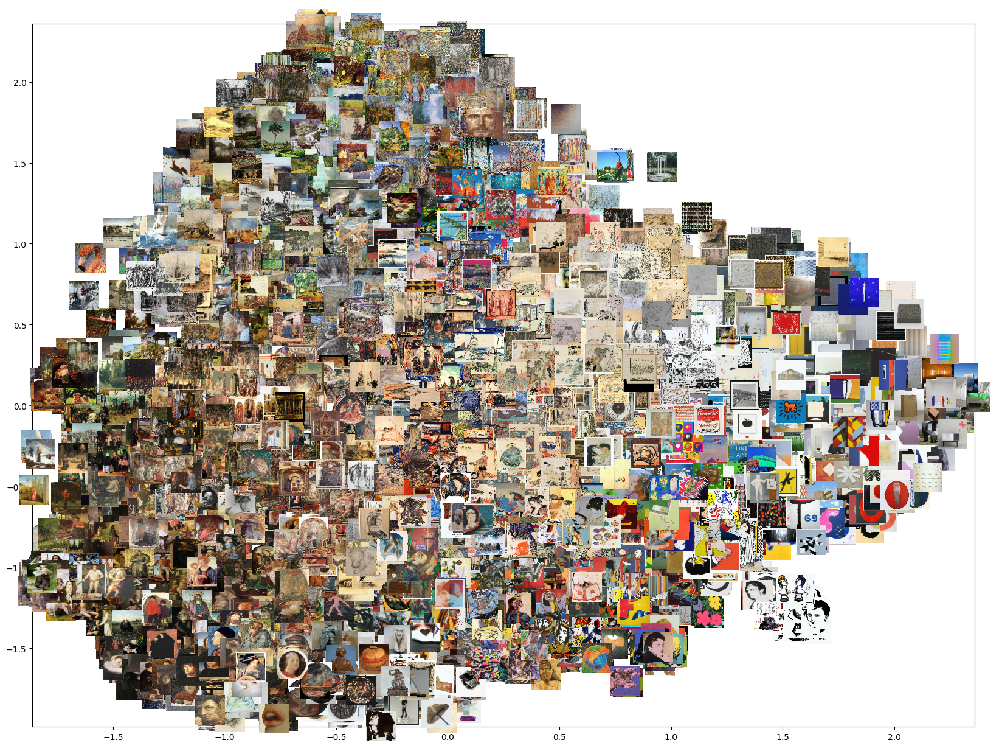

In [ ]:
# читаем изображения
images = []
for image_path in image_paths_train:
  image = cv2.imread(image_path, 3) # загружаем изображение
  b,g,r = cv2.split(image)           # разделяем каналы b, g, r
  image = cv2.merge([r,g,b])         # собираем в r, g, b
  image = cv2.resize(image, (50,50)) # масштаб
  images.append(image)        # добавляем в список


# рисуем
fig, ax = plt.subplots(figsize=(20,15))
artists = []

for xy, i in zip(tsne_result_scaled, images): # перебираем TSNE вектора (это двумерные координаты) и изображения
  x0, y0 = xy # разделяем горизонтальную и вертикальную координату
  img = OffsetImage(i, zoom=.7) # задаем графический объект с картинкой
  ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False) # вставляем эту картинку по координатам из вектора TSNE
  artists.append(ax.add_artist(ab)) # добавляем на график
ax.update_datalim(tsne_result_scaled) # пределы отображения
ax.autoscale(enable=True, axis='both', tight=True) # автомасштаб
plt.show() # отображаем

## Классификатор

In [ ]:
# Преобразование меток классов в числовые значения
label_encoder = LabelEncoder()
labels_train_encoded = label_encoder.fit_transform(labels_train)
labels_test_encoded = label_encoder.transform(labels_test)
labels_val_encoded = label_encoder.transform(labels_val)
# Преобразование меток классов в формат one-hot encoding
num_classes = 10  # Например, у вас 10 классов
y_train = to_categorical(labels_train_encoded, num_classes)
y_test = to_categorical(labels_test_encoded, num_classes)
y_val = to_categorical(labels_val_encoded, num_classes)

In [ ]:
input_shape = (256,)  # Размерность входных данных после PCA для обучающей выборки

inputs = tf.keras.Input(shape=input_shape)

x = layers.Dense(256, activation='relu')(inputs)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

# Компиляция модели
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Определение обратных вызовов
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_model.h5",
        save_best_only=True,
        monitor="val_loss"),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,  # Количество эпох без улучшений до остановки обучения
        restore_best_weights=True)
]

# Обучение модели
history = model.fit(
    pca_result_806, y_train,
    epochs=50,
    batch_size=16,
    validation_data=(pca_result_806_val, y_val),
    callbacks=callbacks)

# Оценка модели на тестовых данных
test_loss, test_accuracy = model.evaluate(pca_result_806_test, y_test)
print(f'Test accuracy: {test_accuracy}')

Epoch 1/50
438/438 [==============================] - 3s 5ms/step - loss: 1.6950 - accuracy: 0.4619 - val_loss: 0.9550 - val_accuracy: 0.6807
Epoch 2/50
438/438 [==============================] - 2s 3ms/step - loss: 0.9971 - accuracy: 0.6631 - val_loss: 0.8130 - val_accuracy: 0.7253
Epoch 3/50
438/438 [==============================] - 2s 5ms/step - loss: 0.8333 - accuracy: 0.7081 - val_loss: 0.7446 - val_accuracy: 0.7453
Epoch 4/50
438/438 [==============================] - 3s 6ms/step - loss: 0.7319 - accuracy: 0.7460 - val_loss: 0.7221 - val_accuracy: 0.7587
Epoch 5/50
438/438 [==============================] - 1s 3ms/step - loss: 0.6333 - accuracy: 0.7840 - val_loss: 0.7103 - val_accuracy: 0.7600
Epoch 6/50
438/438 [==============================] - 1s 3ms/step - loss: 0.5956 - accuracy: 0.7954 - val_loss: 0.6903 - val_accuracy: 0.7773
Epoch 7/50
438/438 [==============================] - 2s 3ms/step - loss: 0.5470 - accuracy: 0.8157 - val_loss: 0.6859 - val_accuracy: 0.7773
Epoch 